# Image Search using Deep Learning (INCEPTIONV3)

### Folder Creation

In [ ]:
!mkdir /temp

### Dataset Download

In [ ]:
!kaggle datasets download -d crawford/cat-dataset

Dataset URL: https://www.kaggle.com/datasets/crawford/cat-dataset
License(s): CC0-1.0
100% 4.02G/4.04G [00:35<00:00, 210MB/s]
100% 4.04G/4.04G [00:35<00:00, 121MB/s]


In [ ]:
!unzip /content/cat-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: cats/CAT_05/00001130_020.jpg  
  inflating: cats/CAT_05/00001130_020.jpg.cat  
  inflating: cats/CAT_05/00001130_023.jpg  
  inflating: cats/CAT_05/00001130_023.jpg.cat  
  inflating: cats/CAT_05/00001130_026.jpg  
  inflating: cats/CAT_05/00001130_026.jpg.cat  
  inflating: cats/CAT_05/00001131_003.jpg  
  inflating: cats/CAT_05/00001131_003.jpg.cat  
  inflating: cats/CAT_05/00001131_026.jpg  
  inflating: cats/CAT_05/00001131_026.jpg.cat  
  inflating: cats/CAT_05/00001132_007.jpg  
  inflating: cats/CAT_05/00001132_007.jpg.cat  
  inflating: cats/CAT_05/00001132_008.jpg  
  inflating: cats/CAT_05/00001132_008.jpg.cat  
  inflating: cats/CAT_05/00001132_014.jpg  
  inflating: cats/CAT_05/00001132_014.jpg.cat  
  inflating: cats/CAT_05/00001132_017.jpg  
  inflating: cats/CAT_05/00001132_017.jpg.cat  
  inflating: cats/CAT_05/00001132_018.jpg  
  inflating: cats/CAT_05/00001132_018.jpg.cat  
  inflating: cats/CAT_05/0000

In [ ]:
import os
import keras
from keras.preprocessing import image
from keras.applications.inception_v3 import decode_predictions, preprocess_input
from keras.models import Model
from keras.layers import GlobalAveragePooling2D

### Loading Pretrained Model

We load the InceptionV3 model pretrained on ImageNet with the top layers included. This model will be used for feature extraction and classification.

In [ ]:
model = keras.applications.inception_v3.InceptionV3(weights='imagenet', include_top=True)

96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 149, 149, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 149, 149, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 149, 149, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 147, 147, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 147, 147, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 147, 147, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 147, 147, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 147, 147, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 147, 147, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 73, 73, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 73, 73, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 73, 73, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 71, 71, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 71, 71, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 23,851,784 (90.99 MB)

 Trainable params: 23,817,352 (90.86 MB)

 Non-trainable params: 34,432 (134.50 KB)

InceptionV3 is set up to take a fixed-size (299 x 299 x 3) RGB image at its input and then forward it through a series of convolutions, Inception modules, and max-pooling layers. Inception modules are a unique component of the architecture, where multiple convolutional filters (1x1, 3x3, 5x5) and pooling operations are performed in parallel within each module, and their outputs are concatenated. The network is finally capped off by global average pooling and a fully-connected layer with 1000 neurons, followed by a softmax classification layer to output class probabilities.

The output shape at each layer has None in the first dimension, indicating that the network can process multiple images in a single batch. For instance, if you forward 5 images with shape [5, 299, 299, 3], the output shape at each layer will have 5 as the first dimension.








### Forwarding an image through the network

In order to input an image into the InceptionV3 network, it must first be pre-processed into a feature vector of the correct size and format. Specifically, the input image should be resized to 299x299 pixels (the expected size for InceptionV3), and it should also be normalized to the format that the pre-trained model expects.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def load_image(path):
    img = image.load_img(path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x

This function loads an image from a file, resizes it to match the InceptionV3 model's input shape of 299x299 pixels, converts it into a NumPy array, and preprocesses it (normalizes pixel values) according to the expected format for the InceptionV3 model.

shape of x:  (1, 299, 299, 3)
data type:  float32


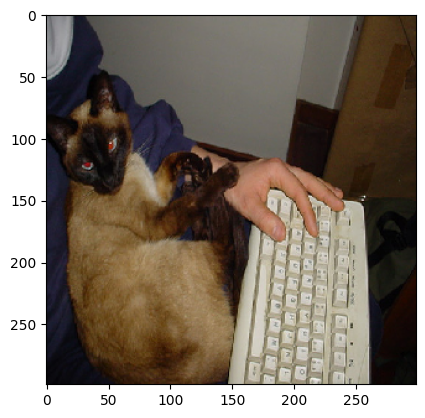

In [ ]:
img, x = load_image("/content/CAT_06/00001498_008.jpg")
print("shape of x: ", x.shape)
print("data type: ", x.dtype)
plt.imshow(img)

`shape of x:  (1, 299, 299, 3)`

The above output tells us that the image has been processed by tensorflow in the batch size of 1, the image size is 299x299 and 3 indicates that it is an RGB image.

### Making Predictions

 We forward `x` through `model` and then use the built-in `decode_predictions` to look up the class names.

In [ ]:
# forward the image through the network
predictions = model.predict(x)

# print out the
for _, pred, prob in decode_predictions(predictions)[0]:
    print("predicted %s with probability %0.3f" % (pred, prob))

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
predicted Siamese_cat with probability 0.487
predicted computer_keyboard with probability 0.222
predicted desktop_computer with probability 0.015
predicted typewriter_keyboard with probability 0.014
predicted mouse with probability 0.007


### Feature Extraction

A new model `feat_extractor` is created that takes the same input as InceptionV3 but outputs features from the `mixed10` layer, which is the second fully connected layer of InceptionV3.

The `mixed10` layer outputs a 4096-dimensional feature vector for each image.

These features represent the content of the image in a compressed and semantically rich form.

In [ ]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("mixed10").output)

# Add GlobalAveragePooling2D layer to pool the extracted features
pooled_output = GlobalAveragePooling2D()(feat_extractor.output)
feat_extractor = Model(inputs=feat_extractor.input, outputs=pooled_output)


Creates a feature extraction model using the InceptionV3 architecture, where the output is taken from the second fully connected layer (mixed10). This layer contains high-level features of the image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


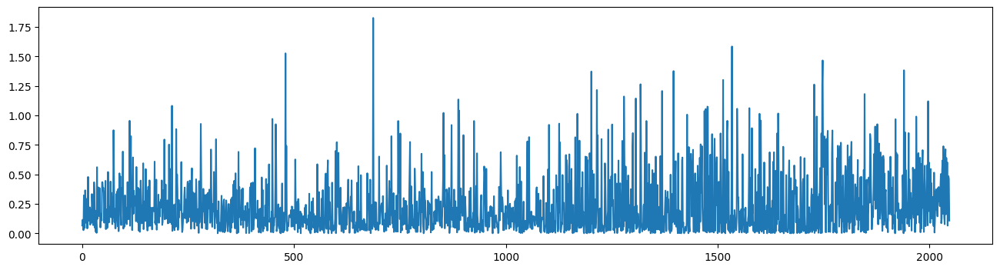

In [ ]:
img, x = load_image("/content/CAT_00/00000001_020.jpg")
feat = feat_extractor.predict(x)

# Plot the extracted features
plt.figure(figsize=(16, 4))
plt.plot(feat[0].reshape(-1))

The `mixed10` activations of two images which have similar content should be very close to each other.

In the next cell, we will open a folder of images for analysis. First, the next cell will just recursively crawl the folder specified by `image_path` looking for images of the extensions inside of `image_extensions` and then limiting them to a random subset of maximum `max_num_images` images just so we can reduce the time taken for feature extraction by limiting the number of input images.

In [ ]:
images_path = '/content/cats'
image_extensions = ['.jpg', '.png', '.jpeg']   # case-insensitive (upper/lower doesn't matter)
max_num_images = 15000

images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(images_path) for f in filenames if os.path.splitext(f)[1].lower() in image_extensions]
if max_num_images < len(images):
    images = [images[i] for i in sorted(random.sample(range(len(images)), max_num_images))]

print("keeping %d images to analyze" % len(images))

keeping 9997 images to analyze


### Extracting Features

Once the model is defined, we pass an image through the network.

The predict function processes the image, and instead of predicting a class label, it gives us a feature vector (`4096 values`) that captures the important characteristics of the image.

For example:

If the input image contains a cat, the feature vector might include representations of textures, shapes, and patterns that are relevant to recognizing a cat.

Each value in the feature vector represents a different aspect of the image, like specific textures, shapes, or patterns that the model considers important based on its training.

In [ ]:
from tqdm import tqdm

features = []
for i, image_path in tqdm(enumerate(images), total=len(images)):
    img, x = load_image(image_path)
    feat = feat_extractor.predict(x)[0]
    features.append(feat)

    if i % 500 == 0 and i != 0:
        print(f"Analyzed {i} / {len(images)} images")

print('Finished extracting features for %d images' % len(images))


  0%|          | 0/9997 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  0%|          | 1/9997 [00:00<31:43,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  0%|          | 2/9997 [00:00<29:14,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  0%|          | 3/9997 [00:00<27:45,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 4/9997 [00:00<28:22,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  0%|          | 5/9997 [00:00<27:31,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 6/9997 [00:00<24:39,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


  0%|          | 7/9997 [00:01<25:26,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 8/9997 [00:01<25:47,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 9/9997 [00:01<26:35,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 10/9997 [00:01<25:39,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  0%|          | 11/9997 [00:01<24:15,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  0%|          | 12/9997 [00:01<22:48,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  0%|          | 13/9997 [00:01<23:41,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


  0%|          | 14/9997 [00:02<26:33,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  0%|          | 15/9997 [00:02<24:46,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 16/9997 [00:02<24:33,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 17/9997 [00:02<23:35,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  0%|          | 18/9997 [00:02<24:24,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 19/9997 [00:02<22:52,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 21/9997 [00:03<18:12,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 23/9997 [00:03<16:41,  9.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 24/9997 [00:03<17:06,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  0%|          | 25/9997 [00:03<17:34,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  0%|          | 27/9997 [00:03<15:17, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 29/9997 [00:03<15:48, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  0%|          | 31/9997 [00:03<15:36, 10.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  0%|          | 33/9997 [00:04<14:45, 11.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 35/9997 [00:04<15:37, 10.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  0%|          | 37/9997 [00:04<14:36, 11.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 39/9997 [00:04<16:03, 10.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 41/9997 [00:04<15:50, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  0%|          | 43/9997 [00:05<16:06, 10.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  0%|          | 45/9997 [00:05<15:40, 10.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  0%|          | 47/9997 [00:05<14:55, 11.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  0%|          | 49/9997 [00:05<15:00, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 51/9997 [00:05<14:45, 11.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 53/9997 [00:05<14:18, 11.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  1%|          | 55/9997 [00:06<15:28, 10.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 57/9997 [00:06<15:47, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  1%|          | 59/9997 [00:06<15:40, 10.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 61/9997 [00:06<14:42, 11.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 63/9997 [00:06<14:19, 11.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 65/9997 [00:07<14:00, 11.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|          | 67/9997 [00:07<15:05, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 69/9997 [00:07<14:22, 11.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 71/9997 [00:07<15:43, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 73/9997 [00:07<15:50, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 75/9997 [00:08<16:51,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 77/9997 [00:08<16:49,  9.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 79/9997 [00:08<16:45,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 81/9997 [00:08<15:32, 10.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  1%|          | 83/9997 [00:08<14:27, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  1%|          | 85/9997 [00:08<14:01, 11.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 87/9997 [00:09<14:27, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 89/9997 [00:09<14:17, 11.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 91/9997 [00:09<14:44, 11.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 93/9997 [00:09<16:09, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  1%|          | 95/9997 [00:09<15:17, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|          | 97/9997 [00:10<15:34, 10.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 99/9997 [00:10<15:16, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|          | 101/9997 [00:10<14:37, 11.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|          | 103/9997 [00:10<15:27, 10.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 105/9997 [00:10<16:30,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 107/9997 [00:11<16:57,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 109/9997 [00:11<17:17,  9.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|          | 111/9997 [00:11<17:06,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 113/9997 [00:11<16:42,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 115/9997 [00:11<15:38, 10.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  1%|          | 117/9997 [00:11<14:51, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 119/9997 [00:12<15:20, 10.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 121/9997 [00:12<15:20, 10.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 123/9997 [00:12<15:31, 10.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|▏         | 125/9997 [00:12<14:32, 11.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  1%|▏         | 127/9997 [00:13<17:55,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  1%|▏         | 128/9997 [00:13<18:48,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|▏         | 129/9997 [00:13<18:26,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  1%|▏         | 130/9997 [00:13<18:03,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|▏         | 131/9997 [00:13<18:57,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  1%|▏         | 133/9997 [00:13<18:43,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  1%|▏         | 135/9997 [00:13<18:41,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  1%|▏         | 136/9997 [00:14<20:08,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  1%|▏         | 137/9997 [00:14<21:24,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  1%|▏         | 138/9997 [00:14<22:10,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  1%|▏         | 139/9997 [00:14<22:57,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|▏         | 140/9997 [00:14<21:19,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|▏         | 141/9997 [00:14<20:21,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  1%|▏         | 142/9997 [00:14<19:52,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  1%|▏         | 143/9997 [00:14<18:56,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  1%|▏         | 144/9997 [00:15<21:35,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  1%|▏         | 145/9997 [00:15<21:15,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  1%|▏         | 146/9997 [00:15<23:47,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  1%|▏         | 147/9997 [00:15<24:22,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  1%|▏         | 148/9997 [00:15<24:47,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  1%|▏         | 149/9997 [00:15<23:29,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  2%|▏         | 150/9997 [00:16<24:35,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  2%|▏         | 151/9997 [00:16<23:50,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 152/9997 [00:16<23:08,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  2%|▏         | 153/9997 [00:16<22:14,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  2%|▏         | 154/9997 [00:16<22:18,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 155/9997 [00:16<22:58,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  2%|▏         | 156/9997 [00:16<24:11,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  2%|▏         | 157/9997 [00:17<23:45,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 158/9997 [00:17<26:27,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 159/9997 [00:17<25:11,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  2%|▏         | 160/9997 [00:17<23:13,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  2%|▏         | 161/9997 [00:17<24:16,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  2%|▏         | 162/9997 [00:17<24:45,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 163/9997 [00:17<25:30,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  2%|▏         | 164/9997 [00:18<24:39,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 166/9997 [00:18<19:32,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 168/9997 [00:18<16:29,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 170/9997 [00:18<16:06, 10.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 172/9997 [00:18<14:51, 11.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 174/9997 [00:18<14:04, 11.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  2%|▏         | 176/9997 [00:19<13:59, 11.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 178/9997 [00:19<16:00, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 180/9997 [00:19<15:03, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 182/9997 [00:19<14:12, 11.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 184/9997 [00:19<14:41, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 186/9997 [00:19<14:03, 11.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 188/9997 [00:20<14:36, 11.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  2%|▏         | 190/9997 [00:20<15:17, 10.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 192/9997 [00:20<15:41, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 194/9997 [00:20<15:50, 10.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 196/9997 [00:21<16:57,  9.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  2%|▏         | 197/9997 [00:21<17:52,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  2%|▏         | 198/9997 [00:21<18:13,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  2%|▏         | 200/9997 [00:21<16:28,  9.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 202/9997 [00:21<15:22, 10.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  2%|▏         | 204/9997 [00:21<14:40, 11.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 206/9997 [00:21<15:07, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  2%|▏         | 208/9997 [00:22<15:40, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  2%|▏         | 210/9997 [00:22<16:12, 10.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 212/9997 [00:22<14:55, 10.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 214/9997 [00:22<16:09, 10.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  2%|▏         | 216/9997 [00:23<17:31,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  2%|▏         | 217/9997 [00:23<18:09,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  2%|▏         | 219/9997 [00:23<17:40,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 220/9997 [00:23<18:04,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 221/9997 [00:23<18:08,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 223/9997 [00:23<17:10,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 225/9997 [00:23<16:41,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 226/9997 [00:24<17:02,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 228/9997 [00:24<15:32, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 230/9997 [00:24<15:46, 10.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  2%|▏         | 232/9997 [00:24<16:01, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 234/9997 [00:24<16:55,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 236/9997 [00:25<16:18,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 238/9997 [00:25<16:19,  9.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 240/9997 [00:25<17:02,  9.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 242/9997 [00:25<15:30, 10.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  2%|▏         | 244/9997 [00:25<16:42,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  2%|▏         | 246/9997 [00:26<17:46,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 247/9997 [00:26<18:03,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  2%|▏         | 249/9997 [00:26<16:31,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 251/9997 [00:26<16:15,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 253/9997 [00:26<15:03, 10.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 255/9997 [00:26<15:31, 10.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  3%|▎         | 257/9997 [00:27<15:57, 10.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  3%|▎         | 259/9997 [00:27<15:06, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 261/9997 [00:27<16:30,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 263/9997 [00:27<16:19,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 265/9997 [00:28<17:19,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  3%|▎         | 266/9997 [00:28<18:48,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 267/9997 [00:28<18:49,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  3%|▎         | 268/9997 [00:28<20:05,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  3%|▎         | 269/9997 [00:28<20:57,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 270/9997 [00:28<21:25,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 271/9997 [00:28<22:12,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 272/9997 [00:28<20:46,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  3%|▎         | 273/9997 [00:29<20:24,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  3%|▎         | 274/9997 [00:29<19:23,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  3%|▎         | 275/9997 [00:29<20:36,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  3%|▎         | 276/9997 [00:29<19:18,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  3%|▎         | 277/9997 [00:29<18:46,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  3%|▎         | 278/9997 [00:29<20:47,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  3%|▎         | 279/9997 [00:29<21:29,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 280/9997 [00:29<20:52,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  3%|▎         | 281/9997 [00:30<20:31,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  3%|▎         | 282/9997 [00:30<19:50,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  3%|▎         | 283/9997 [00:30<19:41,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 284/9997 [00:30<20:17,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 285/9997 [00:30<20:42,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  3%|▎         | 286/9997 [00:30<20:57,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 287/9997 [00:30<20:37,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  3%|▎         | 288/9997 [00:30<20:08,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  3%|▎         | 289/9997 [00:31<22:28,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  3%|▎         | 290/9997 [00:31<23:16,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  3%|▎         | 291/9997 [00:31<23:11,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  3%|▎         | 292/9997 [00:31<23:57,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 293/9997 [00:31<24:36,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 294/9997 [00:31<25:37,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  3%|▎         | 295/9997 [00:32<26:38,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  3%|▎         | 296/9997 [00:32<25:04,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 297/9997 [00:32<23:29,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 298/9997 [00:32<22:15,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  3%|▎         | 299/9997 [00:32<21:30,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  3%|▎         | 300/9997 [00:32<21:02,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 301/9997 [00:32<20:58,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 302/9997 [00:33<20:59,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  3%|▎         | 303/9997 [00:33<20:54,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  3%|▎         | 304/9997 [00:33<21:20,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  3%|▎         | 305/9997 [00:33<20:37,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 306/9997 [00:33<20:55,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 307/9997 [00:33<22:45,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 309/9997 [00:33<19:32,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  3%|▎         | 310/9997 [00:34<19:13,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  3%|▎         | 311/9997 [00:34<19:16,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 313/9997 [00:34<16:27,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 315/9997 [00:34<14:53, 10.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 317/9997 [00:34<15:07, 10.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  3%|▎         | 319/9997 [00:34<14:25, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  3%|▎         | 321/9997 [00:34<14:37, 11.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 323/9997 [00:35<15:18, 10.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 325/9997 [00:35<14:32, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 327/9997 [00:35<13:54, 11.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 329/9997 [00:35<15:22, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 331/9997 [00:35<15:38, 10.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  3%|▎         | 333/9997 [00:36<17:04,  9.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 335/9997 [00:36<15:31, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  3%|▎         | 337/9997 [00:36<15:28, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 339/9997 [00:36<16:34,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 341/9997 [00:36<15:46, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  3%|▎         | 343/9997 [00:37<16:17,  9.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 345/9997 [00:37<16:29,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  3%|▎         | 346/9997 [00:37<17:04,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 348/9997 [00:37<16:42,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 349/9997 [00:37<17:14,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  4%|▎         | 351/9997 [00:37<16:01, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▎         | 352/9997 [00:38<16:59,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  4%|▎         | 353/9997 [00:38<17:57,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 354/9997 [00:38<18:29,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 355/9997 [00:38<18:56,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▎         | 357/9997 [00:38<16:13,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 359/9997 [00:38<14:43, 10.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▎         | 361/9997 [00:38<14:23, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 363/9997 [00:39<15:13, 10.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 365/9997 [00:39<15:16, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▎         | 367/9997 [00:39<14:17, 11.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▎         | 369/9997 [00:39<14:31, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  4%|▎         | 371/9997 [00:39<15:07, 10.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  4%|▎         | 373/9997 [00:40<15:25, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  4%|▍         | 375/9997 [00:40<15:58, 10.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 377/9997 [00:40<14:48, 10.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  4%|▍         | 379/9997 [00:40<15:56, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 381/9997 [00:40<15:50, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 383/9997 [00:41<15:39, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


  4%|▍         | 385/9997 [00:41<14:42, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 387/9997 [00:41<14:12, 11.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 389/9997 [00:41<15:04, 10.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▍         | 391/9997 [00:41<16:27,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  4%|▍         | 393/9997 [00:42<15:30, 10.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 395/9997 [00:42<16:53,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▍         | 396/9997 [00:42<17:16,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 397/9997 [00:42<17:32,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 398/9997 [00:42<18:03,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 399/9997 [00:42<18:22,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 400/9997 [00:42<18:35,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▍         | 401/9997 [00:43<19:25,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▍         | 402/9997 [00:43<19:46,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 403/9997 [00:43<19:28,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 405/9997 [00:43<16:12,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  4%|▍         | 407/9997 [00:43<14:21, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  4%|▍         | 409/9997 [00:43<14:07, 11.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


  4%|▍         | 411/9997 [00:44<17:45,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  4%|▍         | 412/9997 [00:44<18:47,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  4%|▍         | 413/9997 [00:44<18:21,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▍         | 414/9997 [00:44<19:37,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▍         | 415/9997 [00:44<19:05,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  4%|▍         | 417/9997 [00:44<17:32,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  4%|▍         | 418/9997 [00:44<18:57,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  4%|▍         | 419/9997 [00:45<19:15,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 420/9997 [00:45<20:20,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  4%|▍         | 421/9997 [00:45<21:25,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  4%|▍         | 422/9997 [00:45<22:11,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  4%|▍         | 423/9997 [00:45<20:32,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  4%|▍         | 424/9997 [00:45<20:19,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  4%|▍         | 425/9997 [00:45<21:38,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  4%|▍         | 426/9997 [00:45<20:25,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


  4%|▍         | 427/9997 [00:46<20:27,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  4%|▍         | 428/9997 [00:46<21:40,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  4%|▍         | 429/9997 [00:46<21:17,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  4%|▍         | 430/9997 [00:46<20:52,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  4%|▍         | 431/9997 [00:46<21:54,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 432/9997 [00:46<21:03,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  4%|▍         | 433/9997 [00:46<20:44,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 434/9997 [00:47<21:15,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  4%|▍         | 435/9997 [00:47<24:03,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  4%|▍         | 436/9997 [00:47<25:25,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 437/9997 [00:47<25:58,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  4%|▍         | 438/9997 [00:47<24:34,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  4%|▍         | 439/9997 [00:47<24:34,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  4%|▍         | 440/9997 [00:48<24:52,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  4%|▍         | 441/9997 [00:48<23:23,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 442/9997 [00:48<23:42,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  4%|▍         | 443/9997 [00:48<22:46,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  4%|▍         | 444/9997 [00:48<21:34,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 445/9997 [00:48<20:47,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  4%|▍         | 446/9997 [00:48<22:34,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  4%|▍         | 447/9997 [00:49<22:26,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  4%|▍         | 448/9997 [00:49<21:29,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  4%|▍         | 449/9997 [00:49<23:21,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  5%|▍         | 450/9997 [00:49<23:08,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 451/9997 [00:49<22:14,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 452/9997 [00:49<21:09,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  5%|▍         | 453/9997 [00:49<20:24,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▍         | 454/9997 [00:49<20:38,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  5%|▍         | 455/9997 [00:50<21:22,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▍         | 456/9997 [00:50<23:03,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  5%|▍         | 457/9997 [00:50<23:46,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  5%|▍         | 458/9997 [00:50<26:55,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 460/9997 [00:50<19:59,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 462/9997 [00:50<17:09,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 464/9997 [00:51<16:04,  9.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▍         | 466/9997 [00:51<15:00, 10.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 468/9997 [00:51<16:30,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 469/9997 [00:51<16:59,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 470/9997 [00:51<17:42,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 472/9997 [00:51<15:55,  9.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 473/9997 [00:52<16:37,  9.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  5%|▍         | 474/9997 [00:52<17:56,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 475/9997 [00:52<18:12,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  5%|▍         | 476/9997 [00:52<18:30,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 477/9997 [00:52<18:52,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 479/9997 [00:52<16:11,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 480/9997 [00:52<16:57,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 481/9997 [00:52<17:32,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  5%|▍         | 482/9997 [00:53<18:38,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  5%|▍         | 484/9997 [00:53<17:57,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 486/9997 [00:53<17:37,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 487/9997 [00:53<17:51,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 488/9997 [00:53<18:26,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  5%|▍         | 489/9997 [00:53<18:26,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 490/9997 [00:54<18:56,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 492/9997 [00:54<16:51,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  5%|▍         | 494/9997 [00:54<15:40, 10.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  5%|▍         | 495/9997 [00:54<16:46,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 497/9997 [00:54<16:17,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 499/9997 [00:54<14:45, 10.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 501/9997 [00:55<15:52,  9.97it/s]

Analyzed 500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 503/9997 [00:55<17:34,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  5%|▌         | 505/9997 [00:55<16:48,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 507/9997 [00:55<16:20,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 508/9997 [00:55<16:43,  9.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 509/9997 [00:55<17:16,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 511/9997 [00:56<17:18,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 512/9997 [00:56<17:33,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 513/9997 [00:56<17:49,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  5%|▌         | 514/9997 [00:56<18:20,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 516/9997 [00:56<15:53,  9.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 517/9997 [00:56<16:40,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▌         | 518/9997 [00:56<17:40,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 519/9997 [00:57<18:11,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 521/9997 [00:57<16:39,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▌         | 523/9997 [00:57<16:40,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  5%|▌         | 524/9997 [00:57<17:32,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  5%|▌         | 525/9997 [00:57<17:42,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 527/9997 [00:57<16:45,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▌         | 528/9997 [00:58<16:51,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▌         | 529/9997 [00:58<17:47,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 531/9997 [00:58<15:53,  9.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 532/9997 [00:58<16:38,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  5%|▌         | 533/9997 [00:58<17:14,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 534/9997 [00:58<17:35,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 535/9997 [00:58<18:02,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 536/9997 [00:58<18:19,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 537/9997 [00:59<18:49,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  5%|▌         | 538/9997 [00:59<19:24,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 539/9997 [00:59<19:11,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  5%|▌         | 541/9997 [00:59<17:15,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▌         | 542/9997 [00:59<18:32,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  5%|▌         | 543/9997 [00:59<19:54,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▌         | 544/9997 [00:59<20:46,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  5%|▌         | 545/9997 [01:00<20:27,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  5%|▌         | 546/9997 [01:00<20:11,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▌         | 547/9997 [01:00<20:58,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  5%|▌         | 548/9997 [01:00<22:00,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  5%|▌         | 549/9997 [01:00<22:12,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▌         | 550/9997 [01:00<22:05,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▌         | 551/9997 [01:00<20:34,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  6%|▌         | 552/9997 [01:01<20:06,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


  6%|▌         | 553/9997 [01:01<23:04,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▌         | 554/9997 [01:01<30:30,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  6%|▌         | 555/9997 [01:01<36:53,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  6%|▌         | 556/9997 [01:02<40:49,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


  6%|▌         | 557/9997 [01:02<39:46,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


  6%|▌         | 558/9997 [01:02<44:11,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  6%|▌         | 559/9997 [01:03<52:59,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


  6%|▌         | 560/9997 [01:03<53:06,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  6%|▌         | 561/9997 [01:03<55:45,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


  6%|▌         | 562/9997 [01:04<53:32,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  6%|▌         | 563/9997 [01:04<56:11,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  6%|▌         | 564/9997 [01:04<53:37,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  6%|▌         | 565/9997 [01:05<50:31,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


  6%|▌         | 566/9997 [01:05<48:32,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  6%|▌         | 567/9997 [01:05<48:30,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  6%|▌         | 568/9997 [01:06<48:16,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  6%|▌         | 569/9997 [01:06<54:02,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  6%|▌         | 570/9997 [01:06<43:33,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


  6%|▌         | 571/9997 [01:06<40:16,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


  6%|▌         | 572/9997 [01:07<39:54,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


  6%|▌         | 573/9997 [01:07<38:31,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  6%|▌         | 574/9997 [01:07<35:35,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


  6%|▌         | 575/9997 [01:07<33:03,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▌         | 576/9997 [01:07<30:45,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  6%|▌         | 577/9997 [01:08<28:50,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


  6%|▌         | 578/9997 [01:08<30:20,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  6%|▌         | 579/9997 [01:08<30:06,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  6%|▌         | 580/9997 [01:08<29:20,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  6%|▌         | 581/9997 [01:08<30:19,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  6%|▌         | 582/9997 [01:08<29:54,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  6%|▌         | 583/9997 [01:09<29:41,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  6%|▌         | 584/9997 [01:09<27:18,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  6%|▌         | 585/9997 [01:09<28:44,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


  6%|▌         | 586/9997 [01:09<29:44,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


  6%|▌         | 587/9997 [01:09<30:54,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  6%|▌         | 588/9997 [01:10<29:58,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  6%|▌         | 589/9997 [01:10<27:43,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  6%|▌         | 590/9997 [01:10<27:15,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▌         | 591/9997 [01:10<27:31,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


  6%|▌         | 592/9997 [01:10<25:21,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


  6%|▌         | 593/9997 [01:10<29:24,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  6%|▌         | 594/9997 [01:11<29:04,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  6%|▌         | 595/9997 [01:11<32:14,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  6%|▌         | 596/9997 [01:11<29:27,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


  6%|▌         | 597/9997 [01:11<34:38,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


  6%|▌         | 598/9997 [01:12<32:50,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  6%|▌         | 599/9997 [01:12<35:19,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  6%|▌         | 600/9997 [01:12<36:14,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  6%|▌         | 601/9997 [01:12<33:37,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  6%|▌         | 602/9997 [01:12<30:21,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  6%|▌         | 603/9997 [01:13<28:26,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  6%|▌         | 604/9997 [01:13<29:34,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


  6%|▌         | 605/9997 [01:13<28:39,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▌         | 606/9997 [01:13<29:15,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  6%|▌         | 607/9997 [01:13<26:52,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


  6%|▌         | 608/9997 [01:13<28:00,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


  6%|▌         | 609/9997 [01:14<26:27,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  6%|▌         | 610/9997 [01:14<25:14,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  6%|▌         | 611/9997 [01:14<25:09,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


  6%|▌         | 612/9997 [01:14<24:15,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  6%|▌         | 613/9997 [01:14<25:31,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  6%|▌         | 614/9997 [01:14<24:57,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  6%|▌         | 615/9997 [01:15<31:22,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  6%|▌         | 616/9997 [01:15<36:17,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  6%|▌         | 617/9997 [01:15<33:24,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


  6%|▌         | 618/9997 [01:15<30:06,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  6%|▌         | 619/9997 [01:15<28:53,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


  6%|▌         | 620/9997 [01:16<29:13,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  6%|▌         | 621/9997 [01:16<29:20,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


  6%|▌         | 622/9997 [01:16<27:50,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  6%|▌         | 623/9997 [01:16<31:23,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


  6%|▌         | 624/9997 [01:17<38:48,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


  6%|▋         | 625/9997 [01:17<39:59,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


  6%|▋         | 626/9997 [01:17<39:24,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▋         | 627/9997 [01:17<36:52,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


  6%|▋         | 628/9997 [01:18<37:15,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


  6%|▋         | 629/9997 [01:18<38:34,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  6%|▋         | 630/9997 [01:18<34:40,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


  6%|▋         | 631/9997 [01:18<36:36,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


  6%|▋         | 632/9997 [01:18<36:40,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


  6%|▋         | 633/9997 [01:19<34:47,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  6%|▋         | 634/9997 [01:19<34:38,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  6%|▋         | 635/9997 [01:19<34:11,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


  6%|▋         | 636/9997 [01:19<36:43,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▋         | 637/9997 [01:20<39:00,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


  6%|▋         | 638/9997 [01:20<43:01,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  6%|▋         | 639/9997 [01:20<45:11,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  6%|▋         | 640/9997 [01:21<50:02,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  6%|▋         | 641/9997 [01:21<55:58,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  6%|▋         | 642/9997 [01:22<58:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  6%|▋         | 643/9997 [01:22<56:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


  6%|▋         | 644/9997 [01:22<54:13,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


  6%|▋         | 645/9997 [01:22<47:18,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


  6%|▋         | 646/9997 [01:23<45:11,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


  6%|▋         | 647/9997 [01:23<45:16,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  6%|▋         | 648/9997 [01:23<47:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▋         | 649/9997 [01:24<42:59,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  7%|▋         | 650/9997 [01:24<40:20,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 651/9997 [01:24<34:36,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  7%|▋         | 652/9997 [01:24<31:30,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  7%|▋         | 653/9997 [01:24<28:04,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  7%|▋         | 654/9997 [01:24<25:00,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


  7%|▋         | 655/9997 [01:24<24:41,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  7%|▋         | 656/9997 [01:25<23:56,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  7%|▋         | 657/9997 [01:25<26:08,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 658/9997 [01:25<23:09,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 660/9997 [01:25<20:03,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


  7%|▋         | 661/9997 [01:25<26:42,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  7%|▋         | 662/9997 [01:26<32:21,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 663/9997 [01:26<31:28,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 664/9997 [01:26<28:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 665/9997 [01:26<25:26,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 666/9997 [01:26<23:20,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 667/9997 [01:26<21:55,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 669/9997 [01:27<19:19,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 671/9997 [01:27<18:03,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 673/9997 [01:27<16:55,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 674/9997 [01:27<17:20,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 675/9997 [01:27<17:44,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 676/9997 [01:27<18:13,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 678/9997 [01:28<15:58,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 679/9997 [01:28<17:09,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 680/9997 [01:28<17:30,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 682/9997 [01:28<17:23,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 683/9997 [01:28<17:38,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 684/9997 [01:28<17:45,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 685/9997 [01:28<18:03,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 686/9997 [01:28<18:31,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  7%|▋         | 688/9997 [01:29<16:54,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 689/9997 [01:29<17:59,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 690/9997 [01:29<17:28,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 692/9997 [01:29<15:26, 10.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  7%|▋         | 694/9997 [01:29<15:21, 10.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 696/9997 [01:29<15:10, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  7%|▋         | 698/9997 [01:30<16:31,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 699/9997 [01:30<17:05,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 700/9997 [01:30<17:52,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 701/9997 [01:30<18:19,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 703/9997 [01:30<17:17,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 704/9997 [01:30<17:33,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 705/9997 [01:31<18:00,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  7%|▋         | 706/9997 [01:31<18:36,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 707/9997 [01:31<18:40,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 709/9997 [01:31<17:33,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 710/9997 [01:31<18:19,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 711/9997 [01:31<18:20,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 712/9997 [01:31<18:26,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  7%|▋         | 714/9997 [01:32<17:43,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 716/9997 [01:32<17:06,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 718/9997 [01:32<17:04,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  7%|▋         | 719/9997 [01:32<17:25,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 720/9997 [01:32<17:38,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 721/9997 [01:32<17:58,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 722/9997 [01:33<18:16,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  7%|▋         | 723/9997 [01:33<19:08,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 724/9997 [01:33<18:58,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 725/9997 [01:33<18:52,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 727/9997 [01:33<17:53,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 729/9997 [01:33<15:57,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  7%|▋         | 730/9997 [01:33<17:40,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 731/9997 [01:34<18:56,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 732/9997 [01:34<20:06,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 733/9997 [01:34<18:59,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 734/9997 [01:34<21:03,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  7%|▋         | 735/9997 [01:34<21:33,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 736/9997 [01:34<19:56,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  7%|▋         | 737/9997 [01:34<20:21,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  7%|▋         | 738/9997 [01:35<19:36,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  7%|▋         | 739/9997 [01:35<19:21,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 740/9997 [01:35<21:07,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 741/9997 [01:35<19:45,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  7%|▋         | 742/9997 [01:35<20:36,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 743/9997 [01:35<19:15,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 744/9997 [01:35<19:58,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  7%|▋         | 745/9997 [01:35<20:20,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 746/9997 [01:36<19:33,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  7%|▋         | 747/9997 [01:36<20:17,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 748/9997 [01:36<20:01,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  7%|▋         | 749/9997 [01:36<20:52,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  8%|▊         | 750/9997 [01:36<22:09,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  8%|▊         | 751/9997 [01:36<23:22,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 752/9997 [01:36<22:27,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


  8%|▊         | 753/9997 [01:37<24:23,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  8%|▊         | 754/9997 [01:37<23:00,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  8%|▊         | 755/9997 [01:37<23:40,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  8%|▊         | 756/9997 [01:37<22:30,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 757/9997 [01:37<21:04,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  8%|▊         | 758/9997 [01:37<23:27,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  8%|▊         | 759/9997 [01:38<23:42,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


  8%|▊         | 760/9997 [01:38<23:16,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  8%|▊         | 761/9997 [01:38<22:32,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  8%|▊         | 762/9997 [01:38<22:12,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  8%|▊         | 763/9997 [01:38<23:43,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 764/9997 [01:38<23:40,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  8%|▊         | 765/9997 [01:38<22:35,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  8%|▊         | 766/9997 [01:39<22:38,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  8%|▊         | 767/9997 [01:39<23:13,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 768/9997 [01:39<24:12,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


  8%|▊         | 769/9997 [01:39<25:06,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  8%|▊         | 770/9997 [01:39<24:40,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  8%|▊         | 771/9997 [01:39<25:25,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 772/9997 [01:39<22:58,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  8%|▊         | 773/9997 [01:40<21:57,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 774/9997 [01:40<21:18,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 775/9997 [01:40<20:36,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 776/9997 [01:40<19:59,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 777/9997 [01:40<19:44,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 778/9997 [01:40<19:13,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 779/9997 [01:40<19:29,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 780/9997 [01:40<19:12,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 781/9997 [01:41<18:55,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  8%|▊         | 782/9997 [01:41<19:35,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 783/9997 [01:41<19:14,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 785/9997 [01:41<18:09,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 787/9997 [01:41<16:22,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 788/9997 [01:41<18:05,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 789/9997 [01:42<18:17,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  8%|▊         | 790/9997 [01:42<18:48,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 791/9997 [01:42<18:39,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 792/9997 [01:42<18:42,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 794/9997 [01:42<17:23,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 796/9997 [01:42<15:28,  9.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 797/9997 [01:42<16:48,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  8%|▊         | 799/9997 [01:43<15:10, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  8%|▊         | 800/9997 [01:43<16:50,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 801/9997 [01:43<17:22,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 802/9997 [01:43<17:36,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 804/9997 [01:43<15:12, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 805/9997 [01:43<15:52,  9.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 806/9997 [01:43<16:35,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  8%|▊         | 808/9997 [01:44<17:10,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 810/9997 [01:44<16:38,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 811/9997 [01:44<17:07,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 812/9997 [01:44<17:22,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 814/9997 [01:44<16:35,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 816/9997 [01:44<16:35,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 817/9997 [01:45<16:53,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  8%|▊         | 818/9997 [01:45<17:55,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 819/9997 [01:45<18:11,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 821/9997 [01:45<17:00,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 822/9997 [01:45<17:13,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 823/9997 [01:45<17:44,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 825/9997 [01:46<16:59,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 826/9997 [01:46<17:20,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 828/9997 [01:46<15:45,  9.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 830/9997 [01:46<15:59,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 832/9997 [01:46<15:11, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 833/9997 [01:46<16:05,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  8%|▊         | 834/9997 [01:46<16:52,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  8%|▊         | 836/9997 [01:47<16:44,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 837/9997 [01:47<17:06,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 838/9997 [01:47<17:27,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 840/9997 [01:47<16:28,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  8%|▊         | 841/9997 [01:47<16:46,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 842/9997 [01:47<17:27,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 843/9997 [01:47<17:50,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  8%|▊         | 844/9997 [01:48<18:29,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 845/9997 [01:48<18:57,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 846/9997 [01:48<18:56,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 847/9997 [01:48<18:52,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 848/9997 [01:48<19:01,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 849/9997 [01:48<18:48,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▊         | 851/9997 [01:48<17:28,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 852/9997 [01:49<18:09,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 853/9997 [01:49<18:25,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▊         | 855/9997 [01:49<17:40,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▊         | 856/9997 [01:49<18:01,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▊         | 858/9997 [01:49<17:04,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▊         | 859/9997 [01:49<17:38,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▊         | 860/9997 [01:50<18:46,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  9%|▊         | 861/9997 [01:50<20:41,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  9%|▊         | 862/9997 [01:50<21:00,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  9%|▊         | 863/9997 [01:50<21:00,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  9%|▊         | 864/9997 [01:50<19:45,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  9%|▊         | 865/9997 [01:50<20:36,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▊         | 866/9997 [01:50<19:43,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  9%|▊         | 867/9997 [01:50<19:08,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  9%|▊         | 868/9997 [01:51<21:53,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▊         | 869/9997 [01:51<22:25,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  9%|▊         | 870/9997 [01:51<22:26,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▊         | 871/9997 [01:51<21:59,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  9%|▊         | 872/9997 [01:51<22:54,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▊         | 873/9997 [01:51<22:48,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▊         | 874/9997 [01:52<22:47,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▉         | 875/9997 [01:52<24:28,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  9%|▉         | 876/9997 [01:52<22:11,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  9%|▉         | 877/9997 [01:52<20:52,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▉         | 878/9997 [01:52<20:36,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  9%|▉         | 879/9997 [01:52<21:37,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  9%|▉         | 880/9997 [01:52<21:58,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


  9%|▉         | 881/9997 [01:53<23:52,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


  9%|▉         | 882/9997 [01:53<24:51,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  9%|▉         | 883/9997 [01:53<25:12,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  9%|▉         | 884/9997 [01:53<23:53,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▉         | 885/9997 [01:53<24:38,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  9%|▉         | 886/9997 [01:53<24:13,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  9%|▉         | 887/9997 [01:54<24:15,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  9%|▉         | 888/9997 [01:54<24:19,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▉         | 889/9997 [01:54<24:55,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


  9%|▉         | 890/9997 [01:54<26:12,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  9%|▉         | 891/9997 [01:54<24:30,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  9%|▉         | 892/9997 [01:54<24:06,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  9%|▉         | 893/9997 [01:55<23:28,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  9%|▉         | 894/9997 [01:55<24:49,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  9%|▉         | 895/9997 [01:55<25:36,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  9%|▉         | 896/9997 [01:55<24:38,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▉         | 897/9997 [01:55<25:23,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  9%|▉         | 898/9997 [01:55<24:59,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  9%|▉         | 899/9997 [01:56<25:09,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 900/9997 [01:56<23:38,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 901/9997 [01:56<21:47,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 902/9997 [01:56<21:22,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 904/9997 [01:56<18:38,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▉         | 905/9997 [01:56<18:37,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 906/9997 [01:56<18:56,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 908/9997 [01:57<17:06,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 910/9997 [01:57<15:35,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▉         | 911/9997 [01:57<16:31,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  9%|▉         | 913/9997 [01:57<16:23,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▉         | 914/9997 [01:57<16:12,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▉         | 915/9997 [01:57<16:50,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 917/9997 [01:58<15:01, 10.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  9%|▉         | 918/9997 [01:58<16:15,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 920/9997 [01:58<16:09,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 921/9997 [01:58<16:35,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 923/9997 [01:58<15:24,  9.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 924/9997 [01:58<16:09,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 926/9997 [01:58<15:52,  9.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  9%|▉         | 927/9997 [01:59<16:21,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▉         | 929/9997 [01:59<16:05,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  9%|▉         | 931/9997 [01:59<16:10,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 932/9997 [01:59<16:54,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 934/9997 [01:59<15:34,  9.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 936/9997 [01:59<14:22, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  9%|▉         | 938/9997 [02:00<15:20,  9.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 939/9997 [02:00<16:17,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▉         | 940/9997 [02:00<16:49,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 942/9997 [02:00<16:30,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 944/9997 [02:00<16:02,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 945/9997 [02:01<16:21,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  9%|▉         | 946/9997 [02:01<17:05,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 947/9997 [02:01<17:17,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 949/9997 [02:01<15:33,  9.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|▉         | 950/9997 [02:01<16:24,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 10%|▉         | 951/9997 [02:01<17:00,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 952/9997 [02:01<17:34,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 953/9997 [02:01<17:43,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|▉         | 955/9997 [02:02<16:53,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|▉         | 956/9997 [02:02<17:15,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|▉         | 957/9997 [02:02<17:47,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 958/9997 [02:02<17:54,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 960/9997 [02:02<17:04,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 10%|▉         | 961/9997 [02:02<17:12,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 10%|▉         | 962/9997 [02:02<17:47,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 10%|▉         | 964/9997 [02:03<17:04,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|▉         | 966/9997 [02:03<16:55,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 10%|▉         | 967/9997 [02:03<17:18,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 969/9997 [02:03<16:41,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 970/9997 [02:03<16:53,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|▉         | 971/9997 [02:03<17:19,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 10%|▉         | 973/9997 [02:04<16:59,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|▉         | 974/9997 [02:04<17:37,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 975/9997 [02:04<17:44,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 10%|▉         | 977/9997 [02:04<16:49,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 979/9997 [02:04<15:14,  9.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 10%|▉         | 981/9997 [02:05<14:29, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|▉         | 983/9997 [02:05<14:50, 10.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|▉         | 985/9997 [02:05<14:19, 10.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 987/9997 [02:05<14:37, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 10%|▉         | 989/9997 [02:05<15:49,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 990/9997 [02:05<16:15,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 991/9997 [02:06<16:37,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|▉         | 992/9997 [02:06<17:25,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|▉         | 993/9997 [02:06<17:31,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 10%|▉         | 994/9997 [02:06<17:41,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 10%|▉         | 995/9997 [02:06<17:34,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 10%|▉         | 996/9997 [02:06<17:51,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|▉         | 997/9997 [02:06<19:09,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 10%|▉         | 998/9997 [02:06<18:47,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|▉         | 999/9997 [02:07<19:57,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 10%|█         | 1000/9997 [02:07<19:30,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 10%|█         | 1001/9997 [02:07<19:10,  7.82it/s]

Analyzed 1000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 10%|█         | 1002/9997 [02:07<20:09,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 10%|█         | 1003/9997 [02:07<21:11,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 10%|█         | 1004/9997 [02:07<22:06,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 10%|█         | 1005/9997 [02:07<20:55,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 10%|█         | 1006/9997 [02:08<20:52,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|█         | 1007/9997 [02:08<21:32,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 10%|█         | 1008/9997 [02:08<21:32,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 10%|█         | 1009/9997 [02:08<21:25,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 10%|█         | 1010/9997 [02:08<21:54,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 10%|█         | 1011/9997 [02:08<21:59,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|█         | 1012/9997 [02:08<21:27,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 10%|█         | 1013/9997 [02:09<21:19,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 10%|█         | 1014/9997 [02:09<21:39,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1015/9997 [02:09<22:26,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 10%|█         | 1016/9997 [02:09<21:34,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|█         | 1017/9997 [02:09<21:00,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 10%|█         | 1018/9997 [02:09<19:49,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1019/9997 [02:09<20:14,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 10%|█         | 1020/9997 [02:10<22:25,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 10%|█         | 1021/9997 [02:10<23:12,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 10%|█         | 1022/9997 [02:10<23:27,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1023/9997 [02:10<23:56,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 10%|█         | 1024/9997 [02:10<23:48,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1025/9997 [02:10<22:32,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1026/9997 [02:11<23:25,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|█         | 1027/9997 [02:11<22:00,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 10%|█         | 1028/9997 [02:11<21:46,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 10%|█         | 1029/9997 [02:11<21:43,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|█         | 1030/9997 [02:11<23:31,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 10%|█         | 1031/9997 [02:11<22:28,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 10%|█         | 1032/9997 [02:12<25:00,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 10%|█         | 1033/9997 [02:12<24:49,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 10%|█         | 1034/9997 [02:12<24:00,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|█         | 1035/9997 [02:12<22:29,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|█         | 1036/9997 [02:12<21:22,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|█         | 1037/9997 [02:12<21:45,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1039/9997 [02:12<17:35,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1040/9997 [02:13<17:43,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|█         | 1041/9997 [02:13<18:38,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1043/9997 [02:13<16:04,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|█         | 1045/9997 [02:13<16:06,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1046/9997 [02:13<16:35,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1047/9997 [02:13<16:54,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1049/9997 [02:14<16:37,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 11%|█         | 1050/9997 [02:14<17:19,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1051/9997 [02:14<18:03,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1052/9997 [02:14<18:27,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1054/9997 [02:14<15:32,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 11%|█         | 1055/9997 [02:14<16:08,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1056/9997 [02:14<16:40,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 11%|█         | 1057/9997 [02:14<16:48,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1058/9997 [02:15<17:11,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 11%|█         | 1059/9997 [02:15<18:20,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1060/9997 [02:15<18:41,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1061/9997 [02:15<18:45,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 11%|█         | 1062/9997 [02:15<18:46,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1064/9997 [02:15<17:23,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1065/9997 [02:15<17:33,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 11%|█         | 1067/9997 [02:16<15:31,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1068/9997 [02:16<16:30,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1070/9997 [02:16<16:27,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1071/9997 [02:16<16:52,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1073/9997 [02:16<16:25,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1074/9997 [02:16<16:54,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 11%|█         | 1076/9997 [02:17<15:45,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 11%|█         | 1077/9997 [02:17<15:54,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 11%|█         | 1078/9997 [02:17<16:43,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1080/9997 [02:17<16:10,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1081/9997 [02:17<16:46,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1082/9997 [02:17<17:19,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1084/9997 [02:17<15:51,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 11%|█         | 1085/9997 [02:18<16:44,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 11%|█         | 1086/9997 [02:18<17:34,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 11%|█         | 1087/9997 [02:18<18:12,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1088/9997 [02:18<18:20,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1089/9997 [02:18<18:19,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1090/9997 [02:18<18:05,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1091/9997 [02:18<17:59,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1092/9997 [02:18<17:51,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1093/9997 [02:19<17:52,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1094/9997 [02:19<18:29,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1096/9997 [02:19<16:23,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1097/9997 [02:19<16:03,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1098/9997 [02:19<16:53,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1099/9997 [02:19<17:15,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1100/9997 [02:19<17:54,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1101/9997 [02:20<17:53,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█         | 1102/9997 [02:20<18:30,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1103/9997 [02:20<18:15,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1104/9997 [02:20<18:03,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1106/9997 [02:20<16:48,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1107/9997 [02:20<17:05,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1109/9997 [02:20<16:42,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1110/9997 [02:21<17:04,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 11%|█         | 1111/9997 [02:21<17:45,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1113/9997 [02:21<16:57,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1114/9997 [02:21<17:22,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1115/9997 [02:21<17:36,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1117/9997 [02:21<16:42,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1119/9997 [02:22<16:22,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1121/9997 [02:22<16:13,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 11%|█         | 1122/9997 [02:22<16:36,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1123/9997 [02:22<16:54,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1124/9997 [02:22<17:02,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1125/9997 [02:22<18:07,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█▏        | 1126/9997 [02:22<17:26,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 11%|█▏        | 1127/9997 [02:23<18:47,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 11%|█▏        | 1128/9997 [02:23<20:16,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█▏        | 1129/9997 [02:23<19:39,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█▏        | 1130/9997 [02:23<21:44,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█▏        | 1131/9997 [02:23<21:51,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 11%|█▏        | 1132/9997 [02:23<22:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 11%|█▏        | 1133/9997 [02:23<20:33,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1134/9997 [02:24<19:43,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 11%|█▏        | 1135/9997 [02:24<19:19,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1136/9997 [02:24<18:55,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 11%|█▏        | 1137/9997 [02:24<19:48,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1138/9997 [02:24<19:18,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 11%|█▏        | 1139/9997 [02:24<20:02,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 11%|█▏        | 1140/9997 [02:24<19:13,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█▏        | 1141/9997 [02:25<20:10,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 11%|█▏        | 1142/9997 [02:25<20:05,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 11%|█▏        | 1143/9997 [02:25<22:25,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 11%|█▏        | 1144/9997 [02:25<22:12,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 11%|█▏        | 1145/9997 [02:25<21:37,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 11%|█▏        | 1146/9997 [02:25<21:02,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1147/9997 [02:25<22:37,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 11%|█▏        | 1148/9997 [02:26<23:04,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1149/9997 [02:26<21:28,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 12%|█▏        | 1150/9997 [02:26<22:07,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 12%|█▏        | 1151/9997 [02:26<23:21,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 12%|█▏        | 1152/9997 [02:26<23:42,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 12%|█▏        | 1153/9997 [02:26<24:36,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 12%|█▏        | 1154/9997 [02:27<22:56,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 12%|█▏        | 1155/9997 [02:27<23:47,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 12%|█▏        | 1156/9997 [02:27<25:50,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 12%|█▏        | 1157/9997 [02:27<26:16,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 12%|█▏        | 1158/9997 [02:27<25:18,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 12%|█▏        | 1159/9997 [02:27<24:41,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 12%|█▏        | 1160/9997 [02:28<22:23,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 12%|█▏        | 1161/9997 [02:28<23:28,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 12%|█▏        | 1162/9997 [02:28<25:43,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 12%|█▏        | 1163/9997 [02:28<24:46,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 12%|█▏        | 1164/9997 [02:28<25:07,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 12%|█▏        | 1165/9997 [02:28<24:14,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1167/9997 [02:29<20:05,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1168/9997 [02:29<19:42,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 12%|█▏        | 1169/9997 [02:29<19:39,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1170/9997 [02:29<19:11,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1171/9997 [02:29<18:44,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1173/9997 [02:29<17:22,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1174/9997 [02:29<17:39,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1175/9997 [02:30<18:03,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 12%|█▏        | 1176/9997 [02:30<20:17,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 12%|█▏        | 1177/9997 [02:30<25:33,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 12%|█▏        | 1178/9997 [02:30<28:12,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 12%|█▏        | 1179/9997 [02:30<28:56,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 12%|█▏        | 1180/9997 [02:31<26:25,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1181/9997 [02:31<24:09,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1182/9997 [02:31<22:50,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


 12%|█▏        | 1183/9997 [02:31<29:09,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 12%|█▏        | 1184/9997 [02:31<33:14,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1185/9997 [02:32<31:52,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1186/9997 [02:32<28:13,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1187/9997 [02:32<25:11,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1188/9997 [02:32<22:56,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


 12%|█▏        | 1189/9997 [02:32<23:52,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 12%|█▏        | 1190/9997 [02:33<31:43,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 12%|█▏        | 1191/9997 [02:33<32:19,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1192/9997 [02:33<30:46,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1193/9997 [02:33<26:58,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1194/9997 [02:33<24:29,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1196/9997 [02:33<19:16,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1198/9997 [02:34<16:52,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1200/9997 [02:34<16:45,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1201/9997 [02:34<17:10,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1203/9997 [02:34<15:35,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1205/9997 [02:34<14:40,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 12%|█▏        | 1206/9997 [02:34<16:00,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1207/9997 [02:35<16:20,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 12%|█▏        | 1208/9997 [02:35<16:02,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1209/9997 [02:35<15:58,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1210/9997 [02:35<16:36,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1211/9997 [02:35<16:51,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1212/9997 [02:35<17:13,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1214/9997 [02:35<16:54,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1215/9997 [02:35<17:13,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 12%|█▏        | 1217/9997 [02:36<17:06,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1219/9997 [02:36<15:37,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1221/9997 [02:36<15:36,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1222/9997 [02:36<15:55,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1224/9997 [02:36<15:38,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1225/9997 [02:37<16:09,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1226/9997 [02:37<17:45,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1227/9997 [02:37<17:51,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1228/9997 [02:37<17:58,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 12%|█▏        | 1229/9997 [02:37<18:25,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1230/9997 [02:37<18:13,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1231/9997 [02:37<18:30,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1233/9997 [02:38<15:48,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 12%|█▏        | 1234/9997 [02:38<16:49,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1236/9997 [02:38<16:25,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1238/9997 [02:38<16:03,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1240/9997 [02:38<15:34,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1241/9997 [02:38<16:02,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 12%|█▏        | 1242/9997 [02:39<17:11,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 12%|█▏        | 1243/9997 [02:39<18:21,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 12%|█▏        | 1244/9997 [02:39<18:20,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 12%|█▏        | 1245/9997 [02:39<18:49,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 12%|█▏        | 1246/9997 [02:39<20:18,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 12%|█▏        | 1247/9997 [02:39<19:25,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 12%|█▏        | 1248/9997 [02:39<20:19,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 12%|█▏        | 1249/9997 [02:40<19:35,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 13%|█▎        | 1250/9997 [02:40<21:25,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 13%|█▎        | 1251/9997 [02:40<21:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1252/9997 [02:40<21:50,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1253/9997 [02:40<20:27,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1254/9997 [02:40<21:31,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 13%|█▎        | 1255/9997 [02:40<21:08,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 13%|█▎        | 1256/9997 [02:41<21:46,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1257/9997 [02:41<21:40,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 13%|█▎        | 1258/9997 [02:41<22:06,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 13%|█▎        | 1259/9997 [02:41<21:39,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1260/9997 [02:41<20:56,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 13%|█▎        | 1261/9997 [02:41<21:38,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1262/9997 [02:42<23:10,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 13%|█▎        | 1263/9997 [02:42<23:37,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 13%|█▎        | 1264/9997 [02:42<26:01,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 13%|█▎        | 1265/9997 [02:42<27:13,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 13%|█▎        | 1266/9997 [02:42<25:04,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 13%|█▎        | 1267/9997 [02:42<24:50,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 13%|█▎        | 1268/9997 [02:43<23:50,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 13%|█▎        | 1269/9997 [02:43<23:44,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 13%|█▎        | 1270/9997 [02:43<24:24,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1271/9997 [02:43<23:11,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1272/9997 [02:43<22:57,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 13%|█▎        | 1273/9997 [02:43<21:20,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1274/9997 [02:43<21:57,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 13%|█▎        | 1275/9997 [02:44<23:59,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 13%|█▎        | 1276/9997 [02:44<23:43,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 13%|█▎        | 1277/9997 [02:44<25:28,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 13%|█▎        | 1278/9997 [02:44<25:39,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 13%|█▎        | 1279/9997 [02:44<25:10,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 13%|█▎        | 1280/9997 [02:45<23:55,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 13%|█▎        | 1281/9997 [02:45<23:16,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1282/9997 [02:45<23:56,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1283/9997 [02:45<24:14,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1284/9997 [02:45<21:43,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1285/9997 [02:45<20:40,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1286/9997 [02:45<20:50,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1287/9997 [02:46<20:18,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1288/9997 [02:46<20:31,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1289/9997 [02:46<19:46,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1290/9997 [02:46<19:25,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 13%|█▎        | 1292/9997 [02:46<17:27,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1293/9997 [02:46<17:36,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1294/9997 [02:46<17:57,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1295/9997 [02:47<17:58,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1297/9997 [02:47<16:59,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1299/9997 [02:47<16:54,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 13%|█▎        | 1300/9997 [02:47<17:12,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1301/9997 [02:47<17:42,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 13%|█▎        | 1302/9997 [02:47<18:05,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1304/9997 [02:48<16:00,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 13%|█▎        | 1305/9997 [02:48<17:00,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 13%|█▎        | 1306/9997 [02:48<17:09,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1308/9997 [02:48<16:34,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1309/9997 [02:48<16:59,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 13%|█▎        | 1310/9997 [02:48<17:52,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1311/9997 [02:48<18:07,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 13%|█▎        | 1313/9997 [02:49<17:27,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1314/9997 [02:49<17:37,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1315/9997 [02:49<17:41,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1316/9997 [02:49<17:58,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1317/9997 [02:49<17:49,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 13%|█▎        | 1318/9997 [02:49<17:37,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1319/9997 [02:49<17:47,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1320/9997 [02:50<18:10,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1321/9997 [02:50<18:42,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1322/9997 [02:50<19:06,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 13%|█▎        | 1323/9997 [02:50<19:06,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1324/9997 [02:50<19:12,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1325/9997 [02:50<18:58,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1327/9997 [02:50<18:15,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1328/9997 [02:51<18:29,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1329/9997 [02:51<19:32,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1330/9997 [02:51<18:13,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1331/9997 [02:51<18:54,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1332/9997 [02:51<19:16,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 13%|█▎        | 1333/9997 [02:51<18:56,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 13%|█▎        | 1334/9997 [02:51<18:01,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1336/9997 [02:52<17:30,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1337/9997 [02:52<17:11,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 13%|█▎        | 1338/9997 [02:52<18:12,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1339/9997 [02:52<18:24,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1341/9997 [02:52<15:51,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 13%|█▎        | 1342/9997 [02:52<16:54,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1343/9997 [02:52<17:11,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1344/9997 [02:53<17:34,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1346/9997 [02:53<16:09,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1347/9997 [02:53<15:46,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 13%|█▎        | 1348/9997 [02:53<16:42,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1349/9997 [02:53<17:24,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 14%|█▎        | 1350/9997 [02:53<17:41,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▎        | 1351/9997 [02:53<18:17,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1353/9997 [02:54<16:54,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1354/9997 [02:54<17:31,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1355/9997 [02:54<17:46,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1356/9997 [02:54<17:51,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1357/9997 [02:54<18:08,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 14%|█▎        | 1358/9997 [02:54<18:29,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 14%|█▎        | 1359/9997 [02:54<17:24,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 14%|█▎        | 1360/9997 [02:54<18:39,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 14%|█▎        | 1361/9997 [02:55<19:00,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1363/9997 [02:55<17:59,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1364/9997 [02:55<18:22,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1365/9997 [02:55<18:11,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▎        | 1366/9997 [02:55<19:08,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 14%|█▎        | 1367/9997 [02:55<18:59,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▎        | 1368/9997 [02:56<18:29,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 14%|█▎        | 1369/9997 [02:56<18:46,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 14%|█▎        | 1370/9997 [02:56<21:24,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▎        | 1371/9997 [02:56<21:58,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▎        | 1372/9997 [02:56<21:40,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 14%|█▎        | 1373/9997 [02:56<19:59,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 14%|█▎        | 1374/9997 [02:56<21:05,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 14%|█▍        | 1375/9997 [02:57<20:34,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 14%|█▍        | 1376/9997 [02:57<20:10,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 14%|█▍        | 1377/9997 [02:57<21:08,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1378/9997 [02:57<20:27,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 14%|█▍        | 1379/9997 [02:57<21:55,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 14%|█▍        | 1380/9997 [02:57<22:05,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 14%|█▍        | 1381/9997 [02:58<23:10,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1382/9997 [02:58<24:01,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1383/9997 [02:58<22:22,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 14%|█▍        | 1384/9997 [02:58<23:08,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 14%|█▍        | 1385/9997 [02:58<22:22,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1386/9997 [02:58<22:16,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 14%|█▍        | 1387/9997 [02:58<22:59,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 14%|█▍        | 1388/9997 [02:59<25:19,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 14%|█▍        | 1389/9997 [02:59<23:36,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1390/9997 [02:59<24:20,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 14%|█▍        | 1391/9997 [02:59<22:20,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1392/9997 [02:59<21:07,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1393/9997 [02:59<21:30,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1394/9997 [03:00<22:58,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 14%|█▍        | 1395/9997 [03:00<26:34,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1396/9997 [03:00<23:41,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 14%|█▍        | 1397/9997 [03:00<22:28,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1398/9997 [03:00<22:29,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 14%|█▍        | 1399/9997 [03:00<22:24,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1400/9997 [03:01<22:41,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1401/9997 [03:01<23:39,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 14%|█▍        | 1402/9997 [03:01<25:16,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1403/9997 [03:01<24:47,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 14%|█▍        | 1404/9997 [03:01<24:33,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1405/9997 [03:01<22:52,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 14%|█▍        | 1406/9997 [03:02<24:09,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 14%|█▍        | 1407/9997 [03:02<23:50,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1409/9997 [03:02<20:47,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1410/9997 [03:02<20:14,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1411/9997 [03:02<19:35,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1412/9997 [03:02<19:01,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▍        | 1414/9997 [03:03<15:58,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1415/9997 [03:03<17:02,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1416/9997 [03:03<17:31,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1417/9997 [03:03<17:45,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1418/9997 [03:03<18:25,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1420/9997 [03:03<15:39,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▍        | 1421/9997 [03:03<16:30,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1422/9997 [03:04<17:10,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1423/9997 [03:04<18:00,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▍        | 1425/9997 [03:04<16:47,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1426/9997 [03:04<17:08,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1428/9997 [03:04<15:07,  9.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1429/9997 [03:04<15:50,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1430/9997 [03:04<16:48,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1431/9997 [03:05<17:06,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▍        | 1432/9997 [03:05<16:25,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 14%|█▍        | 1433/9997 [03:05<15:52,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 14%|█▍        | 1434/9997 [03:05<15:50,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1436/9997 [03:05<15:03,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1437/9997 [03:05<15:06,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1438/9997 [03:05<16:20,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 14%|█▍        | 1440/9997 [03:06<15:59,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1441/9997 [03:06<17:04,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1442/9997 [03:06<17:45,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1444/9997 [03:06<15:55,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1445/9997 [03:06<15:36,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1446/9997 [03:06<16:14,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1447/9997 [03:06<17:03,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1448/9997 [03:07<17:19,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 14%|█▍        | 1449/9997 [03:07<18:07,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1450/9997 [03:07<18:06,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1452/9997 [03:07<15:44,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 15%|█▍        | 1453/9997 [03:07<16:18,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1454/9997 [03:07<17:04,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1455/9997 [03:07<17:18,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1456/9997 [03:07<17:26,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 15%|█▍        | 1457/9997 [03:08<17:52,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1458/9997 [03:08<18:18,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1459/9997 [03:08<18:25,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1460/9997 [03:08<18:16,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1461/9997 [03:08<18:23,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1463/9997 [03:08<16:56,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1465/9997 [03:09<14:59,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 15%|█▍        | 1466/9997 [03:09<16:18,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1467/9997 [03:09<17:11,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1469/9997 [03:09<15:22,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1470/9997 [03:09<16:20,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1472/9997 [03:09<16:11,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1474/9997 [03:10<14:47,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1475/9997 [03:10<15:53,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1476/9997 [03:10<16:30,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1477/9997 [03:10<17:04,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1479/9997 [03:10<16:55,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 15%|█▍        | 1480/9997 [03:10<17:57,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1481/9997 [03:10<18:26,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 15%|█▍        | 1482/9997 [03:11<18:52,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1484/9997 [03:11<17:26,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1485/9997 [03:11<17:23,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1487/9997 [03:11<15:43,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1488/9997 [03:11<16:18,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1489/9997 [03:11<17:10,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1490/9997 [03:12<17:26,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 15%|█▍        | 1491/9997 [03:12<19:07,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 15%|█▍        | 1492/9997 [03:12<26:31,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|█▍        | 1493/9997 [03:13<39:29,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 15%|█▍        | 1494/9997 [03:13<47:16,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 15%|█▍        | 1495/9997 [03:13<38:42,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 15%|█▍        | 1496/9997 [03:13<33:44,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 15%|█▍        | 1497/9997 [03:13<29:53,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▍        | 1498/9997 [03:14<26:13,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▍        | 1499/9997 [03:14<25:15,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 15%|█▌        | 1500/9997 [03:14<22:53,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 15%|█▌        | 1501/9997 [03:14<22:39,  6.25it/s]

Analyzed 1500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 15%|█▌        | 1502/9997 [03:14<22:46,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 15%|█▌        | 1503/9997 [03:14<22:41,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 15%|█▌        | 1504/9997 [03:14<21:13,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 15%|█▌        | 1505/9997 [03:15<21:39,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 15%|█▌        | 1506/9997 [03:15<21:56,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 15%|█▌        | 1507/9997 [03:15<21:10,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 15%|█▌        | 1508/9997 [03:15<20:42,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 15%|█▌        | 1509/9997 [03:15<21:40,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 15%|█▌        | 1510/9997 [03:15<20:55,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▌        | 1511/9997 [03:16<23:12,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 15%|█▌        | 1512/9997 [03:16<22:03,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 15%|█▌        | 1513/9997 [03:16<22:42,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 15%|█▌        | 1514/9997 [03:16<22:52,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 15%|█▌        | 1515/9997 [03:16<22:26,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 15%|█▌        | 1516/9997 [03:16<24:00,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 15%|█▌        | 1517/9997 [03:17<23:20,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 15%|█▌        | 1518/9997 [03:17<24:55,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 15%|█▌        | 1519/9997 [03:17<26:10,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▌        | 1520/9997 [03:17<25:55,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 15%|█▌        | 1521/9997 [03:17<24:19,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 15%|█▌        | 1522/9997 [03:17<24:56,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 15%|█▌        | 1523/9997 [03:18<25:13,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 15%|█▌        | 1524/9997 [03:18<24:16,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 15%|█▌        | 1525/9997 [03:18<25:01,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 15%|█▌        | 1526/9997 [03:18<23:54,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 15%|█▌        | 1527/9997 [03:18<23:42,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▌        | 1528/9997 [03:18<24:05,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 15%|█▌        | 1529/9997 [03:19<22:51,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 15%|█▌        | 1530/9997 [03:19<25:31,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1531/9997 [03:19<23:34,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1532/9997 [03:19<21:38,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1533/9997 [03:19<20:25,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1534/9997 [03:19<19:28,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1535/9997 [03:19<18:54,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 15%|█▌        | 1536/9997 [03:20<18:52,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▌        | 1538/9997 [03:20<18:01,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▌        | 1539/9997 [03:20<18:08,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▌        | 1540/9997 [03:20<18:13,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1541/9997 [03:20<18:01,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1542/9997 [03:20<18:00,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▌        | 1543/9997 [03:20<18:10,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 15%|█▌        | 1544/9997 [03:21<18:06,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1545/9997 [03:21<18:19,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 15%|█▌        | 1546/9997 [03:21<18:34,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1547/9997 [03:21<18:19,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1548/9997 [03:21<18:27,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1550/9997 [03:21<16:58,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 16%|█▌        | 1551/9997 [03:21<16:25,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 16%|█▌        | 1552/9997 [03:22<17:24,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1554/9997 [03:22<15:27,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 16%|█▌        | 1555/9997 [03:22<16:38,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1556/9997 [03:22<17:10,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1557/9997 [03:22<17:35,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1558/9997 [03:22<17:26,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1559/9997 [03:22<17:30,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 16%|█▌        | 1561/9997 [03:23<16:14,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1562/9997 [03:23<17:32,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1564/9997 [03:23<16:53,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1565/9997 [03:23<17:02,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1567/9997 [03:23<16:06,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 16%|█▌        | 1568/9997 [03:23<16:39,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 16%|█▌        | 1570/9997 [03:24<15:25,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1572/9997 [03:24<15:43,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1573/9997 [03:24<16:17,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1574/9997 [03:24<16:43,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1576/9997 [03:24<14:59,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1578/9997 [03:25<15:04,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1579/9997 [03:25<16:11,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1581/9997 [03:25<15:44,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1582/9997 [03:25<16:24,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 16%|█▌        | 1583/9997 [03:25<16:46,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1584/9997 [03:25<17:22,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1585/9997 [03:25<17:30,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 16%|█▌        | 1586/9997 [03:26<18:23,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 16%|█▌        | 1587/9997 [03:26<19:01,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 16%|█▌        | 1588/9997 [03:26<17:42,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 16%|█▌        | 1589/9997 [03:26<19:05,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1591/9997 [03:26<17:42,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 16%|█▌        | 1592/9997 [03:26<17:53,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1593/9997 [03:27<17:58,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1595/9997 [03:27<15:47,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▌        | 1597/9997 [03:27<15:39,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 16%|█▌        | 1598/9997 [03:27<16:26,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 16%|█▌        | 1599/9997 [03:27<16:48,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1600/9997 [03:27<16:53,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1601/9997 [03:27<17:12,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 16%|█▌        | 1603/9997 [03:28<15:44,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1604/9997 [03:28<16:23,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1605/9997 [03:28<16:34,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1606/9997 [03:28<16:52,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▌        | 1608/9997 [03:28<15:40,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1610/9997 [03:28<15:27,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1611/9997 [03:29<15:49,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 16%|█▌        | 1612/9997 [03:29<16:58,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1613/9997 [03:29<17:24,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 16%|█▌        | 1614/9997 [03:29<18:52,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 16%|█▌        | 1615/9997 [03:29<19:58,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 16%|█▌        | 1616/9997 [03:29<19:55,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 16%|█▌        | 1617/9997 [03:29<20:02,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 16%|█▌        | 1618/9997 [03:30<20:30,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▌        | 1619/9997 [03:30<21:10,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 16%|█▌        | 1620/9997 [03:30<20:44,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 16%|█▌        | 1621/9997 [03:30<20:50,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▌        | 1622/9997 [03:30<21:59,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 16%|█▌        | 1623/9997 [03:30<20:56,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 16%|█▌        | 1624/9997 [03:31<22:39,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▋        | 1625/9997 [03:31<22:05,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▋        | 1626/9997 [03:31<20:53,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 16%|█▋        | 1627/9997 [03:31<21:48,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 16%|█▋        | 1628/9997 [03:31<20:18,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 16%|█▋        | 1629/9997 [03:31<20:02,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 16%|█▋        | 1630/9997 [03:31<20:58,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 16%|█▋        | 1631/9997 [03:32<22:27,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 16%|█▋        | 1632/9997 [03:32<22:33,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▋        | 1633/9997 [03:32<21:40,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▋        | 1634/9997 [03:32<23:47,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 16%|█▋        | 1635/9997 [03:32<24:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 16%|█▋        | 1636/9997 [03:32<23:21,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 16%|█▋        | 1637/9997 [03:33<24:48,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 16%|█▋        | 1638/9997 [03:33<23:03,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▋        | 1639/9997 [03:33<23:01,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▋        | 1640/9997 [03:33<22:30,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 16%|█▋        | 1641/9997 [03:33<22:36,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 16%|█▋        | 1642/9997 [03:33<22:11,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▋        | 1643/9997 [03:34<23:17,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 16%|█▋        | 1644/9997 [03:34<23:13,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▋        | 1645/9997 [03:34<25:09,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▋        | 1646/9997 [03:34<23:40,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 16%|█▋        | 1647/9997 [03:34<23:12,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 16%|█▋        | 1648/9997 [03:34<22:33,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 16%|█▋        | 1649/9997 [03:35<23:09,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 17%|█▋        | 1650/9997 [03:35<24:23,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 17%|█▋        | 1651/9997 [03:35<22:55,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 17%|█▋        | 1652/9997 [03:35<23:38,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 17%|█▋        | 1653/9997 [03:35<24:06,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1654/9997 [03:35<22:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1655/9997 [03:36<21:36,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1656/9997 [03:36<20:38,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1657/9997 [03:36<19:41,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1658/9997 [03:36<19:53,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1660/9997 [03:36<17:34,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1661/9997 [03:36<17:50,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1663/9997 [03:37<16:46,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1664/9997 [03:37<17:26,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1665/9997 [03:37<17:23,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1667/9997 [03:37<16:20,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1668/9997 [03:37<16:30,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1669/9997 [03:37<17:03,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1670/9997 [03:37<17:33,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1671/9997 [03:38<17:34,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 17%|█▋        | 1672/9997 [03:38<18:28,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1673/9997 [03:38<18:35,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1674/9997 [03:38<18:20,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1676/9997 [03:38<16:47,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1677/9997 [03:38<17:06,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1678/9997 [03:38<17:19,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1679/9997 [03:39<17:19,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1680/9997 [03:39<17:33,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1681/9997 [03:39<17:28,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1682/9997 [03:39<17:59,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1683/9997 [03:39<17:47,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 17%|█▋        | 1685/9997 [03:39<15:31,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1686/9997 [03:39<16:20,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1688/9997 [03:40<16:16,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1689/9997 [03:40<17:00,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1690/9997 [03:40<16:16,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1691/9997 [03:40<17:00,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1692/9997 [03:40<17:24,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1693/9997 [03:40<17:52,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 17%|█▋        | 1694/9997 [03:40<16:58,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 17%|█▋        | 1695/9997 [03:41<17:35,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 17%|█▋        | 1696/9997 [03:41<16:52,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1697/9997 [03:41<18:00,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1699/9997 [03:41<16:26,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1701/9997 [03:41<15:57,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1702/9997 [03:41<16:22,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 17%|█▋        | 1704/9997 [03:42<15:39,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1705/9997 [03:42<16:10,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1706/9997 [03:42<17:21,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1707/9997 [03:42<17:32,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1708/9997 [03:42<16:34,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1710/9997 [03:42<15:59,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1712/9997 [03:43<15:50,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 17%|█▋        | 1713/9997 [03:43<16:40,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1715/9997 [03:43<16:15,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1716/9997 [03:43<16:35,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 17%|█▋        | 1717/9997 [03:43<17:05,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1719/9997 [03:44<24:45,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1721/9997 [03:44<21:53,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1723/9997 [03:44<19:38,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1724/9997 [03:44<19:18,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1725/9997 [03:44<19:07,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 17%|█▋        | 1727/9997 [03:45<16:48,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1729/9997 [03:45<15:16,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1730/9997 [03:45<15:19,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1731/9997 [03:45<16:07,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 17%|█▋        | 1732/9997 [03:45<16:49,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1733/9997 [03:45<17:19,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1734/9997 [03:45<17:29,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 17%|█▋        | 1735/9997 [03:46<19:26,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 17%|█▋        | 1736/9997 [03:46<18:48,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 17%|█▋        | 1737/9997 [03:46<18:19,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 17%|█▋        | 1738/9997 [03:46<19:49,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 17%|█▋        | 1739/9997 [03:46<21:16,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 17%|█▋        | 1740/9997 [03:46<20:31,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1741/9997 [03:47<19:09,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 17%|█▋        | 1742/9997 [03:47<20:33,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 17%|█▋        | 1743/9997 [03:47<21:28,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 17%|█▋        | 1744/9997 [03:47<20:34,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 17%|█▋        | 1745/9997 [03:47<21:38,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 17%|█▋        | 1746/9997 [03:47<20:40,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 17%|█▋        | 1747/9997 [03:47<19:46,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 17%|█▋        | 1748/9997 [03:48<21:07,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 17%|█▋        | 1749/9997 [03:48<21:32,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 18%|█▊        | 1750/9997 [03:48<21:39,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 18%|█▊        | 1751/9997 [03:48<22:01,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 18%|█▊        | 1752/9997 [03:48<20:33,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 18%|█▊        | 1753/9997 [03:48<21:35,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 18%|█▊        | 1754/9997 [03:49<21:04,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 18%|█▊        | 1755/9997 [03:49<21:09,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 18%|█▊        | 1756/9997 [03:49<19:48,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 18%|█▊        | 1757/9997 [03:49<20:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 18%|█▊        | 1758/9997 [03:49<20:59,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 18%|█▊        | 1759/9997 [03:49<23:00,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 18%|█▊        | 1760/9997 [03:50<23:06,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 18%|█▊        | 1761/9997 [03:50<24:00,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 18%|█▊        | 1762/9997 [03:50<23:54,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 18%|█▊        | 1763/9997 [03:50<21:46,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 18%|█▊        | 1764/9997 [03:50<22:12,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 18%|█▊        | 1765/9997 [03:50<22:35,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 18%|█▊        | 1766/9997 [03:51<22:36,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 18%|█▊        | 1767/9997 [03:51<23:34,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 18%|█▊        | 1768/9997 [03:51<23:46,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 18%|█▊        | 1769/9997 [03:51<23:53,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 18%|█▊        | 1770/9997 [03:51<22:30,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 18%|█▊        | 1771/9997 [03:51<23:00,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 18%|█▊        | 1772/9997 [03:52<24:42,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 18%|█▊        | 1773/9997 [03:52<25:00,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 18%|█▊        | 1774/9997 [03:52<24:07,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 18%|█▊        | 1775/9997 [03:52<23:46,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 18%|█▊        | 1776/9997 [03:52<25:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 18%|█▊        | 1777/9997 [03:52<24:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 18%|█▊        | 1778/9997 [03:53<22:55,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 18%|█▊        | 1779/9997 [03:53<23:54,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1781/9997 [03:53<20:15,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1783/9997 [03:53<18:14,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1784/9997 [03:53<18:05,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1785/9997 [03:54<18:04,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 18%|█▊        | 1786/9997 [03:54<18:25,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1787/9997 [03:54<18:27,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 18%|█▊        | 1788/9997 [03:54<18:13,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1790/9997 [03:54<16:53,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1791/9997 [03:54<17:15,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 18%|█▊        | 1792/9997 [03:54<17:40,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1793/9997 [03:55<17:40,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 18%|█▊        | 1794/9997 [03:55<18:34,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1795/9997 [03:55<18:23,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1796/9997 [03:55<18:07,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1797/9997 [03:55<17:42,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1798/9997 [03:55<17:34,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1799/9997 [03:55<17:13,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1800/9997 [03:55<17:48,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 18%|█▊        | 1801/9997 [03:56<16:34,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 18%|█▊        | 1802/9997 [03:56<16:19,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1803/9997 [03:56<17:03,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1804/9997 [03:56<16:02,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 18%|█▊        | 1805/9997 [03:56<17:11,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1806/9997 [03:56<16:07,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1808/9997 [03:56<14:16,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1810/9997 [03:57<14:56,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 18%|█▊        | 1811/9997 [03:57<16:01,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1813/9997 [03:57<15:48,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1814/9997 [03:57<16:00,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1815/9997 [03:57<16:41,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1817/9997 [03:57<15:52,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1818/9997 [03:58<16:27,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1819/9997 [03:58<17:20,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1820/9997 [03:58<17:39,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1821/9997 [03:58<17:41,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1822/9997 [03:58<17:37,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1823/9997 [03:58<17:44,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1825/9997 [03:58<16:07,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1826/9997 [03:59<16:15,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1827/9997 [03:59<17:30,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1828/9997 [03:59<17:24,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1829/9997 [03:59<17:29,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1830/9997 [03:59<17:43,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1832/9997 [03:59<16:35,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1834/9997 [04:00<16:14,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 18%|█▊        | 1835/9997 [04:00<15:46,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1836/9997 [04:00<16:17,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1837/9997 [04:00<16:22,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1838/9997 [04:00<16:53,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1840/9997 [04:00<16:41,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1841/9997 [04:00<17:12,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1842/9997 [04:01<17:18,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 18%|█▊        | 1843/9997 [04:01<17:58,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1844/9997 [04:01<17:51,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1845/9997 [04:01<17:41,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1846/9997 [04:01<17:22,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 18%|█▊        | 1847/9997 [04:01<17:21,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1848/9997 [04:01<17:28,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 18%|█▊        | 1849/9997 [04:01<17:38,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▊        | 1851/9997 [04:02<17:01,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 19%|█▊        | 1853/9997 [04:02<16:42,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▊        | 1854/9997 [04:02<16:54,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▊        | 1855/9997 [04:02<17:20,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▊        | 1857/9997 [04:02<15:24,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▊        | 1858/9997 [04:03<16:01,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 19%|█▊        | 1859/9997 [04:03<17:02,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 19%|█▊        | 1860/9997 [04:03<16:56,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▊        | 1861/9997 [04:03<17:37,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 19%|█▊        | 1862/9997 [04:03<17:20,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1863/9997 [04:03<17:40,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1864/9997 [04:03<18:48,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 19%|█▊        | 1865/9997 [04:04<18:50,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 19%|█▊        | 1866/9997 [04:04<20:04,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 19%|█▊        | 1867/9997 [04:04<20:20,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▊        | 1868/9997 [04:04<20:46,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▊        | 1869/9997 [04:04<21:23,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 19%|█▊        | 1870/9997 [04:04<20:31,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 19%|█▊        | 1871/9997 [04:04<20:07,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 19%|█▊        | 1872/9997 [04:05<21:08,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 19%|█▊        | 1873/9997 [04:05<21:13,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 19%|█▊        | 1874/9997 [04:05<21:28,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 19%|█▉        | 1875/9997 [04:05<20:28,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 19%|█▉        | 1876/9997 [04:05<19:59,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 19%|█▉        | 1877/9997 [04:05<19:50,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 19%|█▉        | 1878/9997 [04:06<21:05,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 19%|█▉        | 1879/9997 [04:06<21:23,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 19%|█▉        | 1880/9997 [04:06<21:15,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 19%|█▉        | 1881/9997 [04:06<22:29,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▉        | 1882/9997 [04:06<21:22,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 19%|█▉        | 1883/9997 [04:06<22:46,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 19%|█▉        | 1884/9997 [04:06<20:39,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 19%|█▉        | 1885/9997 [04:07<21:28,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▉        | 1886/9997 [04:07<22:00,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 19%|█▉        | 1887/9997 [04:07<22:22,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 19%|█▉        | 1888/9997 [04:07<23:48,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 19%|█▉        | 1889/9997 [04:07<21:55,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 19%|█▉        | 1890/9997 [04:08<23:54,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 19%|█▉        | 1891/9997 [04:08<23:34,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 19%|█▉        | 1892/9997 [04:08<23:53,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 19%|█▉        | 1893/9997 [04:08<23:02,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▉        | 1894/9997 [04:08<23:46,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 19%|█▉        | 1895/9997 [04:08<23:23,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 19%|█▉        | 1896/9997 [04:09<22:23,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 19%|█▉        | 1897/9997 [04:09<22:11,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 19%|█▉        | 1898/9997 [04:09<22:58,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 19%|█▉        | 1899/9997 [04:09<22:26,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 19%|█▉        | 1900/9997 [04:09<22:10,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 19%|█▉        | 1901/9997 [04:09<22:48,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 19%|█▉        | 1902/9997 [04:10<24:16,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 19%|█▉        | 1903/9997 [04:10<25:14,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 19%|█▉        | 1904/9997 [04:10<22:08,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1906/9997 [04:10<18:42,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1907/9997 [04:10<18:34,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1908/9997 [04:10<18:11,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 19%|█▉        | 1910/9997 [04:11<15:47,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1911/9997 [04:11<16:49,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1913/9997 [04:11<16:15,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1914/9997 [04:11<16:25,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▉        | 1915/9997 [04:11<15:46,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▉        | 1916/9997 [04:11<15:20,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1918/9997 [04:11<13:58,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 19%|█▉        | 1919/9997 [04:12<13:59,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 19%|█▉        | 1920/9997 [04:12<14:01,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1922/9997 [04:12<13:22, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1923/9997 [04:12<14:35,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 19%|█▉        | 1924/9997 [04:12<14:29,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 19%|█▉        | 1925/9997 [04:12<16:14,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1926/9997 [04:12<16:27,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 19%|█▉        | 1927/9997 [04:13<16:45,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 19%|█▉        | 1928/9997 [04:13<17:22,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1929/9997 [04:13<17:27,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1931/9997 [04:13<14:47,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▉        | 1932/9997 [04:13<15:33,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1934/9997 [04:13<15:35,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1935/9997 [04:13<15:59,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 19%|█▉        | 1936/9997 [04:14<16:29,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 19%|█▉        | 1938/9997 [04:14<16:05,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1939/9997 [04:14<16:10,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 19%|█▉        | 1940/9997 [04:14<16:31,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 19%|█▉        | 1941/9997 [04:14<17:15,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1942/9997 [04:14<17:46,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 19%|█▉        | 1944/9997 [04:15<15:47,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1945/9997 [04:15<15:44,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▉        | 1946/9997 [04:15<15:10,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▉        | 1947/9997 [04:15<16:14,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1949/9997 [04:15<15:57,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1950/9997 [04:15<16:16,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1952/9997 [04:16<15:54,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 20%|█▉        | 1953/9997 [04:16<15:41,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|█▉        | 1954/9997 [04:16<16:41,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|█▉        | 1955/9997 [04:16<17:14,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1956/9997 [04:16<17:27,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1957/9997 [04:16<17:22,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1958/9997 [04:16<17:11,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1959/9997 [04:16<17:24,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|█▉        | 1960/9997 [04:17<17:43,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1961/9997 [04:17<17:58,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1962/9997 [04:17<17:45,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1964/9997 [04:17<16:14,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1965/9997 [04:17<16:49,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1966/9997 [04:17<16:49,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1967/9997 [04:17<16:58,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 20%|█▉        | 1969/9997 [04:18<16:03,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 20%|█▉        | 1971/9997 [04:18<15:27,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1973/9997 [04:18<15:06,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1974/9997 [04:18<15:42,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1975/9997 [04:18<16:16,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1976/9997 [04:19<16:35,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 20%|█▉        | 1977/9997 [04:19<17:04,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1978/9997 [04:19<17:09,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1980/9997 [04:19<16:20,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1981/9997 [04:19<16:21,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1982/9997 [04:19<16:29,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1983/9997 [04:19<17:10,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1984/9997 [04:20<17:31,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|█▉        | 1985/9997 [04:20<18:15,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1986/9997 [04:20<18:01,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|█▉        | 1987/9997 [04:20<17:11,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 20%|█▉        | 1988/9997 [04:20<19:13,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 20%|█▉        | 1989/9997 [04:20<19:35,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 20%|█▉        | 1990/9997 [04:20<20:17,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|█▉        | 1991/9997 [04:21<19:28,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 20%|█▉        | 1992/9997 [04:21<19:24,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 20%|█▉        | 1993/9997 [04:21<19:52,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 20%|█▉        | 1994/9997 [04:21<20:22,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 20%|█▉        | 1995/9997 [04:21<20:30,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 20%|█▉        | 1996/9997 [04:21<21:21,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|█▉        | 1997/9997 [04:22<21:00,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 20%|█▉        | 1998/9997 [04:22<21:04,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 20%|█▉        | 1999/9997 [04:22<23:02,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 20%|██        | 2000/9997 [04:22<22:00,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 20%|██        | 2001/9997 [04:22<22:43,  5.86it/s]

Analyzed 2000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 20%|██        | 2002/9997 [04:22<22:56,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 20%|██        | 2003/9997 [04:23<22:46,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 20%|██        | 2004/9997 [04:23<23:32,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 20%|██        | 2005/9997 [04:23<22:54,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|██        | 2006/9997 [04:23<23:05,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 20%|██        | 2007/9997 [04:23<21:37,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 20%|██        | 2008/9997 [04:23<22:04,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 20%|██        | 2009/9997 [04:24<23:53,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 20%|██        | 2010/9997 [04:24<23:00,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 20%|██        | 2011/9997 [04:24<22:52,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 20%|██        | 2012/9997 [04:24<22:22,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 20%|██        | 2013/9997 [04:24<21:55,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 20%|██        | 2014/9997 [04:24<22:14,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 20%|██        | 2015/9997 [04:25<22:28,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 20%|██        | 2016/9997 [04:25<23:06,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 20%|██        | 2017/9997 [04:25<22:07,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|██        | 2018/9997 [04:25<22:01,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 20%|██        | 2019/9997 [04:25<22:40,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2020/9997 [04:25<21:09,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 20%|██        | 2021/9997 [04:26<22:49,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 20%|██        | 2022/9997 [04:26<22:37,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 20%|██        | 2023/9997 [04:26<23:19,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 20%|██        | 2024/9997 [04:26<23:31,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 20%|██        | 2025/9997 [04:26<22:49,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 20%|██        | 2026/9997 [04:27<23:37,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 20%|██        | 2027/9997 [04:27<22:58,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 20%|██        | 2028/9997 [04:27<21:26,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 20%|██        | 2029/9997 [04:27<21:38,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 20%|██        | 2030/9997 [04:27<20:19,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|██        | 2031/9997 [04:27<21:00,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 20%|██        | 2032/9997 [04:27<20:29,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 20%|██        | 2033/9997 [04:28<20:15,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|██        | 2034/9997 [04:28<19:48,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|██        | 2035/9997 [04:28<18:50,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 20%|██        | 2037/9997 [04:28<15:52,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 20%|██        | 2038/9997 [04:28<16:31,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|██        | 2040/9997 [04:28<15:42,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|██        | 2041/9997 [04:28<15:24,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 20%|██        | 2042/9997 [04:29<16:45,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 20%|██        | 2044/9997 [04:29<15:07,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 20%|██        | 2045/9997 [04:29<15:49,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 20%|██        | 2046/9997 [04:29<16:33,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|██        | 2047/9997 [04:29<16:35,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|██        | 2049/9997 [04:29<14:32,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2050/9997 [04:30<15:37,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2051/9997 [04:30<16:28,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2052/9997 [04:30<16:55,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2054/9997 [04:30<14:42,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2055/9997 [04:30<16:14,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2056/9997 [04:30<16:36,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2058/9997 [04:31<15:54,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██        | 2059/9997 [04:31<16:48,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2060/9997 [04:31<16:54,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2061/9997 [04:31<17:08,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2062/9997 [04:31<17:17,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2063/9997 [04:31<16:33,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 21%|██        | 2064/9997 [04:31<17:10,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2065/9997 [04:31<17:10,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 21%|██        | 2066/9997 [04:32<17:20,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2067/9997 [04:32<17:42,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2068/9997 [04:32<17:38,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2069/9997 [04:32<17:22,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 21%|██        | 2071/9997 [04:32<16:12,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2073/9997 [04:32<14:29,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 21%|██        | 2075/9997 [04:33<14:48,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2077/9997 [04:33<15:16,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2078/9997 [04:33<15:49,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2079/9997 [04:33<16:18,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2080/9997 [04:33<15:44,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2081/9997 [04:33<15:07,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2082/9997 [04:34<15:55,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2084/9997 [04:34<14:34,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2085/9997 [04:34<15:35,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2086/9997 [04:34<16:07,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2087/9997 [04:34<16:23,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2088/9997 [04:34<16:27,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2089/9997 [04:34<16:55,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2090/9997 [04:35<17:03,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 21%|██        | 2091/9997 [04:35<17:40,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2093/9997 [04:35<16:06,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2094/9997 [04:35<16:29,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2095/9997 [04:35<16:28,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2096/9997 [04:35<16:46,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2097/9997 [04:35<16:10,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2099/9997 [04:36<15:18,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2100/9997 [04:36<15:09,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2101/9997 [04:36<15:57,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2102/9997 [04:36<16:14,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2103/9997 [04:36<16:34,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2105/9997 [04:36<14:37,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 21%|██        | 2106/9997 [04:36<15:32,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 21%|██        | 2108/9997 [04:37<14:22,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2109/9997 [04:37<15:48,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2110/9997 [04:37<16:12,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2111/9997 [04:37<16:20,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2113/9997 [04:37<15:09,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 21%|██        | 2114/9997 [04:37<15:39,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 21%|██        | 2115/9997 [04:38<16:07,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 21%|██        | 2116/9997 [04:38<18:35,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 21%|██        | 2117/9997 [04:38<17:50,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 21%|██        | 2118/9997 [04:38<19:01,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 21%|██        | 2119/9997 [04:38<18:56,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 21%|██        | 2120/9997 [04:38<20:43,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 21%|██        | 2121/9997 [04:38<20:03,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 21%|██        | 2122/9997 [04:39<21:18,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 21%|██        | 2123/9997 [04:39<20:36,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 21%|██        | 2124/9997 [04:39<20:29,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 21%|██▏       | 2125/9997 [04:39<21:14,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 21%|██▏       | 2126/9997 [04:39<22:03,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 21%|██▏       | 2127/9997 [04:39<22:09,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 21%|██▏       | 2128/9997 [04:40<23:58,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 21%|██▏       | 2129/9997 [04:40<22:16,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 21%|██▏       | 2130/9997 [04:40<22:58,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 21%|██▏       | 2131/9997 [04:40<23:44,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 21%|██▏       | 2132/9997 [04:40<22:21,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 21%|██▏       | 2133/9997 [04:41<22:20,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 21%|██▏       | 2134/9997 [04:41<23:14,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 21%|██▏       | 2135/9997 [04:41<21:20,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 21%|██▏       | 2136/9997 [04:41<22:52,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 21%|██▏       | 2137/9997 [04:41<22:30,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 21%|██▏       | 2138/9997 [04:41<21:36,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 21%|██▏       | 2139/9997 [04:42<22:12,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 21%|██▏       | 2140/9997 [04:42<22:59,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 21%|██▏       | 2141/9997 [04:42<22:50,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 21%|██▏       | 2142/9997 [04:42<22:06,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 21%|██▏       | 2143/9997 [04:42<21:23,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 21%|██▏       | 2144/9997 [04:42<21:20,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 21%|██▏       | 2145/9997 [04:43<21:41,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 21%|██▏       | 2146/9997 [04:43<22:34,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 21%|██▏       | 2147/9997 [04:43<21:35,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 21%|██▏       | 2148/9997 [04:43<20:59,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 21%|██▏       | 2149/9997 [04:43<20:49,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 22%|██▏       | 2150/9997 [04:43<20:47,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 22%|██▏       | 2151/9997 [04:44<20:50,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 22%|██▏       | 2152/9997 [04:44<20:33,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 22%|██▏       | 2153/9997 [04:44<21:05,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 22%|██▏       | 2154/9997 [04:44<21:58,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 22%|██▏       | 2155/9997 [04:44<21:52,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 22%|██▏       | 2156/9997 [04:44<21:48,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 22%|██▏       | 2157/9997 [04:45<21:47,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 22%|██▏       | 2158/9997 [04:45<23:10,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 22%|██▏       | 2159/9997 [04:45<24:35,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 22%|██▏       | 2160/9997 [04:45<23:31,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2162/9997 [04:45<19:16,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2163/9997 [04:45<19:00,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2164/9997 [04:46<18:43,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 22%|██▏       | 2165/9997 [04:46<17:36,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 22%|██▏       | 2166/9997 [04:46<17:47,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2167/9997 [04:46<18:05,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2168/9997 [04:46<17:47,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2169/9997 [04:46<17:22,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2170/9997 [04:46<17:35,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2172/9997 [04:47<16:07,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2174/9997 [04:47<15:08,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2175/9997 [04:47<14:58,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 22%|██▏       | 2176/9997 [04:47<16:06,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2178/9997 [04:47<15:26,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2179/9997 [04:47<15:57,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 22%|██▏       | 2181/9997 [04:48<15:49,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2182/9997 [04:48<15:59,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2184/9997 [04:48<15:35,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2185/9997 [04:48<16:12,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2186/9997 [04:48<16:35,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2187/9997 [04:48<16:49,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2188/9997 [04:49<17:23,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2189/9997 [04:49<17:33,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2190/9997 [04:49<17:34,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2191/9997 [04:49<17:21,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2192/9997 [04:49<17:23,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2193/9997 [04:49<17:06,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2194/9997 [04:49<16:52,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2196/9997 [04:50<14:59,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2197/9997 [04:50<16:15,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2198/9997 [04:50<16:27,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2199/9997 [04:50<15:51,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 22%|██▏       | 2200/9997 [04:50<15:58,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2201/9997 [04:50<16:42,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2202/9997 [04:50<16:38,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2203/9997 [04:51<16:44,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 22%|██▏       | 2204/9997 [04:51<16:11,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2205/9997 [04:51<15:37,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2207/9997 [04:51<15:16,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2208/9997 [04:51<15:38,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2209/9997 [04:51<16:07,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2210/9997 [04:51<16:22,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2212/9997 [04:52<15:27,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2213/9997 [04:52<16:04,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2215/9997 [04:52<15:47,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2216/9997 [04:52<16:00,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2218/9997 [04:52<15:32,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2219/9997 [04:52<15:45,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2221/9997 [04:53<15:50,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2223/9997 [04:53<14:16,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2224/9997 [04:53<15:02,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2225/9997 [04:53<15:16,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2226/9997 [04:53<15:55,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2227/9997 [04:53<15:58,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2228/9997 [04:54<16:01,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 22%|██▏       | 2229/9997 [04:54<16:34,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2230/9997 [04:54<17:01,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2231/9997 [04:54<16:50,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2233/9997 [04:54<15:14,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2234/9997 [04:54<15:33,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2235/9997 [04:54<16:05,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 22%|██▏       | 2236/9997 [04:55<16:34,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2237/9997 [04:55<15:44,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2238/9997 [04:55<16:34,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2240/9997 [04:55<15:29,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2241/9997 [04:55<16:00,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 22%|██▏       | 2242/9997 [04:55<16:14,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 22%|██▏       | 2243/9997 [04:55<17:28,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 22%|██▏       | 2244/9997 [04:56<18:19,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 22%|██▏       | 2245/9997 [04:56<18:04,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 22%|██▏       | 2246/9997 [04:56<18:45,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 22%|██▏       | 2247/9997 [04:56<20:05,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 22%|██▏       | 2248/9997 [04:56<21:46,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 22%|██▏       | 2249/9997 [04:56<21:13,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 23%|██▎       | 2250/9997 [04:57<20:52,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 23%|██▎       | 2251/9997 [04:57<20:20,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 23%|██▎       | 2252/9997 [04:57<20:50,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 23%|██▎       | 2253/9997 [04:57<19:13,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 23%|██▎       | 2254/9997 [04:57<18:43,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 23%|██▎       | 2255/9997 [04:57<19:34,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 23%|██▎       | 2256/9997 [04:57<19:01,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 23%|██▎       | 2257/9997 [04:58<19:59,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 23%|██▎       | 2258/9997 [04:58<19:03,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 23%|██▎       | 2259/9997 [04:58<20:18,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 23%|██▎       | 2260/9997 [04:58<20:08,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 23%|██▎       | 2261/9997 [04:58<20:09,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 23%|██▎       | 2262/9997 [04:58<22:06,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 23%|██▎       | 2263/9997 [04:59<22:04,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 23%|██▎       | 2264/9997 [04:59<24:18,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2265/9997 [04:59<22:29,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 23%|██▎       | 2266/9997 [04:59<21:36,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 23%|██▎       | 2267/9997 [04:59<20:20,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 23%|██▎       | 2268/9997 [04:59<21:47,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 23%|██▎       | 2269/9997 [05:00<20:46,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 23%|██▎       | 2270/9997 [05:00<21:30,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 23%|██▎       | 2271/9997 [05:00<23:05,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 23%|██▎       | 2272/9997 [05:00<22:38,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 23%|██▎       | 2273/9997 [05:00<23:05,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2274/9997 [05:01<22:48,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 23%|██▎       | 2275/9997 [05:01<22:53,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 23%|██▎       | 2276/9997 [05:01<21:42,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 23%|██▎       | 2277/9997 [05:01<21:39,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 23%|██▎       | 2278/9997 [05:01<21:58,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 23%|██▎       | 2279/9997 [05:01<21:50,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 23%|██▎       | 2280/9997 [05:02<21:39,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 23%|██▎       | 2281/9997 [05:02<23:18,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2282/9997 [05:02<23:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 23%|██▎       | 2283/9997 [05:02<24:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 23%|██▎       | 2284/9997 [05:02<22:44,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 23%|██▎       | 2285/9997 [05:02<22:35,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2286/9997 [05:03<21:22,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2287/9997 [05:03<20:02,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2288/9997 [05:03<19:07,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2290/9997 [05:03<16:50,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2291/9997 [05:03<16:35,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2292/9997 [05:03<16:29,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2294/9997 [05:04<15:15,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2295/9997 [05:04<16:26,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2296/9997 [05:04<16:48,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 23%|██▎       | 2297/9997 [05:04<17:14,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2298/9997 [05:04<17:14,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2299/9997 [05:04<17:12,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2300/9997 [05:04<16:51,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 23%|██▎       | 2302/9997 [05:05<15:51,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2303/9997 [05:05<15:58,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2304/9997 [05:05<15:16,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2305/9997 [05:05<14:42,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2306/9997 [05:05<15:36,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 23%|██▎       | 2307/9997 [05:05<16:03,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2308/9997 [05:05<16:09,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2309/9997 [05:05<16:27,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2310/9997 [05:06<16:29,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2311/9997 [05:06<15:48,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 23%|██▎       | 2312/9997 [05:06<16:59,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2313/9997 [05:06<17:08,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2315/9997 [05:06<15:33,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2317/9997 [05:06<15:10,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2319/9997 [05:07<15:26,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2320/9997 [05:07<15:45,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2322/9997 [05:07<14:27,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2323/9997 [05:07<14:07,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 23%|██▎       | 2324/9997 [05:07<14:50,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2326/9997 [05:07<14:25,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2327/9997 [05:08<14:44,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2329/9997 [05:08<13:44,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2330/9997 [05:08<14:05,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2331/9997 [05:08<14:08,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2332/9997 [05:08<15:11,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2333/9997 [05:08<15:59,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2334/9997 [05:08<16:11,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2335/9997 [05:09<16:13,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 23%|██▎       | 2336/9997 [05:09<17:04,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 23%|██▎       | 2338/9997 [05:09<16:10,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2339/9997 [05:09<16:10,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2340/9997 [05:09<15:58,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2341/9997 [05:09<15:54,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2342/9997 [05:09<15:48,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2344/9997 [05:10<15:49,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2346/9997 [05:10<14:26,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 23%|██▎       | 2347/9997 [05:10<15:42,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2349/9997 [05:10<14:53,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▎       | 2350/9997 [05:10<15:08,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▎       | 2351/9997 [05:11<15:14,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▎       | 2353/9997 [05:11<15:26,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▎       | 2355/9997 [05:11<14:28,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▎       | 2356/9997 [05:11<14:56,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▎       | 2357/9997 [05:11<15:01,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▎       | 2358/9997 [05:11<16:18,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2359/9997 [05:12<16:48,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▎       | 2360/9997 [05:12<15:58,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 24%|██▎       | 2361/9997 [05:12<15:10,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2362/9997 [05:12<16:19,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▎       | 2363/9997 [05:12<16:10,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▎       | 2365/9997 [05:12<15:15,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▎       | 2366/9997 [05:12<15:15,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▎       | 2367/9997 [05:12<15:44,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 24%|██▎       | 2368/9997 [05:13<17:21,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 24%|██▎       | 2369/9997 [05:13<19:14,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 24%|██▎       | 2370/9997 [05:13<18:22,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 24%|██▎       | 2371/9997 [05:13<19:24,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 24%|██▎       | 2372/9997 [05:13<19:50,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▎       | 2373/9997 [05:13<19:38,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 24%|██▎       | 2374/9997 [05:14<20:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 24%|██▍       | 2375/9997 [05:14<21:14,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▍       | 2376/9997 [05:14<19:24,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 24%|██▍       | 2377/9997 [05:14<19:56,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 24%|██▍       | 2378/9997 [05:14<21:35,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2379/9997 [05:14<22:12,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▍       | 2380/9997 [05:15<21:58,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 24%|██▍       | 2381/9997 [05:15<22:01,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 24%|██▍       | 2382/9997 [05:15<22:28,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2383/9997 [05:15<21:23,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2384/9997 [05:15<21:18,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 24%|██▍       | 2385/9997 [05:16<22:48,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 24%|██▍       | 2386/9997 [05:16<22:32,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 24%|██▍       | 2387/9997 [05:16<22:33,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 24%|██▍       | 2388/9997 [05:16<21:01,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 24%|██▍       | 2389/9997 [05:16<21:57,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 24%|██▍       | 2390/9997 [05:16<21:45,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 24%|██▍       | 2391/9997 [05:17<22:39,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 24%|██▍       | 2392/9997 [05:17<24:21,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 24%|██▍       | 2393/9997 [05:17<24:32,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 24%|██▍       | 2394/9997 [05:17<24:14,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 24%|██▍       | 2395/9997 [05:17<24:05,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2396/9997 [05:18<23:54,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 24%|██▍       | 2397/9997 [05:18<23:23,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 24%|██▍       | 2398/9997 [05:18<23:47,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 24%|██▍       | 2399/9997 [05:18<24:49,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 24%|██▍       | 2400/9997 [05:18<22:59,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 24%|██▍       | 2401/9997 [05:18<23:07,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 24%|██▍       | 2402/9997 [05:19<21:37,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 24%|██▍       | 2403/9997 [05:19<22:44,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 24%|██▍       | 2404/9997 [05:19<22:26,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 24%|██▍       | 2405/9997 [05:19<22:53,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 24%|██▍       | 2406/9997 [05:19<23:19,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 24%|██▍       | 2407/9997 [05:20<22:55,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 24%|██▍       | 2408/9997 [05:20<22:14,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 24%|██▍       | 2409/9997 [05:20<22:26,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2410/9997 [05:20<20:59,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2411/9997 [05:20<19:52,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2412/9997 [05:20<18:47,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2413/9997 [05:20<18:01,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2414/9997 [05:21<17:19,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▍       | 2415/9997 [05:21<18:24,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▍       | 2416/9997 [05:21<17:52,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2417/9997 [05:21<16:19,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 24%|██▍       | 2418/9997 [05:21<17:03,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2420/9997 [05:21<15:39,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2421/9997 [05:21<15:59,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2422/9997 [05:22<15:54,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▍       | 2423/9997 [05:22<15:15,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 24%|██▍       | 2424/9997 [05:22<14:42,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2425/9997 [05:22<16:00,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2426/9997 [05:22<15:58,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2427/9997 [05:22<15:05,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 24%|██▍       | 2428/9997 [05:22<14:30,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 24%|██▍       | 2429/9997 [05:22<15:31,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2430/9997 [05:23<15:42,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▍       | 2431/9997 [05:23<16:41,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2432/9997 [05:23<15:54,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2433/9997 [05:23<15:13,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2434/9997 [05:23<14:35,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2436/9997 [05:23<14:34,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2437/9997 [05:23<15:03,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 24%|██▍       | 2439/9997 [05:24<15:05,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▍       | 2440/9997 [05:24<16:06,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2441/9997 [05:24<16:10,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2443/9997 [05:24<15:01,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2445/9997 [05:24<13:29,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 24%|██▍       | 2446/9997 [05:24<13:31,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2448/9997 [05:25<14:01,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 24%|██▍       | 2449/9997 [05:25<14:21,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2450/9997 [05:25<15:14,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2451/9997 [05:25<15:50,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2452/9997 [05:25<15:55,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2453/9997 [05:25<16:17,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2454/9997 [05:25<16:33,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 25%|██▍       | 2456/9997 [05:26<14:54,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▍       | 2457/9997 [05:26<15:39,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2458/9997 [05:26<16:22,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2459/9997 [05:26<16:25,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▍       | 2460/9997 [05:26<16:23,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2461/9997 [05:26<16:20,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▍       | 2462/9997 [05:26<16:25,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2463/9997 [05:27<16:27,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2464/9997 [05:27<16:29,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2465/9997 [05:27<15:58,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▍       | 2466/9997 [05:27<16:24,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▍       | 2467/9997 [05:27<16:16,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▍       | 2469/9997 [05:27<14:57,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2470/9997 [05:27<14:45,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2471/9997 [05:28<15:22,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2472/9997 [05:28<14:56,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▍       | 2473/9997 [05:28<14:29,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▍       | 2474/9997 [05:28<14:40,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▍       | 2475/9997 [05:28<16:18,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2476/9997 [05:28<15:13,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2477/9997 [05:28<16:19,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▍       | 2479/9997 [05:29<14:04,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▍       | 2480/9997 [05:29<14:04,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▍       | 2481/9997 [05:29<15:29,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2483/9997 [05:29<15:02,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▍       | 2484/9997 [05:29<15:06,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2486/9997 [05:29<13:31,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2487/9997 [05:29<13:48,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 25%|██▍       | 2488/9997 [05:30<14:41,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▍       | 2489/9997 [05:30<15:21,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▍       | 2490/9997 [05:30<16:12,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 25%|██▍       | 2491/9997 [05:30<16:13,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 25%|██▍       | 2492/9997 [05:30<18:06,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 25%|██▍       | 2493/9997 [05:30<18:41,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 25%|██▍       | 2494/9997 [05:30<19:16,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 25%|██▍       | 2495/9997 [05:31<20:11,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 25%|██▍       | 2496/9997 [05:31<21:46,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 25%|██▍       | 2497/9997 [05:31<20:47,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 25%|██▍       | 2498/9997 [05:31<20:44,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 25%|██▍       | 2499/9997 [05:31<21:55,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 25%|██▌       | 2500/9997 [05:32<21:50,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 25%|██▌       | 2501/9997 [05:32<21:43,  5.75it/s]

Analyzed 2500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 25%|██▌       | 2502/9997 [05:32<21:55,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 25%|██▌       | 2503/9997 [05:32<22:21,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 25%|██▌       | 2504/9997 [05:32<23:28,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 25%|██▌       | 2505/9997 [05:33<23:53,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 25%|██▌       | 2506/9997 [05:33<22:52,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 25%|██▌       | 2507/9997 [05:33<21:38,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 25%|██▌       | 2508/9997 [05:33<20:25,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 25%|██▌       | 2509/9997 [05:33<19:47,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 25%|██▌       | 2510/9997 [05:33<19:19,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 25%|██▌       | 2511/9997 [05:33<19:27,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 25%|██▌       | 2512/9997 [05:34<21:53,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 25%|██▌       | 2513/9997 [05:34<22:31,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 25%|██▌       | 2514/9997 [05:34<22:12,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 25%|██▌       | 2515/9997 [05:34<22:15,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 25%|██▌       | 2516/9997 [05:34<20:29,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 25%|██▌       | 2517/9997 [05:34<20:12,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 25%|██▌       | 2518/9997 [05:35<21:20,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▌       | 2519/9997 [05:35<21:11,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 25%|██▌       | 2520/9997 [05:35<21:39,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 25%|██▌       | 2521/9997 [05:35<21:41,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 25%|██▌       | 2522/9997 [05:35<20:33,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 25%|██▌       | 2523/9997 [05:36<23:24,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 25%|██▌       | 2524/9997 [05:36<23:42,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 25%|██▌       | 2525/9997 [05:36<23:26,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 25%|██▌       | 2526/9997 [05:36<21:39,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 25%|██▌       | 2527/9997 [05:36<22:09,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 25%|██▌       | 2528/9997 [05:36<22:28,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 25%|██▌       | 2529/9997 [05:37<22:58,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 25%|██▌       | 2530/9997 [05:37<23:52,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 25%|██▌       | 2531/9997 [05:37<22:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▌       | 2533/9997 [05:37<19:03,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 25%|██▌       | 2534/9997 [05:37<19:17,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▌       | 2535/9997 [05:38<19:01,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2536/9997 [05:38<18:55,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 25%|██▌       | 2537/9997 [05:38<18:19,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▌       | 2538/9997 [05:38<17:39,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2539/9997 [05:38<17:10,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2540/9997 [05:38<16:46,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2542/9997 [05:38<14:27,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 25%|██▌       | 2543/9997 [05:39<15:14,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2544/9997 [05:39<15:44,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2545/9997 [05:39<15:47,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▌       | 2546/9997 [05:39<15:57,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▌       | 2547/9997 [05:39<16:39,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2548/9997 [05:39<16:19,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2549/9997 [05:39<16:07,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2550/9997 [05:40<16:37,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2551/9997 [05:40<16:50,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2553/9997 [05:40<16:01,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2555/9997 [05:40<15:04,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▌       | 2557/9997 [05:40<14:31,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2558/9997 [05:40<14:46,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2559/9997 [05:41<15:22,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2560/9997 [05:41<15:55,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2561/9997 [05:41<15:57,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 26%|██▌       | 2562/9997 [05:41<16:05,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2564/9997 [05:41<15:17,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 26%|██▌       | 2565/9997 [05:41<15:37,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 26%|██▌       | 2567/9997 [05:42<14:20,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2568/9997 [05:42<15:09,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2569/9997 [05:42<15:42,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2571/9997 [05:42<15:02,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2573/9997 [05:42<13:50,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 26%|██▌       | 2574/9997 [05:42<14:49,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2575/9997 [05:43<15:21,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2576/9997 [05:43<14:42,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 26%|██▌       | 2577/9997 [05:43<16:06,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2578/9997 [05:43<16:45,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2579/9997 [05:43<16:29,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▌       | 2580/9997 [05:43<16:05,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2581/9997 [05:43<16:10,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▌       | 2582/9997 [05:43<16:03,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 26%|██▌       | 2583/9997 [05:44<15:38,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 26%|██▌       | 2584/9997 [05:44<15:02,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 26%|██▌       | 2585/9997 [05:44<14:34,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2586/9997 [05:44<15:53,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 26%|██▌       | 2588/9997 [05:44<15:06,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2590/9997 [05:44<13:29,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2591/9997 [05:44<13:21,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 26%|██▌       | 2592/9997 [05:45<15:29,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2593/9997 [05:45<15:47,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2594/9997 [05:45<15:51,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2595/9997 [05:45<16:21,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 26%|██▌       | 2596/9997 [05:45<15:15,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 26%|██▌       | 2597/9997 [05:45<15:46,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 26%|██▌       | 2599/9997 [05:46<14:45,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 26%|██▌       | 2600/9997 [05:46<15:41,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2601/9997 [05:46<15:57,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 26%|██▌       | 2603/9997 [05:46<15:17,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 26%|██▌       | 2604/9997 [05:46<15:34,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2605/9997 [05:46<15:38,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2606/9997 [05:46<15:43,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 26%|██▌       | 2607/9997 [05:47<16:06,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2608/9997 [05:47<17:06,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2609/9997 [05:47<16:57,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▌       | 2610/9997 [05:47<17:04,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2611/9997 [05:47<17:49,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 26%|██▌       | 2612/9997 [05:47<18:56,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 26%|██▌       | 2613/9997 [05:48<18:45,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 26%|██▌       | 2614/9997 [05:48<20:03,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 26%|██▌       | 2615/9997 [05:48<19:39,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 26%|██▌       | 2616/9997 [05:48<19:38,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 26%|██▌       | 2617/9997 [05:48<20:08,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 26%|██▌       | 2618/9997 [05:48<18:59,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 26%|██▌       | 2619/9997 [05:49<21:40,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 26%|██▌       | 2620/9997 [05:49<21:05,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 26%|██▌       | 2621/9997 [05:49<20:51,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 26%|██▌       | 2622/9997 [05:49<20:59,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 26%|██▌       | 2623/9997 [05:49<20:13,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2624/9997 [05:49<19:58,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 26%|██▋       | 2625/9997 [05:49<19:13,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 26%|██▋       | 2626/9997 [05:50<19:12,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 26%|██▋       | 2627/9997 [05:50<19:14,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 26%|██▋       | 2628/9997 [05:50<19:55,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 26%|██▋       | 2629/9997 [05:50<20:15,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 26%|██▋       | 2630/9997 [05:50<19:07,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 26%|██▋       | 2631/9997 [05:50<19:56,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 26%|██▋       | 2632/9997 [05:51<19:01,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 26%|██▋       | 2633/9997 [05:51<18:43,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 26%|██▋       | 2634/9997 [05:51<18:42,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 26%|██▋       | 2635/9997 [05:51<20:33,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 26%|██▋       | 2636/9997 [05:51<20:59,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 26%|██▋       | 2637/9997 [05:51<19:57,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 26%|██▋       | 2638/9997 [05:52<21:11,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 26%|██▋       | 2639/9997 [05:52<21:15,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 26%|██▋       | 2640/9997 [05:52<21:16,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 26%|██▋       | 2641/9997 [05:52<20:09,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 26%|██▋       | 2642/9997 [05:52<20:12,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 26%|██▋       | 2643/9997 [05:52<21:27,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 26%|██▋       | 2644/9997 [05:53<21:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 26%|██▋       | 2645/9997 [05:53<21:47,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 26%|██▋       | 2646/9997 [05:53<21:21,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 26%|██▋       | 2647/9997 [05:53<21:27,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 26%|██▋       | 2648/9997 [05:53<22:10,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 26%|██▋       | 2649/9997 [05:54<22:02,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 27%|██▋       | 2650/9997 [05:54<23:04,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 27%|██▋       | 2651/9997 [05:54<23:08,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 27%|██▋       | 2652/9997 [05:54<23:54,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 27%|██▋       | 2653/9997 [05:54<23:54,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 27%|██▋       | 2654/9997 [05:55<22:43,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 27%|██▋       | 2655/9997 [05:55<22:39,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 27%|██▋       | 2656/9997 [05:55<23:31,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 27%|██▋       | 2657/9997 [05:55<23:02,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 27%|██▋       | 2658/9997 [05:55<21:39,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2659/9997 [05:55<19:54,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2660/9997 [05:56<18:36,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2662/9997 [05:56<16:52,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2663/9997 [05:56<16:44,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2664/9997 [05:56<16:46,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2665/9997 [05:56<16:26,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2666/9997 [05:56<16:11,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2668/9997 [05:57<15:28,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 27%|██▋       | 2669/9997 [05:57<16:22,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2670/9997 [05:57<16:09,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2671/9997 [05:57<16:19,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2672/9997 [05:57<16:08,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2673/9997 [05:57<16:04,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2674/9997 [05:57<16:02,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2676/9997 [05:58<14:59,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 27%|██▋       | 2677/9997 [05:58<14:22,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2678/9997 [05:58<15:04,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2679/9997 [05:58<15:20,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2680/9997 [05:58<15:20,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2681/9997 [05:58<15:26,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2682/9997 [05:58<15:31,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2683/9997 [05:58<15:35,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2684/9997 [05:59<15:41,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2685/9997 [05:59<15:37,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 27%|██▋       | 2686/9997 [05:59<14:55,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 27%|██▋       | 2687/9997 [05:59<14:09,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2688/9997 [05:59<15:41,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2690/9997 [05:59<15:03,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 27%|██▋       | 2691/9997 [05:59<15:48,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 27%|██▋       | 2693/9997 [06:00<14:40,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2694/9997 [06:00<14:25,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 27%|██▋       | 2695/9997 [06:00<14:06,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2696/9997 [06:00<13:39,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 27%|██▋       | 2697/9997 [06:00<14:52,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2698/9997 [06:00<15:41,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 27%|██▋       | 2699/9997 [06:00<15:50,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2700/9997 [06:01<15:36,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 27%|██▋       | 2701/9997 [06:01<14:46,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2702/9997 [06:01<14:15,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2703/9997 [06:01<15:45,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2704/9997 [06:01<15:41,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2705/9997 [06:01<15:47,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2706/9997 [06:01<14:42,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 27%|██▋       | 2707/9997 [06:01<16:09,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2708/9997 [06:02<15:54,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 27%|██▋       | 2709/9997 [06:02<14:51,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2710/9997 [06:02<16:10,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2711/9997 [06:02<15:57,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2712/9997 [06:02<15:40,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2713/9997 [06:02<15:28,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2715/9997 [06:02<14:43,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2716/9997 [06:03<15:17,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2717/9997 [06:03<14:40,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2719/9997 [06:03<14:42,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2720/9997 [06:03<14:58,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2722/9997 [06:03<14:11,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2723/9997 [06:03<14:30,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2724/9997 [06:04<15:06,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2725/9997 [06:04<14:31,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2726/9997 [06:04<13:53,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2727/9997 [06:04<15:38,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2728/9997 [06:04<15:58,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2729/9997 [06:04<16:09,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2730/9997 [06:04<15:10,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 27%|██▋       | 2731/9997 [06:04<16:04,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2732/9997 [06:05<16:14,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2733/9997 [06:05<16:38,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2734/9997 [06:05<16:20,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2736/9997 [06:05<14:03,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2737/9997 [06:05<13:36,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 27%|██▋       | 2738/9997 [06:05<15:05,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 27%|██▋       | 2739/9997 [06:05<17:06,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 27%|██▋       | 2740/9997 [06:06<17:35,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 27%|██▋       | 2741/9997 [06:06<19:11,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 27%|██▋       | 2742/9997 [06:06<19:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2743/9997 [06:06<19:22,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2744/9997 [06:06<19:59,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2745/9997 [06:06<19:35,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 27%|██▋       | 2746/9997 [06:07<19:46,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 27%|██▋       | 2747/9997 [06:07<18:49,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 27%|██▋       | 2748/9997 [06:07<19:44,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 27%|██▋       | 2749/9997 [06:07<19:20,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 28%|██▊       | 2750/9997 [06:07<19:24,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 28%|██▊       | 2751/9997 [06:07<20:16,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 28%|██▊       | 2752/9997 [06:08<21:15,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 28%|██▊       | 2753/9997 [06:08<20:29,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 28%|██▊       | 2754/9997 [06:08<19:14,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 28%|██▊       | 2755/9997 [06:08<20:40,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 28%|██▊       | 2756/9997 [06:08<22:29,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 28%|██▊       | 2757/9997 [06:09<22:10,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 28%|██▊       | 2758/9997 [06:09<20:40,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 28%|██▊       | 2759/9997 [06:09<19:19,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 28%|██▊       | 2760/9997 [06:09<19:55,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2761/9997 [06:09<20:23,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 28%|██▊       | 2762/9997 [06:09<20:40,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 28%|██▊       | 2763/9997 [06:09<19:29,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 28%|██▊       | 2764/9997 [06:10<20:11,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 28%|██▊       | 2765/9997 [06:10<21:40,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 28%|██▊       | 2766/9997 [06:10<20:49,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 28%|██▊       | 2767/9997 [06:10<21:53,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 28%|██▊       | 2768/9997 [06:10<20:31,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 28%|██▊       | 2769/9997 [06:11<22:03,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 28%|██▊       | 2770/9997 [06:11<21:24,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 28%|██▊       | 2771/9997 [06:11<21:24,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 28%|██▊       | 2772/9997 [06:11<20:39,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 28%|██▊       | 2773/9997 [06:11<20:30,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 28%|██▊       | 2774/9997 [06:11<20:59,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 28%|██▊       | 2775/9997 [06:12<20:12,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 28%|██▊       | 2776/9997 [06:12<20:21,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 28%|██▊       | 2777/9997 [06:12<19:52,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 28%|██▊       | 2778/9997 [06:12<20:33,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 28%|██▊       | 2779/9997 [06:12<21:09,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 28%|██▊       | 2780/9997 [06:12<20:36,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 28%|██▊       | 2781/9997 [06:13<20:51,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 28%|██▊       | 2782/9997 [06:13<20:56,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 28%|██▊       | 2783/9997 [06:13<21:29,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 28%|██▊       | 2784/9997 [06:13<20:52,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 28%|██▊       | 2785/9997 [06:13<20:23,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 28%|██▊       | 2786/9997 [06:13<20:17,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 28%|██▊       | 2787/9997 [06:14<18:47,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2788/9997 [06:14<17:28,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2789/9997 [06:14<16:32,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2790/9997 [06:14<15:20,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2791/9997 [06:14<16:33,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2792/9997 [06:14<17:11,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2794/9997 [06:15<15:18,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2795/9997 [06:15<15:29,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2797/9997 [06:15<14:35,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2798/9997 [06:15<14:38,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2799/9997 [06:15<15:13,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2800/9997 [06:15<15:53,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 28%|██▊       | 2801/9997 [06:15<16:09,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2802/9997 [06:16<15:54,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2803/9997 [06:16<14:59,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2804/9997 [06:16<15:25,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2805/9997 [06:16<14:27,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2806/9997 [06:16<14:57,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2808/9997 [06:16<14:11,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2809/9997 [06:16<14:36,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2810/9997 [06:16<13:58,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 28%|██▊       | 2811/9997 [06:17<13:46,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2812/9997 [06:17<15:42,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 28%|██▊       | 2813/9997 [06:17<15:52,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2814/9997 [06:17<14:46,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2815/9997 [06:17<15:27,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2816/9997 [06:17<15:17,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2817/9997 [06:17<15:53,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2818/9997 [06:18<15:54,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2819/9997 [06:18<16:36,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2821/9997 [06:18<14:09,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2822/9997 [06:18<14:41,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2823/9997 [06:18<15:24,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2825/9997 [06:18<14:42,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2826/9997 [06:19<15:00,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 28%|██▊       | 2827/9997 [06:19<15:29,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2829/9997 [06:19<14:38,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2831/9997 [06:19<14:08,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2832/9997 [06:19<14:17,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2833/9997 [06:19<14:47,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2834/9997 [06:20<14:51,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2835/9997 [06:20<15:48,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2837/9997 [06:20<15:01,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2838/9997 [06:20<15:01,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2839/9997 [06:20<15:06,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2840/9997 [06:20<15:00,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2842/9997 [06:21<14:36,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2843/9997 [06:21<15:02,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2844/9997 [06:21<14:17,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2845/9997 [06:21<15:04,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2846/9997 [06:21<15:41,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2847/9997 [06:21<15:57,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 28%|██▊       | 2848/9997 [06:21<15:54,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2849/9997 [06:21<14:57,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▊       | 2850/9997 [06:22<15:42,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 29%|██▊       | 2851/9997 [06:22<16:33,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▊       | 2852/9997 [06:22<16:09,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▊       | 2853/9997 [06:22<15:57,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▊       | 2854/9997 [06:22<15:48,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 29%|██▊       | 2855/9997 [06:22<15:44,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▊       | 2856/9997 [06:22<16:06,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 29%|██▊       | 2857/9997 [06:22<15:17,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 29%|██▊       | 2858/9997 [06:23<16:13,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▊       | 2859/9997 [06:23<16:21,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 29%|██▊       | 2860/9997 [06:23<16:13,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▊       | 2861/9997 [06:23<15:56,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▊       | 2862/9997 [06:23<15:55,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▊       | 2864/9997 [06:23<15:03,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 29%|██▊       | 2865/9997 [06:24<14:52,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 29%|██▊       | 2866/9997 [06:24<16:20,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 29%|██▊       | 2867/9997 [06:24<16:39,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▊       | 2868/9997 [06:24<15:53,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 29%|██▊       | 2869/9997 [06:24<16:40,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 29%|██▊       | 2870/9997 [06:24<16:45,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 29%|██▊       | 2871/9997 [06:24<18:11,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 29%|██▊       | 2872/9997 [06:25<18:04,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 29%|██▊       | 2873/9997 [06:25<18:50,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 29%|██▊       | 2874/9997 [06:25<18:56,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 29%|██▉       | 2875/9997 [06:25<19:39,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 29%|██▉       | 2876/9997 [06:25<18:57,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 29%|██▉       | 2877/9997 [06:25<18:58,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 29%|██▉       | 2878/9997 [06:26<18:52,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 29%|██▉       | 2879/9997 [06:26<17:32,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▉       | 2880/9997 [06:26<17:13,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▉       | 2881/9997 [06:26<18:07,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 29%|██▉       | 2882/9997 [06:26<18:34,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 29%|██▉       | 2883/9997 [06:26<20:43,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 29%|██▉       | 2884/9997 [06:27<20:47,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 29%|██▉       | 2885/9997 [06:27<21:02,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 29%|██▉       | 2886/9997 [06:27<21:23,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 29%|██▉       | 2887/9997 [06:27<21:35,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 29%|██▉       | 2888/9997 [06:27<21:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 29%|██▉       | 2889/9997 [06:27<20:50,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 29%|██▉       | 2890/9997 [06:28<19:56,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 29%|██▉       | 2891/9997 [06:28<20:45,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 29%|██▉       | 2892/9997 [06:28<21:12,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 29%|██▉       | 2893/9997 [06:28<22:28,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 29%|██▉       | 2894/9997 [06:28<22:34,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 29%|██▉       | 2895/9997 [06:29<21:52,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 29%|██▉       | 2896/9997 [06:29<22:31,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 29%|██▉       | 2897/9997 [06:29<23:41,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 29%|██▉       | 2898/9997 [06:29<22:18,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 29%|██▉       | 2899/9997 [06:29<21:54,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 29%|██▉       | 2900/9997 [06:30<20:29,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 29%|██▉       | 2901/9997 [06:30<20:58,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 29%|██▉       | 2902/9997 [06:30<21:03,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▉       | 2903/9997 [06:30<20:55,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 29%|██▉       | 2904/9997 [06:30<20:07,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 29%|██▉       | 2905/9997 [06:30<20:03,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 29%|██▉       | 2906/9997 [06:31<20:37,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 29%|██▉       | 2907/9997 [06:31<21:36,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 29%|██▉       | 2908/9997 [06:31<22:34,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 29%|██▉       | 2909/9997 [06:31<22:03,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 29%|██▉       | 2910/9997 [06:31<21:14,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2911/9997 [06:31<20:13,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 29%|██▉       | 2912/9997 [06:32<19:29,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2913/9997 [06:32<19:04,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 29%|██▉       | 2914/9997 [06:32<17:11,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2915/9997 [06:32<15:36,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 29%|██▉       | 2916/9997 [06:32<14:55,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2917/9997 [06:32<15:57,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 29%|██▉       | 2919/9997 [06:32<14:42,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▉       | 2920/9997 [06:33<14:54,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 29%|██▉       | 2921/9997 [06:33<15:31,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▉       | 2922/9997 [06:33<15:27,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▉       | 2924/9997 [06:33<14:17,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▉       | 2926/9997 [06:33<14:08,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▉       | 2928/9997 [06:34<13:57,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 29%|██▉       | 2929/9997 [06:34<14:30,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 29%|██▉       | 2931/9997 [06:34<14:15,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 29%|██▉       | 2932/9997 [06:34<14:33,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▉       | 2933/9997 [06:34<14:56,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▉       | 2934/9997 [06:34<15:24,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▉       | 2935/9997 [06:34<15:20,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 29%|██▉       | 2937/9997 [06:35<14:52,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▉       | 2938/9997 [06:35<15:12,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 29%|██▉       | 2939/9997 [06:35<14:27,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 29%|██▉       | 2941/9997 [06:35<14:07,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 29%|██▉       | 2942/9997 [06:35<13:36,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2943/9997 [06:35<13:20,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 29%|██▉       | 2944/9997 [06:36<13:34,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2945/9997 [06:36<15:12,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 29%|██▉       | 2946/9997 [06:36<15:39,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 29%|██▉       | 2947/9997 [06:36<15:42,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 29%|██▉       | 2949/9997 [06:36<14:58,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 30%|██▉       | 2950/9997 [06:36<15:20,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 30%|██▉       | 2951/9997 [06:36<14:31,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2952/9997 [06:37<15:37,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 30%|██▉       | 2953/9997 [06:37<15:57,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2954/9997 [06:37<16:09,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2955/9997 [06:37<15:58,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2956/9997 [06:37<14:48,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 30%|██▉       | 2957/9997 [06:37<15:44,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2958/9997 [06:37<16:10,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2959/9997 [06:38<15:57,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 30%|██▉       | 2960/9997 [06:38<15:00,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2961/9997 [06:38<16:09,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 30%|██▉       | 2962/9997 [06:38<16:08,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 30%|██▉       | 2963/9997 [06:38<14:51,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 30%|██▉       | 2964/9997 [06:38<14:51,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2965/9997 [06:38<16:03,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 30%|██▉       | 2966/9997 [06:38<15:53,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 30%|██▉       | 2967/9997 [06:39<16:06,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 30%|██▉       | 2968/9997 [06:39<16:24,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 30%|██▉       | 2969/9997 [06:39<16:33,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2970/9997 [06:39<16:03,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2971/9997 [06:39<15:50,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 30%|██▉       | 2972/9997 [06:39<15:43,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2973/9997 [06:39<16:24,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 30%|██▉       | 2974/9997 [06:40<16:24,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 30%|██▉       | 2975/9997 [06:40<16:37,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2976/9997 [06:40<16:21,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 30%|██▉       | 2977/9997 [06:40<16:10,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2978/9997 [06:40<15:43,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2979/9997 [06:40<16:00,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2980/9997 [06:40<16:16,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2981/9997 [06:41<15:51,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2982/9997 [06:41<14:53,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2983/9997 [06:41<15:55,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 30%|██▉       | 2984/9997 [06:41<15:38,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2985/9997 [06:41<16:13,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2986/9997 [06:41<15:51,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 30%|██▉       | 2987/9997 [06:41<15:28,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 30%|██▉       | 2988/9997 [06:41<15:17,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|██▉       | 2989/9997 [06:42<16:48,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 30%|██▉       | 2990/9997 [06:42<17:13,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 30%|██▉       | 2991/9997 [06:42<19:39,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|██▉       | 2992/9997 [06:42<18:33,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|██▉       | 2993/9997 [06:42<19:24,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 30%|██▉       | 2994/9997 [06:43<19:15,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2995/9997 [06:43<18:56,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 30%|██▉       | 2996/9997 [06:43<19:18,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 30%|██▉       | 2997/9997 [06:43<18:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|██▉       | 2998/9997 [06:43<18:22,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 30%|██▉       | 2999/9997 [06:43<18:04,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 30%|███       | 3000/9997 [06:43<17:49,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 30%|███       | 3001/9997 [06:44<18:00,  6.47it/s]

Analyzed 3000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 30%|███       | 3002/9997 [06:44<17:50,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 30%|███       | 3003/9997 [06:44<18:25,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 30%|███       | 3004/9997 [06:44<18:08,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|███       | 3005/9997 [06:44<18:50,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 30%|███       | 3006/9997 [06:44<19:10,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 30%|███       | 3007/9997 [06:45<19:44,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 30%|███       | 3008/9997 [06:45<18:50,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 30%|███       | 3009/9997 [06:45<18:25,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 30%|███       | 3010/9997 [06:45<18:26,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|███       | 3011/9997 [06:45<19:21,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 30%|███       | 3012/9997 [06:45<17:54,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 30%|███       | 3013/9997 [06:46<18:09,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 30%|███       | 3014/9997 [06:46<19:02,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 30%|███       | 3015/9997 [06:46<20:23,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 30%|███       | 3016/9997 [06:46<21:08,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 30%|███       | 3017/9997 [06:46<20:55,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 30%|███       | 3018/9997 [06:46<20:19,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 30%|███       | 3019/9997 [06:47<20:06,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 30%|███       | 3020/9997 [06:47<20:27,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 30%|███       | 3021/9997 [06:47<21:03,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 30%|███       | 3022/9997 [06:47<20:55,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 30%|███       | 3023/9997 [06:47<20:23,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|███       | 3024/9997 [06:47<19:34,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 30%|███       | 3025/9997 [06:48<21:16,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3026/9997 [06:48<21:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3027/9997 [06:48<21:49,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 30%|███       | 3028/9997 [06:48<21:36,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 30%|███       | 3029/9997 [06:48<22:15,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 30%|███       | 3030/9997 [06:49<21:26,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 30%|███       | 3031/9997 [06:49<21:01,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|███       | 3032/9997 [06:49<21:17,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|███       | 3033/9997 [06:49<19:21,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 30%|███       | 3034/9997 [06:49<19:50,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|███       | 3035/9997 [06:49<19:38,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 30%|███       | 3036/9997 [06:50<19:17,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|███       | 3037/9997 [06:50<18:48,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|███       | 3038/9997 [06:50<16:48,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 30%|███       | 3039/9997 [06:50<17:31,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|███       | 3040/9997 [06:50<17:30,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 30%|███       | 3041/9997 [06:50<17:08,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 30%|███       | 3042/9997 [06:50<17:20,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 30%|███       | 3043/9997 [06:51<16:29,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 30%|███       | 3044/9997 [06:51<15:14,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 30%|███       | 3045/9997 [06:51<14:28,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 30%|███       | 3046/9997 [06:51<15:40,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 30%|███       | 3047/9997 [06:51<16:57,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|███       | 3048/9997 [06:51<16:51,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|███       | 3049/9997 [06:51<17:16,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3050/9997 [06:52<17:05,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 31%|███       | 3051/9997 [06:52<17:28,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3052/9997 [06:52<17:23,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 31%|███       | 3053/9997 [06:52<17:13,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3054/9997 [06:52<16:40,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 31%|███       | 3055/9997 [06:52<16:24,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 31%|███       | 3056/9997 [06:52<16:11,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3057/9997 [06:53<15:07,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3058/9997 [06:53<15:53,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3059/9997 [06:53<15:57,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3061/9997 [06:53<13:29,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3062/9997 [06:53<14:54,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3063/9997 [06:53<14:05,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3064/9997 [06:53<14:28,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3065/9997 [06:54<14:13,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 31%|███       | 3066/9997 [06:54<15:24,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 31%|███       | 3068/9997 [06:54<14:28,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3069/9997 [06:54<14:49,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 31%|███       | 3070/9997 [06:54<15:33,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3072/9997 [06:54<14:09,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 31%|███       | 3074/9997 [06:55<14:16,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3075/9997 [06:55<14:44,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 31%|███       | 3076/9997 [06:55<15:00,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3078/9997 [06:55<14:35,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3079/9997 [06:55<14:38,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3081/9997 [06:56<14:03,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3083/9997 [06:56<13:06,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3084/9997 [06:56<13:49,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3086/9997 [06:56<13:42,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3087/9997 [06:56<13:34,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3088/9997 [06:56<14:09,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3089/9997 [06:57<14:18,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3090/9997 [06:57<15:10,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3091/9997 [06:57<15:10,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3092/9997 [06:57<15:15,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 31%|███       | 3093/9997 [06:57<15:04,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3094/9997 [06:57<14:53,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 31%|███       | 3096/9997 [06:57<14:11,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 31%|███       | 3098/9997 [06:58<13:18,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3099/9997 [06:58<13:16,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3100/9997 [06:58<14:06,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3101/9997 [06:58<14:30,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3102/9997 [06:58<14:30,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3103/9997 [06:58<14:38,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 31%|███       | 3104/9997 [06:58<14:54,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 31%|███       | 3105/9997 [06:59<14:48,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3106/9997 [06:59<14:59,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 31%|███       | 3108/9997 [06:59<14:02,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 31%|███       | 3110/9997 [06:59<12:22,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3111/9997 [06:59<13:33,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 31%|███       | 3112/9997 [06:59<14:10,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 31%|███       | 3113/9997 [07:00<14:16,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3114/9997 [07:00<16:01,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3115/9997 [07:00<16:27,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 31%|███       | 3116/9997 [07:00<16:04,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 31%|███       | 3117/9997 [07:00<16:44,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 31%|███       | 3118/9997 [07:00<16:47,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 31%|███       | 3119/9997 [07:00<15:59,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 31%|███       | 3120/9997 [07:01<16:02,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 31%|███       | 3121/9997 [07:01<16:51,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 31%|███       | 3122/9997 [07:01<17:09,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 31%|███       | 3123/9997 [07:01<17:16,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3124/9997 [07:01<16:43,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 31%|███▏      | 3125/9997 [07:01<16:47,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 31%|███▏      | 3126/9997 [07:02<18:30,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 31%|███▏      | 3127/9997 [07:02<20:06,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 31%|███▏      | 3128/9997 [07:02<20:17,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 31%|███▏      | 3129/9997 [07:02<18:56,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 31%|███▏      | 3130/9997 [07:02<18:14,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 31%|███▏      | 3131/9997 [07:02<18:03,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 31%|███▏      | 3132/9997 [07:03<18:17,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 31%|███▏      | 3133/9997 [07:03<16:45,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 31%|███▏      | 3134/9997 [07:03<17:15,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 31%|███▏      | 3135/9997 [07:03<17:52,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 31%|███▏      | 3136/9997 [07:03<17:19,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 31%|███▏      | 3137/9997 [07:03<18:17,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 31%|███▏      | 3138/9997 [07:03<18:20,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 31%|███▏      | 3139/9997 [07:04<20:12,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 31%|███▏      | 3140/9997 [07:04<19:42,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███▏      | 3141/9997 [07:04<19:50,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 31%|███▏      | 3142/9997 [07:04<19:42,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███▏      | 3143/9997 [07:04<19:33,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 31%|███▏      | 3144/9997 [07:04<18:55,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 31%|███▏      | 3145/9997 [07:05<20:02,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 31%|███▏      | 3146/9997 [07:05<21:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 31%|███▏      | 3147/9997 [07:05<21:37,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 31%|███▏      | 3148/9997 [07:05<21:54,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 31%|███▏      | 3149/9997 [07:05<21:35,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3150/9997 [07:06<21:45,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 32%|███▏      | 3151/9997 [07:06<22:05,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 32%|███▏      | 3152/9997 [07:06<21:13,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 32%|███▏      | 3153/9997 [07:06<21:38,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 32%|███▏      | 3154/9997 [07:06<21:31,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 32%|███▏      | 3155/9997 [07:07<20:48,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 32%|███▏      | 3156/9997 [07:07<21:05,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 32%|███▏      | 3157/9997 [07:07<20:52,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 32%|███▏      | 3158/9997 [07:07<20:31,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 32%|███▏      | 3159/9997 [07:07<21:49,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3160/9997 [07:07<19:23,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 32%|███▏      | 3161/9997 [07:08<18:03,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3162/9997 [07:08<18:21,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 32%|███▏      | 3163/9997 [07:08<16:55,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3164/9997 [07:08<16:34,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3165/9997 [07:08<15:04,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3166/9997 [07:08<15:25,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 32%|███▏      | 3167/9997 [07:08<16:22,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3168/9997 [07:09<16:16,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3169/9997 [07:09<15:29,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3170/9997 [07:09<15:52,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 32%|███▏      | 3171/9997 [07:09<17:08,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 32%|███▏      | 3172/9997 [07:09<15:42,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3173/9997 [07:09<15:49,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3174/9997 [07:09<14:53,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3175/9997 [07:10<15:30,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 32%|███▏      | 3176/9997 [07:10<15:30,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3177/9997 [07:10<15:43,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3178/9997 [07:10<15:45,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3179/9997 [07:10<16:19,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3180/9997 [07:10<16:32,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3181/9997 [07:10<16:33,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3182/9997 [07:11<15:21,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 32%|███▏      | 3183/9997 [07:11<16:36,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3184/9997 [07:11<16:40,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3186/9997 [07:11<15:17,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 32%|███▏      | 3187/9997 [07:11<15:31,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3188/9997 [07:11<15:29,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 32%|███▏      | 3190/9997 [07:12<14:14,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 32%|███▏      | 3191/9997 [07:12<14:35,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 32%|███▏      | 3192/9997 [07:12<13:48,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3193/9997 [07:12<14:11,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3195/9997 [07:12<13:03,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3196/9997 [07:12<12:52,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3197/9997 [07:12<13:32,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3199/9997 [07:13<13:40,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 32%|███▏      | 3200/9997 [07:13<14:17,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 32%|███▏      | 3202/9997 [07:13<12:58,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3203/9997 [07:13<13:45,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3204/9997 [07:13<14:21,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 32%|███▏      | 3205/9997 [07:13<13:52,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3206/9997 [07:13<13:20,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 32%|███▏      | 3207/9997 [07:14<14:56,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 32%|███▏      | 3208/9997 [07:14<15:07,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 32%|███▏      | 3209/9997 [07:14<14:11,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3210/9997 [07:14<13:57,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3211/9997 [07:14<14:57,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 32%|███▏      | 3213/9997 [07:14<14:07,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 32%|███▏      | 3214/9997 [07:15<14:07,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 32%|███▏      | 3215/9997 [07:15<14:36,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3216/9997 [07:15<14:41,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 32%|███▏      | 3217/9997 [07:15<14:38,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3218/9997 [07:15<14:29,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3219/9997 [07:15<13:57,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3220/9997 [07:15<14:34,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 32%|███▏      | 3221/9997 [07:15<14:53,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 32%|███▏      | 3222/9997 [07:16<14:59,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 32%|███▏      | 3223/9997 [07:16<14:05,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3224/9997 [07:16<15:03,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 32%|███▏      | 3226/9997 [07:16<13:56,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 32%|███▏      | 3227/9997 [07:16<14:03,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 32%|███▏      | 3228/9997 [07:16<14:11,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 32%|███▏      | 3229/9997 [07:16<14:09,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 32%|███▏      | 3230/9997 [07:17<14:14,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 32%|███▏      | 3231/9997 [07:17<14:53,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3232/9997 [07:17<14:57,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 32%|███▏      | 3233/9997 [07:17<14:58,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 32%|███▏      | 3234/9997 [07:17<14:47,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 32%|███▏      | 3236/9997 [07:17<14:03,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3237/9997 [07:18<15:11,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 32%|███▏      | 3238/9997 [07:18<16:26,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3239/9997 [07:18<16:49,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 32%|███▏      | 3240/9997 [07:18<16:07,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3241/9997 [07:18<16:22,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3242/9997 [07:18<17:13,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 32%|███▏      | 3243/9997 [07:18<17:49,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 32%|███▏      | 3244/9997 [07:19<18:22,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 32%|███▏      | 3245/9997 [07:19<17:56,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 32%|███▏      | 3246/9997 [07:19<17:51,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 32%|███▏      | 3247/9997 [07:19<18:09,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 32%|███▏      | 3248/9997 [07:19<18:45,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 32%|███▏      | 3249/9997 [07:19<19:10,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 33%|███▎      | 3250/9997 [07:20<19:24,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 33%|███▎      | 3251/9997 [07:20<18:37,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 33%|███▎      | 3252/9997 [07:20<18:24,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3253/9997 [07:20<17:51,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3254/9997 [07:20<16:58,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 33%|███▎      | 3255/9997 [07:20<17:03,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3256/9997 [07:21<17:10,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 33%|███▎      | 3257/9997 [07:21<16:45,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 33%|███▎      | 3258/9997 [07:21<17:58,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 33%|███▎      | 3259/9997 [07:21<17:37,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 33%|███▎      | 3260/9997 [07:21<16:59,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3261/9997 [07:21<17:39,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3262/9997 [07:22<17:30,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3263/9997 [07:22<18:16,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3264/9997 [07:22<19:07,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 33%|███▎      | 3265/9997 [07:22<19:20,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3266/9997 [07:22<18:51,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 33%|███▎      | 3267/9997 [07:22<18:43,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 33%|███▎      | 3268/9997 [07:23<19:06,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 33%|███▎      | 3269/9997 [07:23<19:18,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3270/9997 [07:23<19:28,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 33%|███▎      | 3271/9997 [07:23<19:13,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 33%|███▎      | 3272/9997 [07:23<19:00,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3273/9997 [07:23<18:12,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3274/9997 [07:24<18:53,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 33%|███▎      | 3275/9997 [07:24<19:29,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3276/9997 [07:24<19:12,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 33%|███▎      | 3277/9997 [07:24<18:28,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 33%|███▎      | 3278/9997 [07:24<18:09,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 33%|███▎      | 3279/9997 [07:24<19:05,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 33%|███▎      | 3280/9997 [07:25<18:45,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 33%|███▎      | 3281/9997 [07:25<18:44,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 33%|███▎      | 3282/9997 [07:25<19:40,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 33%|███▎      | 3283/9997 [07:25<20:21,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 33%|███▎      | 3284/9997 [07:25<19:55,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3285/9997 [07:25<19:02,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3286/9997 [07:26<20:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 33%|███▎      | 3287/9997 [07:26<19:36,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 33%|███▎      | 3288/9997 [07:26<18:05,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 33%|███▎      | 3289/9997 [07:26<16:16,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3290/9997 [07:26<16:11,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3291/9997 [07:26<16:30,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 33%|███▎      | 3292/9997 [07:26<15:16,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3293/9997 [07:27<15:30,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 33%|███▎      | 3294/9997 [07:27<15:55,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3295/9997 [07:27<15:16,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3296/9997 [07:27<15:22,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3297/9997 [07:27<15:33,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3298/9997 [07:27<14:20,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3299/9997 [07:27<15:11,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 33%|███▎      | 3301/9997 [07:28<14:35,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3302/9997 [07:28<14:46,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3303/9997 [07:28<14:40,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3304/9997 [07:28<15:18,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3305/9997 [07:28<14:26,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3306/9997 [07:28<14:45,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3307/9997 [07:28<15:04,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 33%|███▎      | 3308/9997 [07:29<14:33,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3309/9997 [07:29<14:09,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3310/9997 [07:29<14:39,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3311/9997 [07:29<15:41,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3312/9997 [07:29<14:33,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3313/9997 [07:29<15:00,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3314/9997 [07:29<15:04,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3315/9997 [07:30<15:46,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 33%|███▎      | 3316/9997 [07:30<16:07,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3317/9997 [07:30<15:38,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3318/9997 [07:30<15:22,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 33%|███▎      | 3319/9997 [07:30<15:19,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 33%|███▎      | 3320/9997 [07:30<15:03,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 33%|███▎      | 3321/9997 [07:30<15:00,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 33%|███▎      | 3322/9997 [07:31<14:51,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 33%|███▎      | 3323/9997 [07:31<15:01,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 33%|███▎      | 3324/9997 [07:31<14:43,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 33%|███▎      | 3325/9997 [07:31<14:28,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3326/9997 [07:31<14:34,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3327/9997 [07:31<14:33,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 33%|███▎      | 3328/9997 [07:31<14:41,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 33%|███▎      | 3330/9997 [07:32<13:54,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 33%|███▎      | 3331/9997 [07:32<13:49,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 33%|███▎      | 3332/9997 [07:32<14:27,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3333/9997 [07:32<14:43,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 33%|███▎      | 3334/9997 [07:32<13:50,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3335/9997 [07:32<14:37,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 33%|███▎      | 3336/9997 [07:32<14:44,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 33%|███▎      | 3337/9997 [07:32<14:32,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 33%|███▎      | 3339/9997 [07:33<14:15,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3340/9997 [07:33<13:37,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3341/9997 [07:33<14:14,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3342/9997 [07:33<13:46,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3343/9997 [07:33<14:15,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3344/9997 [07:33<14:24,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 33%|███▎      | 3345/9997 [07:33<14:26,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 33%|███▎      | 3346/9997 [07:34<14:37,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 33%|███▎      | 3347/9997 [07:34<14:44,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 33%|███▎      | 3348/9997 [07:34<14:29,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 34%|███▎      | 3349/9997 [07:34<14:13,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 34%|███▎      | 3350/9997 [07:34<14:53,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 34%|███▎      | 3351/9997 [07:34<14:46,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 34%|███▎      | 3352/9997 [07:34<14:37,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▎      | 3354/9997 [07:35<14:01,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3356/9997 [07:35<13:43,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 34%|███▎      | 3357/9997 [07:35<13:58,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3358/9997 [07:35<14:11,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 34%|███▎      | 3359/9997 [07:35<14:30,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 34%|███▎      | 3360/9997 [07:35<14:27,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 34%|███▎      | 3361/9997 [07:36<14:21,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3362/9997 [07:36<14:49,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▎      | 3363/9997 [07:36<16:24,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▎      | 3364/9997 [07:36<15:58,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 34%|███▎      | 3365/9997 [07:36<17:25,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 34%|███▎      | 3366/9997 [07:36<18:47,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 34%|███▎      | 3367/9997 [07:37<18:39,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▎      | 3368/9997 [07:37<17:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 34%|███▎      | 3369/9997 [07:37<17:55,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 34%|███▎      | 3370/9997 [07:37<18:14,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3371/9997 [07:37<16:50,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▎      | 3372/9997 [07:37<16:56,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3373/9997 [07:37<17:06,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 34%|███▍      | 3374/9997 [07:38<17:46,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 34%|███▍      | 3375/9997 [07:38<18:14,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 34%|███▍      | 3376/9997 [07:38<18:06,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 34%|███▍      | 3377/9997 [07:38<18:14,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3378/9997 [07:38<17:28,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 34%|███▍      | 3379/9997 [07:38<17:28,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 34%|███▍      | 3380/9997 [07:39<16:32,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 34%|███▍      | 3381/9997 [07:39<16:06,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 34%|███▍      | 3382/9997 [07:39<16:16,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 34%|███▍      | 3383/9997 [07:39<17:11,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 34%|███▍      | 3384/9997 [07:39<16:08,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3385/9997 [07:39<15:35,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3386/9997 [07:39<15:19,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 34%|███▍      | 3387/9997 [07:40<17:33,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▍      | 3388/9997 [07:40<18:11,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 34%|███▍      | 3389/9997 [07:40<18:41,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3390/9997 [07:40<19:02,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 34%|███▍      | 3391/9997 [07:40<18:57,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3392/9997 [07:41<19:31,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 34%|███▍      | 3393/9997 [07:41<18:51,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 34%|███▍      | 3394/9997 [07:41<19:01,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 34%|███▍      | 3395/9997 [07:41<19:09,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 34%|███▍      | 3396/9997 [07:41<20:36,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3397/9997 [07:41<19:54,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 34%|███▍      | 3398/9997 [07:42<19:56,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 34%|███▍      | 3399/9997 [07:42<20:33,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 34%|███▍      | 3400/9997 [07:42<19:57,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▍      | 3401/9997 [07:42<19:48,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 34%|███▍      | 3402/9997 [07:42<20:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 34%|███▍      | 3403/9997 [07:43<19:53,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 34%|███▍      | 3404/9997 [07:43<19:38,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 34%|███▍      | 3405/9997 [07:43<19:54,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 34%|███▍      | 3406/9997 [07:43<19:43,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 34%|███▍      | 3407/9997 [07:43<19:30,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 34%|███▍      | 3408/9997 [07:43<19:50,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 34%|███▍      | 3409/9997 [07:44<19:29,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 34%|███▍      | 3410/9997 [07:44<19:47,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3411/9997 [07:44<18:36,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▍      | 3412/9997 [07:44<18:07,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3413/9997 [07:44<16:47,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 34%|███▍      | 3414/9997 [07:44<16:54,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3415/9997 [07:45<16:30,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3416/9997 [07:45<15:58,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3417/9997 [07:45<15:43,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3418/9997 [07:45<15:39,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▍      | 3419/9997 [07:45<15:21,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3420/9997 [07:45<15:13,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 34%|███▍      | 3421/9997 [07:45<13:58,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▍      | 3422/9997 [07:45<14:13,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 34%|███▍      | 3423/9997 [07:46<13:46,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3424/9997 [07:46<14:11,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 34%|███▍      | 3425/9997 [07:46<14:26,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 34%|███▍      | 3426/9997 [07:46<14:52,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3427/9997 [07:46<14:59,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3428/9997 [07:46<13:53,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▍      | 3429/9997 [07:46<13:17,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3430/9997 [07:46<13:54,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 34%|███▍      | 3431/9997 [07:47<13:22,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3432/9997 [07:47<13:34,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3433/9997 [07:47<14:13,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3434/9997 [07:47<14:38,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 34%|███▍      | 3435/9997 [07:47<14:20,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3436/9997 [07:47<14:41,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3437/9997 [07:47<15:33,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 34%|███▍      | 3438/9997 [07:48<15:40,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3439/9997 [07:48<16:33,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3440/9997 [07:48<15:16,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3441/9997 [07:48<14:35,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3442/9997 [07:48<15:37,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▍      | 3443/9997 [07:48<15:25,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3444/9997 [07:48<15:22,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3445/9997 [07:49<15:25,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3446/9997 [07:49<16:08,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3447/9997 [07:49<16:18,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3448/9997 [07:49<17:08,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▍      | 3449/9997 [07:49<15:40,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▍      | 3450/9997 [07:49<15:35,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▍      | 3451/9997 [07:49<16:17,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 35%|███▍      | 3452/9997 [07:50<15:45,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3453/9997 [07:50<16:20,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3454/9997 [07:50<14:51,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3455/9997 [07:50<14:48,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3456/9997 [07:50<14:48,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3457/9997 [07:50<14:51,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 35%|███▍      | 3458/9997 [07:50<14:41,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 35%|███▍      | 3459/9997 [07:51<14:37,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3460/9997 [07:51<14:19,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▍      | 3461/9997 [07:51<14:04,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3462/9997 [07:51<14:50,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3463/9997 [07:51<15:43,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 35%|███▍      | 3465/9997 [07:51<13:06,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 35%|███▍      | 3466/9997 [07:51<13:41,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3467/9997 [07:52<13:11,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▍      | 3468/9997 [07:52<14:05,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3469/9997 [07:52<14:24,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 35%|███▍      | 3470/9997 [07:52<14:17,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3471/9997 [07:52<14:41,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 35%|███▍      | 3472/9997 [07:52<14:35,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3474/9997 [07:52<13:58,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 35%|███▍      | 3475/9997 [07:53<14:22,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 35%|███▍      | 3476/9997 [07:53<14:44,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 35%|███▍      | 3478/9997 [07:53<12:45,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3479/9997 [07:53<13:22,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3480/9997 [07:53<13:43,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 35%|███▍      | 3481/9997 [07:53<13:47,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 35%|███▍      | 3482/9997 [07:54<13:56,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 35%|███▍      | 3483/9997 [07:54<14:37,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 35%|███▍      | 3484/9997 [07:54<14:42,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 35%|███▍      | 3485/9997 [07:54<13:55,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 35%|███▍      | 3486/9997 [07:54<14:39,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 35%|███▍      | 3487/9997 [07:54<15:59,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 35%|███▍      | 3488/9997 [07:54<15:24,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 35%|███▍      | 3489/9997 [07:54<15:11,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 35%|███▍      | 3490/9997 [07:55<15:19,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 35%|███▍      | 3491/9997 [07:55<16:29,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 35%|███▍      | 3492/9997 [07:55<17:26,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 35%|███▍      | 3493/9997 [07:55<17:36,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 35%|███▍      | 3494/9997 [07:55<17:15,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▍      | 3495/9997 [07:55<17:30,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▍      | 3496/9997 [07:56<17:26,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 35%|███▍      | 3497/9997 [07:56<18:39,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 35%|███▍      | 3498/9997 [07:56<17:14,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 35%|███▌      | 3499/9997 [07:56<17:10,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 35%|███▌      | 3500/9997 [07:56<17:00,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 35%|███▌      | 3501/9997 [07:56<16:32,  6.54it/s]

Analyzed 3500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 35%|███▌      | 3502/9997 [07:57<17:47,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 35%|███▌      | 3503/9997 [07:57<17:07,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 35%|███▌      | 3504/9997 [07:57<17:12,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 35%|███▌      | 3505/9997 [07:57<16:33,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▌      | 3506/9997 [07:57<16:56,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 35%|███▌      | 3507/9997 [07:57<17:55,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 35%|███▌      | 3508/9997 [07:58<18:21,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 35%|███▌      | 3509/9997 [07:58<18:17,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 35%|███▌      | 3510/9997 [07:58<17:34,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 35%|███▌      | 3511/9997 [07:58<17:05,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 35%|███▌      | 3512/9997 [07:58<18:18,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 35%|███▌      | 3513/9997 [07:58<17:19,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 35%|███▌      | 3514/9997 [07:59<17:50,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 35%|███▌      | 3515/9997 [07:59<17:59,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 35%|███▌      | 3516/9997 [07:59<18:45,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 35%|███▌      | 3517/9997 [07:59<19:06,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▌      | 3518/9997 [07:59<19:15,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 35%|███▌      | 3519/9997 [07:59<18:57,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 35%|███▌      | 3520/9997 [08:00<18:22,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 35%|███▌      | 3521/9997 [08:00<18:39,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 35%|███▌      | 3522/9997 [08:00<19:55,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 35%|███▌      | 3523/9997 [08:00<20:00,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 35%|███▌      | 3524/9997 [08:00<19:35,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 35%|███▌      | 3525/9997 [08:01<20:18,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 35%|███▌      | 3526/9997 [08:01<21:10,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 35%|███▌      | 3527/9997 [08:01<20:28,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 35%|███▌      | 3528/9997 [08:01<19:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 35%|███▌      | 3529/9997 [08:01<18:58,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 35%|███▌      | 3530/9997 [08:01<18:33,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 35%|███▌      | 3531/9997 [08:02<19:02,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 35%|███▌      | 3532/9997 [08:02<19:22,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 35%|███▌      | 3533/9997 [08:02<18:29,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 35%|███▌      | 3534/9997 [08:02<21:38,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▌      | 3535/9997 [08:02<19:00,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3536/9997 [08:03<18:03,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 35%|███▌      | 3537/9997 [08:03<16:38,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▌      | 3538/9997 [08:03<16:38,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▌      | 3539/9997 [08:03<16:11,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▌      | 3540/9997 [08:03<15:44,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▌      | 3541/9997 [08:03<15:29,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▌      | 3542/9997 [08:03<15:40,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3543/9997 [08:04<15:54,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▌      | 3544/9997 [08:04<15:22,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3545/9997 [08:04<16:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▌      | 3546/9997 [08:04<16:42,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 35%|███▌      | 3547/9997 [08:04<16:36,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▌      | 3548/9997 [08:04<15:04,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3549/9997 [08:04<15:24,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3550/9997 [08:04<14:13,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3551/9997 [08:05<14:26,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3552/9997 [08:05<15:00,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3553/9997 [08:05<15:08,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3554/9997 [08:05<14:14,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3555/9997 [08:05<13:49,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3556/9997 [08:05<14:12,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3557/9997 [08:05<14:55,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 36%|███▌      | 3558/9997 [08:06<15:51,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3559/9997 [08:06<14:56,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3560/9997 [08:06<15:12,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 36%|███▌      | 3561/9997 [08:06<15:03,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3562/9997 [08:06<15:14,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3563/9997 [08:06<15:20,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3564/9997 [08:06<14:06,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3565/9997 [08:07<13:22,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 36%|███▌      | 3566/9997 [08:07<14:29,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3567/9997 [08:07<13:55,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3568/9997 [08:07<14:13,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3569/9997 [08:07<15:14,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3570/9997 [08:07<14:05,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3571/9997 [08:07<13:06,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3572/9997 [08:07<14:06,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3573/9997 [08:08<14:29,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3574/9997 [08:08<14:43,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3575/9997 [08:08<14:14,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 36%|███▌      | 3576/9997 [08:08<14:29,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3577/9997 [08:08<15:42,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3578/9997 [08:08<15:21,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3579/9997 [08:08<14:40,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3580/9997 [08:09<13:44,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3581/9997 [08:09<14:53,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3582/9997 [08:09<15:20,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3583/9997 [08:09<15:41,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3584/9997 [08:09<14:36,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3585/9997 [08:09<13:57,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3586/9997 [08:09<14:30,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3587/9997 [08:10<14:50,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3588/9997 [08:10<15:19,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3589/9997 [08:10<15:41,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3590/9997 [08:10<15:42,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 36%|███▌      | 3591/9997 [08:10<15:27,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 36%|███▌      | 3592/9997 [08:10<15:13,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▌      | 3593/9997 [08:10<15:35,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3594/9997 [08:11<15:19,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3595/9997 [08:11<14:49,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3596/9997 [08:11<15:23,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3597/9997 [08:11<15:26,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3598/9997 [08:11<15:16,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▌      | 3599/9997 [08:11<15:34,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3600/9997 [08:11<15:59,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3601/9997 [08:12<16:00,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▌      | 3603/9997 [08:12<14:55,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3604/9997 [08:12<15:16,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 36%|███▌      | 3605/9997 [08:12<15:08,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 36%|███▌      | 3606/9997 [08:12<15:00,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 36%|███▌      | 3607/9997 [08:12<15:36,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3608/9997 [08:13<15:39,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▌      | 3609/9997 [08:13<16:36,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 36%|███▌      | 3610/9997 [08:13<15:43,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3611/9997 [08:13<16:20,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▌      | 3612/9997 [08:13<16:07,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▌      | 3613/9997 [08:13<16:19,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 36%|███▌      | 3614/9997 [08:14<16:51,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 36%|███▌      | 3615/9997 [08:14<18:34,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3616/9997 [08:14<18:45,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 36%|███▌      | 3617/9997 [08:14<18:11,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3618/9997 [08:14<18:05,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 36%|███▌      | 3619/9997 [08:14<17:12,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3620/9997 [08:15<17:04,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 36%|███▌      | 3621/9997 [08:15<16:26,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 36%|███▌      | 3622/9997 [08:15<15:51,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 36%|███▌      | 3623/9997 [08:15<16:25,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 36%|███▋      | 3624/9997 [08:15<17:44,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 36%|███▋      | 3625/9997 [08:15<17:25,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▋      | 3626/9997 [08:16<17:36,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 36%|███▋      | 3627/9997 [08:16<17:55,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 36%|███▋      | 3628/9997 [08:16<17:10,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 36%|███▋      | 3629/9997 [08:16<17:14,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 36%|███▋      | 3630/9997 [08:16<17:31,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 36%|███▋      | 3631/9997 [08:16<17:47,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 36%|███▋      | 3632/9997 [08:17<16:52,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 36%|███▋      | 3633/9997 [08:17<16:12,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 36%|███▋      | 3634/9997 [08:17<18:15,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 36%|███▋      | 3635/9997 [08:17<17:59,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 36%|███▋      | 3636/9997 [08:17<18:40,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 36%|███▋      | 3637/9997 [08:17<18:40,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 36%|███▋      | 3638/9997 [08:18<18:29,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 36%|███▋      | 3639/9997 [08:18<19:31,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 36%|███▋      | 3640/9997 [08:18<19:30,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 36%|███▋      | 3641/9997 [08:18<19:30,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 36%|███▋      | 3642/9997 [08:18<19:17,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▋      | 3643/9997 [08:19<20:02,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 36%|███▋      | 3644/9997 [08:19<20:12,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 36%|███▋      | 3645/9997 [08:19<20:21,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 36%|███▋      | 3646/9997 [08:19<20:08,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 36%|███▋      | 3647/9997 [08:19<19:00,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 36%|███▋      | 3648/9997 [08:19<18:32,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


 37%|███▋      | 3649/9997 [08:20<18:43,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 37%|███▋      | 3650/9997 [08:20<18:39,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 37%|███▋      | 3651/9997 [08:20<19:30,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3652/9997 [08:21<31:29,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 37%|███▋      | 3653/9997 [08:21<27:32,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3654/9997 [08:21<22:48,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 37%|███▋      | 3655/9997 [08:21<20:58,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3656/9997 [08:21<19:22,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3657/9997 [08:21<16:54,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3658/9997 [08:21<16:19,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3659/9997 [08:22<16:15,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 37%|███▋      | 3660/9997 [08:22<17:29,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 37%|███▋      | 3661/9997 [08:22<15:52,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3662/9997 [08:22<16:21,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 37%|███▋      | 3663/9997 [08:22<15:30,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 37%|███▋      | 3664/9997 [08:22<15:28,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3665/9997 [08:22<15:32,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 37%|███▋      | 3666/9997 [08:23<15:00,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3667/9997 [08:23<15:52,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3668/9997 [08:23<14:27,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3669/9997 [08:23<14:44,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 37%|███▋      | 3670/9997 [08:23<15:15,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3671/9997 [08:23<14:09,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3672/9997 [08:23<14:16,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3673/9997 [08:24<14:40,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3674/9997 [08:24<15:53,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3675/9997 [08:24<15:10,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3676/9997 [08:24<15:41,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3677/9997 [08:24<14:48,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3678/9997 [08:24<14:57,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3679/9997 [08:24<15:18,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 37%|███▋      | 3680/9997 [08:25<14:50,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3681/9997 [08:25<16:09,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3682/9997 [08:25<15:53,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3683/9997 [08:25<14:55,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3684/9997 [08:25<15:24,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3685/9997 [08:25<14:05,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3686/9997 [08:25<14:13,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3687/9997 [08:26<14:59,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3688/9997 [08:26<14:50,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 37%|███▋      | 3689/9997 [08:26<14:02,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 37%|███▋      | 3690/9997 [08:26<14:34,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 37%|███▋      | 3691/9997 [08:26<14:59,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3692/9997 [08:26<15:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3693/9997 [08:26<15:31,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3694/9997 [08:27<14:38,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3695/9997 [08:27<15:05,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3696/9997 [08:27<15:06,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3698/9997 [08:27<13:49,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3699/9997 [08:27<14:42,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3700/9997 [08:27<13:43,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3701/9997 [08:27<14:11,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 37%|███▋      | 3702/9997 [08:28<14:34,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3703/9997 [08:28<14:52,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3704/9997 [08:28<14:05,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3705/9997 [08:28<14:20,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 37%|███▋      | 3706/9997 [08:28<13:30,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3707/9997 [08:28<14:33,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3708/9997 [08:28<14:41,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 37%|███▋      | 3709/9997 [08:29<14:34,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 37%|███▋      | 3710/9997 [08:29<14:35,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 37%|███▋      | 3711/9997 [08:29<14:38,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 37%|███▋      | 3712/9997 [08:29<14:38,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 37%|███▋      | 3713/9997 [08:29<14:44,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 37%|███▋      | 3714/9997 [08:29<14:45,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 37%|███▋      | 3715/9997 [08:29<14:48,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3716/9997 [08:30<15:16,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 37%|███▋      | 3717/9997 [08:30<15:25,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 37%|███▋      | 3718/9997 [08:30<15:16,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 37%|███▋      | 3719/9997 [08:30<14:48,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3721/9997 [08:30<12:39,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3722/9997 [08:30<13:28,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 37%|███▋      | 3723/9997 [08:31<14:30,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 37%|███▋      | 3724/9997 [08:31<14:30,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 37%|███▋      | 3725/9997 [08:31<14:19,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 37%|███▋      | 3726/9997 [08:31<15:52,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3727/9997 [08:31<15:36,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 37%|███▋      | 3728/9997 [08:31<15:52,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3729/9997 [08:31<16:08,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 37%|███▋      | 3730/9997 [08:32<15:49,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3731/9997 [08:32<16:12,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 37%|███▋      | 3732/9997 [08:32<15:41,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3733/9997 [08:32<15:48,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3734/9997 [08:32<15:03,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 37%|███▋      | 3735/9997 [08:32<17:13,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 37%|███▋      | 3736/9997 [08:33<17:48,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 37%|███▋      | 3737/9997 [08:33<18:20,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 37%|███▋      | 3738/9997 [08:33<18:00,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 37%|███▋      | 3739/9997 [08:33<17:43,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 37%|███▋      | 3740/9997 [08:33<18:00,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 37%|███▋      | 3741/9997 [08:33<16:53,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3742/9997 [08:34<17:34,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3743/9997 [08:34<17:44,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 37%|███▋      | 3744/9997 [08:34<17:58,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3745/9997 [08:34<17:07,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 37%|███▋      | 3746/9997 [08:34<17:43,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 37%|███▋      | 3747/9997 [08:34<17:58,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 37%|███▋      | 3748/9997 [08:35<18:35,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 38%|███▊      | 3749/9997 [08:35<19:52,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 38%|███▊      | 3750/9997 [08:35<19:52,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 38%|███▊      | 3751/9997 [08:35<19:29,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 38%|███▊      | 3752/9997 [08:35<18:58,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 38%|███▊      | 3753/9997 [08:36<18:07,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 38%|███▊      | 3754/9997 [08:36<19:11,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 38%|███▊      | 3755/9997 [08:36<18:31,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 38%|███▊      | 3756/9997 [08:36<18:55,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 38%|███▊      | 3757/9997 [08:36<18:36,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


 38%|███▊      | 3758/9997 [08:37<20:19,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 38%|███▊      | 3759/9997 [08:37<20:33,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3760/9997 [08:37<19:39,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3761/9997 [08:37<19:09,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 38%|███▊      | 3762/9997 [08:37<18:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 38%|███▊      | 3763/9997 [08:37<18:04,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 38%|███▊      | 3764/9997 [08:38<17:32,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 38%|███▊      | 3765/9997 [08:38<18:23,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 38%|███▊      | 3766/9997 [08:38<17:43,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 38%|███▊      | 3767/9997 [08:38<18:18,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 38%|███▊      | 3768/9997 [08:38<18:46,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 38%|███▊      | 3769/9997 [08:38<17:27,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 38%|███▊      | 3770/9997 [08:39<18:27,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 38%|███▊      | 3771/9997 [08:39<19:32,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3772/9997 [08:39<18:59,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3773/9997 [08:39<18:04,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3774/9997 [08:39<15:59,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3775/9997 [08:39<15:44,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3776/9997 [08:40<16:16,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3777/9997 [08:40<16:32,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3778/9997 [08:40<16:00,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3779/9997 [08:40<16:03,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3780/9997 [08:40<15:38,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3782/9997 [08:40<14:03,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3783/9997 [08:41<14:24,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3784/9997 [08:41<15:09,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 38%|███▊      | 3785/9997 [08:41<14:13,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3786/9997 [08:41<14:42,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3787/9997 [08:41<14:56,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3788/9997 [08:41<14:41,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3789/9997 [08:41<15:05,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 38%|███▊      | 3790/9997 [08:42<16:35,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 38%|███▊      | 3791/9997 [08:42<16:24,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3792/9997 [08:42<16:25,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3793/9997 [08:42<16:21,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3794/9997 [08:42<14:38,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3795/9997 [08:42<14:44,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3796/9997 [08:42<13:33,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 38%|███▊      | 3797/9997 [08:43<13:26,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3798/9997 [08:43<14:09,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3799/9997 [08:43<14:34,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3800/9997 [08:43<13:33,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3801/9997 [08:43<13:04,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3802/9997 [08:43<13:22,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3803/9997 [08:43<13:37,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3804/9997 [08:44<14:00,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3805/9997 [08:44<14:03,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3806/9997 [08:44<13:10,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3807/9997 [08:44<13:50,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3808/9997 [08:44<13:43,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3809/9997 [08:44<14:32,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3810/9997 [08:44<15:00,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3811/9997 [08:45<14:15,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 38%|███▊      | 3812/9997 [08:45<13:53,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3813/9997 [08:45<14:11,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 38%|███▊      | 3814/9997 [08:45<14:50,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3815/9997 [08:45<14:02,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3816/9997 [08:45<14:47,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3817/9997 [08:45<13:34,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3818/9997 [08:45<13:56,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3819/9997 [08:46<14:46,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3820/9997 [08:46<14:58,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 38%|███▊      | 3821/9997 [08:46<14:49,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3822/9997 [08:46<15:20,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3823/9997 [08:46<15:24,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3824/9997 [08:46<15:15,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3825/9997 [08:47<13:59,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 38%|███▊      | 3826/9997 [08:47<13:56,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3827/9997 [08:47<13:25,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3828/9997 [08:47<13:59,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3829/9997 [08:47<14:12,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3830/9997 [08:47<14:15,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 38%|███▊      | 3831/9997 [08:47<14:46,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3832/9997 [08:47<14:43,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 38%|███▊      | 3833/9997 [08:48<14:40,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3834/9997 [08:48<13:36,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3835/9997 [08:48<14:01,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3836/9997 [08:48<14:52,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3837/9997 [08:48<13:56,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3838/9997 [08:48<14:43,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3839/9997 [08:48<15:06,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3840/9997 [08:49<15:49,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3841/9997 [08:49<14:34,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3842/9997 [08:49<15:23,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 38%|███▊      | 3843/9997 [08:49<17:11,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 38%|███▊      | 3844/9997 [08:49<17:10,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 38%|███▊      | 3845/9997 [08:49<17:42,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 38%|███▊      | 3846/9997 [08:50<16:57,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 38%|███▊      | 3847/9997 [08:50<16:51,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 38%|███▊      | 3848/9997 [08:50<16:47,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 39%|███▊      | 3849/9997 [08:50<17:36,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 39%|███▊      | 3850/9997 [08:50<17:25,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 39%|███▊      | 3851/9997 [08:51<18:54,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 39%|███▊      | 3852/9997 [08:51<19:28,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 39%|███▊      | 3853/9997 [08:51<18:21,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 39%|███▊      | 3854/9997 [08:51<17:48,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▊      | 3855/9997 [08:51<17:37,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 39%|███▊      | 3856/9997 [08:51<17:05,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 39%|███▊      | 3857/9997 [08:52<17:50,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▊      | 3858/9997 [08:52<17:27,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▊      | 3859/9997 [08:52<17:12,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 39%|███▊      | 3860/9997 [08:52<16:33,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 39%|███▊      | 3861/9997 [08:52<17:56,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▊      | 3862/9997 [08:52<17:10,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 39%|███▊      | 3863/9997 [08:53<17:17,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 39%|███▊      | 3864/9997 [08:53<18:24,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 39%|███▊      | 3865/9997 [08:53<18:46,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 39%|███▊      | 3866/9997 [08:53<19:32,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 39%|███▊      | 3867/9997 [08:53<19:39,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 39%|███▊      | 3868/9997 [08:54<19:12,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▊      | 3869/9997 [08:54<18:50,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 39%|███▊      | 3870/9997 [08:54<19:52,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 39%|███▊      | 3871/9997 [08:54<19:31,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▊      | 3872/9997 [08:54<19:01,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 39%|███▊      | 3873/9997 [08:54<18:23,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 39%|███▉      | 3874/9997 [08:55<19:07,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3875/9997 [08:55<19:18,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3876/9997 [08:55<19:02,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 39%|███▉      | 3877/9997 [08:55<19:31,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 39%|███▉      | 3878/9997 [08:55<19:28,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▉      | 3879/9997 [08:56<20:17,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 39%|███▉      | 3880/9997 [08:56<19:38,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 39%|███▉      | 3881/9997 [08:56<19:49,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3882/9997 [08:56<19:18,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 39%|███▉      | 3883/9997 [08:56<18:13,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 39%|███▉      | 3884/9997 [08:57<18:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 39%|███▉      | 3885/9997 [08:57<19:49,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 39%|███▉      | 3886/9997 [08:57<19:36,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3887/9997 [08:57<18:48,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 39%|███▉      | 3888/9997 [08:57<17:06,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3889/9997 [08:57<16:46,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3890/9997 [08:58<15:18,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3891/9997 [08:58<14:19,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3892/9997 [08:58<13:46,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 39%|███▉      | 3893/9997 [08:58<14:37,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3894/9997 [08:58<14:19,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3895/9997 [08:58<14:53,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3896/9997 [08:58<15:11,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3897/9997 [08:59<14:40,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 39%|███▉      | 3898/9997 [08:59<15:29,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3899/9997 [08:59<15:12,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3900/9997 [08:59<14:06,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3901/9997 [08:59<14:51,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3902/9997 [08:59<15:02,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3903/9997 [08:59<14:24,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3904/9997 [09:00<14:55,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3905/9997 [09:00<15:26,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3906/9997 [09:00<15:18,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3907/9997 [09:00<14:50,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3908/9997 [09:00<15:09,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3909/9997 [09:00<14:11,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3910/9997 [09:00<13:50,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 39%|███▉      | 3911/9997 [09:01<14:06,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3912/9997 [09:01<14:26,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3913/9997 [09:01<13:26,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3914/9997 [09:01<12:57,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3915/9997 [09:01<14:05,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3916/9997 [09:01<14:58,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3917/9997 [09:01<15:06,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3918/9997 [09:02<15:12,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3919/9997 [09:02<16:24,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3920/9997 [09:02<15:49,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3921/9997 [09:02<14:24,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 39%|███▉      | 3922/9997 [09:02<15:03,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3923/9997 [09:02<13:48,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3924/9997 [09:02<14:46,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 39%|███▉      | 3925/9997 [09:03<15:04,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3926/9997 [09:03<15:02,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3927/9997 [09:03<14:12,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3928/9997 [09:03<13:06,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 39%|███▉      | 3929/9997 [09:03<13:52,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3930/9997 [09:03<13:53,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 39%|███▉      | 3931/9997 [09:03<14:19,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3932/9997 [09:04<14:21,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3933/9997 [09:04<14:57,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3934/9997 [09:04<15:00,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 39%|███▉      | 3935/9997 [09:04<13:42,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3936/9997 [09:04<13:06,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3937/9997 [09:04<13:54,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3938/9997 [09:04<14:09,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3939/9997 [09:05<13:30,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 39%|███▉      | 3940/9997 [09:05<15:01,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3941/9997 [09:05<15:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3942/9997 [09:05<15:46,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3943/9997 [09:05<15:06,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3944/9997 [09:05<14:19,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3945/9997 [09:05<14:38,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 39%|███▉      | 3946/9997 [09:06<14:07,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3947/9997 [09:06<13:40,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 39%|███▉      | 3948/9997 [09:06<13:59,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|███▉      | 3949/9997 [09:06<14:26,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|███▉      | 3950/9997 [09:06<14:57,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 40%|███▉      | 3951/9997 [09:06<14:57,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|███▉      | 3952/9997 [09:06<14:01,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|███▉      | 3953/9997 [09:07<13:08,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|███▉      | 3954/9997 [09:07<14:15,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|███▉      | 3955/9997 [09:07<15:42,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|███▉      | 3956/9997 [09:07<15:19,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|███▉      | 3957/9997 [09:07<15:00,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 40%|███▉      | 3958/9997 [09:07<15:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|███▉      | 3959/9997 [09:08<15:51,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|███▉      | 3960/9997 [09:08<15:04,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 40%|███▉      | 3961/9997 [09:08<15:05,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 40%|███▉      | 3962/9997 [09:08<15:51,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 40%|███▉      | 3963/9997 [09:08<16:09,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 40%|███▉      | 3964/9997 [09:08<16:49,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 40%|███▉      | 3965/9997 [09:09<17:24,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 40%|███▉      | 3966/9997 [09:09<17:30,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 40%|███▉      | 3967/9997 [09:09<18:01,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 40%|███▉      | 3968/9997 [09:09<18:02,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 40%|███▉      | 3969/9997 [09:09<18:54,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 40%|███▉      | 3970/9997 [09:09<18:41,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 40%|███▉      | 3971/9997 [09:10<18:04,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|███▉      | 3972/9997 [09:10<17:48,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 40%|███▉      | 3973/9997 [09:10<17:56,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|███▉      | 3974/9997 [09:10<17:39,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 40%|███▉      | 3975/9997 [09:10<18:31,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 40%|███▉      | 3976/9997 [09:11<18:51,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|███▉      | 3977/9997 [09:11<18:44,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 40%|███▉      | 3978/9997 [09:11<18:52,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 40%|███▉      | 3979/9997 [09:11<17:56,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 40%|███▉      | 3980/9997 [09:11<18:27,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 40%|███▉      | 3981/9997 [09:11<18:44,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 40%|███▉      | 3982/9997 [09:12<18:37,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 40%|███▉      | 3983/9997 [09:12<19:45,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 40%|███▉      | 3984/9997 [09:12<19:07,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 40%|███▉      | 3985/9997 [09:12<18:37,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 40%|███▉      | 3986/9997 [09:12<18:19,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 40%|███▉      | 3987/9997 [09:13<19:13,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 40%|███▉      | 3988/9997 [09:13<19:04,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 40%|███▉      | 3989/9997 [09:13<19:12,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 40%|███▉      | 3990/9997 [09:13<19:47,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 40%|███▉      | 3991/9997 [09:13<19:27,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 40%|███▉      | 3992/9997 [09:14<19:21,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 40%|███▉      | 3993/9997 [09:14<19:31,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 40%|███▉      | 3994/9997 [09:14<18:16,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 40%|███▉      | 3995/9997 [09:14<17:48,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 40%|███▉      | 3996/9997 [09:14<17:08,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|███▉      | 3997/9997 [09:14<16:02,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|███▉      | 3998/9997 [09:15<16:22,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 40%|████      | 3999/9997 [09:15<18:04,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 40%|████      | 4000/9997 [09:15<18:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 40%|████      | 4001/9997 [09:15<18:20,  5.45it/s]

Analyzed 4000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 40%|████      | 4002/9997 [09:15<18:17,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|████      | 4003/9997 [09:16<19:16,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 40%|████      | 4004/9997 [09:16<20:15,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|████      | 4005/9997 [09:16<17:51,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4006/9997 [09:16<15:57,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4007/9997 [09:16<14:32,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4008/9997 [09:16<13:37,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4009/9997 [09:16<13:06,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4010/9997 [09:16<12:20,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 40%|████      | 4011/9997 [09:17<13:11,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4012/9997 [09:17<13:18,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4013/9997 [09:17<13:57,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4014/9997 [09:17<13:19,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4015/9997 [09:17<12:54,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4016/9997 [09:17<12:59,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 40%|████      | 4017/9997 [09:17<13:40,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4018/9997 [09:18<13:54,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4019/9997 [09:18<13:19,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|████      | 4020/9997 [09:18<13:43,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|████      | 4021/9997 [09:18<13:26,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4022/9997 [09:18<14:10,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4023/9997 [09:18<13:21,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4024/9997 [09:18<14:03,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|████      | 4025/9997 [09:19<14:27,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|████      | 4026/9997 [09:19<15:12,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|████      | 4027/9997 [09:19<15:29,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4028/9997 [09:19<16:07,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4029/9997 [09:19<14:54,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4030/9997 [09:19<14:55,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4031/9997 [09:19<14:33,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 40%|████      | 4032/9997 [09:20<15:07,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4033/9997 [09:20<15:39,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|████      | 4034/9997 [09:20<15:34,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 40%|████      | 4035/9997 [09:20<15:48,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4036/9997 [09:20<15:44,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4037/9997 [09:20<15:45,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|████      | 4038/9997 [09:21<15:44,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|████      | 4039/9997 [09:21<14:43,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 40%|████      | 4040/9997 [09:21<14:11,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4041/9997 [09:21<14:33,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 40%|████      | 4042/9997 [09:21<14:38,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4043/9997 [09:21<14:13,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4044/9997 [09:21<14:05,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|████      | 4045/9997 [09:22<14:27,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|████      | 4046/9997 [09:22<14:21,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4047/9997 [09:22<14:40,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4048/9997 [09:22<15:13,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 41%|████      | 4049/9997 [09:22<15:27,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████      | 4050/9997 [09:22<14:26,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████      | 4051/9997 [09:22<13:40,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 41%|████      | 4052/9997 [09:23<13:36,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 41%|████      | 4053/9997 [09:23<14:19,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4054/9997 [09:23<13:17,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████      | 4055/9997 [09:23<13:35,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 41%|████      | 4056/9997 [09:23<13:54,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████      | 4057/9997 [09:23<14:45,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 41%|████      | 4058/9997 [09:23<14:18,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 41%|████      | 4059/9997 [09:24<15:22,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4060/9997 [09:24<15:12,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4061/9997 [09:24<15:11,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████      | 4062/9997 [09:24<15:04,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 41%|████      | 4063/9997 [09:24<15:18,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████      | 4064/9997 [09:24<15:43,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 41%|████      | 4065/9997 [09:25<15:50,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4066/9997 [09:25<15:07,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████      | 4067/9997 [09:25<14:51,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4068/9997 [09:25<13:24,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4069/9997 [09:25<13:34,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4070/9997 [09:25<13:52,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████      | 4071/9997 [09:25<14:33,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████      | 4072/9997 [09:26<15:23,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 41%|████      | 4073/9997 [09:26<15:59,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 41%|████      | 4074/9997 [09:26<16:34,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 41%|████      | 4075/9997 [09:26<16:13,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4076/9997 [09:26<16:42,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 41%|████      | 4077/9997 [09:26<15:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 41%|████      | 4078/9997 [09:27<16:10,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 41%|████      | 4079/9997 [09:27<16:24,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 41%|████      | 4080/9997 [09:27<17:18,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 41%|████      | 4081/9997 [09:27<16:50,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 41%|████      | 4082/9997 [09:27<16:28,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4083/9997 [09:27<16:55,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 41%|████      | 4084/9997 [09:28<17:51,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 41%|████      | 4085/9997 [09:28<18:22,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████      | 4086/9997 [09:28<16:48,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 41%|████      | 4087/9997 [09:28<17:07,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4088/9997 [09:28<16:43,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4089/9997 [09:29<17:06,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 41%|████      | 4090/9997 [09:29<16:39,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 41%|████      | 4091/9997 [09:29<16:34,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 41%|████      | 4092/9997 [09:29<16:57,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████      | 4093/9997 [09:29<16:03,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████      | 4094/9997 [09:29<16:37,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 41%|████      | 4095/9997 [09:30<16:11,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4096/9997 [09:30<15:13,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████      | 4097/9997 [09:30<15:18,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 41%|████      | 4098/9997 [09:30<15:50,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 41%|████      | 4099/9997 [09:30<17:44,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4100/9997 [09:30<17:47,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 41%|████      | 4101/9997 [09:31<17:20,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 41%|████      | 4102/9997 [09:31<17:44,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 41%|████      | 4103/9997 [09:31<18:03,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 41%|████      | 4104/9997 [09:31<18:18,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4105/9997 [09:31<17:57,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 41%|████      | 4106/9997 [09:31<17:54,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4107/9997 [09:32<17:48,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 41%|████      | 4108/9997 [09:32<17:37,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 41%|████      | 4109/9997 [09:32<18:16,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████      | 4110/9997 [09:32<17:47,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4111/9997 [09:32<17:19,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 41%|████      | 4112/9997 [09:33<17:21,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 41%|████      | 4113/9997 [09:33<17:11,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 41%|████      | 4114/9997 [09:33<16:43,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 41%|████      | 4115/9997 [09:33<16:50,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 41%|████      | 4116/9997 [09:33<16:51,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 41%|████      | 4117/9997 [09:33<16:58,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 41%|████      | 4118/9997 [09:34<17:01,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 41%|████      | 4119/9997 [09:34<17:02,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 41%|████      | 4120/9997 [09:34<16:47,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4121/9997 [09:34<16:45,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


 41%|████      | 4122/9997 [09:34<17:49,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 41%|████      | 4123/9997 [09:35<18:21,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 41%|████▏     | 4124/9997 [09:35<18:27,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████▏     | 4125/9997 [09:35<17:46,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████▏     | 4126/9997 [09:35<17:15,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████▏     | 4127/9997 [09:35<16:44,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 4128/9997 [09:35<16:18,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4129/9997 [09:35<15:49,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 41%|████▏     | 4130/9997 [09:36<16:35,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████▏     | 4131/9997 [09:36<16:23,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████▏     | 4132/9997 [09:36<16:04,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████▏     | 4133/9997 [09:36<14:51,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████▏     | 4134/9997 [09:36<14:45,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████▏     | 4135/9997 [09:36<13:50,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████▏     | 4136/9997 [09:37<14:12,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 41%|████▏     | 4137/9997 [09:37<14:52,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████▏     | 4138/9997 [09:37<15:13,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████▏     | 4139/9997 [09:37<15:28,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████▏     | 4140/9997 [09:37<15:30,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████▏     | 4141/9997 [09:37<15:07,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 41%|████▏     | 4142/9997 [09:37<14:43,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 41%|████▏     | 4143/9997 [09:38<16:03,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████▏     | 4144/9997 [09:38<15:42,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████▏     | 4145/9997 [09:38<14:22,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 41%|████▏     | 4146/9997 [09:38<14:14,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████▏     | 4147/9997 [09:38<14:19,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████▏     | 4148/9997 [09:38<14:37,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4149/9997 [09:39<14:37,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 42%|████▏     | 4150/9997 [09:39<14:06,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4151/9997 [09:39<13:08,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4152/9997 [09:39<13:30,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4153/9997 [09:39<12:25,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4154/9997 [09:39<12:20,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4155/9997 [09:39<13:12,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4156/9997 [09:39<13:30,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 42%|████▏     | 4157/9997 [09:40<14:23,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 42%|████▏     | 4158/9997 [09:40<14:57,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 42%|████▏     | 4159/9997 [09:40<15:26,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4160/9997 [09:40<14:15,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4161/9997 [09:40<14:11,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4162/9997 [09:40<13:07,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4163/9997 [09:40<13:13,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 42%|████▏     | 4164/9997 [09:41<13:33,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4165/9997 [09:41<13:04,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4166/9997 [09:41<13:43,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4167/9997 [09:41<14:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 42%|████▏     | 4168/9997 [09:41<15:03,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 42%|████▏     | 4169/9997 [09:41<16:02,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 42%|████▏     | 4170/9997 [09:42<16:17,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4171/9997 [09:42<16:06,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4172/9997 [09:42<15:30,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4173/9997 [09:42<15:40,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4174/9997 [09:42<15:06,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4175/9997 [09:42<14:56,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4176/9997 [09:43<14:55,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 42%|████▏     | 4177/9997 [09:43<15:11,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 42%|████▏     | 4178/9997 [09:43<14:11,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4179/9997 [09:43<14:27,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4180/9997 [09:43<14:45,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4181/9997 [09:43<13:37,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4182/9997 [09:43<14:18,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4183/9997 [09:44<14:17,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4184/9997 [09:44<13:39,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4185/9997 [09:44<13:19,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4186/9997 [09:44<13:53,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4187/9997 [09:44<13:01,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4188/9997 [09:44<13:32,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 42%|████▏     | 4189/9997 [09:44<13:54,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4190/9997 [09:45<14:20,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4191/9997 [09:45<14:49,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 42%|████▏     | 4192/9997 [09:45<14:55,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4193/9997 [09:45<14:53,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4194/9997 [09:45<15:45,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 42%|████▏     | 4195/9997 [09:45<15:33,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 42%|████▏     | 4196/9997 [09:46<15:46,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 42%|████▏     | 4197/9997 [09:46<15:26,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4198/9997 [09:46<14:54,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4199/9997 [09:46<15:06,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 42%|████▏     | 4200/9997 [09:46<15:00,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 42%|████▏     | 4201/9997 [09:46<15:23,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 42%|████▏     | 4202/9997 [09:47<16:17,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 42%|████▏     | 4203/9997 [09:47<17:35,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4204/9997 [09:47<17:23,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 42%|████▏     | 4205/9997 [09:47<17:21,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 42%|████▏     | 4206/9997 [09:47<17:28,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 42%|████▏     | 4207/9997 [09:47<17:05,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 42%|████▏     | 4208/9997 [09:48<16:11,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4209/9997 [09:48<15:43,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 42%|████▏     | 4210/9997 [09:48<16:14,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 42%|████▏     | 4211/9997 [09:48<16:39,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 42%|████▏     | 4212/9997 [09:48<15:57,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4213/9997 [09:48<16:04,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 42%|████▏     | 4214/9997 [09:49<16:17,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 42%|████▏     | 4215/9997 [09:49<16:29,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 42%|████▏     | 4216/9997 [09:49<17:36,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4217/9997 [09:49<17:31,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 42%|████▏     | 4218/9997 [09:49<18:22,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 42%|████▏     | 4219/9997 [09:50<18:35,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 42%|████▏     | 4220/9997 [09:50<18:45,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 42%|████▏     | 4221/9997 [09:50<18:40,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4222/9997 [09:50<19:09,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 42%|████▏     | 4223/9997 [09:50<17:50,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 42%|████▏     | 4224/9997 [09:51<18:19,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 42%|████▏     | 4225/9997 [09:51<17:37,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 42%|████▏     | 4226/9997 [09:51<17:57,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 42%|████▏     | 4227/9997 [09:51<18:39,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 42%|████▏     | 4228/9997 [09:51<18:09,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 42%|████▏     | 4229/9997 [09:51<17:21,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 42%|████▏     | 4230/9997 [09:52<18:00,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4231/9997 [09:52<17:37,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 42%|████▏     | 4232/9997 [09:52<17:49,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 42%|████▏     | 4233/9997 [09:52<17:06,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 42%|████▏     | 4234/9997 [09:52<16:55,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4235/9997 [09:52<16:24,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 42%|████▏     | 4236/9997 [09:53<17:51,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 42%|████▏     | 4237/9997 [09:53<16:45,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4238/9997 [09:53<16:22,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4239/9997 [09:53<15:50,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4240/9997 [09:53<14:48,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4241/9997 [09:53<14:38,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4242/9997 [09:54<13:28,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4243/9997 [09:54<14:25,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4244/9997 [09:54<14:52,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4245/9997 [09:54<14:43,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4246/9997 [09:54<14:21,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4247/9997 [09:54<13:22,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4248/9997 [09:54<13:55,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 43%|████▎     | 4249/9997 [09:55<13:12,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4250/9997 [09:55<13:26,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 43%|████▎     | 4251/9997 [09:55<13:52,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 43%|████▎     | 4252/9997 [09:55<14:11,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4253/9997 [09:55<14:30,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4254/9997 [09:55<14:19,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4255/9997 [09:55<14:26,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4256/9997 [09:56<14:58,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4257/9997 [09:56<13:48,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4258/9997 [09:56<14:00,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4259/9997 [09:56<13:45,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4260/9997 [09:56<13:32,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4261/9997 [09:56<14:04,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4262/9997 [09:57<14:51,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4263/9997 [09:57<15:22,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4264/9997 [09:57<15:08,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4265/9997 [09:57<13:43,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4266/9997 [09:57<14:23,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4267/9997 [09:57<14:14,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4268/9997 [09:57<14:12,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4269/9997 [09:58<14:26,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4270/9997 [09:58<13:55,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4271/9997 [09:58<14:09,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4272/9997 [09:58<14:14,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4273/9997 [09:58<12:58,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4274/9997 [09:58<12:21,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4275/9997 [09:58<12:48,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4276/9997 [09:59<11:55,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 43%|████▎     | 4277/9997 [09:59<12:57,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 43%|████▎     | 4278/9997 [09:59<13:28,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4279/9997 [09:59<12:54,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4280/9997 [09:59<13:40,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 43%|████▎     | 4281/9997 [09:59<13:51,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4282/9997 [09:59<13:22,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4283/9997 [10:00<14:10,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4284/9997 [10:00<14:29,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4285/9997 [10:00<13:17,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4286/9997 [10:00<13:39,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4287/9997 [10:00<13:58,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4288/9997 [10:00<14:13,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4289/9997 [10:00<13:05,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4290/9997 [10:01<12:42,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 43%|████▎     | 4291/9997 [10:01<14:32,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4292/9997 [10:01<13:20,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4293/9997 [10:01<12:22,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4294/9997 [10:01<11:47,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4295/9997 [10:01<12:32,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4296/9997 [10:01<13:06,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4297/9997 [10:01<13:07,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 43%|████▎     | 4298/9997 [10:02<13:12,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4299/9997 [10:02<13:57,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 43%|████▎     | 4300/9997 [10:02<13:32,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4301/9997 [10:02<12:45,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4302/9997 [10:02<12:22,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4303/9997 [10:02<12:41,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4304/9997 [10:02<13:19,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 43%|████▎     | 4305/9997 [10:03<12:32,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4306/9997 [10:03<12:06,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4307/9997 [10:03<12:45,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 43%|████▎     | 4308/9997 [10:03<13:19,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 43%|████▎     | 4309/9997 [10:03<13:42,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 43%|████▎     | 4310/9997 [10:03<14:09,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 43%|████▎     | 4311/9997 [10:03<14:45,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 43%|████▎     | 4312/9997 [10:04<16:28,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4313/9997 [10:04<16:30,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 43%|████▎     | 4314/9997 [10:04<15:56,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4315/9997 [10:04<15:47,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4316/9997 [10:04<15:24,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4317/9997 [10:04<15:25,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 43%|████▎     | 4318/9997 [10:05<15:36,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 43%|████▎     | 4319/9997 [10:05<15:26,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 43%|████▎     | 4320/9997 [10:05<14:53,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 43%|████▎     | 4321/9997 [10:05<15:04,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 43%|████▎     | 4322/9997 [10:05<14:53,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 43%|████▎     | 4323/9997 [10:05<15:01,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 43%|████▎     | 4324/9997 [10:06<15:05,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 43%|████▎     | 4325/9997 [10:06<16:04,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 43%|████▎     | 4326/9997 [10:06<15:44,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 43%|████▎     | 4327/9997 [10:06<15:49,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 43%|████▎     | 4328/9997 [10:06<15:47,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 43%|████▎     | 4329/9997 [10:06<16:04,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 43%|████▎     | 4330/9997 [10:07<15:40,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 43%|████▎     | 4331/9997 [10:07<15:35,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 43%|████▎     | 4332/9997 [10:07<16:13,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 43%|████▎     | 4333/9997 [10:07<15:31,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 43%|████▎     | 4334/9997 [10:07<15:07,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 43%|████▎     | 4335/9997 [10:07<15:53,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 43%|████▎     | 4336/9997 [10:08<17:08,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4337/9997 [10:08<17:08,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 43%|████▎     | 4338/9997 [10:08<17:08,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 43%|████▎     | 4339/9997 [10:08<17:06,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4340/9997 [10:08<16:34,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 43%|████▎     | 4341/9997 [10:09<16:53,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4342/9997 [10:09<16:46,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4343/9997 [10:09<17:04,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 43%|████▎     | 4344/9997 [10:09<16:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4345/9997 [10:09<16:14,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 43%|████▎     | 4346/9997 [10:09<15:56,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 43%|████▎     | 4347/9997 [10:10<17:02,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 43%|████▎     | 4348/9997 [10:10<17:26,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 44%|████▎     | 4349/9997 [10:10<17:47,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 44%|████▎     | 4350/9997 [10:10<18:18,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 44%|████▎     | 4351/9997 [10:10<17:48,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 44%|████▎     | 4352/9997 [10:11<18:54,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 44%|████▎     | 4353/9997 [10:11<18:35,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 44%|████▎     | 4354/9997 [10:11<17:26,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 44%|████▎     | 4355/9997 [10:11<17:23,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 44%|████▎     | 4356/9997 [10:11<16:58,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 44%|████▎     | 4357/9997 [10:12<17:02,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 44%|████▎     | 4358/9997 [10:12<17:08,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▎     | 4359/9997 [10:12<16:09,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▎     | 4360/9997 [10:12<15:28,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▎     | 4361/9997 [10:12<14:55,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▎     | 4362/9997 [10:12<13:22,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▎     | 4363/9997 [10:12<13:27,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▎     | 4364/9997 [10:13<12:59,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 44%|████▎     | 4365/9997 [10:13<13:42,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▎     | 4366/9997 [10:13<14:13,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 44%|████▎     | 4367/9997 [10:13<13:15,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▎     | 4368/9997 [10:13<13:21,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▎     | 4369/9997 [10:13<13:26,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 44%|████▎     | 4370/9997 [10:13<13:15,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▎     | 4371/9997 [10:14<12:39,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▎     | 4372/9997 [10:14<13:47,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 44%|████▎     | 4373/9997 [10:14<13:48,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4374/9997 [10:14<13:11,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4375/9997 [10:14<13:57,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4376/9997 [10:14<13:05,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4377/9997 [10:14<13:18,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 44%|████▍     | 4378/9997 [10:15<13:30,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 44%|████▍     | 4379/9997 [10:15<14:17,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4380/9997 [10:15<13:48,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4381/9997 [10:15<13:32,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4382/9997 [10:15<13:02,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4383/9997 [10:15<12:16,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4384/9997 [10:15<11:36,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4385/9997 [10:16<12:28,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 44%|████▍     | 4386/9997 [10:16<13:43,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4387/9997 [10:16<12:55,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4388/9997 [10:16<13:38,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4389/9997 [10:16<13:50,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4390/9997 [10:16<13:12,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4391/9997 [10:16<12:05,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▍     | 4392/9997 [10:16<11:43,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 44%|████▍     | 4393/9997 [10:17<12:17,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4394/9997 [10:17<12:20,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4395/9997 [10:17<13:02,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4396/9997 [10:17<13:04,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4397/9997 [10:17<11:59,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4398/9997 [10:17<11:46,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4399/9997 [10:17<12:42,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4400/9997 [10:18<12:56,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4401/9997 [10:18<13:42,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4402/9997 [10:18<13:15,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4403/9997 [10:18<13:31,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4404/9997 [10:18<13:33,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4405/9997 [10:18<13:42,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 44%|████▍     | 4406/9997 [10:18<14:24,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 44%|████▍     | 4407/9997 [10:19<15:49,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4408/9997 [10:19<14:24,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4409/9997 [10:19<13:06,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4410/9997 [10:19<12:38,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4411/9997 [10:19<11:59,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4413/9997 [10:19<11:03,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4414/9997 [10:19<10:52,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4415/9997 [10:20<11:29,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4416/9997 [10:20<12:04,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4417/9997 [10:20<11:38,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▍     | 4418/9997 [10:20<12:12,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 44%|████▍     | 4419/9997 [10:20<12:31,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4420/9997 [10:20<13:08,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4421/9997 [10:20<12:03,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 44%|████▍     | 4422/9997 [10:21<12:49,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4423/9997 [10:21<13:02,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4424/9997 [10:21<13:15,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4425/9997 [10:21<13:38,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4426/9997 [10:21<12:51,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4427/9997 [10:21<12:27,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 44%|████▍     | 4428/9997 [10:21<13:00,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4429/9997 [10:22<13:10,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4430/9997 [10:22<13:37,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4431/9997 [10:22<14:14,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4432/9997 [10:22<14:20,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 44%|████▍     | 4433/9997 [10:22<14:17,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 44%|████▍     | 4434/9997 [10:22<15:31,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 44%|████▍     | 4435/9997 [10:23<16:09,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 44%|████▍     | 4436/9997 [10:23<15:58,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 44%|████▍     | 4437/9997 [10:23<16:46,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 44%|████▍     | 4438/9997 [10:23<17:25,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 44%|████▍     | 4439/9997 [10:23<16:29,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 44%|████▍     | 4440/9997 [10:24<16:17,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 44%|████▍     | 4441/9997 [10:24<15:41,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 44%|████▍     | 4442/9997 [10:24<15:42,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4443/9997 [10:24<15:43,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 44%|████▍     | 4444/9997 [10:24<16:21,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 44%|████▍     | 4445/9997 [10:24<15:54,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 44%|████▍     | 4446/9997 [10:25<16:47,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 44%|████▍     | 4447/9997 [10:25<16:24,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 44%|████▍     | 4448/9997 [10:25<15:51,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 45%|████▍     | 4449/9997 [10:25<15:36,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 45%|████▍     | 4450/9997 [10:25<15:07,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 45%|████▍     | 4451/9997 [10:25<16:24,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 45%|████▍     | 4452/9997 [10:26<16:56,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 45%|████▍     | 4453/9997 [10:26<16:47,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 45%|████▍     | 4454/9997 [10:26<17:39,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 45%|████▍     | 4455/9997 [10:26<17:58,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 45%|████▍     | 4456/9997 [10:26<18:46,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


 45%|████▍     | 4457/9997 [10:27<19:50,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 45%|████▍     | 4458/9997 [10:27<19:30,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 45%|████▍     | 4459/9997 [10:27<19:32,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 45%|████▍     | 4460/9997 [10:27<18:39,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 45%|████▍     | 4461/9997 [10:27<18:24,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 45%|████▍     | 4462/9997 [10:28<18:43,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 45%|████▍     | 4463/9997 [10:28<17:43,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 45%|████▍     | 4464/9997 [10:28<17:08,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 45%|████▍     | 4465/9997 [10:28<16:22,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 45%|████▍     | 4466/9997 [10:28<16:47,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 45%|████▍     | 4467/9997 [10:29<17:30,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 45%|████▍     | 4468/9997 [10:29<17:49,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 45%|████▍     | 4469/9997 [10:29<18:24,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 45%|████▍     | 4470/9997 [10:29<18:15,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 45%|████▍     | 4471/9997 [10:29<17:23,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 45%|████▍     | 4472/9997 [10:30<17:53,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 45%|████▍     | 4473/9997 [10:30<18:11,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 45%|████▍     | 4474/9997 [10:30<16:50,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▍     | 4475/9997 [10:30<16:03,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▍     | 4476/9997 [10:30<15:15,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4477/9997 [10:30<14:44,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4478/9997 [10:30<14:26,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 45%|████▍     | 4479/9997 [10:31<15:21,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▍     | 4480/9997 [10:31<13:59,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4481/9997 [10:31<14:08,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4482/9997 [10:31<14:31,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▍     | 4483/9997 [10:31<14:37,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4484/9997 [10:31<14:30,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4485/9997 [10:32<14:19,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 45%|████▍     | 4486/9997 [10:32<14:36,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▍     | 4487/9997 [10:32<14:07,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▍     | 4488/9997 [10:32<14:18,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4489/9997 [10:32<14:14,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4490/9997 [10:32<13:54,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▍     | 4491/9997 [10:32<13:08,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 45%|████▍     | 4492/9997 [10:33<13:24,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 45%|████▍     | 4493/9997 [10:33<13:41,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4494/9997 [10:33<13:36,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▍     | 4495/9997 [10:33<14:14,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▍     | 4496/9997 [10:33<13:49,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4497/9997 [10:33<13:39,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▍     | 4498/9997 [10:34<13:48,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 45%|████▌     | 4499/9997 [10:34<14:29,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▌     | 4500/9997 [10:34<13:23,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4501/9997 [10:34<13:10,  6.95it/s]

Analyzed 4500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▌     | 4502/9997 [10:34<12:15,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4503/9997 [10:34<13:04,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▌     | 4504/9997 [10:34<12:07,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4505/9997 [10:34<11:32,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▌     | 4506/9997 [10:35<12:24,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4507/9997 [10:35<12:16,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4508/9997 [10:35<12:31,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4509/9997 [10:35<13:09,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▌     | 4510/9997 [10:35<13:07,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4511/9997 [10:35<13:10,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4512/9997 [10:35<12:27,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▌     | 4513/9997 [10:36<12:07,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4514/9997 [10:36<12:34,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4515/9997 [10:36<13:07,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4516/9997 [10:36<12:34,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4517/9997 [10:36<12:52,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▌     | 4518/9997 [10:36<13:17,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4519/9997 [10:36<13:24,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 45%|████▌     | 4520/9997 [10:37<13:04,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▌     | 4521/9997 [10:37<12:19,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4522/9997 [10:37<12:40,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4523/9997 [10:37<12:02,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4524/9997 [10:37<12:27,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 45%|████▌     | 4525/9997 [10:37<13:03,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4526/9997 [10:37<13:25,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▌     | 4527/9997 [10:38<12:35,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▌     | 4528/9997 [10:38<13:15,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4529/9997 [10:38<12:44,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▌     | 4530/9997 [10:38<13:24,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4531/9997 [10:38<13:18,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▌     | 4532/9997 [10:38<13:48,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4533/9997 [10:38<13:31,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▌     | 4534/9997 [10:39<12:53,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4535/9997 [10:39<12:00,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4536/9997 [10:39<12:23,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4537/9997 [10:39<11:31,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4538/9997 [10:39<10:57,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4539/9997 [10:39<10:38,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4540/9997 [10:39<10:43,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4541/9997 [10:39<11:34,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 45%|████▌     | 4542/9997 [10:40<12:18,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▌     | 4543/9997 [10:40<13:03,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 45%|████▌     | 4544/9997 [10:40<13:56,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 45%|████▌     | 4545/9997 [10:40<15:09,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 45%|████▌     | 4546/9997 [10:40<14:25,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 45%|████▌     | 4547/9997 [10:40<14:41,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 45%|████▌     | 4548/9997 [10:41<13:54,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 46%|████▌     | 4549/9997 [10:41<13:50,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4550/9997 [10:41<14:34,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4551/9997 [10:41<13:55,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 46%|████▌     | 4552/9997 [10:41<14:19,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 46%|████▌     | 4553/9997 [10:41<14:30,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4554/9997 [10:42<14:15,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 46%|████▌     | 4555/9997 [10:42<14:25,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 46%|████▌     | 4556/9997 [10:42<15:37,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4557/9997 [10:42<15:26,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 46%|████▌     | 4558/9997 [10:42<14:58,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 46%|████▌     | 4559/9997 [10:42<14:06,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▌     | 4560/9997 [10:43<13:57,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 46%|████▌     | 4561/9997 [10:43<14:28,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4562/9997 [10:43<14:27,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 46%|████▌     | 4563/9997 [10:43<15:28,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4564/9997 [10:43<15:46,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 46%|████▌     | 4565/9997 [10:43<16:21,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 46%|████▌     | 4566/9997 [10:44<17:00,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▌     | 4567/9997 [10:44<16:50,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 46%|████▌     | 4568/9997 [10:44<16:32,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 46%|████▌     | 4569/9997 [10:44<17:20,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 46%|████▌     | 4570/9997 [10:44<17:52,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 46%|████▌     | 4571/9997 [10:45<17:26,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 46%|████▌     | 4572/9997 [10:45<16:47,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 46%|████▌     | 4573/9997 [10:45<17:14,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 46%|████▌     | 4574/9997 [10:45<16:30,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 46%|████▌     | 4575/9997 [10:45<17:10,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 46%|████▌     | 4576/9997 [10:46<17:05,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 46%|████▌     | 4577/9997 [10:46<16:08,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 46%|████▌     | 4578/9997 [10:46<16:08,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 46%|████▌     | 4579/9997 [10:46<15:34,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 46%|████▌     | 4580/9997 [10:46<16:17,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 46%|████▌     | 4581/9997 [10:46<15:55,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4582/9997 [10:47<15:43,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4583/9997 [10:47<15:46,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4584/9997 [10:47<15:27,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 46%|████▌     | 4585/9997 [10:47<16:31,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4586/9997 [10:47<16:42,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 46%|████▌     | 4587/9997 [10:47<16:59,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 46%|████▌     | 4588/9997 [10:48<16:44,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 46%|████▌     | 4589/9997 [10:48<17:10,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 46%|████▌     | 4590/9997 [10:48<16:22,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 46%|████▌     | 4591/9997 [10:48<16:59,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4592/9997 [10:48<16:10,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4593/9997 [10:48<14:15,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 46%|████▌     | 4594/9997 [10:49<14:38,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4595/9997 [10:49<13:36,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4596/9997 [10:49<12:29,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4597/9997 [10:49<12:33,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4598/9997 [10:49<13:03,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▌     | 4599/9997 [10:49<12:11,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4600/9997 [10:49<12:25,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 46%|████▌     | 4601/9997 [10:50<12:46,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4602/9997 [10:50<13:35,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4603/9997 [10:50<12:48,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4604/9997 [10:50<12:05,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4605/9997 [10:50<12:40,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4606/9997 [10:50<12:45,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4607/9997 [10:50<13:04,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▌     | 4608/9997 [10:51<13:05,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4609/9997 [10:51<13:09,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4610/9997 [10:51<13:05,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▌     | 4611/9997 [10:51<12:26,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4612/9997 [10:51<12:06,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▌     | 4613/9997 [10:51<12:33,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▌     | 4614/9997 [10:51<12:58,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 46%|████▌     | 4615/9997 [10:52<13:55,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▌     | 4616/9997 [10:52<12:47,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 46%|████▌     | 4617/9997 [10:52<12:57,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 46%|████▌     | 4618/9997 [10:52<12:24,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 46%|████▌     | 4619/9997 [10:52<12:39,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▌     | 4620/9997 [10:52<12:53,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 46%|████▌     | 4621/9997 [10:52<12:45,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 46%|████▌     | 4622/9997 [10:53<12:43,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▌     | 4623/9997 [10:53<13:39,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▋     | 4624/9997 [10:53<13:27,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 46%|████▋     | 4625/9997 [10:53<12:35,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4626/9997 [10:53<13:02,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4627/9997 [10:53<13:19,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4628/9997 [10:54<13:03,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 46%|████▋     | 4629/9997 [10:54<13:15,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▋     | 4630/9997 [10:54<12:27,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▋     | 4631/9997 [10:54<12:45,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▋     | 4632/9997 [10:54<12:49,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▋     | 4633/9997 [10:54<12:52,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▋     | 4634/9997 [10:54<13:00,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4635/9997 [10:55<13:35,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4636/9997 [10:55<14:00,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▋     | 4637/9997 [10:55<13:57,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▋     | 4638/9997 [10:55<13:44,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 46%|████▋     | 4639/9997 [10:55<13:00,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▋     | 4640/9997 [10:55<13:22,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4641/9997 [10:55<13:43,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 46%|████▋     | 4642/9997 [10:56<13:37,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4643/9997 [10:56<14:27,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4644/9997 [10:56<14:32,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4645/9997 [10:56<14:06,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 46%|████▋     | 4646/9997 [10:56<12:56,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 46%|████▋     | 4647/9997 [10:56<12:46,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4648/9997 [10:57<13:12,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 47%|████▋     | 4649/9997 [10:57<14:12,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4650/9997 [10:57<14:09,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4651/9997 [10:57<13:42,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4652/9997 [10:57<12:34,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4653/9997 [10:57<12:04,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 47%|████▋     | 4654/9997 [10:57<11:34,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4655/9997 [10:57<11:41,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4656/9997 [10:58<12:43,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 47%|████▋     | 4657/9997 [10:58<12:30,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4658/9997 [10:58<13:01,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4659/9997 [10:58<13:42,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4660/9997 [10:58<14:26,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 47%|████▋     | 4661/9997 [10:58<14:33,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4662/9997 [10:59<15:02,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4663/9997 [10:59<15:05,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 47%|████▋     | 4664/9997 [10:59<16:15,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4665/9997 [10:59<15:18,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4666/9997 [10:59<14:58,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 47%|████▋     | 4667/9997 [10:59<14:37,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 47%|████▋     | 4668/9997 [11:00<15:29,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 47%|████▋     | 4669/9997 [11:00<15:49,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 47%|████▋     | 4670/9997 [11:00<15:29,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 47%|████▋     | 4671/9997 [11:00<15:44,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 47%|████▋     | 4672/9997 [11:00<15:41,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 47%|████▋     | 4673/9997 [11:01<16:07,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4674/9997 [11:01<15:20,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 47%|████▋     | 4675/9997 [11:01<16:39,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4676/9997 [11:01<15:09,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 47%|████▋     | 4677/9997 [11:01<15:01,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 47%|████▋     | 4678/9997 [11:01<13:59,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 47%|████▋     | 4679/9997 [11:02<14:17,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 47%|████▋     | 4680/9997 [11:02<15:06,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 47%|████▋     | 4681/9997 [11:02<15:06,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 47%|████▋     | 4682/9997 [11:02<15:04,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4683/9997 [11:02<16:02,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 47%|████▋     | 4684/9997 [11:03<16:19,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 47%|████▋     | 4685/9997 [11:03<16:40,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 47%|████▋     | 4686/9997 [11:03<16:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 47%|████▋     | 4687/9997 [11:03<17:37,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 47%|████▋     | 4688/9997 [11:03<16:58,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 47%|████▋     | 4689/9997 [11:03<16:49,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4690/9997 [11:04<16:31,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 47%|████▋     | 4691/9997 [11:04<16:04,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 47%|████▋     | 4692/9997 [11:04<16:41,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 47%|████▋     | 4693/9997 [11:04<16:57,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 47%|████▋     | 4694/9997 [11:04<15:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 47%|████▋     | 4695/9997 [11:05<16:48,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


 47%|████▋     | 4696/9997 [11:05<18:05,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 47%|████▋     | 4697/9997 [11:05<16:45,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4698/9997 [11:05<16:43,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4699/9997 [11:05<16:37,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 47%|████▋     | 4700/9997 [11:06<16:22,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 47%|████▋     | 4701/9997 [11:06<15:44,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 47%|████▋     | 4702/9997 [11:06<15:58,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 47%|████▋     | 4703/9997 [11:06<16:03,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 47%|████▋     | 4704/9997 [11:06<16:07,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 47%|████▋     | 4705/9997 [11:06<16:14,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 47%|████▋     | 4706/9997 [11:07<16:46,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 47%|████▋     | 4707/9997 [11:07<16:57,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 47%|████▋     | 4708/9997 [11:07<16:41,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 47%|████▋     | 4709/9997 [11:07<14:53,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 47%|████▋     | 4710/9997 [11:07<14:20,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4711/9997 [11:07<13:49,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4712/9997 [11:08<13:56,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4713/9997 [11:08<12:52,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 47%|████▋     | 4714/9997 [11:08<13:03,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4715/9997 [11:08<13:00,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 47%|████▋     | 4716/9997 [11:08<13:23,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4717/9997 [11:08<12:10,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4718/9997 [11:08<12:11,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4719/9997 [11:09<12:29,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4720/9997 [11:09<11:45,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4721/9997 [11:09<12:27,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4722/9997 [11:09<12:49,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 47%|████▋     | 4723/9997 [11:09<12:31,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4724/9997 [11:09<12:32,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 47%|████▋     | 4725/9997 [11:09<13:02,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4726/9997 [11:10<13:01,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4727/9997 [11:10<13:14,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4728/9997 [11:10<13:02,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 47%|████▋     | 4729/9997 [11:10<12:49,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4730/9997 [11:10<12:35,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4731/9997 [11:10<12:52,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 47%|████▋     | 4732/9997 [11:10<12:49,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 47%|████▋     | 4733/9997 [11:11<13:15,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4734/9997 [11:11<13:33,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4735/9997 [11:11<13:31,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4736/9997 [11:11<12:13,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 47%|████▋     | 4737/9997 [11:11<11:36,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4738/9997 [11:11<12:16,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4739/9997 [11:11<12:30,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4740/9997 [11:12<12:40,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4741/9997 [11:12<12:39,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 47%|████▋     | 4742/9997 [11:12<12:59,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4743/9997 [11:12<13:36,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 47%|████▋     | 4744/9997 [11:12<12:32,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4745/9997 [11:12<12:33,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 47%|████▋     | 4746/9997 [11:13<13:09,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4747/9997 [11:13<13:32,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4748/9997 [11:13<12:29,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4749/9997 [11:13<12:45,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4750/9997 [11:13<13:20,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 48%|████▊     | 4751/9997 [11:13<13:36,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4752/9997 [11:13<13:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4753/9997 [11:14<12:48,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4754/9997 [11:14<13:11,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4755/9997 [11:14<12:20,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4756/9997 [11:14<12:30,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4757/9997 [11:14<12:39,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4758/9997 [11:14<11:44,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 48%|████▊     | 4759/9997 [11:14<11:27,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 48%|████▊     | 4760/9997 [11:15<12:22,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 48%|████▊     | 4761/9997 [11:15<12:22,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4762/9997 [11:15<12:26,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4763/9997 [11:15<12:03,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4764/9997 [11:15<11:35,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4765/9997 [11:15<11:46,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4766/9997 [11:15<11:51,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4767/9997 [11:15<11:11,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 48%|████▊     | 4768/9997 [11:16<12:01,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4769/9997 [11:16<11:19,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4770/9997 [11:16<11:52,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4771/9997 [11:16<12:09,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4772/9997 [11:16<12:42,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4773/9997 [11:16<12:31,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4774/9997 [11:16<11:51,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4775/9997 [11:17<11:54,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4776/9997 [11:17<11:57,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4777/9997 [11:17<11:29,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 48%|████▊     | 4778/9997 [11:17<11:36,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 48%|████▊     | 4779/9997 [11:17<12:20,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 48%|████▊     | 4780/9997 [11:17<12:45,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 48%|████▊     | 4781/9997 [11:17<13:20,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 48%|████▊     | 4782/9997 [11:18<13:16,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 48%|████▊     | 4783/9997 [11:18<13:28,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 48%|████▊     | 4784/9997 [11:18<13:34,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 48%|████▊     | 4785/9997 [11:18<13:24,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4786/9997 [11:18<13:59,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 48%|████▊     | 4787/9997 [11:18<14:25,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 48%|████▊     | 4788/9997 [11:19<14:46,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4789/9997 [11:19<14:44,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 48%|████▊     | 4790/9997 [11:19<14:18,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 48%|████▊     | 4791/9997 [11:19<14:20,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 48%|████▊     | 4792/9997 [11:19<15:48,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 48%|████▊     | 4793/9997 [11:20<15:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 48%|████▊     | 4794/9997 [11:20<16:13,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 48%|████▊     | 4795/9997 [11:20<15:06,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 48%|████▊     | 4796/9997 [11:20<16:05,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4797/9997 [11:20<15:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 48%|████▊     | 4798/9997 [11:20<14:42,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4799/9997 [11:21<14:39,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 48%|████▊     | 4800/9997 [11:21<14:07,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4801/9997 [11:21<14:53,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 48%|████▊     | 4802/9997 [11:21<14:20,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 48%|████▊     | 4803/9997 [11:21<14:39,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 48%|████▊     | 4804/9997 [11:21<15:16,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 48%|████▊     | 4805/9997 [11:22<14:12,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 48%|████▊     | 4806/9997 [11:22<13:56,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 48%|████▊     | 4807/9997 [11:22<14:05,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 48%|████▊     | 4808/9997 [11:22<14:36,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 48%|████▊     | 4809/9997 [11:22<14:48,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 48%|████▊     | 4810/9997 [11:22<14:45,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 48%|████▊     | 4811/9997 [11:23<14:19,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 48%|████▊     | 4812/9997 [11:23<15:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 48%|████▊     | 4813/9997 [11:23<14:27,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4814/9997 [11:23<14:13,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 48%|████▊     | 4815/9997 [11:23<14:40,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4816/9997 [11:23<14:54,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 48%|████▊     | 4817/9997 [11:24<15:25,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 48%|████▊     | 4818/9997 [11:24<15:43,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 48%|████▊     | 4819/9997 [11:24<15:32,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 48%|████▊     | 4820/9997 [11:24<15:10,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 48%|████▊     | 4821/9997 [11:24<15:21,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 48%|████▊     | 4822/9997 [11:25<15:31,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 48%|████▊     | 4823/9997 [11:25<15:14,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 48%|████▊     | 4824/9997 [11:25<15:32,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 48%|████▊     | 4825/9997 [11:25<16:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 48%|████▊     | 4826/9997 [11:25<15:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4827/9997 [11:25<13:51,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4828/9997 [11:25<12:26,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 48%|████▊     | 4829/9997 [11:26<12:30,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4830/9997 [11:26<12:02,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 48%|████▊     | 4831/9997 [11:26<12:12,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4832/9997 [11:26<12:16,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4833/9997 [11:26<12:38,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4834/9997 [11:26<13:09,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4835/9997 [11:26<13:01,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4836/9997 [11:27<14:04,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4837/9997 [11:27<13:41,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4838/9997 [11:27<12:20,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4839/9997 [11:27<12:58,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4840/9997 [11:27<12:46,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4841/9997 [11:27<12:53,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4842/9997 [11:28<12:54,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 48%|████▊     | 4843/9997 [11:28<13:58,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4844/9997 [11:28<13:59,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4845/9997 [11:28<12:41,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 48%|████▊     | 4846/9997 [11:28<12:10,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4847/9997 [11:28<12:36,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4848/9997 [11:28<11:26,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▊     | 4849/9997 [11:29<10:49,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 49%|████▊     | 4850/9997 [11:29<11:39,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▊     | 4851/9997 [11:29<12:22,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 49%|████▊     | 4852/9997 [11:29<11:56,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▊     | 4853/9997 [11:29<11:19,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▊     | 4854/9997 [11:29<11:49,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▊     | 4855/9997 [11:29<11:55,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▊     | 4856/9997 [11:30<12:33,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▊     | 4857/9997 [11:30<12:49,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▊     | 4858/9997 [11:30<11:41,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▊     | 4859/9997 [11:30<11:43,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▊     | 4860/9997 [11:30<11:49,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▊     | 4861/9997 [11:30<11:13,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▊     | 4862/9997 [11:30<10:42,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 49%|████▊     | 4863/9997 [11:30<11:32,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▊     | 4864/9997 [11:31<11:44,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▊     | 4865/9997 [11:31<11:04,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 49%|████▊     | 4866/9997 [11:31<11:23,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 49%|████▊     | 4867/9997 [11:31<12:02,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▊     | 4868/9997 [11:31<12:13,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 49%|████▊     | 4869/9997 [11:31<11:52,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▊     | 4870/9997 [11:31<11:21,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▊     | 4871/9997 [11:32<12:03,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▊     | 4872/9997 [11:32<12:34,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▊     | 4873/9997 [11:32<12:33,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4874/9997 [11:32<11:53,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▉     | 4875/9997 [11:32<11:16,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4876/9997 [11:32<11:46,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4877/9997 [11:32<12:30,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 49%|████▉     | 4878/9997 [11:33<11:45,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4879/9997 [11:33<12:36,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4880/9997 [11:33<12:30,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4881/9997 [11:33<12:22,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4882/9997 [11:33<12:20,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4883/9997 [11:33<11:26,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 49%|████▉     | 4884/9997 [11:33<12:04,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4885/9997 [11:34<11:59,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4886/9997 [11:34<11:50,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 49%|████▉     | 4887/9997 [11:34<12:22,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4888/9997 [11:34<11:26,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4889/9997 [11:34<11:41,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▉     | 4890/9997 [11:34<11:18,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▉     | 4891/9997 [11:34<11:34,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▉     | 4892/9997 [11:35<12:01,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 49%|████▉     | 4893/9997 [11:35<11:31,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4894/9997 [11:35<11:45,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4895/9997 [11:35<12:16,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4896/9997 [11:35<12:35,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▉     | 4897/9997 [11:35<12:36,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4898/9997 [11:35<11:46,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 49%|████▉     | 4899/9997 [11:36<13:37,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 49%|████▉     | 4900/9997 [11:36<14:10,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▉     | 4901/9997 [11:36<13:43,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 49%|████▉     | 4902/9997 [11:36<13:26,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 49%|████▉     | 4903/9997 [11:36<12:48,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 49%|████▉     | 4904/9997 [11:36<12:26,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4905/9997 [11:37<13:24,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 49%|████▉     | 4906/9997 [11:37<14:15,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4907/9997 [11:37<14:03,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 49%|████▉     | 4908/9997 [11:37<14:31,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 49%|████▉     | 4909/9997 [11:37<14:05,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 49%|████▉     | 4910/9997 [11:37<14:41,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 49%|████▉     | 4911/9997 [11:38<15:34,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▉     | 4912/9997 [11:38<14:19,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 49%|████▉     | 4913/9997 [11:38<15:06,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 49%|████▉     | 4914/9997 [11:38<15:12,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 49%|████▉     | 4915/9997 [11:38<14:50,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4916/9997 [11:38<14:13,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 49%|████▉     | 4917/9997 [11:39<13:49,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 49%|████▉     | 4918/9997 [11:39<14:08,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 49%|████▉     | 4919/9997 [11:39<13:32,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 49%|████▉     | 4920/9997 [11:39<13:31,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 49%|████▉     | 4921/9997 [11:39<14:00,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 49%|████▉     | 4922/9997 [11:39<13:30,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 49%|████▉     | 4923/9997 [11:40<15:24,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 49%|████▉     | 4924/9997 [11:40<15:37,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 49%|████▉     | 4925/9997 [11:40<14:58,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 49%|████▉     | 4926/9997 [11:40<15:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 49%|████▉     | 4927/9997 [11:40<15:16,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▉     | 4928/9997 [11:41<15:26,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 49%|████▉     | 4929/9997 [11:41<16:13,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 49%|████▉     | 4930/9997 [11:41<14:53,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▉     | 4931/9997 [11:41<14:34,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 49%|████▉     | 4932/9997 [11:41<13:39,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 49%|████▉     | 4933/9997 [11:41<13:57,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 49%|████▉     | 4934/9997 [11:42<14:15,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 49%|████▉     | 4935/9997 [11:42<14:50,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▉     | 4936/9997 [11:42<15:19,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 49%|████▉     | 4937/9997 [11:42<15:53,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 49%|████▉     | 4938/9997 [11:42<15:12,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 49%|████▉     | 4939/9997 [11:42<14:39,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 49%|████▉     | 4940/9997 [11:43<15:05,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 49%|████▉     | 4941/9997 [11:43<15:05,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 49%|████▉     | 4942/9997 [11:43<15:15,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 49%|████▉     | 4943/9997 [11:43<14:17,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4944/9997 [11:43<13:57,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▉     | 4945/9997 [11:43<13:31,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 49%|████▉     | 4946/9997 [11:44<12:21,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4947/9997 [11:44<11:34,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 49%|████▉     | 4948/9997 [11:44<11:06,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|████▉     | 4949/9997 [11:44<11:58,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 50%|████▉     | 4950/9997 [11:44<11:54,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|████▉     | 4951/9997 [11:44<11:31,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4952/9997 [11:44<11:42,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4953/9997 [11:45<11:27,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|████▉     | 4954/9997 [11:45<11:25,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4955/9997 [11:45<12:19,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 50%|████▉     | 4956/9997 [11:45<12:28,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 50%|████▉     | 4957/9997 [11:45<11:44,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 50%|████▉     | 4958/9997 [11:45<11:36,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4959/9997 [11:45<11:04,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4960/9997 [11:45<11:15,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4961/9997 [11:46<11:07,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4962/9997 [11:46<10:33,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|████▉     | 4963/9997 [11:46<11:28,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 50%|████▉     | 4964/9997 [11:46<11:29,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4965/9997 [11:46<12:17,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4966/9997 [11:46<12:08,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|████▉     | 4967/9997 [11:46<12:19,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 50%|████▉     | 4968/9997 [11:47<13:04,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|████▉     | 4969/9997 [11:47<12:57,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4970/9997 [11:47<12:43,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|████▉     | 4971/9997 [11:47<12:46,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|████▉     | 4972/9997 [11:47<13:02,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4973/9997 [11:47<11:52,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 50%|████▉     | 4974/9997 [11:48<12:20,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 50%|████▉     | 4975/9997 [11:48<12:38,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4976/9997 [11:48<12:21,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|████▉     | 4977/9997 [11:48<11:36,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4978/9997 [11:48<11:50,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 50%|████▉     | 4979/9997 [11:48<12:42,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 50%|████▉     | 4980/9997 [11:48<12:23,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4981/9997 [11:49<12:34,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|████▉     | 4982/9997 [11:49<11:55,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4983/9997 [11:49<12:37,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4984/9997 [11:49<12:19,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4985/9997 [11:49<12:24,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4986/9997 [11:49<12:19,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4987/9997 [11:49<11:26,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4988/9997 [11:50<11:33,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4989/9997 [11:50<11:09,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|████▉     | 4990/9997 [11:50<11:04,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4991/9997 [11:50<11:55,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4992/9997 [11:50<12:00,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4993/9997 [11:50<11:07,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 50%|████▉     | 4994/9997 [11:50<11:35,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|████▉     | 4995/9997 [11:51<12:08,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|████▉     | 4996/9997 [11:51<12:46,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4997/9997 [11:51<12:49,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4998/9997 [11:51<12:40,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|█████     | 4999/9997 [11:51<11:37,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|█████     | 5000/9997 [11:51<11:54,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|█████     | 5001/9997 [11:51<12:36,  6.61it/s]

Analyzed 5000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 50%|█████     | 5002/9997 [11:52<12:39,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|█████     | 5003/9997 [11:52<11:39,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|█████     | 5004/9997 [11:52<11:52,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|█████     | 5005/9997 [11:52<11:15,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|█████     | 5006/9997 [11:52<11:50,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5007/9997 [11:52<12:14,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 50%|█████     | 5008/9997 [11:52<12:51,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5009/9997 [11:53<12:50,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5010/9997 [11:53<11:47,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|█████     | 5011/9997 [11:53<11:19,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5012/9997 [11:53<10:46,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|█████     | 5013/9997 [11:53<10:34,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5014/9997 [11:53<11:12,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 50%|█████     | 5015/9997 [11:53<11:25,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 50%|█████     | 5016/9997 [11:54<12:01,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 50%|█████     | 5017/9997 [11:54<11:41,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 50%|█████     | 5018/9997 [11:54<11:18,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 50%|█████     | 5019/9997 [11:54<11:54,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 50%|█████     | 5020/9997 [11:54<12:09,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 50%|█████     | 5021/9997 [11:54<13:02,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 50%|█████     | 5022/9997 [11:54<13:16,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 50%|█████     | 5023/9997 [11:55<14:20,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|█████     | 5024/9997 [11:55<13:50,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 50%|█████     | 5025/9997 [11:55<13:40,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 50%|█████     | 5026/9997 [11:55<13:10,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 50%|█████     | 5027/9997 [11:55<14:03,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 50%|█████     | 5028/9997 [11:56<14:53,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 50%|█████     | 5029/9997 [11:56<14:03,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 50%|█████     | 5030/9997 [11:56<13:16,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|█████     | 5031/9997 [11:56<13:56,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 50%|█████     | 5032/9997 [11:56<13:47,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 50%|█████     | 5033/9997 [11:56<14:12,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 50%|█████     | 5034/9997 [11:57<13:35,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 50%|█████     | 5035/9997 [11:57<14:05,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5036/9997 [11:57<13:02,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 50%|█████     | 5037/9997 [11:57<14:05,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 50%|█████     | 5038/9997 [11:57<14:06,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5039/9997 [11:57<14:02,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5040/9997 [11:58<14:27,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 50%|█████     | 5041/9997 [11:58<14:52,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 50%|█████     | 5042/9997 [11:58<16:15,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 50%|█████     | 5043/9997 [11:58<16:33,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 50%|█████     | 5044/9997 [11:58<16:00,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 50%|█████     | 5045/9997 [11:59<16:00,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 50%|█████     | 5046/9997 [11:59<16:10,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 50%|█████     | 5047/9997 [11:59<15:48,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 50%|█████     | 5048/9997 [11:59<15:18,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 51%|█████     | 5049/9997 [11:59<15:23,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████     | 5050/9997 [12:00<15:41,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 51%|█████     | 5051/9997 [12:00<16:01,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 51%|█████     | 5052/9997 [12:00<15:52,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5053/9997 [12:00<15:23,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 51%|█████     | 5054/9997 [12:00<14:16,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 51%|█████     | 5055/9997 [12:00<14:20,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5056/9997 [12:01<13:08,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 51%|█████     | 5057/9997 [12:01<14:15,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 51%|█████     | 5058/9997 [12:01<15:03,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 51%|█████     | 5059/9997 [12:01<15:09,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 51%|█████     | 5060/9997 [12:01<14:57,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 51%|█████     | 5061/9997 [12:01<14:57,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 51%|█████     | 5062/9997 [12:02<15:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5063/9997 [12:02<14:01,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5064/9997 [12:02<13:48,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 51%|█████     | 5065/9997 [12:02<12:29,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████     | 5066/9997 [12:02<12:31,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5067/9997 [12:02<11:40,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5068/9997 [12:03<11:55,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 51%|█████     | 5069/9997 [12:03<12:33,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 51%|█████     | 5070/9997 [12:03<12:31,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5071/9997 [12:03<11:20,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5072/9997 [12:03<11:18,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5073/9997 [12:03<11:41,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5074/9997 [12:03<11:16,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5075/9997 [12:03<10:57,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 51%|█████     | 5076/9997 [12:04<10:46,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5077/9997 [12:04<11:16,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5078/9997 [12:04<10:34,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5079/9997 [12:04<10:59,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5080/9997 [12:04<11:17,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5081/9997 [12:04<10:49,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5082/9997 [12:04<10:59,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5083/9997 [12:05<11:07,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5084/9997 [12:05<11:42,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5085/9997 [12:05<11:01,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5086/9997 [12:05<11:25,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5087/9997 [12:05<11:07,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5088/9997 [12:05<10:41,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5089/9997 [12:05<11:22,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5090/9997 [12:05<10:30,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████     | 5091/9997 [12:06<11:40,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5092/9997 [12:06<10:59,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5093/9997 [12:06<10:21,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5094/9997 [12:06<10:01,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5095/9997 [12:06<10:20,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5096/9997 [12:06<10:17,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5097/9997 [12:06<09:45,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5098/9997 [12:06<10:11,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 51%|█████     | 5099/9997 [12:07<11:01,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████     | 5100/9997 [12:07<10:37,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5101/9997 [12:07<11:18,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5102/9997 [12:07<11:28,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5103/9997 [12:07<10:50,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5104/9997 [12:07<11:09,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5105/9997 [12:07<11:14,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5106/9997 [12:08<11:50,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 51%|█████     | 5107/9997 [12:08<12:10,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 51%|█████     | 5108/9997 [12:08<12:29,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5109/9997 [12:08<11:27,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5110/9997 [12:08<10:56,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 51%|█████     | 5111/9997 [12:08<10:50,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 51%|█████     | 5112/9997 [12:08<10:44,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5113/9997 [12:09<11:06,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5114/9997 [12:09<10:33,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 51%|█████     | 5115/9997 [12:09<11:40,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████     | 5116/9997 [12:09<11:56,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5117/9997 [12:09<11:53,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5118/9997 [12:09<11:50,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5119/9997 [12:09<12:02,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 51%|█████     | 5120/9997 [12:10<13:06,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5121/9997 [12:10<13:15,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 51%|█████     | 5122/9997 [12:10<12:50,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5123/9997 [12:10<11:37,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████▏    | 5124/9997 [12:10<11:41,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████▏    | 5125/9997 [12:10<11:54,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████▏    | 5126/9997 [12:11<12:12,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████▏    | 5127/9997 [12:11<12:33,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 51%|█████▏    | 5128/9997 [12:11<11:37,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████▏    | 5129/9997 [12:11<11:32,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████▏    | 5130/9997 [12:11<11:46,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████▏    | 5131/9997 [12:11<11:46,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████▏    | 5132/9997 [12:11<11:38,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 51%|█████▏    | 5133/9997 [12:12<11:40,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████▏    | 5134/9997 [12:12<11:38,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 51%|█████▏    | 5135/9997 [12:12<11:42,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 51%|█████▏    | 5136/9997 [12:12<11:44,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 51%|█████▏    | 5137/9997 [12:12<11:50,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 51%|█████▏    | 5138/9997 [12:12<12:36,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 51%|█████▏    | 5139/9997 [12:12<12:36,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 51%|█████▏    | 5140/9997 [12:13<13:08,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 51%|█████▏    | 5141/9997 [12:13<13:30,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████▏    | 5142/9997 [12:13<13:33,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████▏    | 5143/9997 [12:13<13:12,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 51%|█████▏    | 5144/9997 [12:13<12:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 51%|█████▏    | 5145/9997 [12:13<12:56,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 51%|█████▏    | 5146/9997 [12:14<13:08,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████▏    | 5147/9997 [12:14<12:37,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████▏    | 5148/9997 [12:14<12:54,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5149/9997 [12:14<12:07,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 52%|█████▏    | 5150/9997 [12:14<12:40,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 52%|█████▏    | 5151/9997 [12:14<13:06,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 52%|█████▏    | 5152/9997 [12:15<13:36,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 52%|█████▏    | 5153/9997 [12:15<13:20,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5154/9997 [12:15<13:13,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 52%|█████▏    | 5155/9997 [12:15<13:31,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5156/9997 [12:15<13:46,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 52%|█████▏    | 5157/9997 [12:15<13:26,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 52%|█████▏    | 5158/9997 [12:16<14:13,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 52%|█████▏    | 5159/9997 [12:16<14:27,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 52%|█████▏    | 5160/9997 [12:16<14:38,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 52%|█████▏    | 5161/9997 [12:16<13:29,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 52%|█████▏    | 5162/9997 [12:16<13:50,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 52%|█████▏    | 5163/9997 [12:17<15:20,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 52%|█████▏    | 5164/9997 [12:17<15:35,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 52%|█████▏    | 5165/9997 [12:17<15:04,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 52%|█████▏    | 5166/9997 [12:17<14:30,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 52%|█████▏    | 5167/9997 [12:17<15:26,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 52%|█████▏    | 5168/9997 [12:17<14:35,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 52%|█████▏    | 5169/9997 [12:18<14:23,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 52%|█████▏    | 5170/9997 [12:18<14:52,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 52%|█████▏    | 5171/9997 [12:18<14:50,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 52%|█████▏    | 5172/9997 [12:18<15:33,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 52%|█████▏    | 5173/9997 [12:18<15:07,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 52%|█████▏    | 5174/9997 [12:19<14:52,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 52%|█████▏    | 5175/9997 [12:19<15:08,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 52%|█████▏    | 5176/9997 [12:19<14:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 52%|█████▏    | 5177/9997 [12:19<14:57,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 52%|█████▏    | 5178/9997 [12:19<14:40,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 52%|█████▏    | 5179/9997 [12:20<14:37,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 52%|█████▏    | 5180/9997 [12:20<15:19,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 52%|█████▏    | 5181/9997 [12:20<15:23,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 52%|█████▏    | 5182/9997 [12:20<15:04,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5183/9997 [12:20<13:18,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5184/9997 [12:20<11:59,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5185/9997 [12:20<10:56,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5186/9997 [12:21<11:00,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5187/9997 [12:21<11:25,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 52%|█████▏    | 5188/9997 [12:21<11:16,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5189/9997 [12:21<11:47,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 52%|█████▏    | 5190/9997 [12:21<11:52,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 52%|█████▏    | 5191/9997 [12:21<12:10,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5192/9997 [12:21<11:26,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 52%|█████▏    | 5193/9997 [12:22<11:06,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5194/9997 [12:22<10:57,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5195/9997 [12:22<11:16,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5196/9997 [12:22<11:32,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5197/9997 [12:22<10:35,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5198/9997 [12:22<11:09,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5199/9997 [12:22<10:23,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5200/9997 [12:23<11:30,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 52%|█████▏    | 5201/9997 [12:23<10:47,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 52%|█████▏    | 5202/9997 [12:23<11:20,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5203/9997 [12:23<11:17,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5204/9997 [12:23<11:32,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5205/9997 [12:23<11:29,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5206/9997 [12:23<10:59,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5207/9997 [12:24<10:19,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5208/9997 [12:24<10:55,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5209/9997 [12:24<11:01,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5210/9997 [12:24<11:19,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 52%|█████▏    | 5211/9997 [12:24<11:42,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5212/9997 [12:24<12:04,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 52%|█████▏    | 5213/9997 [12:24<11:26,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5214/9997 [12:25<11:29,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5215/9997 [12:25<11:34,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5216/9997 [12:25<11:46,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5217/9997 [12:25<10:48,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5218/9997 [12:25<10:46,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5219/9997 [12:25<10:59,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5220/9997 [12:25<11:02,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 52%|█████▏    | 5222/9997 [12:26<09:59,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5223/9997 [12:26<10:46,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 52%|█████▏    | 5224/9997 [12:26<10:10,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5225/9997 [12:26<09:57,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 52%|█████▏    | 5226/9997 [12:26<09:43,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5227/9997 [12:26<09:33,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5228/9997 [12:26<09:32,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5229/9997 [12:26<10:18,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 52%|█████▏    | 5230/9997 [12:27<11:16,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 52%|█████▏    | 5231/9997 [12:27<11:17,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5232/9997 [12:27<10:44,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5233/9997 [12:27<10:43,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5234/9997 [12:27<10:10,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5235/9997 [12:27<10:19,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5236/9997 [12:27<10:44,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5237/9997 [12:28<10:48,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5238/9997 [12:28<11:00,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5239/9997 [12:28<11:27,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5240/9997 [12:28<10:44,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5241/9997 [12:28<10:52,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5242/9997 [12:28<10:59,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5243/9997 [12:28<10:21,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5244/9997 [12:29<11:18,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5245/9997 [12:29<10:21,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5246/9997 [12:29<09:58,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5247/9997 [12:29<10:32,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5248/9997 [12:29<10:38,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5249/9997 [12:29<09:58,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5250/9997 [12:29<09:49,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5251/9997 [12:29<10:37,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 53%|█████▎    | 5252/9997 [12:30<10:50,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 53%|█████▎    | 5253/9997 [12:30<11:12,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5254/9997 [12:30<10:36,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5255/9997 [12:30<10:07,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 53%|█████▎    | 5256/9997 [12:30<11:12,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 53%|█████▎    | 5257/9997 [12:30<11:06,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5258/9997 [12:30<11:51,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 53%|█████▎    | 5259/9997 [12:31<12:03,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 53%|█████▎    | 5260/9997 [12:31<12:39,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 53%|█████▎    | 5261/9997 [12:31<13:53,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 53%|█████▎    | 5262/9997 [12:31<13:51,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 53%|█████▎    | 5263/9997 [12:31<14:54,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5264/9997 [12:32<14:07,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 53%|█████▎    | 5265/9997 [12:32<13:45,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 53%|█████▎    | 5266/9997 [12:32<13:35,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 53%|█████▎    | 5267/9997 [12:32<12:47,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 53%|█████▎    | 5268/9997 [12:32<12:42,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 53%|█████▎    | 5269/9997 [12:32<12:30,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5270/9997 [12:32<12:19,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 53%|█████▎    | 5271/9997 [12:33<12:22,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 53%|█████▎    | 5272/9997 [12:33<12:58,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 53%|█████▎    | 5273/9997 [12:33<12:44,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 53%|█████▎    | 5274/9997 [12:33<13:00,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 53%|█████▎    | 5275/9997 [12:33<13:04,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 53%|█████▎    | 5276/9997 [12:33<12:31,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 53%|█████▎    | 5277/9997 [12:34<12:24,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 53%|█████▎    | 5278/9997 [12:34<12:25,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 53%|█████▎    | 5279/9997 [12:34<12:52,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 53%|█████▎    | 5280/9997 [12:34<11:50,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 53%|█████▎    | 5281/9997 [12:34<12:38,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 53%|█████▎    | 5282/9997 [12:34<13:05,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 53%|█████▎    | 5283/9997 [12:35<13:11,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5284/9997 [12:35<13:59,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 53%|█████▎    | 5285/9997 [12:35<14:30,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5286/9997 [12:35<13:38,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 53%|█████▎    | 5287/9997 [12:35<14:05,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5288/9997 [12:36<13:41,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 53%|█████▎    | 5289/9997 [12:36<14:29,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 53%|█████▎    | 5290/9997 [12:36<14:44,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5291/9997 [12:36<14:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 53%|█████▎    | 5292/9997 [12:36<14:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 53%|█████▎    | 5293/9997 [12:36<14:48,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 53%|█████▎    | 5294/9997 [12:37<14:06,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5295/9997 [12:37<14:46,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 53%|█████▎    | 5296/9997 [12:37<14:19,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5297/9997 [12:37<14:24,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 53%|█████▎    | 5298/9997 [12:37<15:04,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5299/9997 [12:38<15:19,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5300/9997 [12:38<14:24,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5301/9997 [12:38<14:00,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 53%|█████▎    | 5302/9997 [12:38<13:03,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 53%|█████▎    | 5303/9997 [12:38<12:42,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 53%|█████▎    | 5304/9997 [12:38<13:12,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 53%|█████▎    | 5305/9997 [12:39<13:37,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5306/9997 [12:39<12:12,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5307/9997 [12:39<11:07,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5308/9997 [12:39<10:11,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5309/9997 [12:39<10:55,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5310/9997 [12:39<11:17,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5311/9997 [12:39<11:24,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5312/9997 [12:40<11:25,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 53%|█████▎    | 5313/9997 [12:40<11:46,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5314/9997 [12:40<10:51,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5315/9997 [12:40<10:37,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5316/9997 [12:40<11:01,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5317/9997 [12:40<11:07,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5318/9997 [12:40<11:14,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 53%|█████▎    | 5319/9997 [12:41<10:38,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 53%|█████▎    | 5320/9997 [12:41<12:28,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5321/9997 [12:41<12:11,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5322/9997 [12:41<12:02,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5323/9997 [12:41<11:05,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5324/9997 [12:41<11:23,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5325/9997 [12:41<11:11,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 53%|█████▎    | 5326/9997 [12:42<10:37,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5327/9997 [12:42<11:26,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5328/9997 [12:42<11:47,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5329/9997 [12:42<10:53,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5330/9997 [12:42<10:04,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5331/9997 [12:42<10:43,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5332/9997 [12:42<11:26,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5333/9997 [12:43<11:20,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5334/9997 [12:43<11:50,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5335/9997 [12:43<11:44,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 53%|█████▎    | 5336/9997 [12:43<11:06,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5337/9997 [12:43<11:20,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5338/9997 [12:43<10:40,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 53%|█████▎    | 5339/9997 [12:43<11:05,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5340/9997 [12:44<11:08,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5341/9997 [12:44<10:27,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5342/9997 [12:44<10:49,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5343/9997 [12:44<11:22,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5344/9997 [12:44<11:00,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 53%|█████▎    | 5345/9997 [12:44<11:36,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 53%|█████▎    | 5346/9997 [12:44<11:25,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 53%|█████▎    | 5347/9997 [12:45<11:25,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5348/9997 [12:45<11:14,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 54%|█████▎    | 5349/9997 [12:45<11:17,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 54%|█████▎    | 5350/9997 [12:45<11:25,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▎    | 5351/9997 [12:45<11:29,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▎    | 5352/9997 [12:45<12:02,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 54%|█████▎    | 5353/9997 [12:45<11:15,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▎    | 5354/9997 [12:46<11:12,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5355/9997 [12:46<11:08,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5356/9997 [12:46<10:37,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5357/9997 [12:46<10:40,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5358/9997 [12:46<10:59,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▎    | 5359/9997 [12:46<10:57,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 54%|█████▎    | 5360/9997 [12:46<11:04,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▎    | 5361/9997 [12:47<11:41,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▎    | 5362/9997 [12:47<11:35,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▎    | 5363/9997 [12:47<10:34,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 54%|█████▎    | 5364/9997 [12:47<09:56,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5365/9997 [12:47<10:42,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▎    | 5366/9997 [12:47<11:10,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5367/9997 [12:47<11:26,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▎    | 5368/9997 [12:48<11:58,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▎    | 5369/9997 [12:48<11:08,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▎    | 5370/9997 [12:48<11:25,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5371/9997 [12:48<11:20,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 54%|█████▎    | 5372/9997 [12:48<10:33,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▎    | 5373/9997 [12:48<10:06,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▍    | 5374/9997 [12:48<10:43,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 54%|█████▍    | 5375/9997 [12:49<11:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 54%|█████▍    | 5376/9997 [12:49<12:45,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 54%|█████▍    | 5377/9997 [12:49<13:00,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 54%|█████▍    | 5378/9997 [12:49<12:15,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5379/9997 [12:49<12:21,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 54%|█████▍    | 5380/9997 [12:49<12:22,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▍    | 5381/9997 [12:50<11:58,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▍    | 5382/9997 [12:50<12:04,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5383/9997 [12:50<12:20,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 54%|█████▍    | 5384/9997 [12:50<13:10,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 54%|█████▍    | 5385/9997 [12:50<12:59,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 54%|█████▍    | 5386/9997 [12:51<13:22,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5387/9997 [12:51<13:12,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 54%|█████▍    | 5388/9997 [12:51<12:48,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▍    | 5389/9997 [12:51<12:33,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▍    | 5390/9997 [12:51<12:35,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5391/9997 [12:51<13:08,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 54%|█████▍    | 5392/9997 [12:51<12:29,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 54%|█████▍    | 5393/9997 [12:52<12:38,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 54%|█████▍    | 5394/9997 [12:52<12:34,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▍    | 5395/9997 [12:52<12:39,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 54%|█████▍    | 5396/9997 [12:52<12:05,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 54%|█████▍    | 5397/9997 [12:52<12:27,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 54%|█████▍    | 5398/9997 [12:52<12:02,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▍    | 5399/9997 [12:53<12:25,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 54%|█████▍    | 5400/9997 [12:53<13:09,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▍    | 5401/9997 [12:53<12:53,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▍    | 5402/9997 [12:53<13:08,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▍    | 5403/9997 [12:53<13:18,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 54%|█████▍    | 5404/9997 [12:53<12:55,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▍    | 5405/9997 [12:54<13:29,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 54%|█████▍    | 5406/9997 [12:54<14:14,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5407/9997 [12:54<14:31,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 54%|█████▍    | 5408/9997 [12:54<13:33,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▍    | 5409/9997 [12:54<13:28,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


 54%|█████▍    | 5410/9997 [12:55<14:34,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 54%|█████▍    | 5411/9997 [12:55<14:54,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 54%|█████▍    | 5412/9997 [12:55<15:15,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▍    | 5413/9997 [12:55<14:39,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 54%|█████▍    | 5414/9997 [12:55<14:30,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 54%|█████▍    | 5415/9997 [12:56<15:06,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 54%|█████▍    | 5416/9997 [12:56<15:11,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 54%|█████▍    | 5417/9997 [12:56<14:45,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 54%|█████▍    | 5418/9997 [12:56<14:40,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 54%|█████▍    | 5419/9997 [12:56<14:13,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 54%|█████▍    | 5420/9997 [12:57<14:58,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▍    | 5421/9997 [12:57<14:52,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▍    | 5422/9997 [12:57<14:40,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 54%|█████▍    | 5423/9997 [12:57<14:09,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 54%|█████▍    | 5424/9997 [12:57<13:11,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▍    | 5425/9997 [12:57<11:38,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 54%|█████▍    | 5427/9997 [12:58<10:06,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▍    | 5428/9997 [12:58<09:50,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▍    | 5429/9997 [12:58<10:35,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5430/9997 [12:58<10:46,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▍    | 5431/9997 [12:58<10:58,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▍    | 5432/9997 [12:58<10:09,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 54%|█████▍    | 5433/9997 [12:58<10:48,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5434/9997 [12:59<11:31,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▍    | 5435/9997 [12:59<11:20,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5436/9997 [12:59<10:30,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▍    | 5437/9997 [12:59<10:24,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▍    | 5438/9997 [12:59<10:22,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 54%|█████▍    | 5439/9997 [12:59<10:04,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5440/9997 [12:59<10:13,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▍    | 5441/9997 [13:00<09:59,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▍    | 5442/9997 [13:00<10:41,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5443/9997 [13:00<10:11,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 54%|█████▍    | 5444/9997 [13:00<10:50,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▍    | 5445/9997 [13:00<10:02,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▍    | 5446/9997 [13:00<09:36,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5447/9997 [13:00<09:40,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▍    | 5449/9997 [13:01<09:16,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5450/9997 [13:01<10:15,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5451/9997 [13:01<10:32,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5452/9997 [13:01<09:58,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 55%|█████▍    | 5453/9997 [13:01<09:41,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5454/9997 [13:01<10:05,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5455/9997 [13:01<09:49,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 55%|█████▍    | 5456/9997 [13:02<10:12,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 55%|█████▍    | 5457/9997 [13:02<11:02,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5458/9997 [13:02<11:12,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5459/9997 [13:02<11:03,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5460/9997 [13:02<11:18,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5461/9997 [13:02<11:06,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 55%|█████▍    | 5462/9997 [13:02<11:41,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▍    | 5463/9997 [13:03<12:32,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▍    | 5464/9997 [13:03<12:11,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5465/9997 [13:03<10:52,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5466/9997 [13:03<11:13,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 55%|█████▍    | 5467/9997 [13:03<10:16,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5468/9997 [13:03<10:22,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▍    | 5469/9997 [13:03<10:55,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 55%|█████▍    | 5470/9997 [13:04<11:19,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5471/9997 [13:04<11:05,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5472/9997 [13:04<11:16,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▍    | 5473/9997 [13:04<11:08,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5474/9997 [13:04<10:12,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5475/9997 [13:04<10:00,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▍    | 5476/9997 [13:04<10:38,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 55%|█████▍    | 5477/9997 [13:05<10:12,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5478/9997 [13:05<10:21,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5479/9997 [13:05<10:50,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 55%|█████▍    | 5480/9997 [13:05<11:02,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5481/9997 [13:05<11:01,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5482/9997 [13:05<10:25,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 55%|█████▍    | 5484/9997 [13:06<09:39,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 55%|█████▍    | 5485/9997 [13:06<10:36,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5486/9997 [13:06<10:56,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5487/9997 [13:06<10:14,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5488/9997 [13:06<09:52,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5489/9997 [13:06<10:05,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▍    | 5490/9997 [13:06<10:19,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5491/9997 [13:07<09:43,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▍    | 5492/9997 [13:07<10:45,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5493/9997 [13:07<10:57,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▍    | 5494/9997 [13:07<10:11,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5495/9997 [13:07<10:11,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5496/9997 [13:07<09:32,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 55%|█████▍    | 5497/9997 [13:07<09:30,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5498/9997 [13:07<09:56,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 55%|█████▌    | 5499/9997 [13:08<10:24,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▌    | 5500/9997 [13:08<10:38,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▌    | 5501/9997 [13:08<11:26,  6.55it/s]

Analyzed 5500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▌    | 5502/9997 [13:08<11:14,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5503/9997 [13:08<11:19,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5504/9997 [13:08<11:20,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 55%|█████▌    | 5505/9997 [13:09<11:57,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▌    | 5506/9997 [13:09<11:53,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 55%|█████▌    | 5507/9997 [13:09<12:24,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 55%|█████▌    | 5508/9997 [13:09<12:49,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 55%|█████▌    | 5509/9997 [13:09<12:57,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 55%|█████▌    | 5510/9997 [13:09<12:01,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 55%|█████▌    | 5511/9997 [13:10<12:51,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 55%|█████▌    | 5512/9997 [13:10<12:47,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 55%|█████▌    | 5513/9997 [13:10<11:54,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 55%|█████▌    | 5514/9997 [13:10<12:03,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 55%|█████▌    | 5515/9997 [13:10<11:43,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 55%|█████▌    | 5516/9997 [13:10<12:05,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 55%|█████▌    | 5517/9997 [13:11<11:59,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▌    | 5518/9997 [13:11<11:38,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 55%|█████▌    | 5519/9997 [13:11<12:11,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▌    | 5520/9997 [13:11<11:35,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 55%|█████▌    | 5521/9997 [13:11<11:42,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 55%|█████▌    | 5522/9997 [13:11<11:55,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 55%|█████▌    | 5523/9997 [13:12<12:57,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 55%|█████▌    | 5524/9997 [13:12<13:13,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 55%|█████▌    | 5525/9997 [13:12<14:16,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▌    | 5526/9997 [13:12<14:47,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▌    | 5527/9997 [13:12<14:41,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 55%|█████▌    | 5528/9997 [13:13<14:43,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 55%|█████▌    | 5529/9997 [13:13<14:53,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▌    | 5530/9997 [13:13<14:31,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▌    | 5531/9997 [13:13<13:31,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 55%|█████▌    | 5532/9997 [13:13<13:19,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 55%|█████▌    | 5533/9997 [13:13<13:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 55%|█████▌    | 5534/9997 [13:14<12:44,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 55%|█████▌    | 5535/9997 [13:14<13:10,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 55%|█████▌    | 5536/9997 [13:14<13:16,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 55%|█████▌    | 5537/9997 [13:14<13:21,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 55%|█████▌    | 5538/9997 [13:14<13:14,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 55%|█████▌    | 5539/9997 [13:15<13:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 55%|█████▌    | 5540/9997 [13:15<13:30,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 55%|█████▌    | 5541/9997 [13:15<13:38,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▌    | 5542/9997 [13:15<13:10,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5543/9997 [13:15<12:54,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 55%|█████▌    | 5544/9997 [13:15<13:23,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 55%|█████▌    | 5545/9997 [13:16<13:52,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 55%|█████▌    | 5547/9997 [13:16<11:38,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▌    | 5548/9997 [13:16<11:36,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5549/9997 [13:16<10:44,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5550/9997 [13:16<10:25,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5551/9997 [13:16<10:30,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 56%|█████▌    | 5552/9997 [13:17<10:02,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 56%|█████▌    | 5553/9997 [13:17<09:57,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5554/9997 [13:17<09:20,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5555/9997 [13:17<08:55,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 56%|█████▌    | 5556/9997 [13:17<09:33,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5557/9997 [13:17<09:03,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 56%|█████▌    | 5558/9997 [13:17<09:57,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5559/9997 [13:17<09:31,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5560/9997 [13:18<09:50,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5561/9997 [13:18<10:09,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 56%|█████▌    | 5562/9997 [13:18<10:34,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5563/9997 [13:18<11:14,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5564/9997 [13:18<10:30,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 56%|█████▌    | 5565/9997 [13:18<09:49,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5566/9997 [13:18<10:12,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5567/9997 [13:19<09:34,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5568/9997 [13:19<09:25,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5569/9997 [13:19<09:38,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▌    | 5570/9997 [13:19<09:52,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5571/9997 [13:19<10:08,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5572/9997 [13:19<10:16,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 56%|█████▌    | 5573/9997 [13:19<10:03,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5574/9997 [13:19<09:42,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▌    | 5575/9997 [13:20<10:00,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5576/9997 [13:20<09:23,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5577/9997 [13:20<09:01,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5578/9997 [13:20<08:50,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5579/9997 [13:20<09:11,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 56%|█████▌    | 5580/9997 [13:20<09:39,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5581/9997 [13:20<09:58,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5582/9997 [13:21<10:33,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5583/9997 [13:21<11:19,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5584/9997 [13:21<19:31,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5585/9997 [13:21<16:47,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5586/9997 [13:22<14:57,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5587/9997 [13:22<14:07,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5588/9997 [13:22<13:25,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5589/9997 [13:22<12:34,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 56%|█████▌    | 5590/9997 [13:22<12:29,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5591/9997 [13:22<11:03,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 56%|█████▌    | 5592/9997 [13:22<11:18,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 56%|█████▌    | 5593/9997 [13:23<11:22,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 56%|█████▌    | 5594/9997 [13:23<11:00,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 56%|█████▌    | 5595/9997 [13:23<11:08,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5596/9997 [13:23<11:05,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5597/9997 [13:23<10:52,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5598/9997 [13:23<10:59,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 56%|█████▌    | 5599/9997 [13:23<10:35,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 56%|█████▌    | 5600/9997 [13:24<10:28,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5601/9997 [13:24<10:58,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5602/9997 [13:24<10:25,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5603/9997 [13:24<09:40,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5604/9997 [13:24<09:17,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5605/9997 [13:24<09:59,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▌    | 5606/9997 [13:24<09:24,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 56%|█████▌    | 5607/9997 [13:25<10:20,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5608/9997 [13:25<09:50,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 56%|█████▌    | 5609/9997 [13:25<09:31,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5610/9997 [13:25<08:59,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5611/9997 [13:25<09:48,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5612/9997 [13:25<10:03,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5613/9997 [13:25<10:04,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▌    | 5614/9997 [13:26<10:36,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▌    | 5615/9997 [13:26<11:22,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 56%|█████▌    | 5616/9997 [13:26<11:59,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 56%|█████▌    | 5617/9997 [13:26<11:59,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 56%|█████▌    | 5618/9997 [13:26<12:04,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 56%|█████▌    | 5619/9997 [13:26<12:31,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 56%|█████▌    | 5620/9997 [13:27<12:34,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 56%|█████▌    | 5621/9997 [13:27<12:03,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 56%|█████▌    | 5622/9997 [13:27<12:06,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 56%|█████▌    | 5623/9997 [13:27<12:31,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 56%|█████▋    | 5624/9997 [13:27<12:10,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 56%|█████▋    | 5625/9997 [13:27<12:00,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 56%|█████▋    | 5626/9997 [13:28<12:27,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 56%|█████▋    | 5627/9997 [13:28<13:02,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 56%|█████▋    | 5628/9997 [13:28<13:11,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 56%|█████▋    | 5629/9997 [13:28<12:59,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▋    | 5630/9997 [13:28<12:42,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 56%|█████▋    | 5631/9997 [13:28<12:04,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 56%|█████▋    | 5632/9997 [13:29<12:16,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 56%|█████▋    | 5633/9997 [13:29<12:02,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 56%|█████▋    | 5634/9997 [13:29<12:34,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 56%|█████▋    | 5635/9997 [13:29<12:17,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


 56%|█████▋    | 5636/9997 [13:29<13:08,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 56%|█████▋    | 5637/9997 [13:30<13:29,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 56%|█████▋    | 5638/9997 [13:30<13:43,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 56%|█████▋    | 5639/9997 [13:30<13:26,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 56%|█████▋    | 5640/9997 [13:30<13:25,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 56%|█████▋    | 5641/9997 [13:30<13:07,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 56%|█████▋    | 5642/9997 [13:30<13:12,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 56%|█████▋    | 5643/9997 [13:31<12:58,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 56%|█████▋    | 5644/9997 [13:31<12:44,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 56%|█████▋    | 5645/9997 [13:31<12:58,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 56%|█████▋    | 5646/9997 [13:31<12:44,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 56%|█████▋    | 5647/9997 [13:31<12:45,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 56%|█████▋    | 5648/9997 [13:32<13:07,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 57%|█████▋    | 5649/9997 [13:32<13:19,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 57%|█████▋    | 5650/9997 [13:32<13:37,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 57%|█████▋    | 5651/9997 [13:32<13:25,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 57%|█████▋    | 5652/9997 [13:32<13:20,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 57%|█████▋    | 5653/9997 [13:32<13:35,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 57%|█████▋    | 5654/9997 [13:33<13:28,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 57%|█████▋    | 5655/9997 [13:33<12:59,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 57%|█████▋    | 5656/9997 [13:33<13:11,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5657/9997 [13:33<13:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5658/9997 [13:33<13:02,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5659/9997 [13:34<12:58,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 57%|█████▋    | 5660/9997 [13:34<12:38,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5661/9997 [13:34<12:20,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5662/9997 [13:34<11:10,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5663/9997 [13:34<10:44,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 57%|█████▋    | 5664/9997 [13:34<10:44,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5665/9997 [13:34<10:38,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5666/9997 [13:35<10:33,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5667/9997 [13:35<11:03,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5668/9997 [13:35<10:35,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5669/9997 [13:35<10:39,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5670/9997 [13:35<10:04,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 57%|█████▋    | 5671/9997 [13:35<10:38,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5672/9997 [13:35<10:33,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5673/9997 [13:36<09:46,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 57%|█████▋    | 5674/9997 [13:36<09:38,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 57%|█████▋    | 5675/9997 [13:36<09:20,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 57%|█████▋    | 5676/9997 [13:36<09:35,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5677/9997 [13:36<10:02,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5678/9997 [13:36<10:05,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 57%|█████▋    | 5679/9997 [13:36<10:10,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5680/9997 [13:37<10:39,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5681/9997 [13:37<11:20,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5682/9997 [13:37<10:19,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5683/9997 [13:37<10:25,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5684/9997 [13:37<09:31,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5685/9997 [13:37<09:46,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5686/9997 [13:37<09:14,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5687/9997 [13:37<09:43,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 57%|█████▋    | 5688/9997 [13:38<09:45,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5689/9997 [13:38<10:10,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5690/9997 [13:38<10:17,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5691/9997 [13:38<10:13,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5692/9997 [13:38<09:50,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5693/9997 [13:38<09:30,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 57%|█████▋    | 5694/9997 [13:38<09:11,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5695/9997 [13:39<08:38,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5696/9997 [13:39<09:23,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5697/9997 [13:39<10:07,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5698/9997 [13:39<09:52,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5699/9997 [13:39<10:02,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5700/9997 [13:39<09:15,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5701/9997 [13:39<09:25,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 57%|█████▋    | 5702/9997 [13:40<09:32,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 57%|█████▋    | 5703/9997 [13:40<09:51,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5704/9997 [13:40<10:10,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5705/9997 [13:40<10:10,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5706/9997 [13:40<09:21,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5707/9997 [13:40<08:43,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 57%|█████▋    | 5708/9997 [13:40<09:01,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5709/9997 [13:40<09:14,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 57%|█████▋    | 5710/9997 [13:41<09:30,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 57%|█████▋    | 5711/9997 [13:41<10:25,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5712/9997 [13:41<10:38,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5713/9997 [13:41<10:37,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5714/9997 [13:41<09:49,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5715/9997 [13:41<10:27,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 57%|█████▋    | 5716/9997 [13:41<10:04,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 57%|█████▋    | 5717/9997 [13:42<09:49,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5718/9997 [13:42<10:02,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5719/9997 [13:42<09:42,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 57%|█████▋    | 5720/9997 [13:42<09:12,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5721/9997 [13:42<09:25,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5722/9997 [13:42<09:33,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5723/9997 [13:42<09:56,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5724/9997 [13:43<09:57,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 57%|█████▋    | 5725/9997 [13:43<10:42,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5726/9997 [13:43<10:28,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5727/9997 [13:43<09:59,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5728/9997 [13:43<09:55,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 57%|█████▋    | 5729/9997 [13:43<10:13,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5730/9997 [13:43<10:08,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5731/9997 [13:44<10:11,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 57%|█████▋    | 5732/9997 [13:44<09:57,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 57%|█████▋    | 5733/9997 [13:44<10:07,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 57%|█████▋    | 5734/9997 [13:44<10:57,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 57%|█████▋    | 5735/9997 [13:44<11:39,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 57%|█████▋    | 5736/9997 [13:44<11:56,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 57%|█████▋    | 5737/9997 [13:45<11:41,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 57%|█████▋    | 5738/9997 [13:45<11:36,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 57%|█████▋    | 5739/9997 [13:45<11:25,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5740/9997 [13:45<11:28,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5741/9997 [13:45<11:20,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 57%|█████▋    | 5742/9997 [13:45<11:27,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 57%|█████▋    | 5743/9997 [13:46<12:00,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 57%|█████▋    | 5744/9997 [13:46<12:28,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5745/9997 [13:46<12:36,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5746/9997 [13:46<12:03,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5747/9997 [13:46<11:58,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5748/9997 [13:46<11:37,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 58%|█████▊    | 5749/9997 [13:47<11:00,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 58%|█████▊    | 5750/9997 [13:47<11:28,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 58%|█████▊    | 5751/9997 [13:47<12:18,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 58%|█████▊    | 5752/9997 [13:47<12:15,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 58%|█████▊    | 5753/9997 [13:47<11:58,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 58%|█████▊    | 5754/9997 [13:47<13:08,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 58%|█████▊    | 5755/9997 [13:48<12:23,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 58%|█████▊    | 5756/9997 [13:48<12:10,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 58%|█████▊    | 5757/9997 [13:48<12:17,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 58%|█████▊    | 5758/9997 [13:48<13:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5759/9997 [13:48<12:57,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 58%|█████▊    | 5760/9997 [13:49<13:19,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 58%|█████▊    | 5761/9997 [13:49<12:55,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 58%|█████▊    | 5762/9997 [13:49<12:43,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 58%|█████▊    | 5763/9997 [13:49<12:38,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 58%|█████▊    | 5764/9997 [13:49<13:06,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 58%|█████▊    | 5765/9997 [13:49<12:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 58%|█████▊    | 5766/9997 [13:50<13:29,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5767/9997 [13:50<13:34,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5768/9997 [13:50<12:40,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 58%|█████▊    | 5769/9997 [13:50<12:23,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 58%|█████▊    | 5770/9997 [13:50<12:20,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 58%|█████▊    | 5771/9997 [13:51<12:47,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 58%|█████▊    | 5772/9997 [13:51<12:30,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 58%|█████▊    | 5773/9997 [13:51<13:09,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 58%|█████▊    | 5774/9997 [13:51<13:29,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 58%|█████▊    | 5775/9997 [13:51<12:51,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 58%|█████▊    | 5776/9997 [13:51<13:08,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 58%|█████▊    | 5777/9997 [13:52<12:57,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 58%|█████▊    | 5778/9997 [13:52<13:24,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 58%|█████▊    | 5779/9997 [13:52<13:18,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 58%|█████▊    | 5780/9997 [13:52<12:46,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5781/9997 [13:52<11:28,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 58%|█████▊    | 5782/9997 [13:52<11:00,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 58%|█████▊    | 5783/9997 [13:53<10:28,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 58%|█████▊    | 5784/9997 [13:53<10:22,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5785/9997 [13:53<09:47,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5786/9997 [13:53<09:58,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5787/9997 [13:53<09:54,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 58%|█████▊    | 5788/9997 [13:53<10:05,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5789/9997 [13:53<09:28,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5790/9997 [13:54<09:40,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 58%|█████▊    | 5791/9997 [13:54<09:59,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5792/9997 [13:54<10:25,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5793/9997 [13:54<10:13,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5794/9997 [13:54<10:05,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5795/9997 [13:54<10:20,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5796/9997 [13:54<10:23,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 58%|█████▊    | 5797/9997 [13:55<09:54,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 58%|█████▊    | 5798/9997 [13:55<09:32,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5799/9997 [13:55<09:07,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5800/9997 [13:55<08:36,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5801/9997 [13:55<09:16,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5802/9997 [13:55<09:27,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5803/9997 [13:55<09:32,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 58%|█████▊    | 5804/9997 [13:55<09:09,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 58%|█████▊    | 5805/9997 [13:56<09:43,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5806/9997 [13:56<09:17,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5807/9997 [13:56<09:58,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5808/9997 [13:56<10:08,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5809/9997 [13:56<10:25,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5810/9997 [13:56<10:22,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5811/9997 [13:57<10:29,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5812/9997 [13:57<11:20,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5813/9997 [13:57<10:27,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5814/9997 [13:57<10:26,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5815/9997 [13:57<10:38,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5816/9997 [13:57<10:04,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5817/9997 [13:57<09:22,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5818/9997 [13:58<09:51,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5819/9997 [13:58<09:56,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5820/9997 [13:58<10:03,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 58%|█████▊    | 5821/9997 [13:58<09:37,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5822/9997 [13:58<09:47,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5823/9997 [13:58<09:41,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5824/9997 [13:58<09:56,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5825/9997 [13:59<10:26,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5826/9997 [13:59<10:40,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5827/9997 [13:59<10:24,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5828/9997 [13:59<09:39,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5829/9997 [13:59<09:06,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5830/9997 [13:59<09:21,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5831/9997 [13:59<08:50,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5832/9997 [13:59<09:05,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5833/9997 [14:00<08:56,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5834/9997 [14:00<08:38,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5835/9997 [14:00<08:25,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5836/9997 [14:00<09:03,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5837/9997 [14:00<09:30,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 58%|█████▊    | 5838/9997 [14:00<09:10,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5839/9997 [14:00<09:41,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 58%|█████▊    | 5840/9997 [14:01<09:25,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5841/9997 [14:01<10:12,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5842/9997 [14:01<09:25,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5843/9997 [14:01<09:28,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5844/9997 [14:01<09:31,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5845/9997 [14:01<09:31,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5846/9997 [14:01<08:59,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5847/9997 [14:01<09:06,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 58%|█████▊    | 5848/9997 [14:02<09:13,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▊    | 5849/9997 [14:02<08:58,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▊    | 5850/9997 [14:02<09:20,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▊    | 5851/9997 [14:02<08:50,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 59%|█████▊    | 5852/9997 [14:02<09:44,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 59%|█████▊    | 5853/9997 [14:02<10:13,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 59%|█████▊    | 5854/9997 [14:03<11:08,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 59%|█████▊    | 5855/9997 [14:03<11:12,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▊    | 5856/9997 [14:03<11:14,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 59%|█████▊    | 5857/9997 [14:03<10:57,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 59%|█████▊    | 5858/9997 [14:03<11:17,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 59%|█████▊    | 5859/9997 [14:03<10:43,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▊    | 5860/9997 [14:04<11:19,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▊    | 5861/9997 [14:04<11:15,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 59%|█████▊    | 5862/9997 [14:04<11:22,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 59%|█████▊    | 5863/9997 [14:04<11:45,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 59%|█████▊    | 5864/9997 [14:04<11:17,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 59%|█████▊    | 5865/9997 [14:04<11:31,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 59%|█████▊    | 5866/9997 [14:05<11:20,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 59%|█████▊    | 5867/9997 [14:05<11:21,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 59%|█████▊    | 5868/9997 [14:05<11:06,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 59%|█████▊    | 5869/9997 [14:05<11:48,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▊    | 5870/9997 [14:05<11:23,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 59%|█████▊    | 5871/9997 [14:05<11:15,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 59%|█████▊    | 5872/9997 [14:06<11:29,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 59%|█████▊    | 5873/9997 [14:06<11:24,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 59%|█████▉    | 5874/9997 [14:06<11:06,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5875/9997 [14:06<10:41,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5876/9997 [14:06<10:18,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 59%|█████▉    | 5877/9997 [14:06<10:34,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 59%|█████▉    | 5878/9997 [14:06<10:57,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 59%|█████▉    | 5879/9997 [14:07<11:39,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5880/9997 [14:07<11:11,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5881/9997 [14:07<11:26,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 59%|█████▉    | 5882/9997 [14:07<11:32,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 59%|█████▉    | 5883/9997 [14:07<10:34,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 59%|█████▉    | 5884/9997 [14:07<11:37,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 59%|█████▉    | 5885/9997 [14:08<11:40,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▉    | 5886/9997 [14:08<11:24,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 59%|█████▉    | 5887/9997 [14:08<11:33,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 59%|█████▉    | 5888/9997 [14:08<11:31,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 59%|█████▉    | 5889/9997 [14:08<11:58,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 59%|█████▉    | 5890/9997 [14:09<12:17,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 59%|█████▉    | 5891/9997 [14:09<11:35,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 59%|█████▉    | 5892/9997 [14:09<11:47,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 59%|█████▉    | 5893/9997 [14:09<11:32,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 59%|█████▉    | 5894/9997 [14:09<11:36,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 59%|█████▉    | 5895/9997 [14:09<12:05,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 59%|█████▉    | 5896/9997 [14:10<12:02,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 59%|█████▉    | 5897/9997 [14:10<12:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 59%|█████▉    | 5898/9997 [14:10<12:13,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 59%|█████▉    | 5899/9997 [14:10<12:16,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 59%|█████▉    | 5900/9997 [14:10<12:07,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 59%|█████▉    | 5901/9997 [14:10<12:03,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 59%|█████▉    | 5902/9997 [14:11<11:53,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5903/9997 [14:11<10:56,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5904/9997 [14:11<10:15,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5905/9997 [14:11<10:09,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5906/9997 [14:11<10:16,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 59%|█████▉    | 5907/9997 [14:11<10:35,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5908/9997 [14:11<10:00,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5909/9997 [14:12<09:55,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5910/9997 [14:12<09:22,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5911/9997 [14:12<09:02,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5912/9997 [14:12<09:13,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5913/9997 [14:12<08:48,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5914/9997 [14:12<08:55,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5915/9997 [14:12<09:16,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5916/9997 [14:12<08:42,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▉    | 5917/9997 [14:13<09:18,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5918/9997 [14:13<09:34,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5919/9997 [14:13<09:35,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5920/9997 [14:13<09:47,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 59%|█████▉    | 5921/9997 [14:13<09:57,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 59%|█████▉    | 5922/9997 [14:13<10:34,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▉    | 5923/9997 [14:14<09:45,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 59%|█████▉    | 5924/9997 [14:14<10:18,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5925/9997 [14:14<09:41,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 59%|█████▉    | 5926/9997 [14:14<09:30,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5927/9997 [14:14<09:36,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5928/9997 [14:14<09:44,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 59%|█████▉    | 5929/9997 [14:14<09:24,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5930/9997 [14:15<09:32,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 59%|█████▉    | 5931/9997 [14:15<09:59,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5932/9997 [14:15<10:41,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5933/9997 [14:15<10:22,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5934/9997 [14:15<09:36,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▉    | 5935/9997 [14:15<09:30,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5936/9997 [14:15<09:27,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5937/9997 [14:16<09:37,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 59%|█████▉    | 5938/9997 [14:16<10:00,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5939/9997 [14:16<09:44,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5940/9997 [14:16<10:03,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5941/9997 [14:16<10:11,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 59%|█████▉    | 5942/9997 [14:16<09:57,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5943/9997 [14:16<10:06,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5944/9997 [14:17<09:39,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 59%|█████▉    | 5945/9997 [14:17<09:55,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 59%|█████▉    | 5946/9997 [14:17<10:18,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5947/9997 [14:17<10:10,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5948/9997 [14:17<09:33,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|█████▉    | 5949/9997 [14:17<09:37,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|█████▉    | 5950/9997 [14:17<09:08,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 60%|█████▉    | 5951/9997 [14:18<09:49,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|█████▉    | 5952/9997 [14:18<10:00,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5953/9997 [14:18<09:44,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5954/9997 [14:18<10:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|█████▉    | 5955/9997 [14:18<09:30,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 60%|█████▉    | 5956/9997 [14:18<09:51,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|█████▉    | 5957/9997 [14:18<09:33,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 60%|█████▉    | 5958/9997 [14:19<10:33,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|█████▉    | 5959/9997 [14:19<10:37,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5960/9997 [14:19<09:57,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5961/9997 [14:19<09:22,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|█████▉    | 5962/9997 [14:19<09:33,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5963/9997 [14:19<09:29,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5964/9997 [14:19<09:39,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 60%|█████▉    | 5965/9997 [14:20<10:13,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5966/9997 [14:20<10:09,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 60%|█████▉    | 5967/9997 [14:20<10:26,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|█████▉    | 5968/9997 [14:20<10:29,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5969/9997 [14:20<09:48,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5970/9997 [14:20<10:02,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5971/9997 [14:21<09:34,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5972/9997 [14:21<09:12,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 60%|█████▉    | 5973/9997 [14:21<09:52,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|█████▉    | 5974/9997 [14:21<11:08,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|█████▉    | 5975/9997 [14:21<10:21,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|█████▉    | 5976/9997 [14:21<10:31,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 60%|█████▉    | 5977/9997 [14:22<10:33,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 60%|█████▉    | 5978/9997 [14:22<10:53,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 60%|█████▉    | 5979/9997 [14:22<11:13,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 60%|█████▉    | 5980/9997 [14:22<10:52,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 60%|█████▉    | 5981/9997 [14:22<10:48,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 60%|█████▉    | 5982/9997 [14:22<11:31,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 60%|█████▉    | 5983/9997 [14:23<10:53,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 60%|█████▉    | 5984/9997 [14:23<10:34,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 60%|█████▉    | 5985/9997 [14:23<10:50,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 60%|█████▉    | 5986/9997 [14:23<11:25,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|█████▉    | 5987/9997 [14:23<11:16,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 60%|█████▉    | 5988/9997 [14:23<11:47,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 60%|█████▉    | 5989/9997 [14:24<11:49,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 60%|█████▉    | 5990/9997 [14:24<12:12,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 60%|█████▉    | 5991/9997 [14:24<12:11,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5992/9997 [14:24<11:45,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 60%|█████▉    | 5993/9997 [14:24<11:30,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 60%|█████▉    | 5994/9997 [14:24<11:26,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 60%|█████▉    | 5995/9997 [14:25<12:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 60%|█████▉    | 5996/9997 [14:25<13:06,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 60%|█████▉    | 5997/9997 [14:25<12:55,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 60%|█████▉    | 5998/9997 [14:25<12:02,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 5999/9997 [14:25<11:40,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|██████    | 6000/9997 [14:26<11:21,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 60%|██████    | 6001/9997 [14:26<11:25,  5.83it/s]

Analyzed 6000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|██████    | 6002/9997 [14:26<11:25,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 60%|██████    | 6003/9997 [14:26<11:25,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 60%|██████    | 6004/9997 [14:26<11:27,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6005/9997 [14:26<11:37,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 60%|██████    | 6006/9997 [14:27<11:40,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 60%|██████    | 6007/9997 [14:27<12:30,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6008/9997 [14:27<11:35,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|██████    | 6009/9997 [14:27<11:33,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 60%|██████    | 6010/9997 [14:27<10:50,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 60%|██████    | 6011/9997 [14:27<11:11,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6012/9997 [14:28<10:57,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


 60%|██████    | 6013/9997 [14:28<12:25,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 60%|██████    | 6014/9997 [14:28<11:49,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 60%|██████    | 6015/9997 [14:28<11:26,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 60%|██████    | 6016/9997 [14:28<11:13,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 60%|██████    | 6017/9997 [14:28<11:15,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 60%|██████    | 6018/9997 [14:29<11:23,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6019/9997 [14:29<11:12,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|██████    | 6020/9997 [14:29<11:02,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6021/9997 [14:29<10:45,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6022/9997 [14:29<10:21,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6023/9997 [14:29<10:15,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|██████    | 6024/9997 [14:30<09:29,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6025/9997 [14:30<09:19,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|██████    | 6026/9997 [14:30<08:31,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6027/9997 [14:30<08:53,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6028/9997 [14:30<09:10,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6029/9997 [14:30<09:31,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|██████    | 6030/9997 [14:30<10:03,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6031/9997 [14:30<09:13,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|██████    | 6032/9997 [14:31<09:27,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|██████    | 6033/9997 [14:31<09:57,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6034/9997 [14:31<09:53,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6035/9997 [14:31<09:53,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6036/9997 [14:31<09:08,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 60%|██████    | 6037/9997 [14:31<09:52,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6038/9997 [14:32<09:39,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 60%|██████    | 6039/9997 [14:32<10:08,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6040/9997 [14:32<10:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6041/9997 [14:32<09:45,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6042/9997 [14:32<10:01,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|██████    | 6043/9997 [14:32<09:38,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 60%|██████    | 6044/9997 [14:32<09:58,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6045/9997 [14:33<10:12,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6046/9997 [14:33<09:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|██████    | 6047/9997 [14:33<09:04,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6048/9997 [14:33<08:36,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████    | 6049/9997 [14:33<08:50,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6050/9997 [14:33<09:18,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6051/9997 [14:33<08:45,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6052/9997 [14:34<08:55,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 61%|██████    | 6053/9997 [14:34<08:55,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 61%|██████    | 6054/9997 [14:34<09:18,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6055/9997 [14:34<09:46,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6056/9997 [14:34<09:04,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6057/9997 [14:34<08:35,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 61%|██████    | 6058/9997 [14:34<08:57,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6059/9997 [14:35<09:00,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6060/9997 [14:35<08:52,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6061/9997 [14:35<09:04,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6062/9997 [14:35<09:07,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6063/9997 [14:35<09:19,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6064/9997 [14:35<09:42,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6065/9997 [14:35<09:31,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6066/9997 [14:36<09:20,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 61%|██████    | 6067/9997 [14:36<09:55,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6068/9997 [14:36<10:07,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6069/9997 [14:36<10:12,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6070/9997 [14:36<10:12,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6071/9997 [14:36<09:17,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6072/9997 [14:36<08:36,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6073/9997 [14:37<08:45,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6074/9997 [14:37<09:11,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6075/9997 [14:37<09:09,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6076/9997 [14:37<09:32,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6077/9997 [14:37<08:49,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6078/9997 [14:37<09:02,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6079/9997 [14:37<09:13,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6080/9997 [14:38<09:20,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6081/9997 [14:38<09:10,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 61%|██████    | 6082/9997 [14:38<09:20,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6083/9997 [14:38<09:26,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6084/9997 [14:38<08:44,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6085/9997 [14:38<08:47,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6086/9997 [14:38<09:18,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6087/9997 [14:39<09:25,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 61%|██████    | 6088/9997 [14:39<10:28,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████    | 6089/9997 [14:39<10:25,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 61%|██████    | 6090/9997 [14:39<10:23,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6091/9997 [14:39<10:23,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 61%|██████    | 6092/9997 [14:39<10:35,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 61%|██████    | 6093/9997 [14:40<11:01,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 61%|██████    | 6094/9997 [14:40<11:04,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 61%|██████    | 6095/9997 [14:40<11:10,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 61%|██████    | 6096/9997 [14:40<10:35,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 61%|██████    | 6097/9997 [14:40<10:00,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 61%|██████    | 6098/9997 [14:40<09:24,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 61%|██████    | 6099/9997 [14:40<10:11,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 61%|██████    | 6100/9997 [14:41<11:07,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6101/9997 [14:41<10:25,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 61%|██████    | 6102/9997 [14:41<10:26,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 61%|██████    | 6103/9997 [14:41<11:15,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6104/9997 [14:41<11:06,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 61%|██████    | 6105/9997 [14:42<11:10,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6106/9997 [14:42<10:22,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 61%|██████    | 6107/9997 [14:42<10:25,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 61%|██████    | 6108/9997 [14:42<10:13,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6109/9997 [14:42<09:51,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 61%|██████    | 6110/9997 [14:42<10:20,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6111/9997 [14:42<10:42,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 61%|██████    | 6112/9997 [14:43<11:05,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 61%|██████    | 6113/9997 [14:43<11:26,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 61%|██████    | 6114/9997 [14:43<10:56,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████    | 6115/9997 [14:43<10:37,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████    | 6116/9997 [14:43<10:26,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 61%|██████    | 6117/9997 [14:43<10:25,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 61%|██████    | 6118/9997 [14:44<10:48,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████    | 6119/9997 [14:44<11:06,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 61%|██████    | 6120/9997 [14:44<10:55,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6121/9997 [14:44<10:49,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 61%|██████    | 6122/9997 [14:44<11:00,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 61%|██████    | 6123/9997 [14:44<11:03,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 61%|██████▏   | 6124/9997 [14:45<11:04,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 61%|██████▏   | 6125/9997 [14:45<11:08,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 61%|██████▏   | 6126/9997 [14:45<11:23,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████▏   | 6127/9997 [14:45<11:18,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 61%|██████▏   | 6128/9997 [14:45<11:21,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 61%|██████▏   | 6129/9997 [14:46<11:12,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 61%|██████▏   | 6130/9997 [14:46<11:06,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 61%|██████▏   | 6131/9997 [14:46<11:35,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████▏   | 6132/9997 [14:46<11:38,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 61%|██████▏   | 6133/9997 [14:46<11:23,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 61%|██████▏   | 6134/9997 [14:46<11:50,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 61%|██████▏   | 6135/9997 [14:47<12:38,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████▏   | 6136/9997 [14:47<11:42,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████▏   | 6137/9997 [14:47<10:57,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████▏   | 6138/9997 [14:47<10:18,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 61%|██████▏   | 6139/9997 [14:47<09:39,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6140/9997 [14:47<09:38,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 61%|██████▏   | 6141/9997 [14:48<09:37,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 61%|██████▏   | 6142/9997 [14:48<10:09,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6143/9997 [14:48<09:57,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████▏   | 6144/9997 [14:48<09:43,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████▏   | 6145/9997 [14:48<08:45,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████▏   | 6146/9997 [14:48<08:22,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████▏   | 6147/9997 [14:48<09:15,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████▏   | 6148/9997 [14:49<08:49,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6149/9997 [14:49<09:30,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6150/9997 [14:49<09:19,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 62%|██████▏   | 6151/9997 [14:49<09:21,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6152/9997 [14:49<09:35,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6153/9997 [14:49<08:52,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 62%|██████▏   | 6154/9997 [14:49<08:35,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 62%|██████▏   | 6155/9997 [14:50<08:16,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 62%|██████▏   | 6156/9997 [14:50<09:06,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6157/9997 [14:50<08:34,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6158/9997 [14:50<08:45,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6159/9997 [14:50<08:44,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6160/9997 [14:50<08:53,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6161/9997 [14:50<08:21,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6162/9997 [14:50<08:58,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 62%|██████▏   | 6163/9997 [14:51<08:40,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6164/9997 [14:51<09:12,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6165/9997 [14:51<09:20,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6166/9997 [14:51<09:22,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 62%|██████▏   | 6167/9997 [14:51<08:38,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6168/9997 [14:51<08:23,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 62%|██████▏   | 6169/9997 [14:51<08:08,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6170/9997 [14:52<08:35,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6171/9997 [14:52<08:38,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 62%|██████▏   | 6172/9997 [14:52<08:38,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 62%|██████▏   | 6173/9997 [14:52<08:45,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6174/9997 [14:52<08:25,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6175/9997 [14:52<08:47,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 62%|██████▏   | 6176/9997 [14:52<09:06,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 62%|██████▏   | 6177/9997 [14:53<09:02,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6178/9997 [14:53<09:32,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6179/9997 [14:53<09:22,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6180/9997 [14:53<08:31,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6181/9997 [14:53<07:58,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6182/9997 [14:53<07:36,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6183/9997 [14:53<07:20,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6184/9997 [14:53<08:30,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 62%|██████▏   | 6185/9997 [14:54<09:38,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6186/9997 [14:54<09:00,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6187/9997 [14:54<08:25,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6188/9997 [14:54<08:40,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6189/9997 [14:54<08:28,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6190/9997 [14:54<08:20,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 62%|██████▏   | 6191/9997 [14:54<08:57,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 62%|██████▏   | 6192/9997 [14:55<08:57,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6193/9997 [14:55<09:16,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6194/9997 [14:55<08:38,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 62%|██████▏   | 6195/9997 [14:55<08:37,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6196/9997 [14:55<08:33,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6197/9997 [14:55<07:55,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6198/9997 [14:55<07:38,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6199/9997 [14:55<07:33,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 62%|██████▏   | 6200/9997 [14:56<07:40,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 62%|██████▏   | 6201/9997 [14:56<08:45,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6202/9997 [14:56<08:19,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6203/9997 [14:56<08:07,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6204/9997 [14:56<08:18,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6205/9997 [14:56<08:06,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6206/9997 [14:56<07:34,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6207/9997 [14:56<07:49,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 62%|██████▏   | 6208/9997 [14:57<08:16,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 62%|██████▏   | 6209/9997 [14:57<08:47,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 62%|██████▏   | 6210/9997 [14:57<09:52,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 62%|██████▏   | 6211/9997 [14:57<10:04,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6212/9997 [14:57<09:57,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 62%|██████▏   | 6213/9997 [14:57<10:09,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 62%|██████▏   | 6214/9997 [14:58<10:25,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 62%|██████▏   | 6215/9997 [14:58<10:10,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 62%|██████▏   | 6216/9997 [14:58<09:33,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 62%|██████▏   | 6217/9997 [14:58<09:46,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 62%|██████▏   | 6218/9997 [14:58<09:52,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6219/9997 [14:58<10:03,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 62%|██████▏   | 6220/9997 [14:59<10:26,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 62%|██████▏   | 6221/9997 [14:59<10:45,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 62%|██████▏   | 6222/9997 [14:59<10:22,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 62%|██████▏   | 6223/9997 [14:59<10:16,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 62%|██████▏   | 6224/9997 [14:59<10:48,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 62%|██████▏   | 6225/9997 [14:59<10:49,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 62%|██████▏   | 6226/9997 [15:00<10:49,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 62%|██████▏   | 6227/9997 [15:00<11:08,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 62%|██████▏   | 6228/9997 [15:00<10:32,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 62%|██████▏   | 6229/9997 [15:00<10:42,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 62%|██████▏   | 6230/9997 [15:00<10:52,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 62%|██████▏   | 6231/9997 [15:01<11:06,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 62%|██████▏   | 6232/9997 [15:01<10:42,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6233/9997 [15:01<10:54,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 62%|██████▏   | 6234/9997 [15:01<11:00,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 62%|██████▏   | 6235/9997 [15:01<10:53,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6236/9997 [15:01<10:49,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 62%|██████▏   | 6237/9997 [15:02<10:44,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6238/9997 [15:02<10:09,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 62%|██████▏   | 6239/9997 [15:02<10:48,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 62%|██████▏   | 6240/9997 [15:02<10:47,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 62%|██████▏   | 6241/9997 [15:02<10:55,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 62%|██████▏   | 6242/9997 [15:02<10:46,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 62%|██████▏   | 6243/9997 [15:03<11:47,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 62%|██████▏   | 6244/9997 [15:03<12:30,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 62%|██████▏   | 6245/9997 [15:03<12:36,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 62%|██████▏   | 6246/9997 [15:03<12:14,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 62%|██████▏   | 6247/9997 [15:03<12:02,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


 62%|██████▏   | 6248/9997 [15:04<12:08,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 63%|██████▎   | 6249/9997 [15:04<11:39,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 63%|██████▎   | 6250/9997 [15:04<11:31,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 63%|██████▎   | 6251/9997 [15:04<12:13,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6252/9997 [15:04<11:21,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 63%|██████▎   | 6253/9997 [15:05<11:02,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 63%|██████▎   | 6254/9997 [15:05<10:50,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6255/9997 [15:05<10:33,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6256/9997 [15:05<10:25,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 63%|██████▎   | 6257/9997 [15:05<10:02,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 63%|██████▎   | 6258/9997 [15:05<09:48,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6259/9997 [15:05<09:37,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6260/9997 [15:06<09:28,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6261/9997 [15:06<09:38,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6262/9997 [15:06<08:50,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6263/9997 [15:06<08:32,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6264/9997 [15:06<07:53,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6265/9997 [15:06<08:21,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6266/9997 [15:06<08:29,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6267/9997 [15:06<07:50,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6268/9997 [15:07<08:41,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6269/9997 [15:07<08:18,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6270/9997 [15:07<07:45,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6271/9997 [15:07<08:06,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6272/9997 [15:07<08:19,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6273/9997 [15:07<07:43,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6274/9997 [15:07<08:04,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6275/9997 [15:08<07:42,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 63%|██████▎   | 6276/9997 [15:08<08:21,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6277/9997 [15:08<08:18,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6278/9997 [15:08<08:05,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6279/9997 [15:08<08:12,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6280/9997 [15:08<08:40,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6281/9997 [15:08<08:54,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6282/9997 [15:09<09:15,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 63%|██████▎   | 6283/9997 [15:09<09:46,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6284/9997 [15:09<09:43,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6285/9997 [15:09<09:39,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6286/9997 [15:09<08:57,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6287/9997 [15:09<09:10,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6288/9997 [15:09<08:42,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6289/9997 [15:10<08:00,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 63%|██████▎   | 6290/9997 [15:10<08:31,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 63%|██████▎   | 6291/9997 [15:10<08:05,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6292/9997 [15:10<08:17,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6293/9997 [15:10<07:47,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6294/9997 [15:10<08:11,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6295/9997 [15:10<08:31,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6296/9997 [15:11<08:36,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 63%|██████▎   | 6297/9997 [15:11<08:53,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6298/9997 [15:11<09:35,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6299/9997 [15:11<09:25,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 63%|██████▎   | 6300/9997 [15:11<09:02,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 63%|██████▎   | 6301/9997 [15:11<08:32,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6302/9997 [15:11<08:41,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6303/9997 [15:12<08:56,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6304/9997 [15:12<09:02,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6305/9997 [15:12<09:11,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6306/9997 [15:12<09:38,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6307/9997 [15:12<08:57,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 63%|██████▎   | 6308/9997 [15:12<09:06,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6309/9997 [15:12<09:13,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6310/9997 [15:13<09:20,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6311/9997 [15:13<09:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6312/9997 [15:13<09:29,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6313/9997 [15:13<08:41,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6314/9997 [15:13<08:54,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 63%|██████▎   | 6315/9997 [15:13<08:50,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6316/9997 [15:13<09:04,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6317/9997 [15:14<08:55,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6318/9997 [15:14<08:47,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 63%|██████▎   | 6319/9997 [15:14<08:27,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6320/9997 [15:14<07:54,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6321/9997 [15:14<08:22,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6322/9997 [15:14<08:42,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6323/9997 [15:14<08:37,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6324/9997 [15:15<08:44,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6325/9997 [15:15<08:58,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6326/9997 [15:15<08:48,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6327/9997 [15:15<08:21,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6328/9997 [15:15<07:53,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6329/9997 [15:15<08:03,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6330/9997 [15:15<08:24,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6331/9997 [15:16<08:13,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 63%|██████▎   | 6332/9997 [15:16<08:28,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 63%|██████▎   | 6333/9997 [15:16<09:12,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6334/9997 [15:16<09:35,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 63%|██████▎   | 6335/9997 [15:16<09:48,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 63%|██████▎   | 6336/9997 [15:16<09:57,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6337/9997 [15:16<09:24,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6338/9997 [15:17<09:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 63%|██████▎   | 6339/9997 [15:17<09:38,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 63%|██████▎   | 6340/9997 [15:17<10:01,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 63%|██████▎   | 6341/9997 [15:17<10:02,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 63%|██████▎   | 6342/9997 [15:17<09:34,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6343/9997 [15:17<09:44,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6344/9997 [15:18<09:27,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6345/9997 [15:18<09:42,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 63%|██████▎   | 6346/9997 [15:18<09:28,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6347/9997 [15:18<09:34,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6348/9997 [15:18<09:27,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6349/9997 [15:18<09:45,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 64%|██████▎   | 6350/9997 [15:19<09:33,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 64%|██████▎   | 6351/9997 [15:19<10:01,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 64%|██████▎   | 6352/9997 [15:19<10:38,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 64%|██████▎   | 6353/9997 [15:19<11:22,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 64%|██████▎   | 6354/9997 [15:19<11:50,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


 64%|██████▎   | 6355/9997 [15:20<11:50,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 64%|██████▎   | 6356/9997 [15:20<12:14,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 64%|██████▎   | 6357/9997 [15:20<11:33,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 64%|██████▎   | 6358/9997 [15:20<11:32,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 64%|██████▎   | 6359/9997 [15:20<10:55,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▎   | 6360/9997 [15:20<10:35,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▎   | 6361/9997 [15:21<10:26,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▎   | 6362/9997 [15:21<10:26,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 64%|██████▎   | 6363/9997 [15:21<10:21,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▎   | 6364/9997 [15:21<10:43,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6365/9997 [15:21<10:27,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▎   | 6366/9997 [15:21<10:12,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 64%|██████▎   | 6367/9997 [15:22<10:09,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 64%|██████▎   | 6368/9997 [15:22<10:36,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 64%|██████▎   | 6369/9997 [15:22<10:48,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 64%|██████▎   | 6370/9997 [15:22<10:48,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 64%|██████▎   | 6371/9997 [15:22<10:59,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


 64%|██████▎   | 6372/9997 [15:23<11:48,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 64%|██████▎   | 6373/9997 [15:23<11:30,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 64%|██████▍   | 6374/9997 [15:23<11:51,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6375/9997 [15:23<10:31,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 64%|██████▍   | 6376/9997 [15:23<10:19,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 64%|██████▍   | 6377/9997 [15:23<09:41,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6378/9997 [15:24<09:41,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6379/9997 [15:24<09:42,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6380/9997 [15:24<09:38,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6381/9997 [15:24<09:42,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6382/9997 [15:24<09:21,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6383/9997 [15:24<09:09,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6384/9997 [15:24<08:50,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▍   | 6385/9997 [15:25<08:20,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6386/9997 [15:25<08:18,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6387/9997 [15:25<08:17,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▍   | 6388/9997 [15:25<08:25,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6389/9997 [15:25<08:50,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6390/9997 [15:25<08:52,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6391/9997 [15:26<09:07,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6392/9997 [15:26<09:03,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6393/9997 [15:26<08:52,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▍   | 6394/9997 [15:26<08:39,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6395/9997 [15:26<08:01,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 64%|██████▍   | 6396/9997 [15:26<08:23,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6397/9997 [15:26<07:54,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6398/9997 [15:26<07:37,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▍   | 6399/9997 [15:27<07:52,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6400/9997 [15:27<07:31,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▍   | 6401/9997 [15:27<07:17,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6402/9997 [15:27<07:42,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 64%|██████▍   | 6403/9997 [15:27<08:11,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6404/9997 [15:27<08:31,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6405/9997 [15:27<08:10,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6406/9997 [15:28<08:17,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 64%|██████▍   | 6407/9997 [15:28<09:00,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▍   | 6408/9997 [15:28<08:55,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 64%|██████▍   | 6409/9997 [15:28<08:48,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6410/9997 [15:28<09:04,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6411/9997 [15:28<09:00,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6412/9997 [15:28<08:36,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▍   | 6413/9997 [15:29<08:40,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 64%|██████▍   | 6414/9997 [15:29<09:16,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▍   | 6415/9997 [15:29<08:44,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6416/9997 [15:29<08:59,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 64%|██████▍   | 6417/9997 [15:29<09:14,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6418/9997 [15:29<08:59,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 64%|██████▍   | 6419/9997 [15:29<08:28,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 64%|██████▍   | 6420/9997 [15:30<08:25,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▍   | 6421/9997 [15:30<08:55,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6422/9997 [15:30<08:40,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6423/9997 [15:30<08:33,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6424/9997 [15:30<08:47,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6425/9997 [15:30<08:43,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6426/9997 [15:30<08:09,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 64%|██████▍   | 6427/9997 [15:31<07:48,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6428/9997 [15:31<08:03,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6429/9997 [15:31<08:14,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6430/9997 [15:31<08:13,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6431/9997 [15:31<07:33,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6432/9997 [15:31<07:48,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6433/9997 [15:31<08:03,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6434/9997 [15:32<08:07,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6435/9997 [15:32<07:50,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6436/9997 [15:32<08:07,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 64%|██████▍   | 6437/9997 [15:32<08:32,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6438/9997 [15:32<08:35,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▍   | 6439/9997 [15:32<08:54,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6440/9997 [15:32<08:28,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6441/9997 [15:33<08:22,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 64%|██████▍   | 6442/9997 [15:33<08:52,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▍   | 6443/9997 [15:33<09:06,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6444/9997 [15:33<08:52,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6445/9997 [15:33<09:02,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 64%|██████▍   | 6446/9997 [15:33<08:32,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6447/9997 [15:33<09:01,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 64%|██████▍   | 6448/9997 [15:34<09:54,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 65%|██████▍   | 6449/9997 [15:34<09:46,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 65%|██████▍   | 6450/9997 [15:34<09:57,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 65%|██████▍   | 6451/9997 [15:34<10:06,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 65%|██████▍   | 6452/9997 [15:34<09:44,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 65%|██████▍   | 6453/9997 [15:35<09:51,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 65%|██████▍   | 6454/9997 [15:35<09:47,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 65%|██████▍   | 6455/9997 [15:35<10:01,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▍   | 6456/9997 [15:35<10:07,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 65%|██████▍   | 6457/9997 [15:35<09:46,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 65%|██████▍   | 6458/9997 [15:35<09:15,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 65%|██████▍   | 6459/9997 [15:35<08:47,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 65%|██████▍   | 6460/9997 [15:36<09:26,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 65%|██████▍   | 6461/9997 [15:36<09:53,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 65%|██████▍   | 6462/9997 [15:36<09:49,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 65%|██████▍   | 6463/9997 [15:36<09:37,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 65%|██████▍   | 6464/9997 [15:36<09:41,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▍   | 6465/9997 [15:36<09:47,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 65%|██████▍   | 6466/9997 [15:37<09:40,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 65%|██████▍   | 6467/9997 [15:37<09:36,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 65%|██████▍   | 6468/9997 [15:37<09:54,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 65%|██████▍   | 6469/9997 [15:37<09:58,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▍   | 6470/9997 [15:37<10:05,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 65%|██████▍   | 6471/9997 [15:37<09:54,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 65%|██████▍   | 6472/9997 [15:38<10:25,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▍   | 6473/9997 [15:38<09:55,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 65%|██████▍   | 6474/9997 [15:38<10:18,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 65%|██████▍   | 6475/9997 [15:38<10:12,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▍   | 6476/9997 [15:38<10:18,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 65%|██████▍   | 6477/9997 [15:39<10:07,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 65%|██████▍   | 6478/9997 [15:39<10:30,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 65%|██████▍   | 6479/9997 [15:39<10:53,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 65%|██████▍   | 6480/9997 [15:39<11:19,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 65%|██████▍   | 6481/9997 [15:39<11:07,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 65%|██████▍   | 6482/9997 [15:39<10:40,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 65%|██████▍   | 6483/9997 [15:40<10:48,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▍   | 6484/9997 [15:40<10:54,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 65%|██████▍   | 6485/9997 [15:40<11:05,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▍   | 6486/9997 [15:40<10:16,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 65%|██████▍   | 6487/9997 [15:40<10:30,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 65%|██████▍   | 6488/9997 [15:41<10:35,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 65%|██████▍   | 6489/9997 [15:41<10:59,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 65%|██████▍   | 6490/9997 [15:41<10:52,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 65%|██████▍   | 6491/9997 [15:41<10:17,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▍   | 6492/9997 [15:41<08:59,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 65%|██████▍   | 6493/9997 [15:41<08:45,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 65%|██████▍   | 6494/9997 [15:42<08:33,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▍   | 6495/9997 [15:42<08:00,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▍   | 6496/9997 [15:42<07:36,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▍   | 6497/9997 [15:42<08:03,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▍   | 6498/9997 [15:42<08:13,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▌   | 6499/9997 [15:42<08:19,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6500/9997 [15:42<08:24,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6501/9997 [15:42<08:06,  7.19it/s]

Analyzed 6500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▌   | 6502/9997 [15:43<08:11,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▌   | 6503/9997 [15:43<07:52,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6504/9997 [15:43<07:49,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▌   | 6505/9997 [15:43<08:10,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 65%|██████▌   | 6506/9997 [15:43<08:20,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 65%|██████▌   | 6507/9997 [15:43<07:46,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▌   | 6508/9997 [15:43<08:06,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6509/9997 [15:44<07:28,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▌   | 6510/9997 [15:44<07:55,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6511/9997 [15:44<07:46,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6512/9997 [15:44<07:41,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▌   | 6513/9997 [15:44<07:48,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6514/9997 [15:44<08:07,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 65%|██████▌   | 6515/9997 [15:44<08:19,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 65%|██████▌   | 6516/9997 [15:45<08:03,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 65%|██████▌   | 6517/9997 [15:45<07:32,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 65%|██████▌   | 6518/9997 [15:45<08:14,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6519/9997 [15:45<08:24,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6520/9997 [15:45<08:01,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 65%|██████▌   | 6521/9997 [15:45<08:26,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6522/9997 [15:45<08:39,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▌   | 6523/9997 [15:46<08:11,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6524/9997 [15:46<08:52,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6525/9997 [15:46<08:19,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6526/9997 [15:46<08:24,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6527/9997 [15:46<07:49,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6528/9997 [15:46<07:31,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▌   | 6529/9997 [15:46<07:37,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6531/9997 [15:47<07:14,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▌   | 6532/9997 [15:47<08:01,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6533/9997 [15:47<08:00,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▌   | 6534/9997 [15:47<07:48,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▌   | 6535/9997 [15:47<07:47,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6536/9997 [15:47<07:15,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6537/9997 [15:47<07:32,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▌   | 6538/9997 [15:48<07:54,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6539/9997 [15:48<07:42,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6540/9997 [15:48<07:37,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▌   | 6541/9997 [15:48<07:09,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6542/9997 [15:48<07:32,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6543/9997 [15:48<07:49,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6544/9997 [15:48<07:43,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▌   | 6545/9997 [15:48<08:12,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 65%|██████▌   | 6546/9997 [15:49<08:28,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 65%|██████▌   | 6547/9997 [15:49<09:03,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6548/9997 [15:49<08:13,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6550/9997 [15:49<07:44,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▌   | 6551/9997 [15:49<07:27,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 66%|██████▌   | 6552/9997 [15:49<07:36,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 66%|██████▌   | 6553/9997 [15:50<07:38,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6554/9997 [15:50<07:52,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 66%|██████▌   | 6555/9997 [15:50<07:55,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▌   | 6556/9997 [15:50<07:43,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6557/9997 [15:50<08:02,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6558/9997 [15:50<08:07,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6559/9997 [15:50<07:48,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6560/9997 [15:51<07:59,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6561/9997 [15:51<08:00,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 66%|██████▌   | 6562/9997 [15:51<08:34,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 66%|██████▌   | 6563/9997 [15:51<08:36,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 66%|██████▌   | 6564/9997 [15:51<09:22,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▌   | 6565/9997 [15:51<08:58,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 66%|██████▌   | 6566/9997 [15:52<09:20,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 66%|██████▌   | 6567/9997 [15:52<09:10,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 66%|██████▌   | 6568/9997 [15:52<09:27,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 66%|██████▌   | 6569/9997 [15:52<09:37,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 66%|██████▌   | 6570/9997 [15:52<09:34,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 66%|██████▌   | 6571/9997 [15:52<10:04,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 66%|██████▌   | 6572/9997 [15:53<10:29,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 66%|██████▌   | 6573/9997 [15:53<10:08,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 66%|██████▌   | 6574/9997 [15:53<10:07,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 66%|██████▌   | 6575/9997 [15:53<09:44,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 66%|██████▌   | 6576/9997 [15:53<09:26,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 66%|██████▌   | 6577/9997 [15:53<10:10,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 66%|██████▌   | 6578/9997 [15:54<09:43,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6579/9997 [15:54<09:32,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▌   | 6580/9997 [15:54<09:09,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6581/9997 [15:54<09:18,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 66%|██████▌   | 6582/9997 [15:54<08:40,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 66%|██████▌   | 6583/9997 [15:54<08:25,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 66%|██████▌   | 6584/9997 [15:55<08:30,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 66%|██████▌   | 6585/9997 [15:55<08:49,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 66%|██████▌   | 6586/9997 [15:55<09:49,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 66%|██████▌   | 6587/9997 [15:55<10:01,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 66%|██████▌   | 6588/9997 [15:55<10:12,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 66%|██████▌   | 6589/9997 [15:55<10:09,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 66%|██████▌   | 6590/9997 [15:56<10:04,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▌   | 6591/9997 [15:56<09:48,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 66%|██████▌   | 6592/9997 [15:56<09:57,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 66%|██████▌   | 6593/9997 [15:56<09:57,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▌   | 6594/9997 [15:56<09:46,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 66%|██████▌   | 6595/9997 [15:56<10:00,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 66%|██████▌   | 6596/9997 [15:57<10:05,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 66%|██████▌   | 6597/9997 [15:57<10:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 66%|██████▌   | 6598/9997 [15:57<10:20,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▌   | 6599/9997 [15:57<09:38,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▌   | 6600/9997 [15:57<09:47,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▌   | 6601/9997 [15:58<09:38,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6602/9997 [15:58<09:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 66%|██████▌   | 6603/9997 [15:58<09:27,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 66%|██████▌   | 6604/9997 [15:58<10:17,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 66%|██████▌   | 6605/9997 [15:58<09:55,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▌   | 6606/9997 [15:58<09:54,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 66%|██████▌   | 6607/9997 [15:59<09:49,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 66%|██████▌   | 6608/9997 [15:59<09:48,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 66%|██████▌   | 6609/9997 [15:59<10:01,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 66%|██████▌   | 6610/9997 [15:59<10:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 66%|██████▌   | 6611/9997 [15:59<10:17,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▌   | 6612/9997 [15:59<09:11,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6613/9997 [16:00<08:09,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▌   | 6614/9997 [16:00<08:39,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 66%|██████▌   | 6615/9997 [16:00<08:25,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 66%|██████▌   | 6616/9997 [16:00<08:01,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 66%|██████▌   | 6617/9997 [16:00<08:15,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 66%|██████▌   | 6618/9997 [16:00<07:50,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 66%|██████▌   | 6619/9997 [16:00<07:49,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6620/9997 [16:01<08:02,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▌   | 6621/9997 [16:01<08:13,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6622/9997 [16:01<07:36,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6623/9997 [16:01<07:48,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▋   | 6624/9997 [16:01<07:38,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▋   | 6625/9997 [16:01<07:50,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 66%|██████▋   | 6626/9997 [16:01<07:44,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 66%|██████▋   | 6627/9997 [16:02<08:08,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 66%|██████▋   | 6628/9997 [16:02<07:48,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▋   | 6629/9997 [16:02<07:52,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▋   | 6630/9997 [16:02<07:27,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 66%|██████▋   | 6631/9997 [16:02<07:42,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▋   | 6632/9997 [16:02<08:10,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▋   | 6633/9997 [16:02<07:30,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 66%|██████▋   | 6634/9997 [16:02<07:17,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▋   | 6635/9997 [16:03<06:49,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▋   | 6636/9997 [16:03<07:18,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▋   | 6637/9997 [16:03<06:58,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▋   | 6638/9997 [16:03<06:47,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▋   | 6639/9997 [16:03<07:08,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 66%|██████▋   | 6640/9997 [16:03<07:03,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 66%|██████▋   | 6641/9997 [16:03<07:27,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▋   | 6642/9997 [16:03<07:08,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 66%|██████▋   | 6643/9997 [16:04<07:45,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▋   | 6644/9997 [16:04<07:57,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▋   | 6645/9997 [16:04<08:06,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▋   | 6646/9997 [16:04<08:06,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▋   | 6647/9997 [16:04<08:13,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▋   | 6648/9997 [16:04<08:16,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 67%|██████▋   | 6649/9997 [16:05<08:14,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6650/9997 [16:05<08:09,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6651/9997 [16:05<07:37,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6652/9997 [16:05<08:02,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6653/9997 [16:05<08:07,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6654/9997 [16:05<07:33,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6655/9997 [16:05<07:49,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6656/9997 [16:05<07:56,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 67%|██████▋   | 6657/9997 [16:06<08:21,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6658/9997 [16:06<08:22,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 67%|██████▋   | 6659/9997 [16:06<07:52,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6660/9997 [16:06<07:26,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6661/9997 [16:06<07:19,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 67%|██████▋   | 6662/9997 [16:06<07:39,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6663/9997 [16:06<08:01,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 67%|██████▋   | 6664/9997 [16:07<08:05,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6665/9997 [16:07<08:22,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 67%|██████▋   | 6666/9997 [16:07<07:59,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6667/9997 [16:07<07:32,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6668/9997 [16:07<07:56,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6669/9997 [16:07<08:11,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6670/9997 [16:08<08:11,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6671/9997 [16:08<08:56,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6672/9997 [16:08<08:23,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 67%|██████▋   | 6673/9997 [16:08<08:21,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6674/9997 [16:08<08:25,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6675/9997 [16:08<08:15,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6676/9997 [16:08<08:24,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6677/9997 [16:09<07:47,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 67%|██████▋   | 6678/9997 [16:09<07:33,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6679/9997 [16:09<08:01,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6680/9997 [16:09<07:34,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 67%|██████▋   | 6681/9997 [16:09<07:45,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6682/9997 [16:09<07:56,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 67%|██████▋   | 6683/9997 [16:09<08:29,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6684/9997 [16:10<08:40,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 67%|██████▋   | 6685/9997 [16:10<08:57,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 67%|██████▋   | 6686/9997 [16:10<08:44,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6687/9997 [16:10<08:59,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 67%|██████▋   | 6688/9997 [16:10<09:12,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 67%|██████▋   | 6689/9997 [16:10<08:56,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 67%|██████▋   | 6690/9997 [16:11<08:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 67%|██████▋   | 6691/9997 [16:11<08:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 67%|██████▋   | 6692/9997 [16:11<08:58,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 67%|██████▋   | 6693/9997 [16:11<09:19,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 67%|██████▋   | 6694/9997 [16:11<09:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 67%|██████▋   | 6695/9997 [16:11<09:57,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 67%|██████▋   | 6696/9997 [16:12<09:56,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 67%|██████▋   | 6697/9997 [16:12<10:00,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 67%|██████▋   | 6698/9997 [16:12<10:13,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 67%|██████▋   | 6699/9997 [16:12<10:03,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 67%|██████▋   | 6700/9997 [16:12<09:59,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6701/9997 [16:13<09:39,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 67%|██████▋   | 6702/9997 [16:13<09:47,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6703/9997 [16:13<09:38,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 67%|██████▋   | 6704/9997 [16:13<09:12,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6705/9997 [16:13<09:10,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 67%|██████▋   | 6706/9997 [16:13<09:28,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 67%|██████▋   | 6707/9997 [16:14<10:08,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 67%|██████▋   | 6708/9997 [16:14<10:07,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 67%|██████▋   | 6709/9997 [16:14<09:39,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 67%|██████▋   | 6710/9997 [16:14<09:27,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 67%|██████▋   | 6711/9997 [16:14<09:50,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6712/9997 [16:15<09:58,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 67%|██████▋   | 6713/9997 [16:15<10:00,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 67%|██████▋   | 6714/9997 [16:15<10:05,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 67%|██████▋   | 6715/9997 [16:15<10:22,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 67%|██████▋   | 6716/9997 [16:15<10:25,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 67%|██████▋   | 6717/9997 [16:15<10:17,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 67%|██████▋   | 6718/9997 [16:16<09:59,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 67%|██████▋   | 6719/9997 [16:16<09:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6720/9997 [16:16<09:54,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 67%|██████▋   | 6721/9997 [16:16<10:30,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 67%|██████▋   | 6722/9997 [16:16<09:41,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 67%|██████▋   | 6723/9997 [16:17<09:38,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 67%|██████▋   | 6724/9997 [16:17<10:55,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6725/9997 [16:17<10:22,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6726/9997 [16:17<10:16,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 67%|██████▋   | 6727/9997 [16:17<10:00,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 67%|██████▋   | 6728/9997 [16:17<09:51,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 67%|██████▋   | 6729/9997 [16:18<09:48,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 67%|██████▋   | 6730/9997 [16:18<09:41,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6731/9997 [16:18<09:01,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6732/9997 [16:18<08:36,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6733/9997 [16:18<08:22,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6734/9997 [16:18<08:05,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6735/9997 [16:19<07:52,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6736/9997 [16:19<08:00,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6737/9997 [16:19<07:57,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6738/9997 [16:19<07:34,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6739/9997 [16:19<07:55,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6740/9997 [16:19<07:33,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 67%|██████▋   | 6741/9997 [16:19<07:27,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6742/9997 [16:20<07:42,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6743/9997 [16:20<08:04,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6744/9997 [16:20<08:00,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6745/9997 [16:20<08:09,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6747/9997 [16:20<07:25,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6748/9997 [16:20<07:30,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6749/9997 [16:21<07:24,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6750/9997 [16:21<07:43,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6751/9997 [16:21<07:53,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 68%|██████▊   | 6752/9997 [16:21<07:48,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6753/9997 [16:21<07:47,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6754/9997 [16:21<07:06,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6755/9997 [16:21<07:18,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6756/9997 [16:22<07:44,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6757/9997 [16:22<07:35,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6758/9997 [16:22<07:37,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6759/9997 [16:22<07:03,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 68%|██████▊   | 6760/9997 [16:22<07:26,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6761/9997 [16:22<07:50,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 68%|██████▊   | 6762/9997 [16:22<08:00,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 68%|██████▊   | 6763/9997 [16:23<08:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6764/9997 [16:23<07:51,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6765/9997 [16:23<07:27,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 68%|██████▊   | 6766/9997 [16:23<07:04,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 68%|██████▊   | 6768/9997 [16:23<06:23,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 68%|██████▊   | 6769/9997 [16:23<06:33,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6770/9997 [16:23<06:50,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6771/9997 [16:24<06:58,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 68%|██████▊   | 6772/9997 [16:24<07:43,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6773/9997 [16:24<08:18,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6774/9997 [16:24<07:30,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6775/9997 [16:24<07:26,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 68%|██████▊   | 6776/9997 [16:24<07:10,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 68%|██████▊   | 6777/9997 [16:24<07:15,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6778/9997 [16:25<07:19,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 68%|██████▊   | 6779/9997 [16:25<08:10,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6780/9997 [16:25<08:05,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6781/9997 [16:25<08:05,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6782/9997 [16:25<08:06,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6783/9997 [16:25<07:38,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 68%|██████▊   | 6784/9997 [16:25<07:10,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6785/9997 [16:26<07:28,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6786/9997 [16:26<07:51,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6787/9997 [16:26<07:19,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6788/9997 [16:26<07:39,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6789/9997 [16:26<07:40,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6790/9997 [16:26<07:37,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 68%|██████▊   | 6791/9997 [16:26<07:35,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6792/9997 [16:27<07:32,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6793/9997 [16:27<06:59,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 68%|██████▊   | 6794/9997 [16:27<07:21,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 68%|██████▊   | 6795/9997 [16:27<07:27,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 68%|██████▊   | 6796/9997 [16:27<07:41,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6797/9997 [16:27<07:51,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 68%|██████▊   | 6798/9997 [16:27<08:07,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 68%|██████▊   | 6799/9997 [16:28<08:03,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 68%|██████▊   | 6800/9997 [16:28<08:29,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 68%|██████▊   | 6801/9997 [16:28<08:24,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 68%|██████▊   | 6802/9997 [16:28<07:57,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 68%|██████▊   | 6803/9997 [16:28<08:11,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6804/9997 [16:28<08:30,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 68%|██████▊   | 6805/9997 [16:29<08:16,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6806/9997 [16:29<08:09,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 68%|██████▊   | 6807/9997 [16:29<08:27,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 68%|██████▊   | 6808/9997 [16:29<08:31,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 68%|██████▊   | 6809/9997 [16:29<08:14,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 68%|██████▊   | 6810/9997 [16:29<08:45,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6811/9997 [16:29<08:41,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 68%|██████▊   | 6812/9997 [16:30<09:14,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 68%|██████▊   | 6813/9997 [16:30<08:46,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 68%|██████▊   | 6814/9997 [16:30<08:27,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 68%|██████▊   | 6815/9997 [16:30<08:53,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 68%|██████▊   | 6816/9997 [16:30<08:46,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 68%|██████▊   | 6817/9997 [16:31<08:48,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 68%|██████▊   | 6818/9997 [16:31<08:41,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 68%|██████▊   | 6819/9997 [16:31<08:31,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 68%|██████▊   | 6820/9997 [16:31<08:34,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 68%|██████▊   | 6821/9997 [16:31<08:57,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 68%|██████▊   | 6822/9997 [16:31<08:27,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 68%|██████▊   | 6823/9997 [16:31<08:53,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 68%|██████▊   | 6824/9997 [16:32<09:11,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6825/9997 [16:32<08:48,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 68%|██████▊   | 6826/9997 [16:32<09:22,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6827/9997 [16:32<09:17,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 68%|██████▊   | 6828/9997 [16:32<08:58,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 68%|██████▊   | 6829/9997 [16:33<09:03,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 68%|██████▊   | 6830/9997 [16:33<09:30,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 68%|██████▊   | 6831/9997 [16:33<09:17,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6832/9997 [16:33<08:56,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 68%|██████▊   | 6833/9997 [16:33<09:02,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6834/9997 [16:33<09:11,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


 68%|██████▊   | 6835/9997 [16:34<09:45,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6836/9997 [16:34<09:42,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6837/9997 [16:34<09:41,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 68%|██████▊   | 6838/9997 [16:34<10:05,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 68%|██████▊   | 6839/9997 [16:34<09:56,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 68%|██████▊   | 6840/9997 [16:35<10:13,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 68%|██████▊   | 6841/9997 [16:35<09:58,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 68%|██████▊   | 6842/9997 [16:35<09:59,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 68%|██████▊   | 6843/9997 [16:35<10:04,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 68%|██████▊   | 6844/9997 [16:35<09:33,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 68%|██████▊   | 6845/9997 [16:35<09:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 68%|██████▊   | 6846/9997 [16:36<09:15,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 68%|██████▊   | 6847/9997 [16:36<09:12,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 69%|██████▊   | 6848/9997 [16:36<08:59,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 69%|██████▊   | 6849/9997 [16:36<09:33,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 69%|██████▊   | 6850/9997 [16:36<09:27,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 69%|██████▊   | 6851/9997 [16:37<09:23,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▊   | 6852/9997 [16:37<08:47,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▊   | 6853/9997 [16:37<08:19,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6854/9997 [16:37<07:28,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 69%|██████▊   | 6855/9997 [16:37<07:18,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6856/9997 [16:37<06:55,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6857/9997 [16:37<06:37,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6858/9997 [16:37<06:53,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6859/9997 [16:38<06:59,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▊   | 6860/9997 [16:38<06:43,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▊   | 6861/9997 [16:38<06:55,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 69%|██████▊   | 6862/9997 [16:38<06:38,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6863/9997 [16:38<06:46,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6864/9997 [16:38<06:21,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 69%|██████▊   | 6865/9997 [16:38<06:31,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 69%|██████▊   | 6867/9997 [16:39<05:59,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▊   | 6868/9997 [16:39<06:27,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▊   | 6869/9997 [16:39<07:02,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▊   | 6870/9997 [16:39<06:43,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▊   | 6871/9997 [16:39<06:58,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▊   | 6872/9997 [16:39<07:07,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6873/9997 [16:39<07:19,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6874/9997 [16:40<07:20,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 69%|██████▉   | 6875/9997 [16:40<07:40,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6876/9997 [16:40<07:07,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▉   | 6877/9997 [16:40<07:16,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6878/9997 [16:40<07:12,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 69%|██████▉   | 6879/9997 [16:40<07:30,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▉   | 6880/9997 [16:40<07:44,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 69%|██████▉   | 6881/9997 [16:41<07:42,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▉   | 6882/9997 [16:41<07:11,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 69%|██████▉   | 6883/9997 [16:41<07:39,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6884/9997 [16:41<07:33,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6885/9997 [16:41<07:27,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6886/9997 [16:41<07:36,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6887/9997 [16:41<06:56,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6888/9997 [16:42<07:14,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 69%|██████▉   | 6889/9997 [16:42<07:58,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 69%|██████▉   | 6890/9997 [16:42<07:16,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6891/9997 [16:42<07:12,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6892/9997 [16:42<06:54,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▉   | 6893/9997 [16:42<07:07,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6894/9997 [16:42<07:23,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6895/9997 [16:43<07:20,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 69%|██████▉   | 6896/9997 [16:43<07:44,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 69%|██████▉   | 6897/9997 [16:43<07:29,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6898/9997 [16:43<06:51,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 69%|██████▉   | 6899/9997 [16:43<07:09,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 69%|██████▉   | 6900/9997 [16:43<07:13,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6901/9997 [16:43<06:45,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6902/9997 [16:43<06:20,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▉   | 6903/9997 [16:44<06:04,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6904/9997 [16:44<06:53,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▉   | 6905/9997 [16:44<07:06,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6906/9997 [16:44<06:39,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 69%|██████▉   | 6907/9997 [16:44<07:06,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6908/9997 [16:44<07:05,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6909/9997 [16:44<07:07,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6910/9997 [16:45<07:05,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6911/9997 [16:45<06:44,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6912/9997 [16:45<06:34,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6913/9997 [16:45<06:56,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6914/9997 [16:45<06:32,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6915/9997 [16:45<06:51,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▉   | 6916/9997 [16:45<06:37,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 69%|██████▉   | 6917/9997 [16:45<07:11,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 69%|██████▉   | 6918/9997 [16:46<06:56,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6919/9997 [16:46<06:23,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 69%|██████▉   | 6920/9997 [16:46<06:24,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6921/9997 [16:46<06:13,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▉   | 6922/9997 [16:46<06:42,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6923/9997 [16:46<07:06,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6924/9997 [16:46<07:15,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6925/9997 [16:47<07:23,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 69%|██████▉   | 6926/9997 [16:47<07:11,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 69%|██████▉   | 6927/9997 [16:47<07:38,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 69%|██████▉   | 6928/9997 [16:47<08:01,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 69%|██████▉   | 6929/9997 [16:47<08:19,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 69%|██████▉   | 6930/9997 [16:47<08:02,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 69%|██████▉   | 6931/9997 [16:48<08:39,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 69%|██████▉   | 6932/9997 [16:48<08:23,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6933/9997 [16:48<08:32,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 69%|██████▉   | 6934/9997 [16:48<08:05,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 69%|██████▉   | 6935/9997 [16:48<07:47,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 69%|██████▉   | 6936/9997 [16:48<07:50,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 69%|██████▉   | 6937/9997 [16:48<08:23,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 69%|██████▉   | 6938/9997 [16:49<08:54,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 69%|██████▉   | 6939/9997 [16:49<08:28,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6940/9997 [16:49<08:35,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 69%|██████▉   | 6941/9997 [16:49<08:31,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6942/9997 [16:49<08:10,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 69%|██████▉   | 6943/9997 [16:49<07:50,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 69%|██████▉   | 6944/9997 [16:50<07:54,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 69%|██████▉   | 6945/9997 [16:50<08:17,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 69%|██████▉   | 6946/9997 [16:50<08:47,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 69%|██████▉   | 6947/9997 [16:50<08:46,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 70%|██████▉   | 6948/9997 [16:50<08:45,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|██████▉   | 6949/9997 [16:51<08:31,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 70%|██████▉   | 6950/9997 [16:51<08:48,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 70%|██████▉   | 6951/9997 [16:51<08:49,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 70%|██████▉   | 6952/9997 [16:51<08:55,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 70%|██████▉   | 6953/9997 [16:51<09:05,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|██████▉   | 6954/9997 [16:51<08:44,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 70%|██████▉   | 6955/9997 [16:52<09:09,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 70%|██████▉   | 6956/9997 [16:52<09:09,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 70%|██████▉   | 6957/9997 [16:52<09:19,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 70%|██████▉   | 6958/9997 [16:52<09:03,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 70%|██████▉   | 6959/9997 [16:52<09:16,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 70%|██████▉   | 6960/9997 [16:53<09:32,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|██████▉   | 6961/9997 [16:53<09:22,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 70%|██████▉   | 6962/9997 [16:53<09:30,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|██████▉   | 6963/9997 [16:53<08:57,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 70%|██████▉   | 6964/9997 [16:53<08:58,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 70%|██████▉   | 6965/9997 [16:53<08:59,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 70%|██████▉   | 6966/9997 [16:54<09:12,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 70%|██████▉   | 6967/9997 [16:54<09:27,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 70%|██████▉   | 6968/9997 [16:54<09:14,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 70%|██████▉   | 6969/9997 [16:54<08:58,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 70%|██████▉   | 6970/9997 [16:54<08:44,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 70%|██████▉   | 6971/9997 [16:54<08:51,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 70%|██████▉   | 6972/9997 [16:55<08:46,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 70%|██████▉   | 6973/9997 [16:55<08:53,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 70%|██████▉   | 6974/9997 [16:55<08:47,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6975/9997 [16:55<08:40,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6976/9997 [16:55<07:44,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6977/9997 [16:55<07:38,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 70%|██████▉   | 6978/9997 [16:56<07:53,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6979/9997 [16:56<07:39,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 70%|██████▉   | 6980/9997 [16:56<07:09,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|██████▉   | 6981/9997 [16:56<07:22,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6982/9997 [16:56<07:23,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6983/9997 [16:56<07:21,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 70%|██████▉   | 6984/9997 [16:56<06:55,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6985/9997 [16:57<06:41,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6986/9997 [16:57<06:44,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6987/9997 [16:57<06:58,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6988/9997 [16:57<07:23,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6989/9997 [16:57<07:29,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6990/9997 [16:57<06:58,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6991/9997 [16:57<06:27,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6992/9997 [16:58<06:45,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6993/9997 [16:58<07:00,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6994/9997 [16:58<06:33,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6995/9997 [16:58<06:19,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6997/9997 [16:58<05:41,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 70%|███████   | 6998/9997 [16:58<05:54,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|███████   | 6999/9997 [16:58<06:07,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 7000/9997 [16:58<05:59,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 70%|███████   | 7001/9997 [16:59<06:03,  8.24it/s]

Analyzed 7000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7002/9997 [16:59<05:57,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7003/9997 [16:59<06:26,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7004/9997 [16:59<06:48,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7005/9997 [16:59<07:04,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 70%|███████   | 7006/9997 [16:59<07:18,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|███████   | 7007/9997 [16:59<07:23,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 70%|███████   | 7008/9997 [17:00<07:35,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 70%|███████   | 7009/9997 [17:00<06:59,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 70%|███████   | 7010/9997 [17:00<07:17,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|███████   | 7011/9997 [17:00<07:22,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7012/9997 [17:00<06:59,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 70%|███████   | 7013/9997 [17:00<06:56,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7014/9997 [17:00<06:30,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|███████   | 7015/9997 [17:01<06:07,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|███████   | 7016/9997 [17:01<06:48,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7017/9997 [17:01<07:00,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|███████   | 7018/9997 [17:01<06:28,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|███████   | 7019/9997 [17:01<06:35,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|███████   | 7020/9997 [17:01<06:48,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 70%|███████   | 7021/9997 [17:01<06:59,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7022/9997 [17:02<06:57,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 70%|███████   | 7023/9997 [17:02<07:19,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7024/9997 [17:02<07:15,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|███████   | 7025/9997 [17:02<06:46,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 7026/9997 [17:02<06:55,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 70%|███████   | 7027/9997 [17:02<06:38,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 70%|███████   | 7028/9997 [17:02<06:50,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|███████   | 7029/9997 [17:03<06:49,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 70%|███████   | 7030/9997 [17:03<07:15,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 7031/9997 [17:03<07:31,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7032/9997 [17:03<07:25,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7033/9997 [17:03<06:49,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7035/9997 [17:03<06:15,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 70%|███████   | 7036/9997 [17:03<06:36,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 70%|███████   | 7037/9997 [17:04<06:50,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|███████   | 7038/9997 [17:04<06:28,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|███████   | 7039/9997 [17:04<06:55,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|███████   | 7040/9997 [17:04<07:07,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|███████   | 7041/9997 [17:04<07:08,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 70%|███████   | 7042/9997 [17:04<06:37,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7043/9997 [17:05<07:09,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 70%|███████   | 7044/9997 [17:05<07:05,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7045/9997 [17:05<07:03,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 70%|███████   | 7046/9997 [17:05<07:20,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|███████   | 7047/9997 [17:05<06:38,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 71%|███████   | 7048/9997 [17:05<06:47,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 71%|███████   | 7049/9997 [17:05<07:53,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7050/9997 [17:06<08:09,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7051/9997 [17:06<08:07,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 71%|███████   | 7052/9997 [17:06<08:34,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 71%|███████   | 7053/9997 [17:06<08:11,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 71%|███████   | 7054/9997 [17:06<08:10,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 71%|███████   | 7055/9997 [17:06<08:18,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 71%|███████   | 7056/9997 [17:07<08:01,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7057/9997 [17:07<08:06,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7058/9997 [17:07<08:24,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████   | 7059/9997 [17:07<07:55,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████   | 7060/9997 [17:07<08:08,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7061/9997 [17:07<07:42,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████   | 7062/9997 [17:08<07:56,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████   | 7063/9997 [17:08<08:13,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 71%|███████   | 7064/9997 [17:08<08:40,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 71%|███████   | 7065/9997 [17:08<08:19,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████   | 7066/9997 [17:08<08:15,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 71%|███████   | 7067/9997 [17:08<08:17,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 71%|███████   | 7068/9997 [17:09<07:44,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 71%|███████   | 7069/9997 [17:09<08:03,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 71%|███████   | 7070/9997 [17:09<07:58,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 71%|███████   | 7071/9997 [17:09<07:57,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████   | 7072/9997 [17:09<08:13,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 71%|███████   | 7073/9997 [17:09<07:53,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 71%|███████   | 7074/9997 [17:10<07:58,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████   | 7075/9997 [17:10<08:23,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 71%|███████   | 7076/9997 [17:10<08:00,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████   | 7077/9997 [17:10<08:12,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7078/9997 [17:10<07:56,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7079/9997 [17:10<07:57,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7080/9997 [17:11<08:05,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 71%|███████   | 7081/9997 [17:11<08:08,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7082/9997 [17:11<08:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 71%|███████   | 7083/9997 [17:11<08:49,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 71%|███████   | 7084/9997 [17:11<08:52,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 71%|███████   | 7085/9997 [17:12<08:54,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 71%|███████   | 7086/9997 [17:12<08:36,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 71%|███████   | 7087/9997 [17:12<08:36,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7088/9997 [17:12<08:20,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 71%|███████   | 7089/9997 [17:12<08:25,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 71%|███████   | 7090/9997 [17:12<08:47,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 71%|███████   | 7091/9997 [17:13<08:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 71%|███████   | 7092/9997 [17:13<08:51,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 71%|███████   | 7093/9997 [17:13<08:38,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 71%|███████   | 7094/9997 [17:13<09:08,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 71%|███████   | 7095/9997 [17:13<08:57,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7096/9997 [17:14<08:57,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 71%|███████   | 7097/9997 [17:14<08:43,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 71%|███████   | 7098/9997 [17:14<09:13,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7099/9997 [17:14<08:49,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7100/9997 [17:14<08:23,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7101/9997 [17:14<07:53,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7102/9997 [17:14<07:23,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████   | 7103/9997 [17:15<07:28,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7104/9997 [17:15<07:14,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7105/9997 [17:15<06:36,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████   | 7106/9997 [17:15<06:35,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7107/9997 [17:15<06:04,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7108/9997 [17:15<06:25,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7109/9997 [17:15<06:41,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████   | 7110/9997 [17:16<06:50,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 71%|███████   | 7111/9997 [17:16<06:32,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7112/9997 [17:16<06:41,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7113/9997 [17:16<06:40,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7114/9997 [17:16<06:14,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7115/9997 [17:16<06:19,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████   | 7117/9997 [17:16<05:35,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 71%|███████   | 7119/9997 [17:17<05:45,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7120/9997 [17:17<06:04,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████   | 7121/9997 [17:17<06:23,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7122/9997 [17:17<06:01,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████▏  | 7123/9997 [17:17<06:33,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 7124/9997 [17:17<06:46,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████▏  | 7125/9997 [17:18<07:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████▏  | 7126/9997 [17:18<07:38,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 71%|███████▏  | 7127/9997 [17:18<07:29,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 71%|███████▏  | 7128/9997 [17:18<07:21,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 71%|███████▏  | 7129/9997 [17:18<07:23,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 71%|███████▏  | 7130/9997 [17:18<07:09,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7131/9997 [17:18<06:59,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████▏  | 7132/9997 [17:19<06:31,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 71%|███████▏  | 7133/9997 [17:19<06:57,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7134/9997 [17:19<07:05,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████▏  | 7135/9997 [17:19<06:57,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████▏  | 7136/9997 [17:19<06:58,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████▏  | 7138/9997 [17:19<06:26,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 71%|███████▏  | 7139/9997 [17:20<06:34,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7140/9997 [17:20<06:38,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 71%|███████▏  | 7141/9997 [17:20<06:44,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████▏  | 7142/9997 [17:20<07:05,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████▏  | 7143/9997 [17:20<06:49,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████▏  | 7144/9997 [17:20<06:31,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 71%|███████▏  | 7145/9997 [17:20<06:50,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 71%|███████▏  | 7146/9997 [17:21<07:06,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████▏  | 7147/9997 [17:21<06:59,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7148/9997 [17:21<06:24,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7149/9997 [17:21<06:35,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7150/9997 [17:21<06:38,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7151/9997 [17:21<06:10,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7152/9997 [17:21<06:41,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 72%|███████▏  | 7153/9997 [17:22<06:13,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7154/9997 [17:22<06:50,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 72%|███████▏  | 7155/9997 [17:22<07:06,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7156/9997 [17:22<07:06,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 72%|███████▏  | 7157/9997 [17:22<07:30,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7158/9997 [17:22<07:28,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 72%|███████▏  | 7159/9997 [17:23<07:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 72%|███████▏  | 7160/9997 [17:23<07:18,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 72%|███████▏  | 7161/9997 [17:23<07:18,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7162/9997 [17:23<07:21,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7163/9997 [17:23<06:43,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7164/9997 [17:23<06:56,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7165/9997 [17:23<06:24,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7166/9997 [17:24<06:48,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 72%|███████▏  | 7167/9997 [17:24<06:49,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7168/9997 [17:24<06:40,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7169/9997 [17:24<06:22,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7170/9997 [17:24<05:59,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7171/9997 [17:24<05:48,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 72%|███████▏  | 7172/9997 [17:24<06:06,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 72%|███████▏  | 7173/9997 [17:24<07:04,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 72%|███████▏  | 7174/9997 [17:25<07:34,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 72%|███████▏  | 7175/9997 [17:25<07:51,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 72%|███████▏  | 7176/9997 [17:25<08:10,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 72%|███████▏  | 7177/9997 [17:25<08:08,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 72%|███████▏  | 7178/9997 [17:25<07:55,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 72%|███████▏  | 7179/9997 [17:26<08:02,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 72%|███████▏  | 7180/9997 [17:26<08:15,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7181/9997 [17:26<08:02,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7182/9997 [17:26<07:48,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7183/9997 [17:26<07:57,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 72%|███████▏  | 7184/9997 [17:26<07:36,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7185/9997 [17:27<07:37,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 72%|███████▏  | 7186/9997 [17:27<07:58,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 72%|███████▏  | 7187/9997 [17:27<08:09,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 72%|███████▏  | 7188/9997 [17:27<07:38,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 72%|███████▏  | 7189/9997 [17:27<07:18,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 72%|███████▏  | 7190/9997 [17:27<07:05,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7191/9997 [17:27<06:59,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7192/9997 [17:28<07:27,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 72%|███████▏  | 7193/9997 [17:28<07:22,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 72%|███████▏  | 7194/9997 [17:28<07:41,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 72%|███████▏  | 7195/9997 [17:28<07:52,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 72%|███████▏  | 7196/9997 [17:28<08:03,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 72%|███████▏  | 7197/9997 [17:29<08:04,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 72%|███████▏  | 7198/9997 [17:29<08:13,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 72%|███████▏  | 7199/9997 [17:29<08:01,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 72%|███████▏  | 7200/9997 [17:29<08:04,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 72%|███████▏  | 7201/9997 [17:29<08:03,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7202/9997 [17:29<07:58,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 72%|███████▏  | 7203/9997 [17:30<08:11,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 72%|███████▏  | 7204/9997 [17:30<07:52,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7205/9997 [17:30<07:53,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 72%|███████▏  | 7206/9997 [17:30<08:09,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 72%|███████▏  | 7207/9997 [17:30<08:11,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 72%|███████▏  | 7208/9997 [17:30<08:12,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 72%|███████▏  | 7209/9997 [17:31<08:05,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 72%|███████▏  | 7210/9997 [17:31<08:06,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 72%|███████▏  | 7211/9997 [17:31<08:11,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 72%|███████▏  | 7212/9997 [17:31<07:30,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 72%|███████▏  | 7213/9997 [17:31<07:52,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 72%|███████▏  | 7214/9997 [17:31<07:50,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 72%|███████▏  | 7215/9997 [17:32<07:58,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 72%|███████▏  | 7216/9997 [17:32<08:05,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7217/9997 [17:32<08:07,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 72%|███████▏  | 7218/9997 [17:32<08:09,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 72%|███████▏  | 7219/9997 [17:32<08:02,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 72%|███████▏  | 7220/9997 [17:33<08:09,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 72%|███████▏  | 7221/9997 [17:33<07:52,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 72%|███████▏  | 7222/9997 [17:33<07:23,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7223/9997 [17:33<07:29,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7224/9997 [17:33<07:22,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 72%|███████▏  | 7225/9997 [17:33<07:07,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7226/9997 [17:33<06:29,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7227/9997 [17:34<06:35,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 72%|███████▏  | 7228/9997 [17:34<06:29,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7229/9997 [17:34<06:30,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7230/9997 [17:34<06:53,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7231/9997 [17:34<06:58,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7232/9997 [17:34<07:05,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7233/9997 [17:34<06:57,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7234/9997 [17:35<07:03,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7236/9997 [17:35<06:31,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7237/9997 [17:35<06:32,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7238/9997 [17:35<06:32,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7239/9997 [17:35<06:09,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7240/9997 [17:35<06:30,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7241/9997 [17:36<06:45,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 72%|███████▏  | 7242/9997 [17:36<06:58,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7243/9997 [17:36<06:31,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7244/9997 [17:36<06:33,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7245/9997 [17:36<06:48,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7246/9997 [17:36<06:52,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7247/9997 [17:36<06:55,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7248/9997 [17:37<07:01,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7249/9997 [17:37<07:12,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 73%|███████▎  | 7250/9997 [17:37<07:06,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7251/9997 [17:37<06:26,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7252/9997 [17:37<06:37,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 73%|███████▎  | 7253/9997 [17:37<06:49,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7254/9997 [17:38<06:43,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7255/9997 [17:38<07:09,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7256/9997 [17:38<06:29,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7257/9997 [17:38<06:29,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7258/9997 [17:38<06:06,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 73%|███████▎  | 7259/9997 [17:38<05:51,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7260/9997 [17:38<06:02,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7261/9997 [17:38<06:11,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7262/9997 [17:39<06:14,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7263/9997 [17:39<06:17,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7264/9997 [17:39<06:06,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7265/9997 [17:39<05:40,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7266/9997 [17:39<05:31,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7267/9997 [17:39<05:42,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7268/9997 [17:39<05:21,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7269/9997 [17:39<05:44,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7270/9997 [17:40<05:53,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7271/9997 [17:40<06:00,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7272/9997 [17:40<05:52,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7274/9997 [17:40<05:39,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 73%|███████▎  | 7275/9997 [17:40<05:48,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7276/9997 [17:40<05:33,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7277/9997 [17:40<05:30,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 73%|███████▎  | 7278/9997 [17:41<05:24,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7279/9997 [17:41<05:51,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7280/9997 [17:41<05:41,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7281/9997 [17:41<05:22,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 73%|███████▎  | 7282/9997 [17:41<05:48,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 73%|███████▎  | 7283/9997 [17:41<05:55,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 73%|███████▎  | 7284/9997 [17:41<05:41,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7285/9997 [17:41<05:32,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7286/9997 [17:42<05:56,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7287/9997 [17:42<06:09,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 73%|███████▎  | 7288/9997 [17:42<06:45,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7289/9997 [17:42<06:43,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 73%|███████▎  | 7290/9997 [17:42<06:14,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7291/9997 [17:42<06:23,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7292/9997 [17:42<06:16,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7293/9997 [17:43<06:34,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7294/9997 [17:43<06:42,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7295/9997 [17:43<06:42,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 73%|███████▎  | 7296/9997 [17:43<06:36,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7297/9997 [17:43<06:42,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 73%|███████▎  | 7298/9997 [17:43<06:37,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 73%|███████▎  | 7299/9997 [17:44<06:45,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7300/9997 [17:44<06:31,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 73%|███████▎  | 7301/9997 [17:44<06:56,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 73%|███████▎  | 7302/9997 [17:44<07:08,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 73%|███████▎  | 7303/9997 [17:44<07:14,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 73%|███████▎  | 7304/9997 [17:44<07:16,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7305/9997 [17:45<07:08,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7306/9997 [17:45<06:49,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 73%|███████▎  | 7307/9997 [17:45<07:06,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 73%|███████▎  | 7308/9997 [17:45<07:24,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 73%|███████▎  | 7309/9997 [17:45<07:43,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 73%|███████▎  | 7310/9997 [17:45<07:28,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 73%|███████▎  | 7311/9997 [17:45<07:06,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 73%|███████▎  | 7312/9997 [17:46<07:16,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 73%|███████▎  | 7313/9997 [17:46<07:23,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 73%|███████▎  | 7314/9997 [17:46<07:33,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 73%|███████▎  | 7315/9997 [17:46<07:26,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 73%|███████▎  | 7316/9997 [17:46<07:11,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 73%|███████▎  | 7317/9997 [17:47<07:35,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 73%|███████▎  | 7318/9997 [17:47<07:23,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 73%|███████▎  | 7319/9997 [17:47<07:48,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 73%|███████▎  | 7320/9997 [17:47<07:55,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 73%|███████▎  | 7321/9997 [17:47<07:42,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7322/9997 [17:47<07:35,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7323/9997 [17:48<07:21,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 73%|███████▎  | 7324/9997 [17:48<07:41,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 73%|███████▎  | 7325/9997 [17:48<08:00,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 73%|███████▎  | 7326/9997 [17:48<07:33,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 73%|███████▎  | 7327/9997 [17:48<07:46,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7328/9997 [17:48<07:54,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7329/9997 [17:49<07:59,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 73%|███████▎  | 7330/9997 [17:49<08:00,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7331/9997 [17:49<08:06,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 73%|███████▎  | 7332/9997 [17:49<07:52,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 73%|███████▎  | 7333/9997 [17:49<07:44,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 73%|███████▎  | 7334/9997 [17:49<07:54,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7335/9997 [17:50<08:00,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7336/9997 [17:50<08:07,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7337/9997 [17:50<07:40,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 73%|███████▎  | 7338/9997 [17:50<07:47,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 73%|███████▎  | 7339/9997 [17:50<08:01,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 73%|███████▎  | 7340/9997 [17:51<07:48,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 73%|███████▎  | 7341/9997 [17:51<08:06,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 73%|███████▎  | 7342/9997 [17:51<08:04,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 73%|███████▎  | 7343/9997 [17:51<08:25,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 73%|███████▎  | 7344/9997 [17:51<07:59,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7345/9997 [17:51<07:12,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7346/9997 [17:52<06:26,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7347/9997 [17:52<06:30,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▎  | 7348/9997 [17:52<06:12,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▎  | 7349/9997 [17:52<06:18,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▎  | 7350/9997 [17:52<05:48,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▎  | 7351/9997 [17:52<05:56,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▎  | 7352/9997 [17:52<05:58,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7353/9997 [17:52<06:05,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 74%|███████▎  | 7354/9997 [17:53<06:28,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▎  | 7355/9997 [17:53<06:24,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7356/9997 [17:53<06:32,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7357/9997 [17:53<06:30,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7358/9997 [17:53<06:02,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7359/9997 [17:53<05:47,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▎  | 7360/9997 [17:53<06:12,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 74%|███████▎  | 7361/9997 [17:54<06:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▎  | 7362/9997 [17:54<06:47,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 74%|███████▎  | 7363/9997 [17:54<06:50,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▎  | 7364/9997 [17:54<06:42,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▎  | 7365/9997 [17:54<06:30,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▎  | 7366/9997 [17:54<06:00,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▎  | 7367/9997 [17:55<05:49,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▎  | 7368/9997 [17:55<05:51,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▎  | 7369/9997 [17:55<06:15,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 74%|███████▎  | 7370/9997 [17:55<06:08,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 74%|███████▎  | 7371/9997 [17:55<06:02,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▎  | 7372/9997 [17:55<05:37,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7373/9997 [17:55<05:54,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7374/9997 [17:55<05:57,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▍  | 7375/9997 [17:56<05:35,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 74%|███████▍  | 7376/9997 [17:56<06:16,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 74%|███████▍  | 7377/9997 [17:56<06:31,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 74%|███████▍  | 7378/9997 [17:56<06:43,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 74%|███████▍  | 7379/9997 [17:56<06:11,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7381/9997 [17:56<05:19,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7382/9997 [17:57<05:42,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▍  | 7383/9997 [17:57<05:30,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▍  | 7384/9997 [17:57<05:20,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7385/9997 [17:57<05:32,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7386/9997 [17:57<05:46,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 74%|███████▍  | 7387/9997 [17:57<05:55,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7388/9997 [17:57<05:28,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▍  | 7389/9997 [17:57<05:45,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 74%|███████▍  | 7390/9997 [17:58<06:09,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 74%|███████▍  | 7391/9997 [17:58<05:57,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7392/9997 [17:58<06:02,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7393/9997 [17:58<05:33,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7394/9997 [17:58<05:41,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7395/9997 [17:58<05:50,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7396/9997 [17:58<06:04,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 74%|███████▍  | 7397/9997 [17:59<06:18,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7398/9997 [17:59<06:17,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 74%|███████▍  | 7399/9997 [17:59<06:28,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7400/9997 [17:59<05:57,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7401/9997 [17:59<06:06,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▍  | 7402/9997 [17:59<05:48,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▍  | 7403/9997 [17:59<05:26,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7404/9997 [17:59<05:19,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7405/9997 [18:00<05:09,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▍  | 7406/9997 [18:00<05:06,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 74%|███████▍  | 7407/9997 [18:00<05:10,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7408/9997 [18:00<05:08,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7409/9997 [18:00<05:24,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7410/9997 [18:00<05:36,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7411/9997 [18:00<05:14,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7412/9997 [18:00<05:24,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 74%|███████▍  | 7413/9997 [18:01<05:52,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7415/9997 [18:01<05:31,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7416/9997 [18:01<05:36,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 74%|███████▍  | 7418/9997 [18:01<05:23,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 74%|███████▍  | 7419/9997 [18:01<05:45,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 74%|███████▍  | 7420/9997 [18:02<05:59,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7421/9997 [18:02<06:09,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 74%|███████▍  | 7422/9997 [18:02<06:29,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 74%|███████▍  | 7423/9997 [18:02<06:29,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 74%|███████▍  | 7424/9997 [18:02<06:34,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 74%|███████▍  | 7425/9997 [18:02<06:58,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 74%|███████▍  | 7426/9997 [18:03<07:02,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7427/9997 [18:03<07:10,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 74%|███████▍  | 7428/9997 [18:03<07:06,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▍  | 7429/9997 [18:03<06:39,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 74%|███████▍  | 7430/9997 [18:03<06:38,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7431/9997 [18:03<06:35,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 74%|███████▍  | 7432/9997 [18:03<06:28,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 74%|███████▍  | 7433/9997 [18:04<06:46,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 74%|███████▍  | 7434/9997 [18:04<07:07,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 74%|███████▍  | 7435/9997 [18:04<07:16,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 74%|███████▍  | 7436/9997 [18:04<06:57,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7437/9997 [18:04<06:47,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 74%|███████▍  | 7438/9997 [18:04<06:54,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7439/9997 [18:05<06:44,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 74%|███████▍  | 7440/9997 [18:05<06:24,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 74%|███████▍  | 7441/9997 [18:05<06:20,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 74%|███████▍  | 7442/9997 [18:05<06:24,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 74%|███████▍  | 7443/9997 [18:05<06:34,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 74%|███████▍  | 7444/9997 [18:05<06:45,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 74%|███████▍  | 7445/9997 [18:06<06:57,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 74%|███████▍  | 7446/9997 [18:06<07:32,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 74%|███████▍  | 7447/9997 [18:06<07:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▍  | 7448/9997 [18:06<07:47,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 75%|███████▍  | 7449/9997 [18:06<07:42,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 75%|███████▍  | 7450/9997 [18:06<07:22,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 75%|███████▍  | 7451/9997 [18:07<07:46,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 75%|███████▍  | 7452/9997 [18:07<07:38,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7453/9997 [18:07<07:10,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 75%|███████▍  | 7454/9997 [18:07<07:18,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 75%|███████▍  | 7455/9997 [18:07<07:21,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▍  | 7456/9997 [18:08<07:20,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 75%|███████▍  | 7457/9997 [18:08<07:23,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▍  | 7458/9997 [18:08<07:22,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 75%|███████▍  | 7459/9997 [18:08<07:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 75%|███████▍  | 7460/9997 [18:08<07:36,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 75%|███████▍  | 7461/9997 [18:08<07:30,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 75%|███████▍  | 7462/9997 [18:09<07:13,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 75%|███████▍  | 7463/9997 [18:09<07:15,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▍  | 7464/9997 [18:09<07:10,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 7465/9997 [18:09<06:59,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▍  | 7466/9997 [18:09<06:38,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 75%|███████▍  | 7467/9997 [18:09<06:30,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7468/9997 [18:10<06:46,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 75%|███████▍  | 7469/9997 [18:10<07:23,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 75%|███████▍  | 7470/9997 [18:10<07:23,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▍  | 7471/9997 [18:10<07:08,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▍  | 7472/9997 [18:10<06:52,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▍  | 7473/9997 [18:10<06:41,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▍  | 7474/9997 [18:11<06:09,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7475/9997 [18:11<06:20,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 7476/9997 [18:11<06:17,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 7477/9997 [18:11<05:40,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7478/9997 [18:11<05:20,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 75%|███████▍  | 7479/9997 [18:11<05:26,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▍  | 7480/9997 [18:11<05:40,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▍  | 7481/9997 [18:11<05:37,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▍  | 7482/9997 [18:12<05:21,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▍  | 7483/9997 [18:12<05:26,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▍  | 7484/9997 [18:12<05:40,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▍  | 7485/9997 [18:12<05:31,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7486/9997 [18:12<05:20,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 75%|███████▍  | 7487/9997 [18:12<05:49,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▍  | 7488/9997 [18:12<05:28,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▍  | 7489/9997 [18:12<05:18,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▍  | 7490/9997 [18:13<05:01,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7491/9997 [18:13<05:00,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7492/9997 [18:13<04:52,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7493/9997 [18:13<05:11,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7494/9997 [18:13<05:29,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▍  | 7495/9997 [18:13<05:20,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7496/9997 [18:13<05:30,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7497/9997 [18:13<05:19,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 75%|███████▌  | 7498/9997 [18:14<06:00,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 75%|███████▌  | 7499/9997 [18:14<05:27,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 75%|███████▌  | 7500/9997 [18:14<05:19,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Analyzed 7500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 75%|███████▌  | 7502/9997 [18:14<04:47,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7504/9997 [18:14<04:54,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▌  | 7505/9997 [18:14<05:15,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▌  | 7506/9997 [18:15<05:41,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 75%|███████▌  | 7507/9997 [18:15<05:49,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▌  | 7508/9997 [18:15<06:01,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▌  | 7509/9997 [18:15<05:51,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▌  | 7510/9997 [18:15<05:35,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7511/9997 [18:15<05:47,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7512/9997 [18:16<05:47,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7513/9997 [18:16<05:51,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7514/9997 [18:16<05:58,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▌  | 7515/9997 [18:16<06:01,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 75%|███████▌  | 7516/9997 [18:16<06:00,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 75%|███████▌  | 7517/9997 [18:17<10:20,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 75%|███████▌  | 7518/9997 [18:17<09:04,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7519/9997 [18:17<08:11,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7520/9997 [18:17<07:10,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▌  | 7521/9997 [18:17<06:29,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7522/9997 [18:17<06:17,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7523/9997 [18:17<06:20,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 75%|███████▌  | 7524/9997 [18:18<06:06,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▌  | 7525/9997 [18:18<06:30,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▌  | 7526/9997 [18:18<06:04,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 75%|███████▌  | 7527/9997 [18:18<06:16,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▌  | 7528/9997 [18:18<06:34,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▌  | 7529/9997 [18:18<06:24,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7530/9997 [18:18<05:52,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 75%|███████▌  | 7531/9997 [18:19<06:07,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▌  | 7532/9997 [18:19<06:01,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7533/9997 [18:19<05:38,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▌  | 7534/9997 [18:19<05:27,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7535/9997 [18:19<05:04,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7536/9997 [18:19<05:18,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7537/9997 [18:19<05:38,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7538/9997 [18:20<05:45,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▌  | 7539/9997 [18:20<05:59,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▌  | 7540/9997 [18:20<05:38,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 75%|███████▌  | 7541/9997 [18:20<05:56,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 75%|███████▌  | 7542/9997 [18:20<06:08,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 75%|███████▌  | 7543/9997 [18:20<06:25,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 75%|███████▌  | 7544/9997 [18:21<06:43,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 75%|███████▌  | 7545/9997 [18:21<07:03,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 75%|███████▌  | 7546/9997 [18:21<07:02,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 75%|███████▌  | 7547/9997 [18:21<06:46,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 76%|███████▌  | 7548/9997 [18:21<06:57,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▌  | 7549/9997 [18:21<06:46,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 76%|███████▌  | 7550/9997 [18:22<06:41,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 76%|███████▌  | 7551/9997 [18:22<06:40,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 76%|███████▌  | 7552/9997 [18:22<06:41,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 76%|███████▌  | 7553/9997 [18:22<07:12,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 76%|███████▌  | 7554/9997 [18:22<07:06,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 76%|███████▌  | 7555/9997 [18:22<07:03,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7556/9997 [18:23<06:58,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 76%|███████▌  | 7557/9997 [18:23<07:13,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 76%|███████▌  | 7558/9997 [18:23<07:11,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 76%|███████▌  | 7559/9997 [18:23<07:04,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7560/9997 [18:23<06:47,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 76%|███████▌  | 7561/9997 [18:23<06:26,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7562/9997 [18:24<06:30,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 76%|███████▌  | 7563/9997 [18:24<06:14,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 76%|███████▌  | 7564/9997 [18:24<06:20,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 76%|███████▌  | 7565/9997 [18:24<06:34,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 76%|███████▌  | 7566/9997 [18:24<07:08,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 76%|███████▌  | 7567/9997 [18:24<07:18,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 76%|███████▌  | 7568/9997 [18:25<07:22,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 76%|███████▌  | 7569/9997 [18:25<07:56,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 76%|███████▌  | 7570/9997 [18:25<08:25,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 76%|███████▌  | 7571/9997 [18:25<08:22,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 76%|███████▌  | 7572/9997 [18:26<08:42,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 76%|███████▌  | 7573/9997 [18:26<08:25,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 76%|███████▌  | 7574/9997 [18:26<08:19,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 76%|███████▌  | 7575/9997 [18:26<08:03,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 76%|███████▌  | 7576/9997 [18:26<08:01,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 76%|███████▌  | 7577/9997 [18:26<07:52,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 76%|███████▌  | 7578/9997 [18:27<07:49,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 76%|███████▌  | 7579/9997 [18:27<07:55,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 76%|███████▌  | 7580/9997 [18:27<08:06,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 76%|███████▌  | 7581/9997 [18:27<07:54,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 76%|███████▌  | 7582/9997 [18:27<07:36,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 76%|███████▌  | 7583/9997 [18:28<07:36,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7584/9997 [18:28<07:15,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7585/9997 [18:28<06:55,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 76%|███████▌  | 7586/9997 [18:28<06:33,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▌  | 7587/9997 [18:28<05:48,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7588/9997 [18:28<06:03,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▌  | 7589/9997 [18:28<05:57,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 76%|███████▌  | 7590/9997 [18:29<06:14,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 76%|███████▌  | 7591/9997 [18:29<05:56,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▌  | 7592/9997 [18:29<06:09,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7593/9997 [18:29<05:42,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7594/9997 [18:29<05:24,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7595/9997 [18:29<05:12,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7596/9997 [18:29<05:10,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 76%|███████▌  | 7597/9997 [18:30<05:16,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7598/9997 [18:30<05:17,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▌  | 7599/9997 [18:30<05:01,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7600/9997 [18:30<05:19,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 76%|███████▌  | 7601/9997 [18:30<05:39,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▌  | 7602/9997 [18:30<05:35,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7603/9997 [18:30<05:37,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7604/9997 [18:31<05:13,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 76%|███████▌  | 7605/9997 [18:31<05:56,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7606/9997 [18:31<05:40,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7607/9997 [18:31<05:24,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7608/9997 [18:31<05:34,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7609/9997 [18:31<05:41,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7610/9997 [18:31<05:34,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 76%|███████▌  | 7611/9997 [18:32<05:27,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▌  | 7612/9997 [18:32<05:39,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 76%|███████▌  | 7613/9997 [18:32<05:53,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▌  | 7614/9997 [18:32<05:48,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7615/9997 [18:32<05:43,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▌  | 7616/9997 [18:32<05:18,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7617/9997 [18:32<05:03,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▌  | 7618/9997 [18:32<04:46,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7619/9997 [18:33<04:41,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 76%|███████▌  | 7620/9997 [18:33<04:51,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7621/9997 [18:33<05:17,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7622/9997 [18:33<05:22,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7623/9997 [18:33<05:27,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7624/9997 [18:33<05:32,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▋  | 7625/9997 [18:33<05:40,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▋  | 7626/9997 [18:34<05:47,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▋  | 7627/9997 [18:34<05:56,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▋  | 7628/9997 [18:34<05:59,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▋  | 7629/9997 [18:34<05:34,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▋  | 7630/9997 [18:34<05:33,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▋  | 7631/9997 [18:34<05:31,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▋  | 7632/9997 [18:34<05:19,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 76%|███████▋  | 7633/9997 [18:35<05:31,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▋  | 7634/9997 [18:35<05:49,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 76%|███████▋  | 7635/9997 [18:35<05:33,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 76%|███████▋  | 7636/9997 [18:35<05:58,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▋  | 7637/9997 [18:35<05:53,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7638/9997 [18:35<05:48,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▋  | 7639/9997 [18:35<05:43,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 76%|███████▋  | 7640/9997 [18:36<05:58,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▋  | 7641/9997 [18:36<06:13,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 76%|███████▋  | 7642/9997 [18:36<05:56,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 76%|███████▋  | 7643/9997 [18:36<05:38,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▋  | 7644/9997 [18:36<05:44,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7645/9997 [18:36<05:17,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 76%|███████▋  | 7646/9997 [18:36<05:27,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 76%|███████▋  | 7647/9997 [18:37<05:42,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7648/9997 [18:37<05:50,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7649/9997 [18:37<06:11,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 77%|███████▋  | 7650/9997 [18:37<06:07,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7651/9997 [18:37<05:56,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7652/9997 [18:37<06:01,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7653/9997 [18:38<05:50,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 77%|███████▋  | 7654/9997 [18:38<05:54,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 77%|███████▋  | 7655/9997 [18:38<05:49,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 77%|███████▋  | 7656/9997 [18:38<06:07,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 77%|███████▋  | 7657/9997 [18:38<06:31,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 77%|███████▋  | 7658/9997 [18:38<06:38,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7659/9997 [18:39<06:37,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 77%|███████▋  | 7660/9997 [18:39<06:28,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7661/9997 [18:39<06:18,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7662/9997 [18:39<06:12,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7663/9997 [18:39<06:22,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 77%|███████▋  | 7664/9997 [18:39<06:01,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7665/9997 [18:39<05:27,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7666/9997 [18:40<05:40,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 77%|███████▋  | 7667/9997 [18:40<05:53,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 77%|███████▋  | 7668/9997 [18:40<06:02,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 77%|███████▋  | 7669/9997 [18:40<06:01,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 77%|███████▋  | 7670/9997 [18:40<06:14,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 77%|███████▋  | 7671/9997 [18:40<06:04,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 77%|███████▋  | 7672/9997 [18:41<06:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 77%|███████▋  | 7673/9997 [18:41<06:37,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 77%|███████▋  | 7674/9997 [18:41<06:58,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7675/9997 [18:41<07:04,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7676/9997 [18:41<06:51,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 77%|███████▋  | 7677/9997 [18:42<06:56,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 77%|███████▋  | 7678/9997 [18:42<06:33,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7679/9997 [18:42<06:04,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 77%|███████▋  | 7680/9997 [18:42<06:43,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 77%|███████▋  | 7681/9997 [18:42<06:58,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 77%|███████▋  | 7682/9997 [18:42<07:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 77%|███████▋  | 7683/9997 [18:43<06:58,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


 77%|███████▋  | 7684/9997 [18:43<07:39,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 77%|███████▋  | 7685/9997 [18:43<07:44,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 77%|███████▋  | 7686/9997 [18:43<07:55,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 77%|███████▋  | 7687/9997 [18:43<07:58,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 77%|███████▋  | 7688/9997 [18:44<08:12,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7689/9997 [18:44<08:14,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 77%|███████▋  | 7690/9997 [18:44<07:39,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 77%|███████▋  | 7691/9997 [18:44<07:45,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 77%|███████▋  | 7692/9997 [18:44<07:22,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 77%|███████▋  | 7693/9997 [18:45<07:12,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 77%|███████▋  | 7694/9997 [18:45<07:20,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 77%|███████▋  | 7695/9997 [18:45<07:06,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 77%|███████▋  | 7696/9997 [18:45<07:10,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 77%|███████▋  | 7697/9997 [18:45<06:53,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 77%|███████▋  | 7698/9997 [18:46<06:51,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 77%|███████▋  | 7699/9997 [18:46<06:49,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 77%|███████▋  | 7700/9997 [18:46<06:54,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7701/9997 [18:46<06:41,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7702/9997 [18:46<06:20,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7703/9997 [18:46<06:03,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7704/9997 [18:46<05:54,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 77%|███████▋  | 7705/9997 [18:47<05:59,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7706/9997 [18:47<05:50,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7707/9997 [18:47<05:45,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7708/9997 [18:47<05:55,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7709/9997 [18:47<06:14,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7710/9997 [18:47<05:44,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7711/9997 [18:48<05:48,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 77%|███████▋  | 7712/9997 [18:48<06:03,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 77%|███████▋  | 7713/9997 [18:48<05:59,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7714/9997 [18:48<05:46,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7715/9997 [18:48<05:26,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7716/9997 [18:48<05:08,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7717/9997 [18:48<05:20,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 77%|███████▋  | 7718/9997 [18:49<05:38,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7719/9997 [18:49<05:56,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7720/9997 [18:49<05:31,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7721/9997 [18:49<05:38,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7722/9997 [18:49<05:43,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7723/9997 [18:49<05:28,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7724/9997 [18:49<05:34,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7725/9997 [18:50<05:19,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 77%|███████▋  | 7726/9997 [18:50<05:15,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7727/9997 [18:50<05:21,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7728/9997 [18:50<05:03,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7729/9997 [18:50<05:07,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7730/9997 [18:50<05:09,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7731/9997 [18:50<05:19,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 77%|███████▋  | 7732/9997 [18:51<05:28,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7733/9997 [18:51<05:00,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 77%|███████▋  | 7734/9997 [18:51<05:07,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7735/9997 [18:51<05:10,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7736/9997 [18:51<05:26,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 77%|███████▋  | 7737/9997 [18:51<05:32,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7738/9997 [18:51<05:02,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7739/9997 [18:52<04:48,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 77%|███████▋  | 7740/9997 [18:52<05:15,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7741/9997 [18:52<04:56,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7742/9997 [18:52<04:52,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7743/9997 [18:52<05:04,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7744/9997 [18:52<05:12,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7745/9997 [18:52<05:13,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7746/9997 [18:52<05:23,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 77%|███████▋  | 7747/9997 [18:53<05:43,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7748/9997 [18:53<05:41,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 78%|███████▊  | 7749/9997 [18:53<06:01,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 78%|███████▊  | 7750/9997 [18:53<05:43,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7751/9997 [18:53<05:37,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7752/9997 [18:53<05:19,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7753/9997 [18:54<04:59,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7754/9997 [18:54<04:55,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7755/9997 [18:54<04:41,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7756/9997 [18:54<04:41,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 78%|███████▊  | 7757/9997 [18:54<04:52,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7758/9997 [18:54<05:11,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7759/9997 [18:54<05:25,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7760/9997 [18:55<05:43,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 78%|███████▊  | 7761/9997 [18:55<05:53,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 78%|███████▊  | 7762/9997 [18:55<05:51,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7763/9997 [18:55<05:23,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7764/9997 [18:55<05:40,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 78%|███████▊  | 7765/9997 [18:55<05:17,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7766/9997 [18:55<05:02,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7767/9997 [18:56<05:21,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 78%|███████▊  | 7768/9997 [18:56<05:51,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7769/9997 [18:56<05:40,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 78%|███████▊  | 7770/9997 [18:56<05:40,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 78%|███████▊  | 7771/9997 [18:56<05:52,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 78%|███████▊  | 7772/9997 [18:56<05:53,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 78%|███████▊  | 7773/9997 [18:57<05:55,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 78%|███████▊  | 7774/9997 [18:57<06:09,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7775/9997 [18:57<06:07,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 78%|███████▊  | 7776/9997 [18:57<06:09,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 78%|███████▊  | 7777/9997 [18:57<06:16,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 78%|███████▊  | 7778/9997 [18:57<06:10,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 78%|███████▊  | 7779/9997 [18:58<06:17,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 78%|███████▊  | 7780/9997 [18:58<06:29,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 78%|███████▊  | 7781/9997 [18:58<06:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 78%|███████▊  | 7782/9997 [18:58<06:35,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 78%|███████▊  | 7783/9997 [18:58<06:15,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 78%|███████▊  | 7784/9997 [18:58<05:49,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 78%|███████▊  | 7785/9997 [18:59<06:07,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 78%|███████▊  | 7786/9997 [18:59<06:11,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 78%|███████▊  | 7787/9997 [18:59<06:10,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 78%|███████▊  | 7788/9997 [18:59<05:52,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 78%|███████▊  | 7789/9997 [18:59<06:04,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7790/9997 [18:59<05:39,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 78%|███████▊  | 7791/9997 [18:59<05:43,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7792/9997 [19:00<05:36,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 78%|███████▊  | 7793/9997 [19:00<06:38,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 78%|███████▊  | 7794/9997 [19:00<06:42,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7795/9997 [19:00<06:35,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 78%|███████▊  | 7796/9997 [19:00<06:23,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7797/9997 [19:01<06:17,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7798/9997 [19:01<06:06,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 78%|███████▊  | 7799/9997 [19:01<06:19,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 78%|███████▊  | 7800/9997 [19:01<06:50,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 78%|███████▊  | 7801/9997 [19:01<06:44,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 78%|███████▊  | 7802/9997 [19:01<06:34,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 78%|███████▊  | 7803/9997 [19:02<06:13,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 78%|███████▊  | 7804/9997 [19:02<06:51,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 78%|███████▊  | 7805/9997 [19:02<07:02,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


 78%|███████▊  | 7806/9997 [19:02<07:13,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7807/9997 [19:02<07:19,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 78%|███████▊  | 7808/9997 [19:03<06:49,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 78%|███████▊  | 7809/9997 [19:03<06:57,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 78%|███████▊  | 7810/9997 [19:03<06:47,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 78%|███████▊  | 7811/9997 [19:03<06:44,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 78%|███████▊  | 7812/9997 [19:03<06:39,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 78%|███████▊  | 7813/9997 [19:04<06:20,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 78%|███████▊  | 7814/9997 [19:04<06:18,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 78%|███████▊  | 7815/9997 [19:04<06:39,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 78%|███████▊  | 7816/9997 [19:04<06:42,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 78%|███████▊  | 7817/9997 [19:04<06:45,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 78%|███████▊  | 7818/9997 [19:04<06:26,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 78%|███████▊  | 7819/9997 [19:05<06:32,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 78%|███████▊  | 7820/9997 [19:05<06:36,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7821/9997 [19:05<06:14,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7822/9997 [19:05<06:08,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7823/9997 [19:05<05:56,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7824/9997 [19:05<05:28,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7825/9997 [19:06<05:05,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7826/9997 [19:06<05:14,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 78%|███████▊  | 7827/9997 [19:06<05:20,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7828/9997 [19:06<05:29,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 78%|███████▊  | 7829/9997 [19:06<05:19,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7830/9997 [19:06<04:49,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7831/9997 [19:06<04:58,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7832/9997 [19:07<04:59,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 78%|███████▊  | 7833/9997 [19:07<04:48,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7834/9997 [19:07<04:53,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7835/9997 [19:07<05:01,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 78%|███████▊  | 7836/9997 [19:07<05:17,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7837/9997 [19:07<05:24,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 78%|███████▊  | 7838/9997 [19:07<05:08,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7839/9997 [19:08<05:20,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 78%|███████▊  | 7840/9997 [19:08<05:38,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7841/9997 [19:08<05:35,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7842/9997 [19:08<05:04,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7843/9997 [19:08<05:14,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 78%|███████▊  | 7844/9997 [19:08<05:13,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7845/9997 [19:08<05:08,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7846/9997 [19:09<04:52,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7847/9997 [19:09<04:34,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7848/9997 [19:09<04:38,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▊  | 7849/9997 [19:09<04:20,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7850/9997 [19:09<04:35,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 79%|███████▊  | 7851/9997 [19:09<04:41,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7852/9997 [19:09<04:28,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 79%|███████▊  | 7853/9997 [19:09<04:46,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 79%|███████▊  | 7854/9997 [19:10<04:59,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▊  | 7855/9997 [19:10<04:39,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7856/9997 [19:10<04:44,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 79%|███████▊  | 7857/9997 [19:10<04:49,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▊  | 7858/9997 [19:10<04:57,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▊  | 7859/9997 [19:10<05:08,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 79%|███████▊  | 7860/9997 [19:10<05:17,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▊  | 7861/9997 [19:11<05:17,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 79%|███████▊  | 7862/9997 [19:11<04:55,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▊  | 7863/9997 [19:11<04:39,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 79%|███████▊  | 7864/9997 [19:11<04:50,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▊  | 7865/9997 [19:11<04:48,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7866/9997 [19:11<05:03,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▊  | 7867/9997 [19:11<05:01,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▊  | 7868/9997 [19:12<05:01,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 79%|███████▊  | 7869/9997 [19:12<04:59,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▊  | 7870/9997 [19:12<04:43,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 79%|███████▊  | 7871/9997 [19:12<04:57,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 79%|███████▊  | 7872/9997 [19:12<04:58,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7873/9997 [19:12<04:33,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 79%|███████▉  | 7874/9997 [19:12<04:32,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7875/9997 [19:12<04:15,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 79%|███████▉  | 7876/9997 [19:13<04:11,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 79%|███████▉  | 7877/9997 [19:13<04:49,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7878/9997 [19:13<04:34,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 79%|███████▉  | 7879/9997 [19:13<04:47,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7880/9997 [19:13<04:55,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 79%|███████▉  | 7881/9997 [19:13<05:08,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7882/9997 [19:13<05:06,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 79%|███████▉  | 7883/9997 [19:14<04:44,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▉  | 7884/9997 [19:14<05:09,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7885/9997 [19:14<05:11,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7886/9997 [19:14<04:51,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▉  | 7887/9997 [19:14<04:39,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7888/9997 [19:14<04:30,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7889/9997 [19:14<04:36,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7890/9997 [19:14<04:22,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7891/9997 [19:15<04:08,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 79%|███████▉  | 7892/9997 [19:15<04:39,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 79%|███████▉  | 7893/9997 [19:15<04:29,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 79%|███████▉  | 7894/9997 [19:15<04:39,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 79%|███████▉  | 7895/9997 [19:15<04:52,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 79%|███████▉  | 7896/9997 [19:15<05:16,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 79%|███████▉  | 7897/9997 [19:15<05:26,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 79%|███████▉  | 7898/9997 [19:16<05:21,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 79%|███████▉  | 7899/9997 [19:16<05:26,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 79%|███████▉  | 7900/9997 [19:16<05:10,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 79%|███████▉  | 7901/9997 [19:16<05:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 79%|███████▉  | 7902/9997 [19:16<05:18,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▉  | 7903/9997 [19:16<05:31,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 79%|███████▉  | 7904/9997 [19:17<05:55,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 79%|███████▉  | 7905/9997 [19:17<05:46,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▉  | 7906/9997 [19:17<05:49,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 79%|███████▉  | 7907/9997 [19:17<05:46,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 79%|███████▉  | 7908/9997 [19:17<05:44,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▉  | 7909/9997 [19:17<05:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 79%|███████▉  | 7910/9997 [19:18<05:16,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 79%|███████▉  | 7911/9997 [19:18<05:41,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 79%|███████▉  | 7912/9997 [19:18<05:43,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 79%|███████▉  | 7913/9997 [19:18<05:52,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 79%|███████▉  | 7914/9997 [19:18<05:45,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 79%|███████▉  | 7915/9997 [19:18<05:32,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 79%|███████▉  | 7916/9997 [19:19<05:32,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 79%|███████▉  | 7917/9997 [19:19<05:38,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 79%|███████▉  | 7918/9997 [19:19<05:45,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 79%|███████▉  | 7919/9997 [19:19<05:42,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 79%|███████▉  | 7920/9997 [19:19<05:59,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 79%|███████▉  | 7921/9997 [19:19<05:59,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 79%|███████▉  | 7922/9997 [19:20<05:53,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 79%|███████▉  | 7923/9997 [19:20<06:17,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


 79%|███████▉  | 7924/9997 [19:20<06:36,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 79%|███████▉  | 7925/9997 [19:20<06:27,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7926/9997 [19:20<06:21,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 79%|███████▉  | 7927/9997 [19:21<06:07,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 79%|███████▉  | 7928/9997 [19:21<06:06,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 79%|███████▉  | 7929/9997 [19:21<06:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 79%|███████▉  | 7930/9997 [19:21<06:33,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 79%|███████▉  | 7931/9997 [19:21<06:25,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 79%|███████▉  | 7932/9997 [19:21<06:25,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 79%|███████▉  | 7933/9997 [19:22<06:18,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 79%|███████▉  | 7934/9997 [19:22<06:28,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 79%|███████▉  | 7935/9997 [19:22<06:10,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 79%|███████▉  | 7936/9997 [19:22<06:11,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 79%|███████▉  | 7937/9997 [19:22<06:13,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 79%|███████▉  | 7938/9997 [19:23<06:09,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 79%|███████▉  | 7939/9997 [19:23<06:31,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 79%|███████▉  | 7940/9997 [19:23<06:14,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 79%|███████▉  | 7941/9997 [19:23<06:08,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 79%|███████▉  | 7942/9997 [19:23<06:14,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 79%|███████▉  | 7943/9997 [19:23<06:22,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 79%|███████▉  | 7944/9997 [19:24<06:07,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 79%|███████▉  | 7945/9997 [19:24<06:14,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7946/9997 [19:24<05:56,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7947/9997 [19:24<05:36,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7948/9997 [19:24<05:39,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7949/9997 [19:24<05:16,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|███████▉  | 7950/9997 [19:25<05:19,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7951/9997 [19:25<05:21,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7952/9997 [19:25<05:04,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|███████▉  | 7953/9997 [19:25<05:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|███████▉  | 7954/9997 [19:25<05:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7955/9997 [19:25<04:41,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7956/9997 [19:25<04:40,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7957/9997 [19:26<04:35,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7958/9997 [19:26<04:26,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 80%|███████▉  | 7959/9997 [19:26<04:28,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7960/9997 [19:26<04:45,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7961/9997 [19:26<04:44,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7962/9997 [19:26<04:42,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7963/9997 [19:26<04:19,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7964/9997 [19:26<04:26,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|███████▉  | 7965/9997 [19:27<04:25,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7966/9997 [19:27<04:38,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7967/9997 [19:27<04:24,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7968/9997 [19:27<04:27,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7969/9997 [19:27<04:35,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|███████▉  | 7970/9997 [19:27<04:23,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7971/9997 [19:27<04:30,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7972/9997 [19:28<04:39,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7973/9997 [19:28<04:29,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7974/9997 [19:28<04:47,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7975/9997 [19:28<04:36,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7976/9997 [19:28<04:33,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7977/9997 [19:28<04:17,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7978/9997 [19:28<04:44,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7979/9997 [19:29<04:48,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7980/9997 [19:29<04:48,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7981/9997 [19:29<04:28,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7982/9997 [19:29<04:42,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7983/9997 [19:29<04:20,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7984/9997 [19:29<04:54,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|███████▉  | 7985/9997 [19:29<04:52,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7986/9997 [19:29<04:28,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7987/9997 [19:30<05:07,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 80%|███████▉  | 7988/9997 [19:30<05:11,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 80%|███████▉  | 7989/9997 [19:30<05:15,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 80%|███████▉  | 7990/9997 [19:30<05:29,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|███████▉  | 7991/9997 [19:30<05:22,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|███████▉  | 7992/9997 [19:30<05:12,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|███████▉  | 7993/9997 [19:31<05:07,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7994/9997 [19:31<05:04,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7995/9997 [19:31<04:38,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7996/9997 [19:31<04:46,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 80%|███████▉  | 7997/9997 [19:31<04:42,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|████████  | 7998/9997 [19:31<04:18,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 80%|████████  | 7999/9997 [19:31<04:15,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|████████  | 8000/9997 [19:32<04:21,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|████████  | 8001/9997 [19:32<04:37,  7.19it/s]

Analyzed 8000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 80%|████████  | 8002/9997 [19:32<04:32,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8003/9997 [19:32<04:39,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8004/9997 [19:32<04:45,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 80%|████████  | 8005/9997 [19:32<04:44,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8006/9997 [19:32<04:43,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8007/9997 [19:33<04:24,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 80%|████████  | 8008/9997 [19:33<04:27,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8009/9997 [19:33<04:32,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|████████  | 8010/9997 [19:33<04:47,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 80%|████████  | 8011/9997 [19:33<04:36,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|████████  | 8012/9997 [19:33<04:26,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 80%|████████  | 8013/9997 [19:33<04:32,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8014/9997 [19:33<04:39,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|████████  | 8015/9997 [19:34<04:56,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 80%|████████  | 8016/9997 [19:34<04:36,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 80%|████████  | 8017/9997 [19:34<04:57,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 80%|████████  | 8018/9997 [19:34<05:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|████████  | 8019/9997 [19:34<05:22,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|████████  | 8020/9997 [19:34<05:25,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|████████  | 8021/9997 [19:35<05:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 80%|████████  | 8022/9997 [19:35<05:19,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 80%|████████  | 8023/9997 [19:35<05:14,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|████████  | 8024/9997 [19:35<05:16,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8025/9997 [19:35<05:12,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 80%|████████  | 8026/9997 [19:35<05:23,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 80%|████████  | 8027/9997 [19:36<05:32,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 80%|████████  | 8028/9997 [19:36<05:16,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 80%|████████  | 8029/9997 [19:36<05:36,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 80%|████████  | 8030/9997 [19:36<05:22,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 80%|████████  | 8031/9997 [19:36<05:15,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 80%|████████  | 8032/9997 [19:36<05:08,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 80%|████████  | 8033/9997 [19:37<05:19,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 80%|████████  | 8034/9997 [19:37<05:19,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 80%|████████  | 8035/9997 [19:37<05:17,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|████████  | 8036/9997 [19:37<05:02,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 80%|████████  | 8037/9997 [19:37<05:00,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 80%|████████  | 8038/9997 [19:37<05:14,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 80%|████████  | 8039/9997 [19:38<05:17,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|████████  | 8040/9997 [19:38<05:10,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|████████  | 8041/9997 [19:38<05:19,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 80%|████████  | 8042/9997 [19:38<05:34,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 80%|████████  | 8043/9997 [19:38<05:25,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 80%|████████  | 8044/9997 [19:38<05:41,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 80%|████████  | 8045/9997 [19:39<05:52,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 80%|████████  | 8046/9997 [19:39<05:56,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 80%|████████  | 8047/9997 [19:39<06:05,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 81%|████████  | 8048/9997 [19:39<06:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 81%|████████  | 8049/9997 [19:39<06:10,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 81%|████████  | 8050/9997 [19:40<06:12,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 81%|████████  | 8051/9997 [19:40<05:52,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 81%|████████  | 8052/9997 [19:40<05:57,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8053/9997 [19:40<05:45,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 81%|████████  | 8054/9997 [19:40<05:44,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8055/9997 [19:40<05:27,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 81%|████████  | 8056/9997 [19:41<05:44,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 81%|████████  | 8057/9997 [19:41<06:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 81%|████████  | 8058/9997 [19:41<05:55,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 81%|████████  | 8059/9997 [19:41<06:09,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 81%|████████  | 8060/9997 [19:41<06:02,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 81%|████████  | 8061/9997 [19:42<05:49,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 81%|████████  | 8062/9997 [19:42<05:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 81%|████████  | 8063/9997 [19:42<06:09,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 81%|████████  | 8064/9997 [19:42<05:45,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8065/9997 [19:42<05:39,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 81%|████████  | 8066/9997 [19:42<05:45,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████  | 8067/9997 [19:43<05:17,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8068/9997 [19:43<05:11,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████  | 8069/9997 [19:43<05:18,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 81%|████████  | 8070/9997 [19:43<04:56,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8071/9997 [19:43<04:47,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8072/9997 [19:43<04:25,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8073/9997 [19:43<04:31,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8074/9997 [19:44<04:07,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8075/9997 [19:44<04:39,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████  | 8076/9997 [19:44<04:45,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8077/9997 [19:44<04:51,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8078/9997 [19:44<04:25,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8079/9997 [19:44<04:07,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8080/9997 [19:44<04:19,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████  | 8081/9997 [19:45<04:45,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 81%|████████  | 8082/9997 [19:45<04:34,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8083/9997 [19:45<04:44,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 81%|████████  | 8084/9997 [19:45<04:45,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8085/9997 [19:45<04:17,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8086/9997 [19:45<04:23,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8087/9997 [19:45<04:22,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8088/9997 [19:46<04:23,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8089/9997 [19:46<04:33,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8090/9997 [19:46<04:29,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8091/9997 [19:46<04:34,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8092/9997 [19:46<04:24,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8093/9997 [19:46<04:02,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8094/9997 [19:46<03:54,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████  | 8095/9997 [19:46<04:05,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8096/9997 [19:47<03:52,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8097/9997 [19:47<03:50,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████  | 8098/9997 [19:47<04:08,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8099/9997 [19:47<04:11,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 81%|████████  | 8100/9997 [19:47<04:20,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8101/9997 [19:47<04:24,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 81%|████████  | 8102/9997 [19:47<04:30,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8103/9997 [19:48<04:26,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████  | 8104/9997 [19:48<04:52,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8105/9997 [19:48<04:56,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8106/9997 [19:48<04:51,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 81%|████████  | 8107/9997 [19:48<04:55,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8108/9997 [19:48<05:00,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8109/9997 [19:48<04:32,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████  | 8110/9997 [19:49<04:20,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8111/9997 [19:49<04:04,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████  | 8112/9997 [19:49<04:28,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8113/9997 [19:49<04:11,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8114/9997 [19:49<03:57,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8115/9997 [19:49<04:06,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8116/9997 [19:49<04:16,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████  | 8117/9997 [19:50<04:36,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 81%|████████  | 8118/9997 [19:50<04:27,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8119/9997 [19:50<04:37,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 81%|████████  | 8120/9997 [19:50<04:34,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8121/9997 [19:50<04:16,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 81%|████████  | 8122/9997 [19:50<04:36,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 81%|████████▏ | 8123/9997 [19:50<04:23,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████▏ | 8124/9997 [19:51<04:23,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████▏ | 8125/9997 [19:51<04:33,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████▏ | 8126/9997 [19:51<04:33,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████▏ | 8127/9997 [19:51<04:34,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████▏ | 8128/9997 [19:51<04:26,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████▏ | 8129/9997 [19:51<04:13,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████▏ | 8130/9997 [19:51<04:12,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████▏ | 8131/9997 [19:52<04:16,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████▏ | 8132/9997 [19:52<04:10,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████▏ | 8133/9997 [19:52<04:00,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████▏ | 8134/9997 [19:52<04:06,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████▏ | 8135/9997 [19:52<04:10,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████▏ | 8136/9997 [19:52<04:15,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 81%|████████▏ | 8137/9997 [19:52<04:22,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████▏ | 8138/9997 [19:53<04:35,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 81%|████████▏ | 8139/9997 [19:53<04:38,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████▏ | 8140/9997 [19:53<04:49,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 81%|████████▏ | 8141/9997 [19:53<04:47,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 81%|████████▏ | 8142/9997 [19:53<04:46,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 81%|████████▏ | 8143/9997 [19:53<04:59,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 81%|████████▏ | 8144/9997 [19:54<05:14,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 81%|████████▏ | 8145/9997 [19:54<05:18,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 81%|████████▏ | 8146/9997 [19:54<05:11,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 81%|████████▏ | 8147/9997 [19:54<05:10,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 82%|████████▏ | 8148/9997 [19:54<05:05,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 82%|████████▏ | 8149/9997 [19:54<05:04,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 82%|████████▏ | 8150/9997 [19:54<04:48,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 82%|████████▏ | 8151/9997 [19:55<04:49,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 82%|████████▏ | 8152/9997 [19:55<05:00,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 82%|████████▏ | 8153/9997 [19:55<05:17,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8154/9997 [19:55<05:11,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 82%|████████▏ | 8155/9997 [19:55<05:05,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 82%|████████▏ | 8156/9997 [19:55<04:49,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 82%|████████▏ | 8157/9997 [19:56<04:38,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 82%|████████▏ | 8158/9997 [19:56<05:14,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8159/9997 [19:56<04:48,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 82%|████████▏ | 8160/9997 [19:56<04:46,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8161/9997 [19:56<04:50,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 82%|████████▏ | 8162/9997 [19:56<04:47,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 82%|████████▏ | 8163/9997 [19:57<04:35,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8164/9997 [19:57<04:59,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 82%|████████▏ | 8165/9997 [19:57<05:05,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8166/9997 [19:57<05:17,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8167/9997 [19:57<05:16,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8168/9997 [19:57<05:24,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 82%|████████▏ | 8169/9997 [19:58<05:31,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 82%|████████▏ | 8170/9997 [19:58<05:26,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 82%|████████▏ | 8171/9997 [19:58<05:35,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 82%|████████▏ | 8172/9997 [19:58<05:47,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 82%|████████▏ | 8173/9997 [19:58<05:46,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 82%|████████▏ | 8174/9997 [19:59<05:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 82%|████████▏ | 8175/9997 [19:59<05:43,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 82%|████████▏ | 8176/9997 [19:59<05:55,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 82%|████████▏ | 8177/9997 [19:59<06:09,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 82%|████████▏ | 8178/9997 [19:59<06:01,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 82%|████████▏ | 8179/9997 [20:00<05:41,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 82%|████████▏ | 8180/9997 [20:00<06:04,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 82%|████████▏ | 8181/9997 [20:00<05:29,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8182/9997 [20:00<05:05,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 82%|████████▏ | 8183/9997 [20:00<05:02,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 82%|████████▏ | 8184/9997 [20:00<05:09,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 82%|████████▏ | 8185/9997 [20:01<05:23,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 82%|████████▏ | 8186/9997 [20:01<05:46,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8187/9997 [20:01<05:30,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8188/9997 [20:01<05:15,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8189/9997 [20:01<04:57,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8190/9997 [20:01<04:23,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8191/9997 [20:02<04:06,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8192/9997 [20:02<04:21,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8193/9997 [20:02<04:33,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 82%|████████▏ | 8194/9997 [20:02<04:24,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8195/9997 [20:02<04:29,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8196/9997 [20:02<04:37,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8197/9997 [20:02<04:27,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8198/9997 [20:03<04:30,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8199/9997 [20:03<04:30,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8200/9997 [20:03<04:09,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8201/9997 [20:03<04:19,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8202/9997 [20:03<04:19,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8203/9997 [20:03<04:17,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8204/9997 [20:03<04:02,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8205/9997 [20:04<03:44,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8206/9997 [20:04<04:12,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8207/9997 [20:04<03:54,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8208/9997 [20:04<04:06,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8209/9997 [20:04<04:11,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8210/9997 [20:04<04:09,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8211/9997 [20:04<04:18,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8212/9997 [20:05<04:28,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 82%|████████▏ | 8213/9997 [20:05<04:47,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8214/9997 [20:05<04:20,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8215/9997 [20:05<04:19,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8216/9997 [20:05<04:15,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8217/9997 [20:05<04:10,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 82%|████████▏ | 8218/9997 [20:05<04:16,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8219/9997 [20:06<04:03,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8220/9997 [20:06<04:17,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8221/9997 [20:06<04:11,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 82%|████████▏ | 8223/9997 [20:06<03:48,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8224/9997 [20:06<03:46,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8225/9997 [20:06<03:52,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8226/9997 [20:07<04:04,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8227/9997 [20:07<03:58,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8228/9997 [20:07<04:12,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8229/9997 [20:07<04:16,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8230/9997 [20:07<03:57,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8231/9997 [20:07<03:50,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8232/9997 [20:07<03:45,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8233/9997 [20:07<03:57,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8234/9997 [20:08<04:00,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8235/9997 [20:08<04:05,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8236/9997 [20:08<04:16,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8237/9997 [20:08<04:12,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8238/9997 [20:08<03:58,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8239/9997 [20:08<03:55,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8240/9997 [20:08<04:04,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8241/9997 [20:09<04:08,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8242/9997 [20:09<03:54,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8243/9997 [20:09<04:04,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8244/9997 [20:09<04:12,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8245/9997 [20:09<04:18,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 82%|████████▏ | 8246/9997 [20:09<04:28,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 83%|████████▎ | 8248/9997 [20:10<03:56,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 83%|████████▎ | 8249/9997 [20:10<04:15,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8250/9997 [20:10<04:17,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8251/9997 [20:10<04:04,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 83%|████████▎ | 8252/9997 [20:10<04:05,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8253/9997 [20:10<03:50,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8254/9997 [20:10<04:04,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8255/9997 [20:11<04:06,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8256/9997 [20:11<04:05,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8257/9997 [20:11<04:08,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 83%|████████▎ | 8258/9997 [20:11<04:11,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 83%|████████▎ | 8259/9997 [20:11<04:32,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 83%|████████▎ | 8260/9997 [20:11<04:46,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 83%|████████▎ | 8261/9997 [20:12<04:49,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 83%|████████▎ | 8262/9997 [20:12<05:01,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8263/9997 [20:12<04:57,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 83%|████████▎ | 8264/9997 [20:12<05:03,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 83%|████████▎ | 8265/9997 [20:12<05:00,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 83%|████████▎ | 8266/9997 [20:12<05:00,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 83%|████████▎ | 8267/9997 [20:13<04:52,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 83%|████████▎ | 8268/9997 [20:13<04:54,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 83%|████████▎ | 8269/9997 [20:13<04:48,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 83%|████████▎ | 8270/9997 [20:13<05:00,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 83%|████████▎ | 8271/9997 [20:13<04:54,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 83%|████████▎ | 8272/9997 [20:13<04:54,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 83%|████████▎ | 8273/9997 [20:14<04:46,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 83%|████████▎ | 8274/9997 [20:14<04:58,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8275/9997 [20:14<04:54,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 83%|████████▎ | 8276/9997 [20:14<05:14,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8277/9997 [20:14<05:07,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 83%|████████▎ | 8278/9997 [20:15<05:06,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 83%|████████▎ | 8279/9997 [20:15<04:53,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 83%|████████▎ | 8280/9997 [20:15<04:40,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8281/9997 [20:15<04:40,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 83%|████████▎ | 8282/9997 [20:15<04:41,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 83%|████████▎ | 8283/9997 [20:15<04:37,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 83%|████████▎ | 8284/9997 [20:15<05:00,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 83%|████████▎ | 8285/9997 [20:16<05:19,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 83%|████████▎ | 8286/9997 [20:16<05:15,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8287/9997 [20:16<05:09,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8288/9997 [20:16<05:16,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 83%|████████▎ | 8289/9997 [20:16<05:14,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 83%|████████▎ | 8290/9997 [20:17<05:19,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 83%|████████▎ | 8291/9997 [20:17<05:23,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 83%|████████▎ | 8292/9997 [20:17<05:21,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 83%|████████▎ | 8293/9997 [20:17<05:17,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8294/9997 [20:17<05:13,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 83%|████████▎ | 8295/9997 [20:18<05:09,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 83%|████████▎ | 8296/9997 [20:18<05:36,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8297/9997 [20:18<05:33,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 83%|████████▎ | 8298/9997 [20:18<05:31,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 83%|████████▎ | 8299/9997 [20:18<05:32,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 83%|████████▎ | 8300/9997 [20:19<05:31,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 83%|████████▎ | 8301/9997 [20:19<05:25,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


 83%|████████▎ | 8302/9997 [20:19<05:39,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 83%|████████▎ | 8303/9997 [20:19<05:35,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 83%|████████▎ | 8304/9997 [20:19<05:20,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 83%|████████▎ | 8305/9997 [20:19<05:05,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 83%|████████▎ | 8306/9997 [20:20<05:03,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 83%|████████▎ | 8307/9997 [20:20<05:29,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8308/9997 [20:20<05:23,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8309/9997 [20:20<04:41,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8310/9997 [20:20<04:39,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8311/9997 [20:20<04:14,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 83%|████████▎ | 8312/9997 [20:21<04:19,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8313/9997 [20:21<03:54,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8314/9997 [20:21<04:04,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8315/9997 [20:21<04:12,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8316/9997 [20:21<04:04,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8317/9997 [20:21<04:08,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8318/9997 [20:21<03:56,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 83%|████████▎ | 8319/9997 [20:22<04:08,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8320/9997 [20:22<04:16,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 83%|████████▎ | 8321/9997 [20:22<04:14,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8322/9997 [20:22<04:11,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 83%|████████▎ | 8323/9997 [20:22<04:07,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8324/9997 [20:22<04:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 83%|████████▎ | 8325/9997 [20:23<04:20,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8326/9997 [20:23<04:21,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8327/9997 [20:23<04:03,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8328/9997 [20:23<03:48,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 83%|████████▎ | 8329/9997 [20:23<03:40,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 83%|████████▎ | 8330/9997 [20:23<03:57,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 83%|████████▎ | 8331/9997 [20:23<03:57,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8332/9997 [20:24<04:02,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8333/9997 [20:24<04:02,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 83%|████████▎ | 8334/9997 [20:24<04:03,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8335/9997 [20:24<03:54,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8336/9997 [20:24<03:42,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8337/9997 [20:24<03:40,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8338/9997 [20:24<03:56,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8339/9997 [20:25<04:02,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8340/9997 [20:25<04:07,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8341/9997 [20:25<03:50,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8342/9997 [20:25<03:49,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8343/9997 [20:25<03:55,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8344/9997 [20:25<03:48,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 83%|████████▎ | 8345/9997 [20:25<03:46,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 83%|████████▎ | 8346/9997 [20:26<04:02,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 83%|████████▎ | 8347/9997 [20:26<04:12,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 84%|████████▎ | 8348/9997 [20:26<04:19,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8349/9997 [20:26<04:13,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8350/9997 [20:26<04:09,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8351/9997 [20:26<03:53,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 84%|████████▎ | 8352/9997 [20:26<03:47,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▎ | 8353/9997 [20:27<03:40,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 84%|████████▎ | 8354/9997 [20:27<04:02,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▎ | 8355/9997 [20:27<03:47,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8356/9997 [20:27<03:31,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8357/9997 [20:27<03:27,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▎ | 8358/9997 [20:27<03:33,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▎ | 8359/9997 [20:27<03:31,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▎ | 8360/9997 [20:27<03:38,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▎ | 8361/9997 [20:28<03:49,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8362/9997 [20:28<03:30,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▎ | 8363/9997 [20:28<03:33,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8364/9997 [20:28<03:38,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▎ | 8365/9997 [20:28<03:42,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▎ | 8366/9997 [20:28<03:53,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▎ | 8367/9997 [20:28<03:40,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8368/9997 [20:29<03:49,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 84%|████████▎ | 8369/9997 [20:29<03:49,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▎ | 8370/9997 [20:29<03:34,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 84%|████████▎ | 8371/9997 [20:29<03:44,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▎ | 8372/9997 [20:29<03:33,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8373/9997 [20:29<03:40,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 84%|████████▍ | 8374/9997 [20:29<03:28,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▍ | 8375/9997 [20:29<03:19,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 84%|████████▍ | 8376/9997 [20:30<03:45,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▍ | 8377/9997 [20:30<03:51,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8378/9997 [20:30<03:59,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 84%|████████▍ | 8379/9997 [20:30<04:13,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 84%|████████▍ | 8380/9997 [20:30<04:18,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▍ | 8381/9997 [20:30<04:25,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 84%|████████▍ | 8382/9997 [20:31<04:33,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 84%|████████▍ | 8383/9997 [20:31<04:19,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 84%|████████▍ | 8384/9997 [20:31<04:13,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 84%|████████▍ | 8385/9997 [20:31<04:23,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 84%|████████▍ | 8386/9997 [20:31<04:23,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8387/9997 [20:31<04:32,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 84%|████████▍ | 8388/9997 [20:32<04:35,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 84%|████████▍ | 8389/9997 [20:32<04:24,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 84%|████████▍ | 8390/9997 [20:32<04:41,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 84%|████████▍ | 8391/9997 [20:32<04:44,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 84%|████████▍ | 8392/9997 [20:32<04:47,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 84%|████████▍ | 8393/9997 [20:32<04:32,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▍ | 8394/9997 [20:33<04:39,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 84%|████████▍ | 8395/9997 [20:33<04:23,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 84%|████████▍ | 8396/9997 [20:33<04:17,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 84%|████████▍ | 8397/9997 [20:33<04:30,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 84%|████████▍ | 8398/9997 [20:33<04:36,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 84%|████████▍ | 8399/9997 [20:33<04:21,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 84%|████████▍ | 8400/9997 [20:34<04:17,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 84%|████████▍ | 8401/9997 [20:34<04:20,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 84%|████████▍ | 8402/9997 [20:34<04:35,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 84%|████████▍ | 8403/9997 [20:34<04:41,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 84%|████████▍ | 8404/9997 [20:34<04:58,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 84%|████████▍ | 8405/9997 [20:35<05:00,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 84%|████████▍ | 8406/9997 [20:35<05:00,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 84%|████████▍ | 8407/9997 [20:35<04:49,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 84%|████████▍ | 8408/9997 [20:35<04:50,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 84%|████████▍ | 8409/9997 [20:35<04:53,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 84%|████████▍ | 8410/9997 [20:36<04:58,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 84%|████████▍ | 8411/9997 [20:36<04:51,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 84%|████████▍ | 8412/9997 [20:36<04:43,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 84%|████████▍ | 8413/9997 [20:36<04:37,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 84%|████████▍ | 8414/9997 [20:36<04:39,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


 84%|████████▍ | 8415/9997 [20:36<04:59,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 84%|████████▍ | 8416/9997 [20:37<04:58,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 84%|████████▍ | 8417/9997 [20:37<04:52,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 84%|████████▍ | 8418/9997 [20:37<04:48,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 84%|████████▍ | 8419/9997 [20:37<04:47,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 84%|████████▍ | 8420/9997 [20:37<04:41,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 84%|████████▍ | 8421/9997 [20:37<04:36,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 84%|████████▍ | 8422/9997 [20:38<04:38,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▍ | 8423/9997 [20:38<04:38,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 84%|████████▍ | 8424/9997 [20:38<04:31,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 84%|████████▍ | 8425/9997 [20:38<04:32,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 84%|████████▍ | 8426/9997 [20:38<04:33,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 84%|████████▍ | 8427/9997 [20:39<04:36,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 84%|████████▍ | 8428/9997 [20:39<05:18,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 84%|████████▍ | 8429/9997 [20:39<04:34,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8430/9997 [20:39<04:16,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▍ | 8431/9997 [20:39<04:04,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8432/9997 [20:39<04:11,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▍ | 8433/9997 [20:39<03:45,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 84%|████████▍ | 8434/9997 [20:40<03:56,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8435/9997 [20:40<03:33,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8436/9997 [20:40<03:42,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8437/9997 [20:40<03:38,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8438/9997 [20:40<03:40,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▍ | 8439/9997 [20:40<03:23,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 84%|████████▍ | 8440/9997 [20:40<03:44,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 84%|████████▍ | 8441/9997 [20:41<03:35,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▍ | 8442/9997 [20:41<03:50,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8443/9997 [20:41<03:46,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8444/9997 [20:41<03:50,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 84%|████████▍ | 8445/9997 [20:41<03:39,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8446/9997 [20:41<03:41,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▍ | 8447/9997 [20:41<03:48,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▍ | 8448/9997 [20:42<03:35,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8449/9997 [20:42<03:44,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 85%|████████▍ | 8450/9997 [20:42<03:47,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 85%|████████▍ | 8451/9997 [20:42<03:47,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8452/9997 [20:42<03:55,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8453/9997 [20:42<03:55,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8454/9997 [20:42<03:37,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 85%|████████▍ | 8455/9997 [20:43<03:53,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8456/9997 [20:43<03:49,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8457/9997 [20:43<03:37,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8458/9997 [20:43<03:23,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▍ | 8459/9997 [20:43<03:22,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▍ | 8460/9997 [20:43<03:14,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8461/9997 [20:43<03:23,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8462/9997 [20:44<03:26,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▍ | 8463/9997 [20:44<03:27,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▍ | 8464/9997 [20:44<03:51,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8465/9997 [20:44<03:29,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 85%|████████▍ | 8466/9997 [20:44<03:43,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8467/9997 [20:44<03:43,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8468/9997 [20:44<03:27,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 85%|████████▍ | 8469/9997 [20:45<03:25,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8470/9997 [20:45<03:51,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8471/9997 [20:45<03:35,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8472/9997 [20:45<03:23,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8473/9997 [20:45<03:11,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8474/9997 [20:45<03:20,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8475/9997 [20:45<03:14,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8476/9997 [20:45<03:22,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 85%|████████▍ | 8477/9997 [20:46<03:19,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8478/9997 [20:46<03:28,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▍ | 8479/9997 [20:46<03:23,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8480/9997 [20:46<03:22,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 85%|████████▍ | 8481/9997 [20:46<03:40,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8482/9997 [20:46<03:27,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 85%|████████▍ | 8483/9997 [20:46<03:31,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8484/9997 [20:47<03:32,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8485/9997 [20:47<03:25,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8486/9997 [20:47<03:12,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8487/9997 [20:47<03:26,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 85%|████████▍ | 8488/9997 [20:47<03:32,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8489/9997 [20:47<03:28,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8490/9997 [20:47<03:13,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8491/9997 [20:48<03:18,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 85%|████████▍ | 8492/9997 [20:48<03:30,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8493/9997 [20:48<03:31,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8494/9997 [20:48<03:37,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8495/9997 [20:48<03:26,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8496/9997 [20:48<03:27,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8497/9997 [20:48<03:17,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 85%|████████▌ | 8498/9997 [20:48<03:14,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 85%|████████▌ | 8499/9997 [20:49<03:34,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▌ | 8500/9997 [20:49<04:00,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8501/9997 [20:49<04:06,  6.06it/s]

Analyzed 8500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▌ | 8502/9997 [20:49<04:11,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▌ | 8503/9997 [20:49<04:06,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 85%|████████▌ | 8504/9997 [20:50<04:09,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 85%|████████▌ | 8505/9997 [20:50<04:06,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 85%|████████▌ | 8506/9997 [20:50<04:04,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 85%|████████▌ | 8507/9997 [20:50<04:05,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 85%|████████▌ | 8508/9997 [20:50<04:08,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 85%|████████▌ | 8509/9997 [20:50<04:06,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 85%|████████▌ | 8510/9997 [20:51<04:10,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8511/9997 [20:51<04:15,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▌ | 8512/9997 [20:51<04:22,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 85%|████████▌ | 8513/9997 [20:51<04:27,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8514/9997 [20:51<04:08,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 85%|████████▌ | 8515/9997 [20:51<04:14,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 85%|████████▌ | 8516/9997 [20:52<04:06,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 85%|████████▌ | 8517/9997 [20:52<04:10,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▌ | 8518/9997 [20:52<04:06,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 85%|████████▌ | 8519/9997 [20:52<04:06,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 85%|████████▌ | 8520/9997 [20:52<04:16,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▌ | 8521/9997 [20:52<04:14,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 85%|████████▌ | 8522/9997 [20:53<04:26,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 85%|████████▌ | 8523/9997 [20:53<04:28,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 85%|████████▌ | 8524/9997 [20:53<04:36,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▌ | 8525/9997 [20:53<04:41,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 85%|████████▌ | 8526/9997 [20:53<04:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▌ | 8527/9997 [20:54<04:19,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 85%|████████▌ | 8528/9997 [20:54<04:36,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 85%|████████▌ | 8529/9997 [20:54<04:34,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 85%|████████▌ | 8530/9997 [20:54<04:38,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 85%|████████▌ | 8531/9997 [20:54<04:33,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 85%|████████▌ | 8532/9997 [20:55<04:38,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 85%|████████▌ | 8533/9997 [20:55<04:44,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 85%|████████▌ | 8534/9997 [20:55<04:47,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 85%|████████▌ | 8535/9997 [20:55<04:40,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 85%|████████▌ | 8536/9997 [20:55<04:46,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 85%|████████▌ | 8537/9997 [20:55<04:42,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 85%|████████▌ | 8538/9997 [20:56<04:52,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 85%|████████▌ | 8539/9997 [20:56<04:51,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 85%|████████▌ | 8540/9997 [20:56<04:32,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 85%|████████▌ | 8541/9997 [20:56<04:29,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 85%|████████▌ | 8542/9997 [20:56<04:20,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 85%|████████▌ | 8543/9997 [20:57<04:19,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 85%|████████▌ | 8544/9997 [20:57<04:27,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 85%|████████▌ | 8545/9997 [20:57<04:30,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 85%|████████▌ | 8546/9997 [20:57<04:31,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8547/9997 [20:57<04:25,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8548/9997 [20:57<04:04,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▌ | 8549/9997 [20:58<04:06,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8550/9997 [20:58<03:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8551/9997 [20:58<03:33,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 86%|████████▌ | 8552/9997 [20:58<03:22,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▌ | 8553/9997 [20:58<03:29,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8554/9997 [20:58<03:29,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▌ | 8555/9997 [20:58<03:36,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 86%|████████▌ | 8556/9997 [20:59<03:34,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▌ | 8557/9997 [20:59<03:22,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8558/9997 [20:59<03:28,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8560/9997 [20:59<03:00,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8561/9997 [20:59<03:01,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8562/9997 [20:59<02:54,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▌ | 8563/9997 [20:59<02:53,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 86%|████████▌ | 8564/9997 [21:00<03:13,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8565/9997 [21:00<03:03,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8566/9997 [21:00<03:18,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8567/9997 [21:00<03:27,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8568/9997 [21:00<03:29,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 86%|████████▌ | 8569/9997 [21:00<03:22,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 86%|████████▌ | 8570/9997 [21:01<03:27,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▌ | 8571/9997 [21:01<03:19,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▌ | 8572/9997 [21:01<03:09,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8573/9997 [21:01<03:14,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 86%|████████▌ | 8574/9997 [21:01<03:11,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8575/9997 [21:01<03:01,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8576/9997 [21:01<03:16,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8577/9997 [21:01<02:59,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 86%|████████▌ | 8578/9997 [21:02<03:15,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8579/9997 [21:02<03:07,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8580/9997 [21:02<03:11,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8581/9997 [21:02<03:19,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 86%|████████▌ | 8582/9997 [21:02<03:09,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8583/9997 [21:02<02:55,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8584/9997 [21:02<03:03,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8585/9997 [21:02<03:12,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▌ | 8586/9997 [21:03<03:24,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 86%|████████▌ | 8587/9997 [21:03<03:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 86%|████████▌ | 8588/9997 [21:03<03:35,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8589/9997 [21:03<03:38,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8590/9997 [21:03<03:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8591/9997 [21:03<03:31,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8592/9997 [21:04<03:37,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8593/9997 [21:04<03:20,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8594/9997 [21:04<03:21,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8595/9997 [21:04<03:17,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▌ | 8596/9997 [21:04<03:11,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 86%|████████▌ | 8597/9997 [21:04<03:02,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 86%|████████▌ | 8598/9997 [21:04<02:59,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8599/9997 [21:04<02:51,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8600/9997 [21:05<02:49,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 86%|████████▌ | 8601/9997 [21:05<03:22,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8602/9997 [21:05<03:08,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▌ | 8603/9997 [21:05<03:12,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▌ | 8604/9997 [21:05<03:04,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 86%|████████▌ | 8605/9997 [21:05<03:01,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▌ | 8606/9997 [21:05<02:55,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8607/9997 [21:06<03:04,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8608/9997 [21:06<03:17,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▌ | 8609/9997 [21:06<03:05,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▌ | 8610/9997 [21:06<03:19,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8611/9997 [21:06<03:21,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 86%|████████▌ | 8612/9997 [21:06<03:13,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▌ | 8613/9997 [21:06<03:24,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 86%|████████▌ | 8614/9997 [21:07<03:32,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 86%|████████▌ | 8615/9997 [21:07<03:21,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▌ | 8616/9997 [21:07<03:28,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 86%|████████▌ | 8617/9997 [21:07<03:23,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8618/9997 [21:07<03:17,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8619/9997 [21:07<03:21,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8620/9997 [21:07<03:31,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 86%|████████▌ | 8621/9997 [21:08<03:38,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 86%|████████▌ | 8622/9997 [21:08<03:41,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 86%|████████▋ | 8623/9997 [21:08<03:51,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 86%|████████▋ | 8624/9997 [21:08<03:56,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 86%|████████▋ | 8625/9997 [21:08<03:55,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 86%|████████▋ | 8626/9997 [21:09<03:54,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 86%|████████▋ | 8627/9997 [21:09<04:18,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 86%|████████▋ | 8628/9997 [21:09<04:15,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 86%|████████▋ | 8629/9997 [21:09<04:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 86%|████████▋ | 8630/9997 [21:09<03:51,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▋ | 8631/9997 [21:09<03:43,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▋ | 8632/9997 [21:10<03:48,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 86%|████████▋ | 8633/9997 [21:10<03:52,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 86%|████████▋ | 8634/9997 [21:10<03:42,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 86%|████████▋ | 8635/9997 [21:10<03:49,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 86%|████████▋ | 8636/9997 [21:10<03:41,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 86%|████████▋ | 8637/9997 [21:10<03:41,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 86%|████████▋ | 8638/9997 [21:11<03:37,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 86%|████████▋ | 8639/9997 [21:11<03:52,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 86%|████████▋ | 8640/9997 [21:11<03:52,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 86%|████████▋ | 8641/9997 [21:11<03:41,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▋ | 8642/9997 [21:11<03:52,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 86%|████████▋ | 8643/9997 [21:11<03:50,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 86%|████████▋ | 8644/9997 [21:12<04:01,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 86%|████████▋ | 8645/9997 [21:12<04:16,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 86%|████████▋ | 8646/9997 [21:12<04:05,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 86%|████████▋ | 8647/9997 [21:12<04:13,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


 87%|████████▋ | 8648/9997 [21:12<04:18,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 87%|████████▋ | 8649/9997 [21:13<04:12,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 87%|████████▋ | 8650/9997 [21:13<04:21,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 87%|████████▋ | 8651/9997 [21:13<04:22,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 87%|████████▋ | 8652/9997 [21:13<04:18,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 87%|████████▋ | 8653/9997 [21:13<04:11,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 87%|████████▋ | 8654/9997 [21:14<04:08,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 87%|████████▋ | 8655/9997 [21:14<04:02,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 87%|████████▋ | 8656/9997 [21:14<04:05,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 87%|████████▋ | 8657/9997 [21:14<04:23,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 87%|████████▋ | 8658/9997 [21:14<04:22,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 87%|████████▋ | 8659/9997 [21:14<04:15,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 87%|████████▋ | 8660/9997 [21:15<03:55,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 87%|████████▋ | 8661/9997 [21:15<04:08,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 87%|████████▋ | 8662/9997 [21:15<04:10,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 87%|████████▋ | 8663/9997 [21:15<04:06,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 87%|████████▋ | 8664/9997 [21:15<03:52,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 87%|████████▋ | 8665/9997 [21:16<03:49,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 87%|████████▋ | 8666/9997 [21:16<03:56,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8667/9997 [21:16<03:25,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8668/9997 [21:16<03:19,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8669/9997 [21:16<03:01,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 87%|████████▋ | 8670/9997 [21:16<03:03,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8671/9997 [21:16<03:05,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8672/9997 [21:16<03:07,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 87%|████████▋ | 8673/9997 [21:17<03:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 87%|████████▋ | 8674/9997 [21:17<03:31,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8675/9997 [21:17<03:26,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8676/9997 [21:17<03:15,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8677/9997 [21:17<03:16,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 87%|████████▋ | 8678/9997 [21:17<03:32,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 87%|████████▋ | 8679/9997 [21:18<03:14,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 87%|████████▋ | 8680/9997 [21:18<03:07,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8681/9997 [21:18<03:12,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8682/9997 [21:18<03:10,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8683/9997 [21:18<03:21,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 87%|████████▋ | 8684/9997 [21:18<03:31,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8685/9997 [21:19<03:42,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 87%|████████▋ | 8686/9997 [21:19<03:38,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8687/9997 [21:19<03:19,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 87%|████████▋ | 8688/9997 [21:19<03:24,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 87%|████████▋ | 8689/9997 [21:19<03:17,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 87%|████████▋ | 8690/9997 [21:19<03:04,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8691/9997 [21:19<03:05,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 87%|████████▋ | 8692/9997 [21:20<03:05,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8693/9997 [21:20<03:13,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 87%|████████▋ | 8694/9997 [21:20<03:17,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8695/9997 [21:20<03:16,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8696/9997 [21:20<03:18,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8697/9997 [21:20<03:12,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8698/9997 [21:20<03:12,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 87%|████████▋ | 8699/9997 [21:21<03:13,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8700/9997 [21:21<02:54,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8701/9997 [21:21<02:57,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8702/9997 [21:21<02:47,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8704/9997 [21:21<02:37,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8705/9997 [21:21<02:42,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 87%|████████▋ | 8706/9997 [21:21<02:49,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 87%|████████▋ | 8707/9997 [21:22<02:53,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 87%|████████▋ | 8708/9997 [21:22<02:52,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 87%|████████▋ | 8709/9997 [21:22<02:47,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8710/9997 [21:22<02:37,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 87%|████████▋ | 8711/9997 [21:22<02:45,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8712/9997 [21:22<02:54,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8713/9997 [21:22<02:58,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8714/9997 [21:23<02:44,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 87%|████████▋ | 8715/9997 [21:23<02:54,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8716/9997 [21:23<02:43,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8717/9997 [21:23<02:34,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8718/9997 [21:23<02:45,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8719/9997 [21:23<02:48,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8720/9997 [21:23<02:38,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8721/9997 [21:23<02:42,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 87%|████████▋ | 8722/9997 [21:24<02:59,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 87%|████████▋ | 8723/9997 [21:24<03:07,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8724/9997 [21:24<03:10,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 87%|████████▋ | 8725/9997 [21:24<02:55,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8726/9997 [21:24<02:47,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8727/9997 [21:24<02:36,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8728/9997 [21:24<02:46,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 87%|████████▋ | 8729/9997 [21:25<02:57,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8730/9997 [21:25<02:58,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8731/9997 [21:25<02:56,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8732/9997 [21:25<03:04,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8733/9997 [21:25<02:49,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8734/9997 [21:25<02:56,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8735/9997 [21:25<02:57,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8736/9997 [21:26<02:57,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 87%|████████▋ | 8737/9997 [21:26<03:07,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 87%|████████▋ | 8738/9997 [21:26<03:23,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 87%|████████▋ | 8739/9997 [21:26<03:23,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 87%|████████▋ | 8740/9997 [21:26<03:36,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 87%|████████▋ | 8741/9997 [21:26<03:35,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 87%|████████▋ | 8742/9997 [21:27<03:37,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 87%|████████▋ | 8743/9997 [21:27<03:53,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 87%|████████▋ | 8744/9997 [21:27<03:45,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 87%|████████▋ | 8745/9997 [21:27<03:46,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 87%|████████▋ | 8746/9997 [21:27<03:42,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 87%|████████▋ | 8747/9997 [21:27<03:38,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 88%|████████▊ | 8748/9997 [21:28<03:44,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 88%|████████▊ | 8749/9997 [21:28<03:34,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 88%|████████▊ | 8750/9997 [21:28<03:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 88%|████████▊ | 8751/9997 [21:28<03:22,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8752/9997 [21:28<03:23,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 88%|████████▊ | 8753/9997 [21:28<03:23,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 88%|████████▊ | 8754/9997 [21:29<03:21,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 88%|████████▊ | 8755/9997 [21:29<03:40,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8756/9997 [21:29<03:32,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 88%|████████▊ | 8757/9997 [21:29<03:26,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 88%|████████▊ | 8758/9997 [21:29<03:28,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 88%|████████▊ | 8759/9997 [21:30<03:25,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 88%|████████▊ | 8760/9997 [21:30<03:38,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 88%|████████▊ | 8761/9997 [21:30<03:44,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 88%|████████▊ | 8762/9997 [21:30<03:39,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8763/9997 [21:30<03:33,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 88%|████████▊ | 8764/9997 [21:30<03:36,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 88%|████████▊ | 8765/9997 [21:31<03:40,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 88%|████████▊ | 8766/9997 [21:31<03:42,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 88%|████████▊ | 8767/9997 [21:31<03:51,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


 88%|████████▊ | 8768/9997 [21:31<03:56,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 88%|████████▊ | 8769/9997 [21:31<03:58,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 88%|████████▊ | 8770/9997 [21:32<03:51,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8771/9997 [21:32<03:55,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 88%|████████▊ | 8772/9997 [21:32<03:48,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 88%|████████▊ | 8773/9997 [21:32<03:43,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 88%|████████▊ | 8774/9997 [21:32<03:40,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8775/9997 [21:32<03:18,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 88%|████████▊ | 8776/9997 [21:33<03:25,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8777/9997 [21:33<03:26,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 88%|████████▊ | 8778/9997 [21:33<03:30,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8779/9997 [21:33<03:37,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 88%|████████▊ | 8780/9997 [21:33<03:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 88%|████████▊ | 8781/9997 [21:34<03:42,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 88%|████████▊ | 8782/9997 [21:34<03:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 88%|████████▊ | 8783/9997 [21:34<03:34,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 88%|████████▊ | 8784/9997 [21:34<03:32,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8785/9997 [21:34<03:30,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8786/9997 [21:34<03:09,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 88%|████████▊ | 8787/9997 [21:34<03:09,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 88%|████████▊ | 8788/9997 [21:35<03:12,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8789/9997 [21:35<03:10,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 88%|████████▊ | 8790/9997 [21:35<03:06,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8791/9997 [21:35<03:04,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8792/9997 [21:35<02:54,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 88%|████████▊ | 8793/9997 [21:35<03:01,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8794/9997 [21:36<03:06,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 88%|████████▊ | 8795/9997 [21:36<03:17,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8796/9997 [21:36<02:58,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8797/9997 [21:36<02:42,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 88%|████████▊ | 8798/9997 [21:36<02:54,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8799/9997 [21:36<02:59,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8800/9997 [21:36<02:54,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8801/9997 [21:37<02:56,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8802/9997 [21:37<02:58,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8803/9997 [21:37<02:42,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8804/9997 [21:37<02:52,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8805/9997 [21:37<02:52,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8806/9997 [21:37<02:56,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 88%|████████▊ | 8807/9997 [21:37<03:01,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8808/9997 [21:38<02:57,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8809/9997 [21:38<03:08,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8810/9997 [21:38<03:03,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8811/9997 [21:38<02:51,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8812/9997 [21:38<02:54,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8813/9997 [21:38<02:40,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8814/9997 [21:38<02:44,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 88%|████████▊ | 8815/9997 [21:39<02:50,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8816/9997 [21:39<02:51,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 88%|████████▊ | 8817/9997 [21:39<02:43,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 88%|████████▊ | 8818/9997 [21:39<02:36,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8819/9997 [21:39<02:44,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8820/9997 [21:39<02:33,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8821/9997 [21:39<02:29,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8822/9997 [21:40<02:35,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 88%|████████▊ | 8823/9997 [21:40<02:29,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 88%|████████▊ | 8824/9997 [21:40<02:28,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8825/9997 [21:40<02:37,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 88%|████████▊ | 8826/9997 [21:40<02:46,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8827/9997 [21:40<02:48,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8828/9997 [21:40<02:45,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8829/9997 [21:41<02:49,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 88%|████████▊ | 8830/9997 [21:41<02:50,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8831/9997 [21:41<02:57,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8832/9997 [21:41<02:40,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 88%|████████▊ | 8834/9997 [21:41<02:27,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8835/9997 [21:41<02:30,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8836/9997 [21:41<02:35,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8837/9997 [21:42<02:30,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8838/9997 [21:42<02:47,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 88%|████████▊ | 8839/9997 [21:42<02:47,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 88%|████████▊ | 8840/9997 [21:42<02:46,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8841/9997 [21:42<02:35,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8842/9997 [21:42<02:25,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8843/9997 [21:42<02:38,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 88%|████████▊ | 8844/9997 [21:43<02:32,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 88%|████████▊ | 8845/9997 [21:43<02:47,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8846/9997 [21:43<02:47,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 88%|████████▊ | 8847/9997 [21:43<02:33,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▊ | 8848/9997 [21:43<02:26,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 89%|████████▊ | 8849/9997 [21:43<02:34,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▊ | 8850/9997 [21:43<02:22,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▊ | 8851/9997 [21:43<02:30,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▊ | 8852/9997 [21:44<02:39,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▊ | 8853/9997 [21:44<02:26,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▊ | 8854/9997 [21:44<02:26,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 89%|████████▊ | 8855/9997 [21:44<02:22,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▊ | 8856/9997 [21:44<02:35,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 89%|████████▊ | 8857/9997 [21:44<02:48,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 89%|████████▊ | 8858/9997 [21:44<02:53,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 89%|████████▊ | 8859/9997 [21:45<02:57,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 89%|████████▊ | 8860/9997 [21:45<03:02,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 89%|████████▊ | 8861/9997 [21:45<03:03,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 89%|████████▊ | 8862/9997 [21:45<03:08,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 89%|████████▊ | 8863/9997 [21:45<03:08,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 89%|████████▊ | 8864/9997 [21:45<03:11,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 89%|████████▊ | 8865/9997 [21:46<03:12,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 89%|████████▊ | 8866/9997 [21:46<03:08,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 89%|████████▊ | 8867/9997 [21:46<02:59,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 89%|████████▊ | 8868/9997 [21:46<03:06,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 89%|████████▊ | 8869/9997 [21:46<03:11,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 89%|████████▊ | 8870/9997 [21:47<03:23,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▊ | 8871/9997 [21:47<03:26,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▊ | 8872/9997 [21:47<03:28,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8873/9997 [21:47<03:18,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8874/9997 [21:47<03:02,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 89%|████████▉ | 8875/9997 [21:47<03:06,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 89%|████████▉ | 8876/9997 [21:48<03:08,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 89%|████████▉ | 8877/9997 [21:48<03:23,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 89%|████████▉ | 8878/9997 [21:48<03:37,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 89%|████████▉ | 8879/9997 [21:48<03:30,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▉ | 8880/9997 [21:48<03:22,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 89%|████████▉ | 8881/9997 [21:49<03:24,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 89%|████████▉ | 8882/9997 [21:49<03:23,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 89%|████████▉ | 8883/9997 [21:49<03:19,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 89%|████████▉ | 8884/9997 [21:49<03:19,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 89%|████████▉ | 8885/9997 [21:49<03:16,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 89%|████████▉ | 8886/9997 [21:49<03:13,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 89%|████████▉ | 8887/9997 [21:50<03:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 89%|████████▉ | 8888/9997 [21:50<03:32,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 89%|████████▉ | 8889/9997 [21:50<03:36,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 89%|████████▉ | 8890/9997 [21:50<03:27,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 89%|████████▉ | 8891/9997 [21:50<03:24,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 89%|████████▉ | 8892/9997 [21:51<03:24,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 89%|████████▉ | 8893/9997 [21:51<03:14,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▉ | 8894/9997 [21:51<03:07,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 89%|████████▉ | 8895/9997 [21:51<03:10,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 89%|████████▉ | 8896/9997 [21:51<03:14,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 89%|████████▉ | 8897/9997 [21:51<03:22,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 89%|████████▉ | 8898/9997 [21:52<03:25,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 89%|████████▉ | 8899/9997 [21:52<03:22,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 89%|████████▉ | 8900/9997 [21:52<03:22,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 89%|████████▉ | 8901/9997 [21:52<03:19,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▉ | 8902/9997 [21:52<03:11,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 89%|████████▉ | 8903/9997 [21:52<03:13,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 89%|████████▉ | 8904/9997 [21:53<03:21,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 89%|████████▉ | 8905/9997 [21:53<03:17,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8906/9997 [21:53<03:04,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 89%|████████▉ | 8907/9997 [21:53<02:56,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8908/9997 [21:53<02:38,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 89%|████████▉ | 8909/9997 [21:53<02:43,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8910/9997 [21:54<02:34,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8911/9997 [21:54<02:30,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 89%|████████▉ | 8912/9997 [21:54<02:31,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8913/9997 [21:54<02:32,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8914/9997 [21:54<02:33,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8915/9997 [21:54<02:38,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8916/9997 [21:54<02:32,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8917/9997 [21:55<02:32,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8918/9997 [21:55<02:43,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8919/9997 [21:55<02:38,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 89%|████████▉ | 8920/9997 [21:55<02:46,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8921/9997 [21:55<02:31,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8922/9997 [21:55<02:21,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8923/9997 [21:55<02:32,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8924/9997 [21:55<02:22,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 89%|████████▉ | 8925/9997 [21:56<02:30,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8926/9997 [21:56<02:35,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8927/9997 [21:56<02:43,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8928/9997 [21:56<02:41,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8929/9997 [21:56<02:33,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▉ | 8930/9997 [21:56<02:35,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8931/9997 [21:57<02:37,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8932/9997 [21:57<02:44,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 89%|████████▉ | 8933/9997 [21:57<02:42,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8934/9997 [21:57<02:30,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8935/9997 [21:57<02:29,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▉ | 8936/9997 [21:57<02:31,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8937/9997 [21:57<02:21,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8938/9997 [21:58<02:16,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8939/9997 [21:58<02:21,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8940/9997 [21:58<02:28,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8941/9997 [21:58<02:28,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8942/9997 [21:58<02:34,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8943/9997 [21:58<02:35,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8944/9997 [21:58<02:35,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8945/9997 [21:59<02:25,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 89%|████████▉ | 8946/9997 [21:59<02:22,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8947/9997 [21:59<02:22,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8948/9997 [21:59<02:19,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8949/9997 [21:59<02:20,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|████████▉ | 8950/9997 [21:59<02:24,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 90%|████████▉ | 8951/9997 [21:59<02:22,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8952/9997 [21:59<02:14,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|████████▉ | 8953/9997 [22:00<02:16,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|████████▉ | 8954/9997 [22:00<02:24,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8955/9997 [22:00<02:27,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|████████▉ | 8956/9997 [22:00<02:36,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8957/9997 [22:00<02:34,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 90%|████████▉ | 8958/9997 [22:00<02:23,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8959/9997 [22:00<02:12,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8960/9997 [22:01<02:17,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8961/9997 [22:01<02:11,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8962/9997 [22:01<02:19,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8963/9997 [22:01<02:29,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8964/9997 [22:01<02:17,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 90%|████████▉ | 8965/9997 [22:01<02:20,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|████████▉ | 8966/9997 [22:01<02:10,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|████████▉ | 8967/9997 [22:02<02:21,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 90%|████████▉ | 8968/9997 [22:02<02:21,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 90%|████████▉ | 8969/9997 [22:02<02:17,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|████████▉ | 8970/9997 [22:02<02:26,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 90%|████████▉ | 8971/9997 [22:02<02:38,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8972/9997 [22:02<02:22,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8973/9997 [22:02<02:13,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8974/9997 [22:02<02:22,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 90%|████████▉ | 8975/9997 [22:03<02:24,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8976/9997 [22:03<02:27,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 90%|████████▉ | 8977/9997 [22:03<02:32,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 90%|████████▉ | 8978/9997 [22:03<02:33,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 90%|████████▉ | 8979/9997 [22:03<02:30,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|████████▉ | 8980/9997 [22:03<02:35,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 90%|████████▉ | 8981/9997 [22:04<02:37,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 90%|████████▉ | 8982/9997 [22:04<02:37,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 90%|████████▉ | 8983/9997 [22:04<02:45,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 90%|████████▉ | 8984/9997 [22:04<02:46,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 90%|████████▉ | 8985/9997 [22:04<02:43,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|████████▉ | 8986/9997 [22:04<02:42,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 90%|████████▉ | 8987/9997 [22:05<02:36,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 90%|████████▉ | 8988/9997 [22:05<02:36,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 90%|████████▉ | 8989/9997 [22:05<02:42,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 90%|████████▉ | 8990/9997 [22:05<02:33,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 90%|████████▉ | 8991/9997 [22:05<02:43,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 90%|████████▉ | 8992/9997 [22:05<02:53,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 90%|████████▉ | 8993/9997 [22:06<02:54,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 90%|████████▉ | 8994/9997 [22:06<02:58,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 90%|████████▉ | 8995/9997 [22:06<02:53,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|████████▉ | 8996/9997 [22:06<02:47,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 90%|████████▉ | 8997/9997 [22:06<02:54,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 90%|█████████ | 8998/9997 [22:06<02:52,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 90%|█████████ | 8999/9997 [22:07<02:49,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9000/9997 [22:07<02:43,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|█████████ | 9001/9997 [22:07<02:41,  6.17it/s]

Analyzed 9000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 90%|█████████ | 9002/9997 [22:07<02:35,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 90%|█████████ | 9003/9997 [22:07<02:27,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 90%|█████████ | 9004/9997 [22:07<02:50,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 90%|█████████ | 9005/9997 [22:08<02:42,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 90%|█████████ | 9006/9997 [22:08<02:37,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 90%|█████████ | 9007/9997 [22:08<02:47,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 90%|█████████ | 9008/9997 [22:08<03:03,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 90%|█████████ | 9009/9997 [22:08<03:02,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 90%|█████████ | 9010/9997 [22:08<02:55,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 90%|█████████ | 9011/9997 [22:09<02:55,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 90%|█████████ | 9012/9997 [22:09<02:59,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 90%|█████████ | 9013/9997 [22:09<03:04,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 90%|█████████ | 9014/9997 [22:09<03:07,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 90%|█████████ | 9015/9997 [22:09<03:06,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 90%|█████████ | 9016/9997 [22:10<03:05,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 90%|█████████ | 9017/9997 [22:10<02:59,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 90%|█████████ | 9018/9997 [22:10<03:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 90%|█████████ | 9019/9997 [22:10<03:08,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 90%|█████████ | 9020/9997 [22:10<02:57,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 90%|█████████ | 9021/9997 [22:11<03:06,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 90%|█████████ | 9022/9997 [22:11<03:11,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 90%|█████████ | 9023/9997 [22:11<03:03,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 90%|█████████ | 9024/9997 [22:11<03:05,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 90%|█████████ | 9025/9997 [22:11<02:59,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9026/9997 [22:11<02:53,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|█████████ | 9027/9997 [22:12<02:44,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9028/9997 [22:12<02:28,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|█████████ | 9029/9997 [22:12<02:34,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9030/9997 [22:12<02:31,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 90%|█████████ | 9031/9997 [22:12<02:18,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 90%|█████████ | 9032/9997 [22:12<02:17,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9033/9997 [22:12<02:16,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9034/9997 [22:13<02:18,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9035/9997 [22:13<02:18,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 90%|█████████ | 9036/9997 [22:13<02:18,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9037/9997 [22:13<02:07,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9038/9997 [22:13<02:12,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|█████████ | 9039/9997 [22:13<02:14,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9040/9997 [22:13<02:18,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9041/9997 [22:14<02:07,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 90%|█████████ | 9042/9997 [22:14<02:09,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|█████████ | 9043/9997 [22:14<02:13,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 90%|█████████ | 9044/9997 [22:14<02:12,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|█████████ | 9045/9997 [22:14<02:14,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|█████████ | 9046/9997 [22:14<02:18,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|█████████ | 9047/9997 [22:14<02:06,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9048/9997 [22:15<02:12,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9049/9997 [22:15<02:14,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9050/9997 [22:15<02:18,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 91%|█████████ | 9051/9997 [22:15<02:13,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████ | 9052/9997 [22:15<02:16,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 91%|█████████ | 9053/9997 [22:15<02:17,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9054/9997 [22:15<02:13,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████ | 9055/9997 [22:16<02:13,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 91%|█████████ | 9056/9997 [22:16<02:11,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████ | 9057/9997 [22:16<02:12,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9058/9997 [22:16<02:03,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 91%|█████████ | 9059/9997 [22:16<02:14,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████ | 9060/9997 [22:16<02:18,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████ | 9061/9997 [22:16<02:22,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9062/9997 [22:17<02:21,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 91%|█████████ | 9063/9997 [22:17<02:19,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9064/9997 [22:17<02:14,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9065/9997 [22:17<02:14,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9066/9997 [22:17<02:18,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████ | 9067/9997 [22:17<02:15,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████ | 9068/9997 [22:17<02:14,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9069/9997 [22:18<02:15,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9070/9997 [22:18<02:19,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 91%|█████████ | 9071/9997 [22:18<02:18,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9072/9997 [22:18<02:10,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 91%|█████████ | 9073/9997 [22:18<02:12,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9074/9997 [22:18<02:04,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 91%|█████████ | 9075/9997 [22:18<02:12,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 91%|█████████ | 9076/9997 [22:19<02:18,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 9077/9997 [22:19<02:07,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████ | 9078/9997 [22:19<02:03,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████ | 9079/9997 [22:19<01:55,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 91%|█████████ | 9080/9997 [22:19<01:54,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 91%|█████████ | 9081/9997 [22:19<02:00,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9082/9997 [22:19<02:03,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 91%|█████████ | 9083/9997 [22:19<02:11,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 91%|█████████ | 9084/9997 [22:20<02:22,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 91%|█████████ | 9085/9997 [22:20<02:14,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 91%|█████████ | 9086/9997 [22:20<02:05,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9087/9997 [22:20<02:02,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████ | 9088/9997 [22:20<02:09,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 91%|█████████ | 9089/9997 [22:20<02:12,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 91%|█████████ | 9090/9997 [22:21<02:21,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████ | 9091/9997 [22:21<02:29,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 9092/9997 [22:21<02:28,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████ | 9093/9997 [22:21<02:27,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 9094/9997 [22:21<02:13,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9095/9997 [22:21<02:03,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9096/9997 [22:21<02:16,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 91%|█████████ | 9097/9997 [22:22<02:24,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 91%|█████████ | 9098/9997 [22:22<02:29,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████ | 9099/9997 [22:22<02:30,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 91%|█████████ | 9100/9997 [22:22<02:29,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 91%|█████████ | 9101/9997 [22:22<02:32,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 91%|█████████ | 9102/9997 [22:23<02:36,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 91%|█████████ | 9103/9997 [22:23<02:42,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9104/9997 [22:23<02:42,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 91%|█████████ | 9105/9997 [22:23<02:44,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 91%|█████████ | 9106/9997 [22:23<02:34,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 91%|█████████ | 9107/9997 [22:23<02:33,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9108/9997 [22:24<02:28,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 91%|█████████ | 9109/9997 [22:24<02:26,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 91%|█████████ | 9110/9997 [22:24<02:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 91%|█████████ | 9111/9997 [22:24<02:34,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 91%|█████████ | 9112/9997 [22:24<02:26,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9113/9997 [22:24<02:27,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████ | 9114/9997 [22:25<02:25,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 91%|█████████ | 9115/9997 [22:25<02:22,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 91%|█████████ | 9116/9997 [22:25<02:27,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████ | 9117/9997 [22:25<02:24,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 91%|█████████ | 9118/9997 [22:25<02:24,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 91%|█████████ | 9119/9997 [22:25<02:21,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 91%|█████████ | 9120/9997 [22:26<02:18,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 91%|█████████ | 9121/9997 [22:26<02:24,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 91%|█████████ | 9122/9997 [22:26<02:31,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████▏| 9123/9997 [22:26<02:36,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 91%|█████████▏| 9124/9997 [22:26<02:43,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 91%|█████████▏| 9125/9997 [22:27<03:11,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 91%|█████████▏| 9126/9997 [22:27<03:09,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 91%|█████████▏| 9127/9997 [22:27<03:06,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 91%|█████████▏| 9128/9997 [22:27<03:01,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 91%|█████████▏| 9129/9997 [22:27<02:51,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████▏| 9130/9997 [22:28<02:54,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████▏| 9131/9997 [22:28<02:49,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 91%|█████████▏| 9132/9997 [22:28<02:56,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 91%|█████████▏| 9133/9997 [22:28<03:02,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 91%|█████████▏| 9134/9997 [22:28<02:47,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 91%|█████████▏| 9135/9997 [22:29<02:43,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 91%|█████████▏| 9136/9997 [22:29<02:39,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 91%|█████████▏| 9137/9997 [22:29<02:46,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████▏| 9138/9997 [22:29<02:45,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 91%|█████████▏| 9139/9997 [22:29<02:43,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 91%|█████████▏| 9140/9997 [22:30<02:43,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 91%|█████████▏| 9141/9997 [22:30<02:43,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████▏| 9142/9997 [22:30<02:22,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████▏| 9143/9997 [22:30<02:14,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9144/9997 [22:30<02:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████▏| 9145/9997 [22:30<02:12,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████▏| 9146/9997 [22:30<02:04,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 91%|█████████▏| 9147/9997 [22:31<01:55,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 92%|█████████▏| 9148/9997 [22:31<02:04,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9149/9997 [22:31<02:04,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 92%|█████████▏| 9150/9997 [22:31<02:15,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9151/9997 [22:31<02:04,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 92%|█████████▏| 9152/9997 [22:31<02:08,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9153/9997 [22:31<02:09,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9154/9997 [22:32<02:10,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9155/9997 [22:32<02:07,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9156/9997 [22:32<01:57,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9157/9997 [22:32<01:58,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9158/9997 [22:32<01:54,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9159/9997 [22:32<02:02,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9160/9997 [22:32<02:03,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9161/9997 [22:33<02:04,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9162/9997 [22:33<02:02,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9163/9997 [22:33<02:06,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 92%|█████████▏| 9164/9997 [22:33<02:08,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9165/9997 [22:33<02:04,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9166/9997 [22:33<02:04,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 92%|█████████▏| 9167/9997 [22:33<01:57,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9168/9997 [22:34<01:59,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 92%|█████████▏| 9169/9997 [22:34<01:59,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9170/9997 [22:34<01:48,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9171/9997 [22:34<01:51,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9172/9997 [22:34<01:47,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9173/9997 [22:34<01:40,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9175/9997 [22:35<01:42,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9176/9997 [22:35<01:43,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9177/9997 [22:35<01:38,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9178/9997 [22:35<01:48,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9179/9997 [22:35<01:44,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9180/9997 [22:35<01:59,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 92%|█████████▏| 9181/9997 [22:35<01:57,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9182/9997 [22:35<01:50,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9183/9997 [22:36<01:52,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9184/9997 [22:36<01:49,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9185/9997 [22:36<01:43,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9186/9997 [22:36<01:39,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9187/9997 [22:36<01:48,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 92%|█████████▏| 9188/9997 [22:36<01:46,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9189/9997 [22:36<01:49,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9190/9997 [22:37<01:55,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 92%|█████████▏| 9191/9997 [22:37<02:00,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9193/9997 [22:37<01:50,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9194/9997 [22:37<01:55,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9195/9997 [22:37<01:52,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9196/9997 [22:37<01:58,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9197/9997 [22:38<01:58,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 92%|█████████▏| 9198/9997 [22:38<01:55,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9199/9997 [22:38<01:45,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9200/9997 [22:38<01:46,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9201/9997 [22:38<01:51,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9202/9997 [22:38<01:54,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9203/9997 [22:38<01:57,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9204/9997 [22:39<01:49,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 92%|█████████▏| 9205/9997 [22:39<01:59,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9206/9997 [22:39<01:48,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9207/9997 [22:39<01:51,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9208/9997 [22:39<01:53,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9209/9997 [22:39<01:43,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 92%|█████████▏| 9210/9997 [22:39<01:49,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9211/9997 [22:40<01:52,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 92%|█████████▏| 9212/9997 [22:40<01:59,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 92%|█████████▏| 9213/9997 [22:40<01:58,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 92%|█████████▏| 9214/9997 [22:40<01:57,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 92%|█████████▏| 9215/9997 [22:40<02:00,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 92%|█████████▏| 9216/9997 [22:40<02:03,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9217/9997 [22:41<02:07,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9218/9997 [22:41<02:14,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 92%|█████████▏| 9219/9997 [22:41<02:11,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9220/9997 [22:41<02:11,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 92%|█████████▏| 9221/9997 [22:41<02:11,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 92%|█████████▏| 9222/9997 [22:41<02:22,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 92%|█████████▏| 9223/9997 [22:42<02:15,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9224/9997 [22:42<02:12,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 92%|█████████▏| 9225/9997 [22:42<02:12,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 92%|█████████▏| 9226/9997 [22:42<02:20,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 92%|█████████▏| 9227/9997 [22:42<02:16,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 92%|█████████▏| 9228/9997 [22:42<02:14,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 92%|█████████▏| 9229/9997 [22:43<02:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9230/9997 [22:43<02:08,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 92%|█████████▏| 9231/9997 [22:43<02:04,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9232/9997 [22:43<02:01,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 92%|█████████▏| 9233/9997 [22:43<02:06,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 92%|█████████▏| 9234/9997 [22:43<02:13,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 92%|█████████▏| 9235/9997 [22:44<02:25,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 92%|█████████▏| 9236/9997 [22:44<02:22,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 92%|█████████▏| 9237/9997 [22:44<02:31,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 92%|█████████▏| 9238/9997 [22:44<02:32,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 92%|█████████▏| 9239/9997 [22:44<02:26,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 92%|█████████▏| 9240/9997 [22:45<02:26,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9241/9997 [22:45<02:22,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 92%|█████████▏| 9242/9997 [22:45<02:23,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9243/9997 [22:45<02:16,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 92%|█████████▏| 9244/9997 [22:45<02:18,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 92%|█████████▏| 9245/9997 [22:46<02:13,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 92%|█████████▏| 9246/9997 [22:46<02:07,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 92%|█████████▏| 9247/9997 [22:46<02:08,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 93%|█████████▎| 9248/9997 [22:46<02:07,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 93%|█████████▎| 9249/9997 [22:46<02:04,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 93%|█████████▎| 9250/9997 [22:46<02:07,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 93%|█████████▎| 9251/9997 [22:47<02:06,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 93%|█████████▎| 9252/9997 [22:47<02:15,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 93%|█████████▎| 9253/9997 [22:47<02:23,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 93%|█████████▎| 9254/9997 [22:47<02:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9255/9997 [22:47<02:14,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 93%|█████████▎| 9256/9997 [22:48<02:20,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 93%|█████████▎| 9257/9997 [22:48<02:08,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 93%|█████████▎| 9258/9997 [22:48<02:09,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 93%|█████████▎| 9259/9997 [22:48<02:11,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 93%|█████████▎| 9260/9997 [22:48<02:12,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 93%|█████████▎| 9261/9997 [22:48<02:14,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9262/9997 [22:49<01:59,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9263/9997 [22:49<01:48,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9264/9997 [22:49<01:44,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 93%|█████████▎| 9265/9997 [22:49<01:46,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9266/9997 [22:49<01:45,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9267/9997 [22:49<01:36,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9268/9997 [22:49<01:40,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 93%|█████████▎| 9269/9997 [22:49<01:46,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 93%|█████████▎| 9270/9997 [22:50<01:41,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9271/9997 [22:50<01:46,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 93%|█████████▎| 9272/9997 [22:50<01:43,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9273/9997 [22:50<01:39,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9274/9997 [22:50<01:38,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9275/9997 [22:50<01:37,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9276/9997 [22:50<01:37,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9277/9997 [22:51<01:33,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9278/9997 [22:51<01:37,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9279/9997 [22:51<01:43,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 93%|█████████▎| 9280/9997 [22:51<01:51,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9281/9997 [22:51<01:49,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 93%|█████████▎| 9282/9997 [22:51<01:44,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 93%|█████████▎| 9283/9997 [22:51<01:44,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9284/9997 [22:52<01:39,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9285/9997 [22:52<01:31,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 93%|█████████▎| 9286/9997 [22:52<01:38,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9287/9997 [22:52<01:42,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 93%|█████████▎| 9288/9997 [22:52<01:38,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9289/9997 [22:52<01:31,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9290/9997 [22:52<01:38,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 93%|█████████▎| 9291/9997 [22:53<01:39,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 93%|█████████▎| 9292/9997 [22:53<01:47,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9293/9997 [22:53<01:38,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 93%|█████████▎| 9294/9997 [22:53<01:31,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9295/9997 [22:53<01:38,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9296/9997 [22:53<01:30,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9297/9997 [22:53<01:37,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9298/9997 [22:54<01:38,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 93%|█████████▎| 9299/9997 [22:54<01:33,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9300/9997 [22:54<01:38,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9301/9997 [22:54<01:39,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9302/9997 [22:54<01:33,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9303/9997 [22:54<01:38,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9304/9997 [22:54<01:42,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 93%|█████████▎| 9305/9997 [22:54<01:34,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 93%|█████████▎| 9306/9997 [22:55<01:47,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 93%|█████████▎| 9307/9997 [22:55<01:46,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9308/9997 [22:55<01:37,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9309/9997 [22:55<01:37,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9310/9997 [22:55<01:42,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9311/9997 [22:55<01:32,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9312/9997 [22:56<01:35,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9313/9997 [22:56<01:31,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 93%|█████████▎| 9314/9997 [22:56<01:25,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9315/9997 [22:56<01:30,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9316/9997 [22:56<01:33,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 93%|█████████▎| 9317/9997 [22:56<01:29,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9318/9997 [22:56<01:31,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9319/9997 [22:56<01:27,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 93%|█████████▎| 9320/9997 [22:57<01:34,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9321/9997 [22:57<01:33,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9322/9997 [22:57<01:38,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9323/9997 [22:57<01:46,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9324/9997 [22:57<01:44,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9325/9997 [22:57<01:44,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9326/9997 [22:57<01:34,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 93%|█████████▎| 9327/9997 [22:58<01:40,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9328/9997 [22:58<01:40,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9329/9997 [22:58<01:41,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9330/9997 [22:58<01:40,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 93%|█████████▎| 9331/9997 [22:58<01:42,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9332/9997 [22:58<01:50,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 93%|█████████▎| 9333/9997 [22:59<01:52,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9334/9997 [22:59<01:52,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9335/9997 [22:59<01:55,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 93%|█████████▎| 9336/9997 [22:59<01:54,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9337/9997 [22:59<01:52,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9338/9997 [22:59<01:50,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 93%|█████████▎| 9339/9997 [23:00<01:47,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 93%|█████████▎| 9340/9997 [23:00<01:48,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9341/9997 [23:00<01:44,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 93%|█████████▎| 9342/9997 [23:00<01:45,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 93%|█████████▎| 9343/9997 [23:00<01:41,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 93%|█████████▎| 9344/9997 [23:00<01:38,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 93%|█████████▎| 9345/9997 [23:01<01:34,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 93%|█████████▎| 9346/9997 [23:01<01:36,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 93%|█████████▎| 9347/9997 [23:01<01:43,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 94%|█████████▎| 9348/9997 [23:01<01:43,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 94%|█████████▎| 9349/9997 [23:01<01:40,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▎| 9350/9997 [23:01<01:36,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 94%|█████████▎| 9351/9997 [23:01<01:40,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 94%|█████████▎| 9352/9997 [23:02<01:47,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 94%|█████████▎| 9353/9997 [23:02<01:46,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 94%|█████████▎| 9354/9997 [23:02<01:48,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 94%|█████████▎| 9355/9997 [23:02<01:48,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 94%|█████████▎| 9356/9997 [23:02<01:50,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 94%|█████████▎| 9357/9997 [23:02<01:45,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 94%|█████████▎| 9358/9997 [23:03<01:43,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 94%|█████████▎| 9359/9997 [23:03<01:44,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▎| 9360/9997 [23:03<01:45,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▎| 9361/9997 [23:03<01:48,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▎| 9362/9997 [23:03<01:50,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 94%|█████████▎| 9363/9997 [23:03<01:42,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 94%|█████████▎| 9364/9997 [23:04<01:48,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 94%|█████████▎| 9365/9997 [23:04<01:48,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 94%|█████████▎| 9366/9997 [23:04<01:44,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 94%|█████████▎| 9367/9997 [23:04<01:44,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 94%|█████████▎| 9368/9997 [23:04<01:46,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 94%|█████████▎| 9369/9997 [23:05<01:47,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 94%|█████████▎| 9370/9997 [23:05<01:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 94%|█████████▎| 9371/9997 [23:05<01:52,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 94%|█████████▎| 9372/9997 [23:05<01:53,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9373/9997 [23:05<01:49,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▍| 9374/9997 [23:05<01:49,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9375/9997 [23:06<01:50,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


 94%|█████████▍| 9376/9997 [23:06<01:58,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 94%|█████████▍| 9377/9997 [23:06<01:59,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▍| 9378/9997 [23:06<01:55,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 94%|█████████▍| 9379/9997 [23:06<01:46,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 94%|█████████▍| 9380/9997 [23:07<01:46,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 94%|█████████▍| 9381/9997 [23:07<01:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9382/9997 [23:07<01:47,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9383/9997 [23:07<01:45,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9384/9997 [23:07<01:33,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▍| 9385/9997 [23:07<01:32,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 94%|█████████▍| 9386/9997 [23:07<01:26,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 94%|█████████▍| 9387/9997 [23:08<01:26,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9388/9997 [23:08<01:24,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 94%|█████████▍| 9389/9997 [23:08<01:21,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 94%|█████████▍| 9390/9997 [23:08<01:31,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9391/9997 [23:08<01:30,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 94%|█████████▍| 9392/9997 [23:08<01:24,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9393/9997 [23:08<01:25,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9394/9997 [23:09<01:30,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9395/9997 [23:09<01:22,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9396/9997 [23:09<01:24,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9397/9997 [23:09<01:18,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 94%|█████████▍| 9398/9997 [23:09<01:20,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 94%|█████████▍| 9399/9997 [23:09<01:21,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9400/9997 [23:09<01:27,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9401/9997 [23:10<01:29,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 94%|█████████▍| 9402/9997 [23:10<01:32,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9403/9997 [23:10<01:31,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9404/9997 [23:10<01:31,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9405/9997 [23:10<01:26,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 94%|█████████▍| 9406/9997 [23:10<01:24,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9407/9997 [23:10<01:26,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 94%|█████████▍| 9408/9997 [23:11<01:22,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9409/9997 [23:11<01:25,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9410/9997 [23:11<01:27,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 94%|█████████▍| 9411/9997 [23:11<01:27,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 94%|█████████▍| 9412/9997 [23:11<01:25,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9413/9997 [23:11<01:25,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 94%|█████████▍| 9414/9997 [23:11<01:25,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 94%|█████████▍| 9415/9997 [23:12<01:33,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9416/9997 [23:12<01:33,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9417/9997 [23:12<01:29,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 94%|█████████▍| 9418/9997 [23:12<01:23,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9419/9997 [23:12<01:22,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▍| 9421/9997 [23:12<01:14,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 94%|█████████▍| 9422/9997 [23:13<01:16,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9423/9997 [23:13<01:12,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9424/9997 [23:13<01:21,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 94%|█████████▍| 9425/9997 [23:13<01:25,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9426/9997 [23:13<01:23,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9427/9997 [23:13<01:26,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9428/9997 [23:14<01:25,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9429/9997 [23:14<01:18,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9430/9997 [23:14<01:18,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▍| 9431/9997 [23:14<01:26,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9432/9997 [23:14<01:18,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9433/9997 [23:14<01:19,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 94%|█████████▍| 9434/9997 [23:14<01:14,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 94%|█████████▍| 9435/9997 [23:14<01:15,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 94%|█████████▍| 9436/9997 [23:15<01:22,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9437/9997 [23:15<01:21,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9438/9997 [23:15<01:22,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9439/9997 [23:15<01:20,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9440/9997 [23:15<01:14,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9441/9997 [23:15<01:08,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9442/9997 [23:15<01:13,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9443/9997 [23:16<01:15,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9444/9997 [23:16<01:11,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9445/9997 [23:16<01:19,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9446/9997 [23:16<01:20,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 94%|█████████▍| 9447/9997 [23:16<01:15,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 95%|█████████▍| 9448/9997 [23:16<01:16,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 95%|█████████▍| 9449/9997 [23:17<02:17,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 95%|█████████▍| 9450/9997 [23:17<02:03,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 95%|█████████▍| 9451/9997 [23:17<01:56,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▍| 9452/9997 [23:17<01:54,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 95%|█████████▍| 9453/9997 [23:18<01:48,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 95%|█████████▍| 9454/9997 [23:18<01:44,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 95%|█████████▍| 9455/9997 [23:18<01:45,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 95%|█████████▍| 9456/9997 [23:18<01:47,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 95%|█████████▍| 9457/9997 [23:18<01:43,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 95%|█████████▍| 9458/9997 [23:18<01:40,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 95%|█████████▍| 9459/9997 [23:19<01:41,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 95%|█████████▍| 9460/9997 [23:19<01:40,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 95%|█████████▍| 9461/9997 [23:19<01:40,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 95%|█████████▍| 9462/9997 [23:19<01:33,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 95%|█████████▍| 9463/9997 [23:19<01:32,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▍| 9464/9997 [23:19<01:26,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9465/9997 [23:20<01:32,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9466/9997 [23:20<01:35,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9467/9997 [23:20<01:36,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 95%|█████████▍| 9468/9997 [23:20<01:31,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9469/9997 [23:20<01:30,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 95%|█████████▍| 9470/9997 [23:21<01:29,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 95%|█████████▍| 9471/9997 [23:21<01:33,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 95%|█████████▍| 9472/9997 [23:21<01:32,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 95%|█████████▍| 9473/9997 [23:21<01:36,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 95%|█████████▍| 9474/9997 [23:21<01:30,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 95%|█████████▍| 9475/9997 [23:21<01:28,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 95%|█████████▍| 9476/9997 [23:22<01:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 95%|█████████▍| 9477/9997 [23:22<01:34,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 95%|█████████▍| 9478/9997 [23:22<01:35,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▍| 9479/9997 [23:22<01:37,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▍| 9480/9997 [23:22<01:37,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 95%|█████████▍| 9481/9997 [23:23<01:33,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 95%|█████████▍| 9482/9997 [23:23<01:34,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 95%|█████████▍| 9483/9997 [23:23<01:31,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 95%|█████████▍| 9484/9997 [23:23<01:33,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 95%|█████████▍| 9485/9997 [23:23<01:33,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 95%|█████████▍| 9486/9997 [23:24<01:41,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 95%|█████████▍| 9487/9997 [23:24<01:39,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 95%|█████████▍| 9488/9997 [23:24<01:39,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 95%|█████████▍| 9489/9997 [23:24<01:40,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 95%|█████████▍| 9490/9997 [23:24<01:33,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 95%|█████████▍| 9491/9997 [23:24<01:29,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 95%|█████████▍| 9492/9997 [23:25<01:33,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


 95%|█████████▍| 9493/9997 [23:25<01:39,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9494/9997 [23:25<01:35,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▍| 9495/9997 [23:25<01:30,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▍| 9496/9997 [23:25<01:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 95%|█████████▍| 9497/9997 [23:26<01:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▌| 9498/9997 [23:26<01:30,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9499/9997 [23:26<01:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9500/9997 [23:26<01:20,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9501/9997 [23:26<01:16,  6.48it/s]

Analyzed 9500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9502/9997 [23:26<01:14,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9503/9997 [23:26<01:14,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 95%|█████████▌| 9504/9997 [23:27<01:11,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9505/9997 [23:27<01:08,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 95%|█████████▌| 9506/9997 [23:27<01:11,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▌| 9507/9997 [23:27<01:08,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▌| 9508/9997 [23:27<01:08,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 95%|█████████▌| 9509/9997 [23:27<01:10,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▌| 9510/9997 [23:27<01:10,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▌| 9511/9997 [23:28<01:11,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9512/9997 [23:28<01:12,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 95%|█████████▌| 9513/9997 [23:28<01:13,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▌| 9514/9997 [23:28<01:09,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 95%|█████████▌| 9515/9997 [23:28<01:07,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9516/9997 [23:28<01:01,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9517/9997 [23:28<00:57,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 95%|█████████▌| 9518/9997 [23:28<01:00,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 95%|█████████▌| 9519/9997 [23:29<01:07,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9520/9997 [23:29<01:09,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 95%|█████████▌| 9521/9997 [23:29<01:06,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 95%|█████████▌| 9522/9997 [23:29<01:09,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9523/9997 [23:29<01:07,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 95%|█████████▌| 9524/9997 [23:29<01:10,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9525/9997 [23:30<01:06,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 95%|█████████▌| 9526/9997 [23:30<01:10,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9527/9997 [23:30<01:13,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9528/9997 [23:30<01:06,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9529/9997 [23:30<01:07,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9530/9997 [23:30<01:07,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▌| 9531/9997 [23:30<01:05,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9532/9997 [23:31<01:06,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▌| 9533/9997 [23:31<01:09,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9534/9997 [23:31<01:10,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▌| 9535/9997 [23:31<01:14,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9536/9997 [23:31<01:07,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 95%|█████████▌| 9537/9997 [23:31<01:04,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9538/9997 [23:31<01:06,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9539/9997 [23:32<01:06,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9540/9997 [23:32<01:10,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▌| 9541/9997 [23:32<01:04,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▌| 9542/9997 [23:32<01:02,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9543/9997 [23:32<00:58,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9544/9997 [23:32<00:55,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9545/9997 [23:32<01:03,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9546/9997 [23:33<01:05,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▌| 9547/9997 [23:33<01:08,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 96%|█████████▌| 9548/9997 [23:33<01:06,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9549/9997 [23:33<01:08,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9550/9997 [23:33<01:02,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 96%|█████████▌| 9551/9997 [23:33<01:02,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9552/9997 [23:33<01:01,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 96%|█████████▌| 9553/9997 [23:34<01:00,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 96%|█████████▌| 9554/9997 [23:34<01:06,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 96%|█████████▌| 9555/9997 [23:34<01:02,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 96%|█████████▌| 9556/9997 [23:34<01:00,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 96%|█████████▌| 9557/9997 [23:34<01:05,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9558/9997 [23:34<01:07,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9559/9997 [23:34<01:06,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 96%|█████████▌| 9560/9997 [23:35<01:10,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9561/9997 [23:35<01:05,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 96%|█████████▌| 9562/9997 [23:35<01:09,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9563/9997 [23:35<01:05,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9564/9997 [23:35<01:02,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9565/9997 [23:35<01:04,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9566/9997 [23:36<01:08,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9567/9997 [23:36<01:07,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 96%|█████████▌| 9568/9997 [23:36<01:10,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▌| 9569/9997 [23:36<01:12,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 96%|█████████▌| 9570/9997 [23:36<01:13,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9571/9997 [23:36<01:15,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 96%|█████████▌| 9572/9997 [23:37<01:17,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9573/9997 [23:37<01:16,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 96%|█████████▌| 9574/9997 [23:37<01:14,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▌| 9575/9997 [23:37<01:12,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 96%|█████████▌| 9576/9997 [23:37<01:10,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9577/9997 [23:37<01:09,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 96%|█████████▌| 9578/9997 [23:38<01:12,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 96%|█████████▌| 9579/9997 [23:38<01:10,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 96%|█████████▌| 9580/9997 [23:38<01:10,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 96%|█████████▌| 9581/9997 [23:38<01:09,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 96%|█████████▌| 9582/9997 [23:38<01:12,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 96%|█████████▌| 9583/9997 [23:39<01:12,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 96%|█████████▌| 9584/9997 [23:39<01:16,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9585/9997 [23:39<01:17,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 96%|█████████▌| 9586/9997 [23:39<01:14,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 96%|█████████▌| 9587/9997 [23:39<01:13,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 96%|█████████▌| 9588/9997 [23:39<01:13,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 96%|█████████▌| 9589/9997 [23:40<01:12,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 96%|█████████▌| 9590/9997 [23:40<01:07,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 96%|█████████▌| 9591/9997 [23:40<01:06,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 96%|█████████▌| 9592/9997 [23:40<01:09,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9593/9997 [23:40<01:11,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9594/9997 [23:40<01:13,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 96%|█████████▌| 9595/9997 [23:41<01:16,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 96%|█████████▌| 9596/9997 [23:41<01:15,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 96%|█████████▌| 9597/9997 [23:41<01:16,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 96%|█████████▌| 9598/9997 [23:41<01:13,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 96%|█████████▌| 9599/9997 [23:41<01:12,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 96%|█████████▌| 9600/9997 [23:42<01:13,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 96%|█████████▌| 9601/9997 [23:42<01:11,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 96%|█████████▌| 9602/9997 [23:42<01:12,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 96%|█████████▌| 9603/9997 [23:42<01:11,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9604/9997 [23:42<01:09,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 96%|█████████▌| 9605/9997 [23:42<01:08,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 96%|█████████▌| 9606/9997 [23:43<01:09,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 96%|█████████▌| 9607/9997 [23:43<01:09,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 96%|█████████▌| 9608/9997 [23:43<01:11,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 96%|█████████▌| 9609/9997 [23:43<01:14,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 96%|█████████▌| 9610/9997 [23:43<01:17,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 96%|█████████▌| 9611/9997 [23:44<01:15,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 96%|█████████▌| 9612/9997 [23:44<01:14,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 96%|█████████▌| 9613/9997 [23:44<01:15,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 96%|█████████▌| 9614/9997 [23:44<01:16,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9615/9997 [23:44<01:12,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9616/9997 [23:45<01:11,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▌| 9617/9997 [23:45<01:09,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9618/9997 [23:45<01:01,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 96%|█████████▌| 9619/9997 [23:45<01:00,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9620/9997 [23:45<01:00,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9621/9997 [23:45<00:53,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 96%|█████████▌| 9622/9997 [23:45<00:53,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▋| 9623/9997 [23:46<00:54,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▋| 9624/9997 [23:46<00:55,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▋| 9625/9997 [23:46<00:55,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▋| 9626/9997 [23:46<00:50,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▋| 9627/9997 [23:46<00:53,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▋| 9628/9997 [23:46<00:53,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▋| 9629/9997 [23:47<00:57,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▋| 9630/9997 [23:47<00:53,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▋| 9631/9997 [23:47<00:52,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▋| 9632/9997 [23:47<00:55,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9633/9997 [23:47<00:51,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 96%|█████████▋| 9634/9997 [23:47<00:55,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9635/9997 [23:47<00:54,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9636/9997 [23:48<00:50,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9637/9997 [23:48<00:52,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▋| 9638/9997 [23:48<00:51,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▋| 9639/9997 [23:48<00:51,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▋| 9640/9997 [23:48<00:49,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 96%|█████████▋| 9641/9997 [23:48<00:51,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 96%|█████████▋| 9642/9997 [23:48<00:49,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▋| 9643/9997 [23:49<00:51,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▋| 9644/9997 [23:49<00:51,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9645/9997 [23:49<00:47,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▋| 9646/9997 [23:49<00:48,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▋| 9647/9997 [23:49<00:51,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 97%|█████████▋| 9648/9997 [23:49<00:51,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9649/9997 [23:49<00:54,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 97%|█████████▋| 9650/9997 [23:50<00:50,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 97%|█████████▋| 9651/9997 [23:50<00:53,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9652/9997 [23:50<00:53,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9653/9997 [23:50<00:52,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 97%|█████████▋| 9654/9997 [23:50<00:52,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 97%|█████████▋| 9655/9997 [23:50<00:54,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 97%|█████████▋| 9656/9997 [23:50<00:52,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9657/9997 [23:51<00:52,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9658/9997 [23:51<00:52,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 97%|█████████▋| 9659/9997 [23:51<00:49,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 97%|█████████▋| 9660/9997 [23:51<00:52,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9661/9997 [23:51<00:51,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 97%|█████████▋| 9662/9997 [23:51<00:49,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9663/9997 [23:52<00:49,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9664/9997 [23:52<00:53,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9665/9997 [23:52<00:53,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9666/9997 [23:52<00:48,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9667/9997 [23:52<00:43,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9668/9997 [23:52<00:44,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9669/9997 [23:52<00:46,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9670/9997 [23:53<00:44,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9671/9997 [23:53<00:47,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 97%|█████████▋| 9672/9997 [23:53<00:45,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9673/9997 [23:53<00:43,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9674/9997 [23:53<00:40,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9675/9997 [23:53<00:39,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9676/9997 [23:53<00:43,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 97%|█████████▋| 9677/9997 [23:53<00:47,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 97%|█████████▋| 9678/9997 [23:54<00:49,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9679/9997 [23:54<00:48,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9680/9997 [23:54<00:46,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9681/9997 [23:54<00:42,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 97%|█████████▋| 9682/9997 [23:54<00:44,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9683/9997 [23:54<00:43,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9684/9997 [23:54<00:43,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9685/9997 [23:55<00:46,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 97%|█████████▋| 9686/9997 [23:55<00:45,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 97%|█████████▋| 9687/9997 [23:55<00:45,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 97%|█████████▋| 9688/9997 [23:55<00:46,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9689/9997 [23:55<00:47,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 97%|█████████▋| 9690/9997 [23:55<00:50,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 97%|█████████▋| 9691/9997 [23:56<00:53,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 97%|█████████▋| 9692/9997 [23:56<00:56,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9693/9997 [23:56<00:53,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 97%|█████████▋| 9694/9997 [23:56<00:53,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 97%|█████████▋| 9695/9997 [23:56<00:53,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9696/9997 [23:57<00:52,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9697/9997 [23:57<00:52,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 97%|█████████▋| 9698/9997 [23:57<00:52,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 97%|█████████▋| 9699/9997 [23:57<00:54,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 97%|█████████▋| 9700/9997 [23:57<00:52,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9701/9997 [23:57<00:50,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 97%|█████████▋| 9702/9997 [23:58<00:51,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9703/9997 [23:58<00:51,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 97%|█████████▋| 9704/9997 [23:58<00:48,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 97%|█████████▋| 9705/9997 [23:58<00:49,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 97%|█████████▋| 9706/9997 [23:58<00:48,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 97%|█████████▋| 9707/9997 [23:58<00:52,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 97%|█████████▋| 9708/9997 [23:59<00:52,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 97%|█████████▋| 9709/9997 [23:59<00:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 97%|█████████▋| 9710/9997 [23:59<00:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 97%|█████████▋| 9711/9997 [23:59<00:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 97%|█████████▋| 9712/9997 [23:59<00:50,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9713/9997 [24:00<00:50,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 97%|█████████▋| 9714/9997 [24:00<00:51,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 97%|█████████▋| 9715/9997 [24:00<00:49,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9716/9997 [24:00<00:49,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 97%|█████████▋| 9717/9997 [24:00<00:48,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


 97%|█████████▋| 9718/9997 [24:00<00:50,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 97%|█████████▋| 9719/9997 [24:01<00:50,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9720/9997 [24:01<00:50,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9721/9997 [24:01<00:50,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 97%|█████████▋| 9722/9997 [24:01<00:49,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 97%|█████████▋| 9723/9997 [24:01<00:50,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 97%|█████████▋| 9724/9997 [24:02<00:52,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 97%|█████████▋| 9725/9997 [24:02<00:50,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 97%|█████████▋| 9726/9997 [24:02<00:49,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 97%|█████████▋| 9727/9997 [24:02<00:47,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 97%|█████████▋| 9728/9997 [24:02<00:48,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 97%|█████████▋| 9729/9997 [24:02<00:48,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 97%|█████████▋| 9730/9997 [24:03<00:51,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 97%|█████████▋| 9731/9997 [24:03<00:52,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9732/9997 [24:03<00:50,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 97%|█████████▋| 9733/9997 [24:03<00:48,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9734/9997 [24:03<00:47,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 97%|█████████▋| 9735/9997 [24:04<00:46,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 97%|█████████▋| 9736/9997 [24:04<00:48,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9737/9997 [24:04<00:46,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 97%|█████████▋| 9738/9997 [24:04<00:43,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9739/9997 [24:04<00:39,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9740/9997 [24:04<00:38,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9741/9997 [24:04<00:37,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 97%|█████████▋| 9742/9997 [24:05<00:37,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9743/9997 [24:05<00:35,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9744/9997 [24:05<00:35,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9745/9997 [24:05<00:37,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 97%|█████████▋| 9746/9997 [24:05<00:38,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9747/9997 [24:05<00:40,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9748/9997 [24:06<00:38,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9749/9997 [24:06<00:40,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9750/9997 [24:06<00:40,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9751/9997 [24:06<00:37,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9752/9997 [24:06<00:33,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9753/9997 [24:06<00:36,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9754/9997 [24:06<00:35,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9755/9997 [24:07<00:36,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9756/9997 [24:07<00:36,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9757/9997 [24:07<00:34,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9758/9997 [24:07<00:36,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9759/9997 [24:07<00:34,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9760/9997 [24:07<00:33,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9761/9997 [24:07<00:31,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9762/9997 [24:08<00:29,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 98%|█████████▊| 9763/9997 [24:08<00:29,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9764/9997 [24:08<00:31,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9765/9997 [24:08<00:30,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 98%|█████████▊| 9766/9997 [24:08<00:33,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 98%|█████████▊| 9767/9997 [24:08<00:32,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9768/9997 [24:08<00:31,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9769/9997 [24:09<00:32,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9770/9997 [24:09<00:34,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 98%|█████████▊| 9771/9997 [24:09<00:32,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9772/9997 [24:09<00:33,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 98%|█████████▊| 9773/9997 [24:09<00:32,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9774/9997 [24:09<00:33,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9775/9997 [24:09<00:31,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 98%|█████████▊| 9776/9997 [24:10<00:33,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9777/9997 [24:10<00:31,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9778/9997 [24:10<00:28,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 98%|█████████▊| 9779/9997 [24:10<00:28,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9780/9997 [24:10<00:29,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9781/9997 [24:10<00:27,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9782/9997 [24:10<00:30,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9783/9997 [24:11<00:31,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 98%|█████████▊| 9784/9997 [24:11<00:32,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9785/9997 [24:11<00:32,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 98%|█████████▊| 9786/9997 [24:11<00:33,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9787/9997 [24:11<00:30,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9788/9997 [24:11<00:30,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9789/9997 [24:11<00:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 98%|█████████▊| 9790/9997 [24:12<00:29,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 98%|█████████▊| 9791/9997 [24:12<00:30,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9792/9997 [24:12<00:30,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9793/9997 [24:12<00:29,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9794/9997 [24:12<00:29,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 98%|█████████▊| 9795/9997 [24:12<00:27,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9796/9997 [24:12<00:29,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9797/9997 [24:13<00:29,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9798/9997 [24:13<00:27,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 98%|█████████▊| 9799/9997 [24:13<00:26,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9800/9997 [24:13<00:27,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9801/9997 [24:13<00:27,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9802/9997 [24:13<00:25,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 98%|█████████▊| 9803/9997 [24:13<00:25,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 98%|█████████▊| 9804/9997 [24:14<00:26,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9805/9997 [24:14<00:26,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 98%|█████████▊| 9806/9997 [24:14<00:26,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 98%|█████████▊| 9807/9997 [24:14<00:28,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9808/9997 [24:14<00:29,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 98%|█████████▊| 9809/9997 [24:14<00:30,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 98%|█████████▊| 9810/9997 [24:14<00:30,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 98%|█████████▊| 9811/9997 [24:15<00:30,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 98%|█████████▊| 9812/9997 [24:15<00:31,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 98%|█████████▊| 9813/9997 [24:15<00:31,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9814/9997 [24:15<00:30,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 98%|█████████▊| 9815/9997 [24:15<00:31,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 98%|█████████▊| 9816/9997 [24:16<00:30,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 98%|█████████▊| 9817/9997 [24:16<00:32,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 98%|█████████▊| 9818/9997 [24:16<00:31,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 98%|█████████▊| 9819/9997 [24:16<00:30,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 98%|█████████▊| 9820/9997 [24:16<00:31,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 98%|█████████▊| 9821/9997 [24:16<00:30,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 98%|█████████▊| 9822/9997 [24:17<00:31,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9823/9997 [24:17<00:30,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9824/9997 [24:17<00:29,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9825/9997 [24:17<00:27,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 98%|█████████▊| 9826/9997 [24:17<00:27,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 98%|█████████▊| 9827/9997 [24:17<00:26,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9828/9997 [24:17<00:24,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 98%|█████████▊| 9829/9997 [24:18<00:25,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 98%|█████████▊| 9830/9997 [24:18<00:24,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 98%|█████████▊| 9831/9997 [24:18<00:25,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 98%|█████████▊| 9832/9997 [24:18<00:27,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9833/9997 [24:18<00:27,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 98%|█████████▊| 9834/9997 [24:18<00:28,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 98%|█████████▊| 9835/9997 [24:19<00:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 98%|█████████▊| 9836/9997 [24:19<00:29,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 98%|█████████▊| 9837/9997 [24:19<00:30,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9838/9997 [24:19<00:29,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9839/9997 [24:19<00:28,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 98%|█████████▊| 9840/9997 [24:20<00:29,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 98%|█████████▊| 9841/9997 [24:20<00:29,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 98%|█████████▊| 9842/9997 [24:20<00:28,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 98%|█████████▊| 9843/9997 [24:20<00:27,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9844/9997 [24:20<00:27,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9845/9997 [24:21<00:26,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9846/9997 [24:21<00:26,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9847/9997 [24:21<00:28,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 99%|█████████▊| 9848/9997 [24:21<00:28,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▊| 9849/9997 [24:21<00:27,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 99%|█████████▊| 9850/9997 [24:21<00:27,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 99%|█████████▊| 9851/9997 [24:22<00:28,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 99%|█████████▊| 9852/9997 [24:22<00:27,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 99%|█████████▊| 9853/9997 [24:22<00:26,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▊| 9854/9997 [24:22<00:26,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 99%|█████████▊| 9855/9997 [24:22<00:26,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 99%|█████████▊| 9856/9997 [24:23<00:27,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▊| 9857/9997 [24:23<00:26,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9858/9997 [24:23<00:22,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9859/9997 [24:23<00:21,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▊| 9860/9997 [24:23<00:21,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▊| 9861/9997 [24:23<00:20,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9862/9997 [24:23<00:20,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▊| 9863/9997 [24:24<00:20,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9864/9997 [24:24<00:18,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▊| 9865/9997 [24:24<00:16,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9866/9997 [24:24<00:17,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▊| 9867/9997 [24:24<00:17,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▊| 9868/9997 [24:24<00:17,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9869/9997 [24:24<00:18,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 99%|█████████▊| 9870/9997 [24:25<00:18,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▊| 9871/9997 [24:25<00:19,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▊| 9872/9997 [24:25<00:18,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9873/9997 [24:25<00:18,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9874/9997 [24:25<00:16,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9875/9997 [24:25<00:16,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 99%|█████████▉| 9876/9997 [24:25<00:15,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9877/9997 [24:26<00:16,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9878/9997 [24:26<00:17,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9879/9997 [24:26<00:16,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9880/9997 [24:26<00:17,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▉| 9881/9997 [24:26<00:17,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9882/9997 [24:26<00:16,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9883/9997 [24:26<00:16,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 99%|█████████▉| 9884/9997 [24:27<00:15,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9885/9997 [24:27<00:15,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9886/9997 [24:27<00:15,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9887/9997 [24:27<00:14,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 99%|█████████▉| 9888/9997 [24:27<00:15,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9889/9997 [24:27<00:14,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9890/9997 [24:27<00:14,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9891/9997 [24:27<00:13,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 99%|█████████▉| 9892/9997 [24:28<00:15,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 99%|█████████▉| 9893/9997 [24:28<00:15,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9894/9997 [24:28<00:14,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9895/9997 [24:28<00:13,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9896/9997 [24:28<00:14,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9897/9997 [24:28<00:14,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 99%|█████████▉| 9898/9997 [24:29<00:14,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9899/9997 [24:29<00:13,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9900/9997 [24:29<00:14,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9901/9997 [24:29<00:13,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9902/9997 [24:29<00:13,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9903/9997 [24:29<00:13,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9904/9997 [24:29<00:12,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9905/9997 [24:30<00:13,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9906/9997 [24:30<00:13,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 99%|█████████▉| 9907/9997 [24:30<00:13,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9908/9997 [24:30<00:13,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9909/9997 [24:30<00:12,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9910/9997 [24:30<00:13,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9911/9997 [24:30<00:12,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9912/9997 [24:31<00:12,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9913/9997 [24:31<00:12,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9914/9997 [24:31<00:12,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9915/9997 [24:31<00:11,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▉| 9916/9997 [24:31<00:11,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9917/9997 [24:31<00:11,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 99%|█████████▉| 9918/9997 [24:31<00:11,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9919/9997 [24:32<00:11,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9920/9997 [24:32<00:11,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9921/9997 [24:32<00:11,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 99%|█████████▉| 9922/9997 [24:32<00:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9923/9997 [24:32<00:11,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9924/9997 [24:32<00:11,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9925/9997 [24:33<00:11,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 99%|█████████▉| 9926/9997 [24:33<00:11,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▉| 9927/9997 [24:33<00:11,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9928/9997 [24:33<00:11,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 99%|█████████▉| 9929/9997 [24:33<00:11,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 99%|█████████▉| 9930/9997 [24:33<00:11,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 99%|█████████▉| 9931/9997 [24:34<00:11,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 99%|█████████▉| 9932/9997 [24:34<00:11,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 99%|█████████▉| 9933/9997 [24:34<00:11,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 99%|█████████▉| 9934/9997 [24:34<00:11,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 99%|█████████▉| 9935/9997 [24:34<00:11,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 99%|█████████▉| 9936/9997 [24:35<00:11,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 99%|█████████▉| 9937/9997 [24:35<00:11,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 99%|█████████▉| 9938/9997 [24:35<00:10,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9939/9997 [24:35<00:10,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 99%|█████████▉| 9940/9997 [24:35<00:10,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 99%|█████████▉| 9941/9997 [24:35<00:10,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 99%|█████████▉| 9942/9997 [24:36<00:10,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 99%|█████████▉| 9943/9997 [24:36<00:09,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 99%|█████████▉| 9944/9997 [24:36<00:08,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9945/9997 [24:36<00:08,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 99%|█████████▉| 9946/9997 [24:36<00:08,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 99%|█████████▉| 9947/9997 [24:36<00:08,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


100%|█████████▉| 9948/9997 [24:37<00:07,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


100%|█████████▉| 9949/9997 [24:37<00:07,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


100%|█████████▉| 9950/9997 [24:37<00:07,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


100%|█████████▉| 9951/9997 [24:37<00:07,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


100%|█████████▉| 9952/9997 [24:37<00:08,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


100%|█████████▉| 9953/9997 [24:37<00:07,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


100%|█████████▉| 9954/9997 [24:38<00:07,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


100%|█████████▉| 9955/9997 [24:38<00:07,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


100%|█████████▉| 9956/9997 [24:38<00:07,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


100%|█████████▉| 9957/9997 [24:38<00:07,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


100%|█████████▉| 9958/9997 [24:38<00:06,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


100%|█████████▉| 9959/9997 [24:39<00:06,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


100%|█████████▉| 9960/9997 [24:39<00:06,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


100%|█████████▉| 9961/9997 [24:39<00:06,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


100%|█████████▉| 9962/9997 [24:39<00:05,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


100%|█████████▉| 9963/9997 [24:39<00:05,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


100%|█████████▉| 9964/9997 [24:39<00:06,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


100%|█████████▉| 9965/9997 [24:40<00:06,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


100%|█████████▉| 9966/9997 [24:40<00:06,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


100%|█████████▉| 9967/9997 [24:40<00:05,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


100%|█████████▉| 9968/9997 [24:40<00:05,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


100%|█████████▉| 9969/9997 [24:40<00:05,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


100%|█████████▉| 9970/9997 [24:41<00:05,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


100%|█████████▉| 9971/9997 [24:41<00:05,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


100%|█████████▉| 9972/9997 [24:41<00:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


100%|█████████▉| 9973/9997 [24:41<00:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


100%|█████████▉| 9974/9997 [24:41<00:04,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


100%|█████████▉| 9975/9997 [24:41<00:03,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


100%|█████████▉| 9976/9997 [24:42<00:03,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


100%|█████████▉| 9977/9997 [24:42<00:03,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


100%|█████████▉| 9978/9997 [24:42<00:03,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


100%|█████████▉| 9979/9997 [24:42<00:02,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9980/9997 [24:42<00:02,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


100%|█████████▉| 9981/9997 [24:42<00:02,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


100%|█████████▉| 9982/9997 [24:43<00:02,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9983/9997 [24:43<00:02,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9984/9997 [24:43<00:02,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


100%|█████████▉| 9985/9997 [24:43<00:01,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


100%|█████████▉| 9986/9997 [24:43<00:01,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


100%|█████████▉| 9987/9997 [24:43<00:01,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


100%|█████████▉| 9988/9997 [24:44<00:01,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


100%|█████████▉| 9989/9997 [24:44<00:01,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9990/9997 [24:44<00:00,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


100%|█████████▉| 9991/9997 [24:44<00:00,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


100%|█████████▉| 9992/9997 [24:44<00:00,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


100%|█████████▉| 9993/9997 [24:44<00:00,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


100%|█████████▉| 9994/9997 [24:44<00:00,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9995/9997 [24:44<00:00,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


100%|█████████▉| 9996/9997 [24:45<00:00,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


100%|██████████| 9997/9997 [24:45<00:00,  6.73it/s]

Finished extracting features for 9997 images


Loops over all images in the dataset, processes each image using the feature extractor model, and stores the extracted features in a list.

In [ ]:
# Convert list to numpy array for clustering
features_array = np.array(features)

In [ ]:
import h5py

# Save the features as an HDF5 file
with h5py.File('extracted_features.h5', 'w') as f:
    f.create_dataset('features', data=features)

# Optionally, save the image paths
with open('image_paths.txt', 'w') as f:
    for image_path in images:
        f.write(f"{image_path}\n")

In [ ]:
features_array

array([[0.31850255, 0.04815972, 0.10007587, ..., 1.6960233 , 0.16801435,
        0.26704592],
       [0.06939092, 0.10946063, 0.26930416, ..., 1.0413966 , 1.1820397 ,
        0.4390915 ],
       [0.37384433, 0.10754262, 0.12335941, ..., 1.0004911 , 0.5853158 ,
        0.5716662 ],
       ...,
       [0.24336612, 0.35537007, 0.2493771 , ..., 1.597338  , 0.45325094,
        0.64270246],
       [0.10065381, 0.26280856, 0.33288398, ..., 0.6553253 , 0.76929396,
        0.2961951 ],
       [0.0666926 , 0.21616748, 0.05350837, ..., 0.4449074 , 0.39986017,
        0.2379393 ]], dtype=float32)

### Dimensionality Reduction with PCA

Alone, these activations provide a good representation, but it is a good idea to do one more step before using these as our feature vectors, which is to do a principal component analysis (PCA) to reduce the dimensionality of our feature vectors down to 300.

 We apply PCA for two reasons:

 1) the 4096-bit feature vector may have some redundancy in it, such that multiple elements in the vector are highly correlated or similar. This would skew similarity comparisons towards those over-represented features.

 2) Operating over 4096 elements is inefficient both in terms of space/memory requirements and processor speed, and it would be better for us if we can reduce the length of these vectors but maintain the same effective representation. PCA allows us to do this by reducing the dimensionality down of the feature vectors from 4096 to much less, but maintain a representation which is still faithful to the original data, by preserving the relative inter-point distance.

Thus, PCA reduces the amount of redundancy in our features (from duplicate or highly-correlated features), speeds up computation over them, and reduces the amount of memory they take up.

The next cell will instantiate a `PCA` object, which we will then fit our data to, choosing to keep the top 300 principal components.

In [ ]:
from sklearn.decomposition import PCA

features = np.array(features)
pca = PCA(n_components=300)
pca.fit(features)

PCA(n_components=300)

The `pca` object stores the actual transformation matrix which was fit in the previous cell. We can now use it to transform any original feature vector (of length 4096) into a reduced 300-dimensional feature vector in the principal component space found by the PCA.

So we take our original feature vectors, and transform them to the new space.

In [ ]:
pca_features = pca.transform(features)

In [ ]:
pca_features

array([[ 2.05979538e+00, -2.30372524e+00,  2.16721916e+00, ...,
        -6.00313783e-01, -1.87032908e-01, -1.11141562e-01],
       [ 2.05684090e+00, -1.43358994e+00,  2.80622721e+00, ...,
        -1.43537372e-01, -1.00830644e-02,  2.58119106e-02],
       [ 5.72336102e+00,  7.36243248e-01,  2.63006592e+00, ...,
        -3.58905047e-01,  1.98766813e-01, -2.22140253e-02],
       ...,
       [ 2.07739162e+00, -4.74968910e-01, -1.38991594e+00, ...,
        -2.65559882e-01, -3.25085163e-01, -2.93229342e-01],
       [-3.24374676e+00,  2.28504181e-01,  4.62325573e-01, ...,
        -2.94019610e-01, -2.78565139e-02,  1.83585137e-02],
       [-7.64041185e+00,  1.23636246e-01,  1.75960338e+00, ...,
        -6.98513836e-02, -2.23624945e-01,  1.80563331e-03]], dtype=float32)

picking a random query image

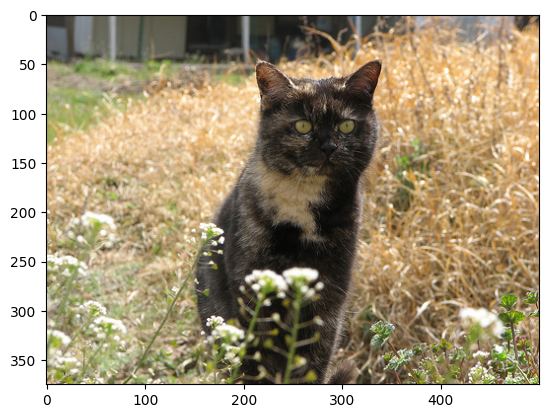

In [ ]:
import random

# grab a random query image
query_image_idx = int(len(images) * random.random())

# let's display the image
img = image.load_img(images[query_image_idx])
plt.imshow(img)

The assumption we can now make is that two images which have similar content, should produce similar feature vectors. The next two cells will randomly select one image, and then compute a measurement of the dissimilarity (or distance) of that image's PCA feature vector to every other image's feature vector. The dissimilarity metric we use is cosine distance

### Similarity Search with Cosine Distance

In [ ]:
from scipy.spatial import distance

similar_idx = [ distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features ]

The list `similar_idx` contains the image's similarity to every other one. We can sort that list and find the indexes of the most similar images. The next cell will sort them, and then find the most similar items, and return the indexes 5 most similar images. We take from indexes 1:6 rather than 0:5 because the most similar image to the query image, will trivially be the query image itself, since it is included in the distance calculation. So we just skip it.

In [ ]:
idx_closest = sorted(range(len(similar_idx)), key=lambda k: similar_idx[k])[1:6]

The next cell opens the images specified by `idx_closest` and concatenates them into a single image , resizing each so it has a height of 100 pixels.

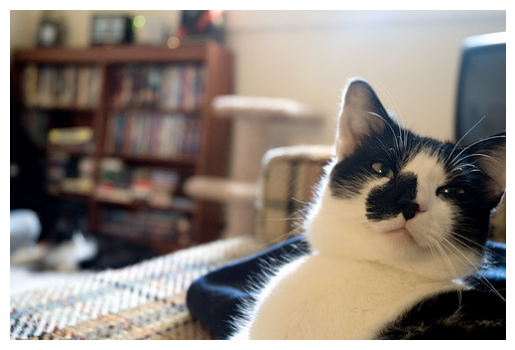

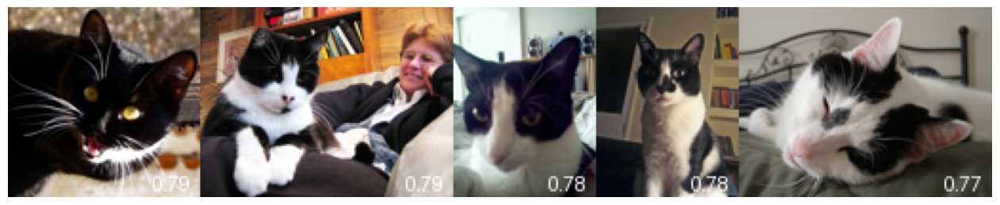

Image Index: 634, Similarity Score: 0.79
Image Index: 353, Similarity Score: 0.79
Image Index: 4501, Similarity Score: 0.78
Image Index: 7897, Similarity Score: 0.78
Image Index: 5315, Similarity Score: 0.77


In [ ]:
from scipy.spatial import distance
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from scipy.spatial.distance import cosine

# Grab a random query image
query_image_idx = int(len(images) * random.random())

# Display the query image
img = Image.open(images[query_image_idx])
plt.imshow(img)
plt.axis('off')
plt.show()

# Compute dissimilarity (cosine distance) of the query image to every other image
similar_idx = [distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]

# Convert dissimilarity to similarity (smaller distance means more similarity)
similarities = [1 - cosine(pca_features[query_image_idx], feat) for feat in pca_features]
similarity_scores = [(sim + 1) / 2 for sim in similarities]

# Sort to find the most similar images, skip the first index (the image itself)
idx_closest = sorted(range(len(similarity_scores)), key=lambda k: similarity_scores[k], reverse=True)[1:6]

# Load and annotate images
thumbs = []
font = ImageFont.load_default()

for idx in idx_closest:
    img = Image.open(images[idx])
    img = img.resize((int(img.width * 100 / img.height), 100))

    # Annotate image with similarity score
    draw = ImageDraw.Draw(img)
    text = f"{similarity_scores[idx]:.2f}"
    # Use textbbox to get the bounding box of the text
    text_bbox = draw.textbbox((0, 0), text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]
    draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))

    thumbs.append(img)

# Concatenate images
concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)

# Show concatenated image
plt.figure(figsize=(16, 12))
plt.imshow(concat_image)
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")

For convenience, we automate this process by defining the function `get_closest_images`, which computes the cosine distance between the PCA features of `query_image_idx`-th image in our dataset, and the PCA features of every image in the dataset (including itself, trivially 0). It then returns an array of indices to the `num_results` (default is 5) most similar images to it (not including itself).

We also define a helper function `get_concatenated_images` which simply takes those resulting images and concatenates them into a single image for easy display.

In [ ]:
import random
from scipy.spatial import distance
from PIL import ImageDraw, ImageFont

def get_closest_images(query_image_idx, num_results=5):
    distances = [distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results + 1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    font = ImageFont.load_default()
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        if idx != query_image_idx:
            draw = ImageDraw.Draw(img)
            text = f"{similarity_scores[idx]:.2f}"
             # Use textbbox to get the bounding box of the text
            text_bbox = draw.textbbox((0, 0), text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]
            draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

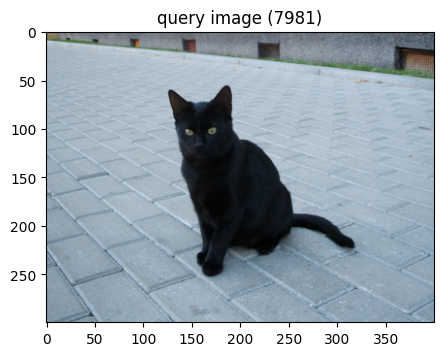

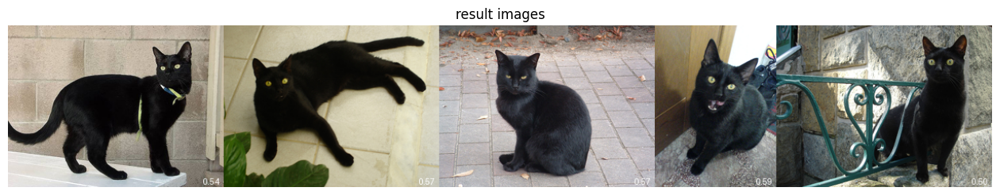

Image Index: 7601, Similarity Score: 0.54
Image Index: 284, Similarity Score: 0.57
Image Index: 7882, Similarity Score: 0.57
Image Index: 1363, Similarity Score: 0.59
Image Index: 9964, Similarity Score: 0.50


In [ ]:
# do a query on a random image
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")

## Other distance metrics

In [ ]:
import random
from scipy.spatial import distance
from PIL import ImageDraw, ImageFont

# Euclidean Similarity (using the inverse of distance for similarity)
def euclidean_similarity(vector1, vector2):
    return 1 / (1 + np.sqrt(np.sum((vector1 - vector2) ** 2)))

# Manhattan Similarity (using the inverse of distance for similarity)
def manhattan_similarity(vector1, vector2):
    return 1 / (1 + np.sum(np.abs(vector1 - vector2)))

# Minkowski Similarity (generalized similarity metric)
def minkowski_similarity(vector1, vector2, p=3):
    return 1 / (1 + np.sum(np.abs(vector1 - vector2) ** p) ** (1 / p))

# Jaccard Similarity (using binary vectors)
def jaccard_similarity(vector1, vector2):
    intersection = np.sum(np.minimum(vector1, vector2))
    union = np.sum(np.maximum(vector1, vector2))
    return intersection / union

def get_closest_images(query_image_idx, num_results=5, metric='cosine'):
    if metric == 'euclidean':
        similarities = [euclidean_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'manhattan':
        similarities = [manhattan_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'minkowski':
        similarities = [minkowski_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'jaccard':
        similarities = [jaccard_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    else:  # default is cosine similarity
        similarities = [1 - distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]

    similarity_scores = [(sim + 1) / 2 for sim in similarities]  # normalize similarity to be between 0 and 1
    idx_closest = sorted(range(len(similarity_scores)), key=lambda k: similarity_scores[k], reverse=True)[1:num_results + 1]
    return idx_closest, similarity_scores

def get_concatenated_images(indexes, thumb_height, similarity_scores):
    thumbs = []
    font = ImageFont.load_default()
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        if idx != query_image_idx:
            draw = ImageDraw.Draw(img)
            text = f"{similarity_scores[idx]:.2f}"
            text_bbox = draw.textbbox((0, 0), text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]
            draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

## Euclidean

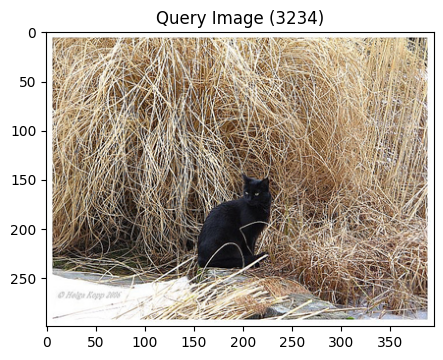

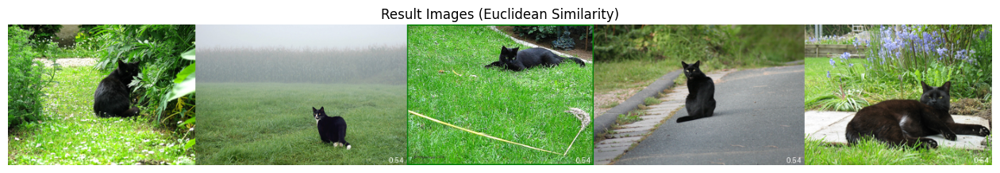

Image Index: 3791, Similarity Score: 0.55
Image Index: 5312, Similarity Score: 0.54
Image Index: 4317, Similarity Score: 0.54
Image Index: 4393, Similarity Score: 0.54
Image Index: 1651, Similarity Score: 0.54


In [ ]:
# Perform a query on a random image using a specific similarity metric
query_image_idx = int(len(images) * random.random())
metric = 'euclidean'  # Change this to 'manhattan', 'minkowski', 'jaccard', or 'cosine' to use different similarity measures
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)

# Display the query image
plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

# Display the resulting images
plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Manhattan

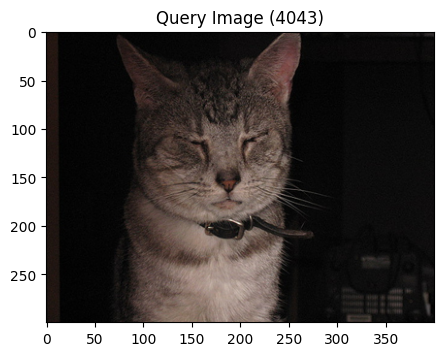

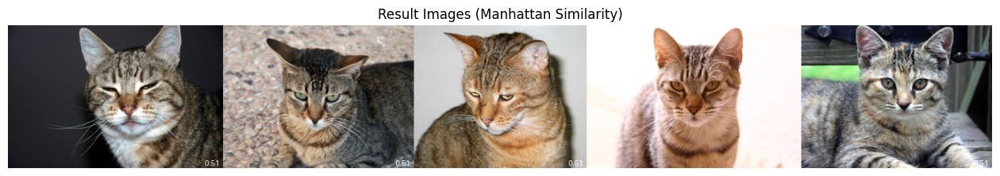

Image Index: 2572, Similarity Score: 0.51
Image Index: 4239, Similarity Score: 0.51
Image Index: 7523, Similarity Score: 0.51
Image Index: 3915, Similarity Score: 0.51
Image Index: 2538, Similarity Score: 0.51


In [ ]:
# Perform a query on a random image using a specific similarity metric
query_image_idx = int(len(images) * random.random())
metric = 'manhattan'  # Change this to 'manhattan', 'minkowski', 'jaccard', or 'cosine' to use different similarity measures
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)

# Display the query image
plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

# Display the resulting images
plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Minkowski

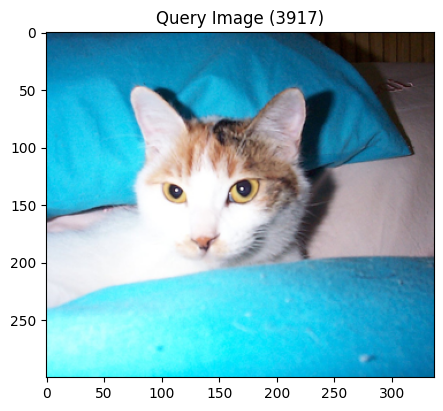

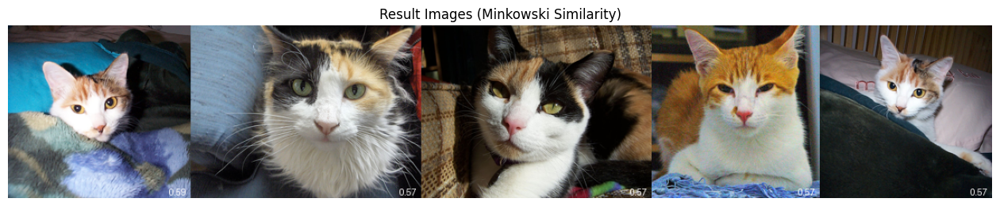

Image Index: 5372, Similarity Score: 0.59
Image Index: 8000, Similarity Score: 0.57
Image Index: 3760, Similarity Score: 0.57
Image Index: 7905, Similarity Score: 0.57
Image Index: 4078, Similarity Score: 0.57


In [ ]:
# Perform a query on a random image using a specific similarity metric
query_image_idx = int(len(images) * random.random())
metric = 'minkowski'  # Change this to 'manhattan', 'minkowski', 'jaccard', or 'cosine' to use different similarity measures
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)

# Display the query image
plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

# Display the resulting images
plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Jaccard

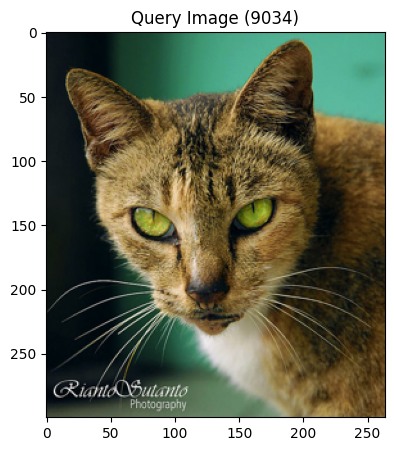

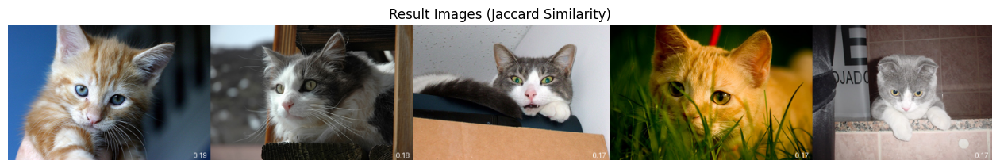

Image Index: 6909, Similarity Score: 0.19
Image Index: 3076, Similarity Score: 0.18
Image Index: 2041, Similarity Score: 0.17
Image Index: 5415, Similarity Score: 0.17
Image Index: 2604, Similarity Score: 0.17


In [ ]:
# Perform a query on a random image using a specific similarity metric
query_image_idx = int(len(images) * random.random())
metric = 'jaccard'  # Change this to 'manhattan', 'minkowski', 'jaccard', or 'cosine' to use different similarity measures
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)

# Display the query image
plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

# Display the resulting images
plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


Text(0.5, 1.0, 'result images')

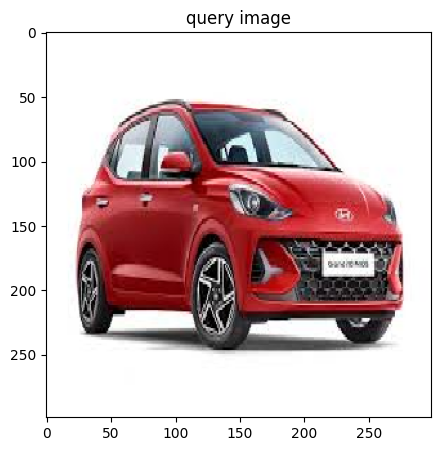

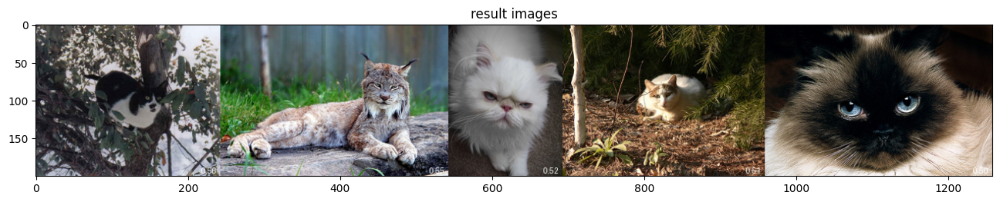

In [ ]:
# load image and extract features
new_image, x = load_image("/content/download.jpeg")
new_features = feat_extractor.predict(x)

# project it into pca space
new_pca_features = pca.transform(new_features)[0]

# calculate its distance to all the other images pca feature vectors
distances = [ distance.cosine(new_pca_features, feat) for feat in pca_features ]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:5]  # grab first 5

# Creating a dummy similarity_scores (since we don't have actual similarity scores for the new image)
similarity_scores = {idx: 1 - distances[idx] for idx in idx_closest}
# We use 1 - distance as a proxy for similarity, assuming larger distance means lower similarity

# display the results
plt.figure(figsize = (5,5))
plt.imshow(new_image)
plt.title("query image")

results_image = get_concatenated_images(idx_closest, 200, similarity_scores) #Pass similarity_scores

# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


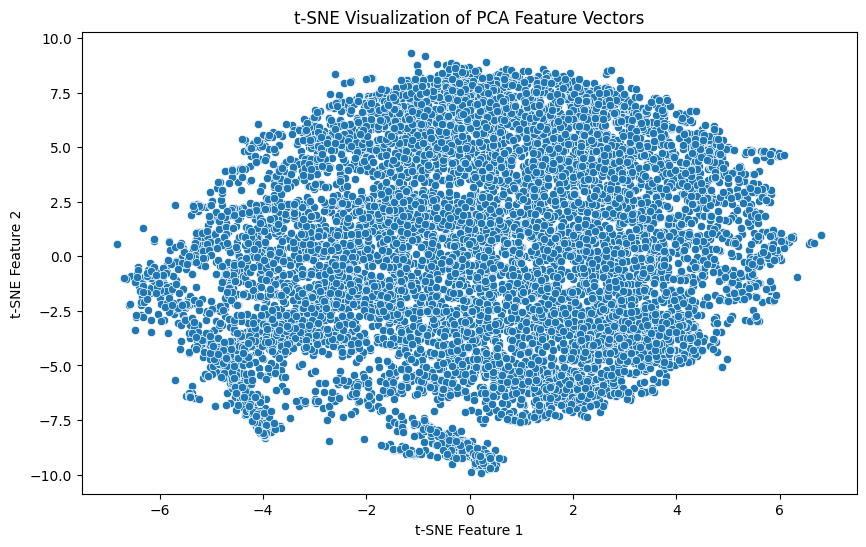

In [ ]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
tsne_features = tsne.fit_transform(pca_features)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1])
plt.title("t-SNE Visualization of PCA Feature Vectors")
plt.xlabel("t-SNE Feature 1")
plt.ylabel("t-SNE Feature 2")
plt.show()
